### Deliverable 1: Preprocessing the Data for a Neural Network

In [1]:
# Import our dependencies
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OneHotEncoder
import pandas as pd
import tensorflow as tf

#  Import and read the charity_data.csv.
import pandas as pd 
application_df = pd.read_csv("charity_data.csv")
application_df.head()

,EIN,NAME,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,10520599,BLUE KNIGHTS MOTORCYCLE CLUB,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,10531628,AMERICAN CHESAPEAKE CLUB CHARITABLE TR,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,10547893,ST CLOUD PROFESSIONAL FIREFIGHTERS,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,10553066,SOUTHSIDE ATHLETIC ASSOCIATION,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,10556103,GENETIC RESEARCH INSTITUTE OF THE DESERT,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1


In [2]:
# Drop the non-beneficial ID columns, 'EIN' and 'NAME'.

application_df = application_df.drop(columns=['EIN', 'NAME'])

In [3]:
# check to see if those columns were dropped
application_df.head()

,APPLICATION_TYPE,AFFILIATION,CLASSIFICATION,USE_CASE,ORGANIZATION,STATUS,INCOME_AMT,SPECIAL_CONSIDERATIONS,ASK_AMT,IS_SUCCESSFUL
0,T10,Independent,C1000,ProductDev,Association,1,0,N,5000,1
1,T3,Independent,C2000,Preservation,Co-operative,1,1-9999,N,108590,1
2,T5,CompanySponsored,C3000,ProductDev,Association,1,0,N,5000,0
3,T3,CompanySponsored,C2000,Preservation,Trust,1,10000-24999,N,6692,1
4,T3,Independent,C1000,Heathcare,Trust,1,100000-499999,N,142590,1


In [4]:
# Determine the number of unique values in each column.

application_df.apply(lambda x: len(x.unique()))

APPLICATION_TYPE            17
AFFILIATION                  6
CLASSIFICATION              71
USE_CASE                     5
ORGANIZATION                 4
STATUS                       2
INCOME_AMT                   9
SPECIAL_CONSIDERATIONS       2
ASK_AMT                   8747
IS_SUCCESSFUL                2
dtype: int64

In [5]:
# Look at APPLICATION_TYPE value counts for binning
application_df['APPLICATION_TYPE'].value_counts()

T3     27037
T4      1542
T6      1216
T5      1173
T19     1065
T8       737
T7       725
T10      528
T9       156
T13       66
T12       27
T2        16
T14        3
T25        3
T15        2
T29        2
T17        1
Name: APPLICATION_TYPE, dtype: int64

<AxesSubplot:ylabel='Density'>

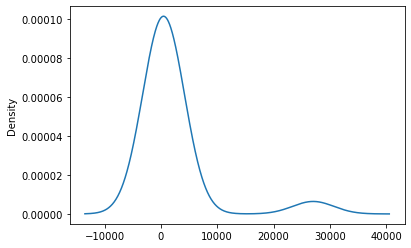

In [6]:
# Visualize the value counts of APPLICATION_TYPE
application_type_value_counts = application_df['APPLICATION_TYPE'].value_counts()

application_type_value_counts.plot.density()

In [7]:
# Determine which values to replace if counts are less than ...?
replace_application = list(application_type_value_counts[application_type_value_counts < 500].index)

# Replace in dataframe
for app in replace_application:
    application_df.APPLICATION_TYPE = application_df.APPLICATION_TYPE.replace(app,"Other")
    
# Check to make sure binning was successful
application_df.APPLICATION_TYPE.value_counts()

T3       27037
T4        1542
T6        1216
T5        1173
T19       1065
T8         737
T7         725
T10        528
Other      276
Name: APPLICATION_TYPE, dtype: int64

In [8]:
# Look at CLASSIFICATION value counts for binning
class_value_counts = application_df['CLASSIFICATION'].value_counts()

<AxesSubplot:ylabel='Density'>

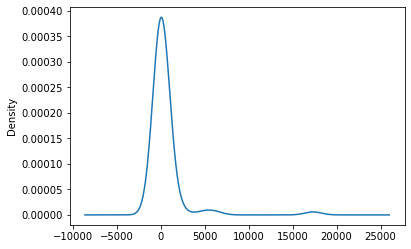

In [9]:
# Visualize the value counts of CLASSIFICATION
class_value_counts.plot.density()

In [10]:
# Determine which values to replace if counts are less than ..?
replace_class = list(class_value_counts[class_value_counts < 500].index)

# Replace in dataframe
for cls in replace_class:
    application_df.CLASSIFICATION = application_df.CLASSIFICATION.replace(cls,"Other")
    
# Check to make sure binning was successful
application_df.CLASSIFICATION.value_counts()

C1000    17326
C2000     6074
C1200     4837
C3000     1918
C2100     1883
Other     1484
C7000      777
Name: CLASSIFICATION, dtype: int64

In [11]:
# Generate our categorical variable lists
application_cat = application_df.dtypes[application_df.dtypes == 'object'].index.tolist()
application_cat

['APPLICATION_TYPE',
 'AFFILIATION',
 'CLASSIFICATION',
 'USE_CASE',
 'ORGANIZATION',
 'INCOME_AMT',
 'SPECIAL_CONSIDERATIONS']

In [12]:
# Create a OneHotEncoder instance
enc = OneHotEncoder(sparse=False)

# Fit and transform the OneHotEncoder using the categorical variable list
encode_df = pd.DataFrame(enc.fit_transform(application_df[application_cat]))

# Add the encoded variable names to the dataframe
encode_df.columns = enc.get_feature_names(application_cat)
encode_df.head()

,APPLICATION_TYPE_Other,APPLICATION_TYPE_T10,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,APPLICATION_TYPE_T7,APPLICATION_TYPE_T8,AFFILIATION_CompanySponsored,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [13]:
# Merge one-hot encoded features and drop the originals
application_df = application_df.merge(encode_df, left_index=True,right_index=True)
application_df = application_df.drop(columns = application_cat)
application_df.head()

,STATUS,ASK_AMT,IS_SUCCESSFUL,APPLICATION_TYPE_Other,APPLICATION_TYPE_T10,APPLICATION_TYPE_T19,APPLICATION_TYPE_T3,APPLICATION_TYPE_T4,APPLICATION_TYPE_T5,APPLICATION_TYPE_T6,...,INCOME_AMT_1-9999,INCOME_AMT_10000-24999,INCOME_AMT_100000-499999,INCOME_AMT_10M-50M,INCOME_AMT_1M-5M,INCOME_AMT_25000-99999,INCOME_AMT_50M+,INCOME_AMT_5M-10M,SPECIAL_CONSIDERATIONS_N,SPECIAL_CONSIDERATIONS_Y
0,1,5000,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,108590,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,5000,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1,6692,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,142590,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [14]:
# Split our preprocessed data into our features and target arrays
y = application_df['IS_SUCCESSFUL'].values
X = application_df.drop(['IS_SUCCESSFUL'], 1).values

# Split the preprocessed data into a training and testing dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

In [15]:
# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

### Deliverable 2: Compile, Train and Evaluate the Model

In [16]:
# Define the model - deep neural net, i.e., the number of input features and hidden nodes for each layer.
number_input_features = len(X_train[0])
hidden_nodes_layer1 = 80
hidden_nodes_layer2 = 30


# Insantiate our neural net model object 'nn'
nn = tf.keras.models.Sequential()

# First hidden layer
nn.add(tf.keras.layers.Dense(units = hidden_nodes_layer1,
                             input_dim = number_input_features,
                             activation = 'relu'))

# Second hidden layer
nn.add(tf.keras.layers.Dense(units = hidden_nodes_layer2,
                             activation = 'relu'))

# Output layer
nn.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))

# Check the structure of the model
nn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 80)                3600      
_________________________________________________________________
dense_1 (Dense)              (None, 30)                2430      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 31        
Total params: 6,061
Trainable params: 6,061
Non-trainable params: 0
_________________________________________________________________


In [17]:
# Compile the model
import os
from tensorflow.keras.callbacks import ModelCheckpoint

# Create path and filenames
os.makedirs('checkpoints/', exist_ok = True)
checkpoint_path = 'checkpoints/weights.{epoch:02d}hdf5'

In [18]:
# Compile the model
nn.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy'])

In [19]:
# Make our callback object that saves our weights every five epochs
checkpoint_callback = ModelCheckpoint(
    filepath = checkpoint_path, 
    verbose = 1,
    save_weights_only = True,
    save_freq = 5
)

In [20]:
# Train the model
fit_model = nn.fit(
    X_train_scaled,
    y_train,
    epochs = 100,
    callbacks = [checkpoint_callback]
)

Epoch 1/100
  1/804 [..............................] - ETA: 4:27 - loss: 0.7976 - accuracy: 0.2812
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.7172 - accuracy: 0.5234  
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.6906 - accuracy: 0.5789
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.6740 - accuracy: 0.6060
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving 

481/804 [================>.............] - ETA: 1s - loss: 0.5975 - accuracy: 0.6989
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
496/804 [=================>............] - ETA: 1s - loss: 0.5968 - accuracy: 0.6996
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.5961 - accuracy: 0.7002
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
526/804 [==================>...........] - ETA: 0s - loss: 0.5954 - accuracy: 0.7009
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpo


Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
162/804 [=====>........................] - ETA: 2s - loss: 0.5655 - accuracy: 0.7212
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
177/804 [=====>........................] - ETA: 2s - loss: 0.5652 - accuracy: 0.7216
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
192/804 [======>.......................] - ETA: 2s - loss: 0.5648 - accuracy: 0.7220
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
207/804 [======>.......................] - ETA: 2s - loss: 0.5644 - accuracy: 0.7224
Epoch 00002: saving model to checkpo

637/804 [======================>.......] - ETA: 0s - loss: 0.5584 - accuracy: 0.7257
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.5583 - accuracy: 0.7258
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.5582 - accuracy: 0.7259
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.5581 - accuracy: 0.7260
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpo


Epoch 00003: saving model to checkpoints/weights.03hdf5
313/804 [==========>...................] - ETA: 1s - loss: 0.5611 - accuracy: 0.7213
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.5608 - accuracy: 0.7215
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
343/804 [===========>..................] - ETA: 1s - loss: 0.5606 - accuracy: 0.7218
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.5604 - accuracy: 0.7220
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpo

793/804 [============================>.] - ETA: 0s - loss: 0.5562 - accuracy: 0.7261
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5561 - accuracy: 0.7262
Epoch 4/100
  1/804 [..............................] - ETA: 0s - loss: 0.5467 - accuracy: 0.7188
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.5442 - accuracy: 0.7345
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
 29/804 [>.............................] - ETA: 3s - loss: 0.5467 - accuracy: 0.7286
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.

459/804 [================>.............] - ETA: 1s - loss: 0.5464 - accuracy: 0.7334
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
474/804 [================>.............] - ETA: 1s - loss: 0.5466 - accuracy: 0.7335
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
489/804 [=================>............] - ETA: 1s - loss: 0.5467 - accuracy: 0.7335
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
504/804 [=================>............] - ETA: 1s - loss: 0.5468 - accuracy: 0.7335
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpo


Epoch 00005: saving model to checkpoints/weights.05hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.5653 - accuracy: 0.7257
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
150/804 [====>.........................] - ETA: 2s - loss: 0.5653 - accuracy: 0.7255
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.5649 - accuracy: 0.7255
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.5644 - accuracy: 0.7258
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpo

615/804 [=====================>........] - ETA: 0s - loss: 0.5537 - accuracy: 0.7315
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
630/804 [======================>.......] - ETA: 0s - loss: 0.5536 - accuracy: 0.7315
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.5535 - accuracy: 0.7315
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.5534 - accuracy: 0.7314
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpo

284/804 [=========>....................] - ETA: 2s - loss: 0.5485 - accuracy: 0.7324
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
296/804 [==========>...................] - ETA: 2s - loss: 0.5485 - accuracy: 0.7323
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
311/804 [==========>...................] - ETA: 1s - loss: 0.5485 - accuracy: 0.7323
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
326/804 [===========>..................] - ETA: 1s - loss: 0.5485 - accuracy: 0.7323
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpo

761/804 [===========================>..] - ETA: 0s - loss: 0.5483 - accuracy: 0.7319
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.5484 - accuracy: 0.7319
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.5483 - accuracy: 0.7319
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5483 - accuracy: 0.7319
Epoch 7/100
  1/804 [..............................] - ETA: 1s - loss: 0.5455 - accuracy: 0.7500
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.

422/804 [==============>...............] - ETA: 1s - loss: 0.5301 - accuracy: 0.7469
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
437/804 [===============>..............] - ETA: 1s - loss: 0.5305 - accuracy: 0.7467
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
452/804 [===============>..............] - ETA: 1s - loss: 0.5310 - accuracy: 0.7464
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
467/804 [================>.............] - ETA: 1s - loss: 0.5314 - accuracy: 0.7460
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpo

 88/804 [==>...........................] - ETA: 2s - loss: 0.5620 - accuracy: 0.7197
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
103/804 [==>...........................] - ETA: 2s - loss: 0.5619 - accuracy: 0.7196
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
118/804 [===>..........................] - ETA: 2s - loss: 0.5617 - accuracy: 0.7200
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
128/804 [===>..........................] - ETA: 2s - loss: 0.5612 - accuracy: 0.7204
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
138/804 [====>.........................] - ETA: 2s - loss: 0.5607 - accuracy: 0.7208
Epoch 000

563/804 [====================>.........] - ETA: 0s - loss: 0.5511 - accuracy: 0.7289
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
578/804 [====================>.........] - ETA: 0s - loss: 0.5510 - accuracy: 0.7291
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
593/804 [=====================>........] - ETA: 0s - loss: 0.5508 - accuracy: 0.7293
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
608/804 [=====================>........] - ETA: 0s - loss: 0.5507 - accuracy: 0.7294
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpo


Epoch 00009: saving model to checkpoints/weights.09hdf5
219/804 [=======>......................] - ETA: 2s - loss: 0.5300 - accuracy: 0.7538
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
234/804 [=======>......................] - ETA: 2s - loss: 0.5302 - accuracy: 0.7534
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
248/804 [========>.....................] - ETA: 2s - loss: 0.5304 - accuracy: 0.7530
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
257/804 [========>.....................] - ETA: 2s - loss: 0.5306 - accuracy: 0.7527
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
264/804 [========>.....................] - ETA: 2s - loss: 0.5307 - accuracy: 0.7526
Epoch 000

669/804 [=======================>......] - ETA: 0s - loss: 0.5365 - accuracy: 0.7442
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.5366 - accuracy: 0.7441
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.5368 - accuracy: 0.7439
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.5370 - accuracy: 0.7437
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
724/804 [==========================>.


Epoch 00010: saving model to checkpoints/weights.10hdf5
315/804 [==========>...................] - ETA: 2s - loss: 0.5394 - accuracy: 0.7418
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
325/804 [===========>..................] - ETA: 2s - loss: 0.5396 - accuracy: 0.7416
Epoch 00010: saving model to checkpoints/weights.10hdf5
330/804 [===========>..................] - ETA: 2s - loss: 0.5398 - accuracy: 0.7414
Epoch 00010: saving model to checkpoints/weights.10hdf5
335/804 [===========>..................] - ETA: 2s - loss: 0.5399 - accuracy: 0.7413
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
345/804 [===========>..................] - ETA: 2s - loss: 0.5401 - accuracy: 0.7411
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
355/804 [============>.................] - ETA: 2s - loss: 0.5403 -


Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.5436 - accuracy: 0.7370
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.5436 - accuracy: 0.7369
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.5436 - accuracy: 0.7369
Epoch 00010: saving model to checkpoints/weights.10hdf5
803/804 [============================>.] - ETA: 0s - loss: 0.5436 - accuracy: 0.7369
Epoch 00010: saving model to checkpoints/weights.10hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.5436 - accuracy: 0.7369
Epoch 11/100
  1/804 [..............................] - ETA: 1


Epoch 00011: saving model to checkpoints/weights.11hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.5413 - accuracy: 0.7378
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
431/804 [===============>..............] - ETA: 1s - loss: 0.5414 - accuracy: 0.7377
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
446/804 [===============>..............] - ETA: 1s - loss: 0.5415 - accuracy: 0.7376
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.5416 - accuracy: 0.7376
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpo

 67/804 [=>............................] - ETA: 3s - loss: 0.5295 - accuracy: 0.7470
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
 82/804 [==>...........................] - ETA: 3s - loss: 0.5301 - accuracy: 0.7473
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
 97/804 [==>...........................] - ETA: 2s - loss: 0.5313 - accuracy: 0.7464
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
112/804 [===>..........................] - ETA: 2s - loss: 0.5325 - accuracy: 0.7457
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpo


Epoch 00012: saving model to checkpoints/weights.12hdf5
542/804 [===================>..........] - ETA: 1s - loss: 0.5418 - accuracy: 0.7378
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
557/804 [===================>..........] - ETA: 1s - loss: 0.5420 - accuracy: 0.7377
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
572/804 [====================>.........] - ETA: 0s - loss: 0.5421 - accuracy: 0.7375
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
587/804 [====================>.........] - ETA: 0s - loss: 0.5422 - accuracy: 0.7374
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpo


Epoch 00013: saving model to checkpoints/weights.13hdf5
208/804 [======>.......................] - ETA: 2s - loss: 0.5472 - accuracy: 0.7324
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
223/804 [=======>......................] - ETA: 2s - loss: 0.5466 - accuracy: 0.7329
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
238/804 [=======>......................] - ETA: 2s - loss: 0.5461 - accuracy: 0.7334
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
253/804 [========>.....................] - ETA: 2s - loss: 0.5456 - accuracy: 0.7338
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpo

688/804 [========================>.....] - ETA: 0s - loss: 0.5421 - accuracy: 0.7373
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.5422 - accuracy: 0.7373
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.5422 - accuracy: 0.7373
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.5422 - accuracy: 0.7372
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpo

354/804 [============>.................] - ETA: 1s - loss: 0.5342 - accuracy: 0.7490
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
369/804 [============>.................] - ETA: 1s - loss: 0.5344 - accuracy: 0.7488
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
384/804 [=============>................] - ETA: 1s - loss: 0.5346 - accuracy: 0.7486
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
399/804 [=============>................] - ETA: 1s - loss: 0.5348 - accuracy: 0.7484
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpo

 21/804 [..............................] - ETA: 3s - loss: 0.5356 - accuracy: 0.7500
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
 30/804 [>.............................] - ETA: 4s - loss: 0.5354 - accuracy: 0.7477
Epoch 00015: saving model to checkpoints/weights.15hdf5
 37/804 [>.............................] - ETA: 4s - loss: 0.5351 - accuracy: 0.7460
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
 49/804 [>.............................] - ETA: 4s - loss: 0.5340 - accuracy: 0.7456
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
 60/804 [=>............................] - ETA: 4s - loss: 0.5333 - accuracy: 0.7455
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 000

460/804 [================>.............] - ETA: 1s - loss: 0.5369 - accuracy: 0.7391
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
470/804 [================>.............] - ETA: 1s - loss: 0.5370 - accuracy: 0.7391
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
480/804 [================>.............] - ETA: 1s - loss: 0.5370 - accuracy: 0.7390
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
490/804 [=================>............] - ETA: 1s - loss: 0.5371 - accuracy: 0.7390
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.5372 - accuracy: 0.7389
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 000

111/804 [===>..........................] - ETA: 3s - loss: 0.5342 - accuracy: 0.7478
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
126/804 [===>..........................] - ETA: 2s - loss: 0.5346 - accuracy: 0.7471
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
141/804 [====>.........................] - ETA: 2s - loss: 0.5345 - accuracy: 0.7466
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
156/804 [====>.........................] - ETA: 2s - loss: 0.5344 - accuracy: 0.7464
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
166/804 [=====>......................

581/804 [====================>.........] - ETA: 0s - loss: 0.5415 - accuracy: 0.7385
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
596/804 [=====================>........] - ETA: 0s - loss: 0.5415 - accuracy: 0.7384
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
611/804 [=====================>........] - ETA: 0s - loss: 0.5416 - accuracy: 0.7383
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
626/804 [======================>.......] - ETA: 0s - loss: 0.5416 - accuracy: 0.7383
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpo


Epoch 00017: saving model to checkpoints/weights.17hdf5
245/804 [========>.....................] - ETA: 2s - loss: 0.5408 - accuracy: 0.7375
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
253/804 [========>.....................] - ETA: 2s - loss: 0.5407 - accuracy: 0.7375
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
267/804 [========>.....................] - ETA: 2s - loss: 0.5406 - accuracy: 0.7375
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
282/804 [=========>....................] - ETA: 2s - loss: 0.5405 - accuracy: 0.7376
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpo


Epoch 00017: saving model to checkpoints/weights.17hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.5404 - accuracy: 0.7375
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.5404 - accuracy: 0.7375
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.5404 - accuracy: 0.7374
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.5405 - accuracy: 0.7374
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpo

388/804 [=============>................] - ETA: 1s - loss: 0.5422 - accuracy: 0.7391
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5423 - accuracy: 0.7390
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.5424 - accuracy: 0.7388
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.5424 - accuracy: 0.7387
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpo

 59/804 [=>............................] - ETA: 3s - loss: 0.5817 - accuracy: 0.7213
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.5767 - accuracy: 0.7234
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.5732 - accuracy: 0.7247
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.5707 - accuracy: 0.7253
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
114/804 [===>........................


Epoch 00019: saving model to checkpoints/weights.19hdf5
534/804 [==================>...........] - ETA: 1s - loss: 0.5501 - accuracy: 0.7329
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
549/804 [===================>..........] - ETA: 1s - loss: 0.5499 - accuracy: 0.7330
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
564/804 [====================>.........] - ETA: 0s - loss: 0.5496 - accuracy: 0.7332
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
579/804 [====================>.........] - ETA: 0s - loss: 0.5494 - accuracy: 0.7333
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpo

195/804 [======>.......................] - ETA: 2s - loss: 0.5419 - accuracy: 0.7342
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
210/804 [======>.......................] - ETA: 2s - loss: 0.5419 - accuracy: 0.7345
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
225/804 [=======>......................] - ETA: 2s - loss: 0.5419 - accuracy: 0.7348
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
240/804 [=======>......................] - ETA: 2s - loss: 0.5419 - accuracy: 0.7350
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpo


Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.5435 - accuracy: 0.7351
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.5434 - accuracy: 0.7351
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.5434 - accuracy: 0.7352
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.5433 - accuracy: 0.7352
Epoch 00020: saving model to checkpo


Epoch 00021: saving model to checkpoints/weights.21hdf5
341/804 [===========>..................] - ETA: 1s - loss: 0.5457 - accuracy: 0.7364
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
356/804 [============>.................] - ETA: 1s - loss: 0.5455 - accuracy: 0.7365
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
371/804 [============>.................] - ETA: 1s - loss: 0.5454 - accuracy: 0.7366
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
386/804 [=============>................] - ETA: 1s - loss: 0.5453 - accuracy: 0.7367
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpo


Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
 12/804 [..............................] - ETA: 3s - loss: 0.5308 - accuracy: 0.7374
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
 27/804 [>.............................] - ETA: 3s - loss: 0.5421 - accuracy: 0.7278
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
 42/804 [>.............................] - ETA: 2s - loss: 0.5458 - accuracy: 0.7260
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
 57/804 [=>............................] - ETA: 2s - loss: 0.5470 - accuracy: 0.7262
Epoch 00022: saving model to checkpo


Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.5478 - accuracy: 0.7293
Epoch 00022: saving model to checkpoints/weights.22hdf5
490/804 [=================>............] - ETA: 1s - loss: 0.5477 - accuracy: 0.7294
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
497/804 [=================>............] - ETA: 1s - loss: 0.5477 - accuracy: 0.7295
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
512/804 [==================>...........] - ETA: 1s - loss: 0.5476 - accuracy: 0.7296
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
527/804 [==================>.........


Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
148/804 [====>.........................] - ETA: 2s - loss: 0.5318 - accuracy: 0.7479
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
162/804 [=====>........................] - ETA: 2s - loss: 0.5323 - accuracy: 0.7471
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
173/804 [=====>........................] - ETA: 2s - loss: 0.5330 - accuracy: 0.7464
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
188/804 [======>.......................] - ETA: 2s - loss: 0.5336 - accuracy: 0.7457
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpo

623/804 [======================>.......] - ETA: 0s - loss: 0.5401 - accuracy: 0.7396
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.5402 - accuracy: 0.7395
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.5403 - accuracy: 0.7395
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.5403 - accuracy: 0.7394
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpo


Epoch 00024: saving model to checkpoints/weights.24hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.5269 - accuracy: 0.7447
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
314/804 [==========>...................] - ETA: 1s - loss: 0.5274 - accuracy: 0.7444
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
329/804 [===========>..................] - ETA: 1s - loss: 0.5279 - accuracy: 0.7442
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.5284 - accuracy: 0.7439
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpo

779/804 [============================>.] - ETA: 0s - loss: 0.5351 - accuracy: 0.7409
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.5352 - accuracy: 0.7408
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5353 - accuracy: 0.7408
Epoch 25/100
  1/804 [..............................] - ETA: 1s - loss: 0.4026 - accuracy: 0.8438
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
 15/804 [..............................] - ETA: 3s - loss: 0.5215 - accuracy: 0.7485
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights

445/804 [===============>..............] - ETA: 1s - loss: 0.5400 - accuracy: 0.7349
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
460/804 [================>.............] - ETA: 1s - loss: 0.5399 - accuracy: 0.7349
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
475/804 [================>.............] - ETA: 1s - loss: 0.5399 - accuracy: 0.7349
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
490/804 [=================>............] - ETA: 1s - loss: 0.5399 - accuracy: 0.7350
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpo


Epoch 00026: saving model to checkpoints/weights.26hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.5501 - accuracy: 0.7389
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
136/804 [====>.........................] - ETA: 2s - loss: 0.5487 - accuracy: 0.7397
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
151/804 [====>.........................] - ETA: 2s - loss: 0.5475 - accuracy: 0.7405
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
166/804 [=====>........................] - ETA: 2s - loss: 0.5468 - accuracy: 0.7408
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpo


Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
606/804 [=====================>........] - ETA: 0s - loss: 0.5407 - accuracy: 0.7397
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
621/804 [======================>.......] - ETA: 0s - loss: 0.5407 - accuracy: 0.7397
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
636/804 [======================>.......] - ETA: 0s - loss: 0.5406 - accuracy: 0.7396
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
651/804 [=======================>......] - ETA: 0s - loss: 0.5406 - accuracy: 0.7395
Epoch 00026: saving model to checkpo

267/804 [========>.....................] - ETA: 1s - loss: 0.5333 - accuracy: 0.7375
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.5333 - accuracy: 0.7378
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.5333 - accuracy: 0.7380
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5333 - accuracy: 0.7381
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpo

747/804 [==========================>...] - ETA: 0s - loss: 0.5355 - accuracy: 0.7390
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.5356 - accuracy: 0.7390
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.5357 - accuracy: 0.7390
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.5358 - accuracy: 0.7390
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
804/804 [============================

418/804 [==============>...............] - ETA: 1s - loss: 0.5412 - accuracy: 0.7356
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.5411 - accuracy: 0.7357
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.5411 - accuracy: 0.7358
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.5410 - accuracy: 0.7359
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpo

 90/804 [==>...........................] - ETA: 2s - loss: 0.5269 - accuracy: 0.7505
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.5287 - accuracy: 0.7495
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
119/804 [===>..........................] - ETA: 2s - loss: 0.5305 - accuracy: 0.7486
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.5320 - accuracy: 0.7476
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpo


Epoch 00029: saving model to checkpoints/weights.29hdf5
574/804 [====================>.........] - ETA: 0s - loss: 0.5408 - accuracy: 0.7380
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
589/804 [====================>.........] - ETA: 0s - loss: 0.5407 - accuracy: 0.7379
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
604/804 [=====================>........] - ETA: 0s - loss: 0.5407 - accuracy: 0.7379
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.5408 - accuracy: 0.7378
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpo

240/804 [=======>......................] - ETA: 2s - loss: 0.5457 - accuracy: 0.7370
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.5453 - accuracy: 0.7372
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
270/804 [=========>....................] - ETA: 1s - loss: 0.5449 - accuracy: 0.7375
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
285/804 [=========>....................] - ETA: 1s - loss: 0.5445 - accuracy: 0.7378
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpo

720/804 [=========================>....] - ETA: 0s - loss: 0.5411 - accuracy: 0.7396
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.5410 - accuracy: 0.7397
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.5410 - accuracy: 0.7397
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.5409 - accuracy: 0.7397
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpo

391/804 [=============>................] - ETA: 1s - loss: 0.5455 - accuracy: 0.7304
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
406/804 [==============>...............] - ETA: 1s - loss: 0.5453 - accuracy: 0.7306
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
421/804 [==============>...............] - ETA: 1s - loss: 0.5451 - accuracy: 0.7309
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5449 - accuracy: 0.7311
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpo

 57/804 [=>............................] - ETA: 2s - loss: 0.5610 - accuracy: 0.7272
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
 72/804 [=>............................] - ETA: 2s - loss: 0.5582 - accuracy: 0.7281
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
 87/804 [==>...........................] - ETA: 2s - loss: 0.5564 - accuracy: 0.7288
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
102/804 [==>...........................] - ETA: 2s - loss: 0.5550 - accuracy: 0.7292
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpo


Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
547/804 [===================>..........] - ETA: 0s - loss: 0.5429 - accuracy: 0.7365
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
562/804 [===================>..........] - ETA: 0s - loss: 0.5428 - accuracy: 0.7366
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.5427 - accuracy: 0.7367
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
592/804 [=====================>........] - ETA: 0s - loss: 0.5426 - accuracy: 0.7368
Epoch 00032: saving model to checkpo

208/804 [======>.......................] - ETA: 2s - loss: 0.5262 - accuracy: 0.7531
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
223/804 [=======>......................] - ETA: 2s - loss: 0.5266 - accuracy: 0.7525
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
238/804 [=======>......................] - ETA: 2s - loss: 0.5272 - accuracy: 0.7520
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
253/804 [========>.....................] - ETA: 2s - loss: 0.5276 - accuracy: 0.7514
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpo


Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5336 - accuracy: 0.7447
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.5337 - accuracy: 0.7446
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.5338 - accuracy: 0.7445
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.5340 - accuracy: 0.7443
Epoch 00033: saving model to checkpo

359/804 [============>.................] - ETA: 1s - loss: 0.5345 - accuracy: 0.7402
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
374/804 [============>.................] - ETA: 1s - loss: 0.5346 - accuracy: 0.7402
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
389/804 [=============>................] - ETA: 1s - loss: 0.5347 - accuracy: 0.7402
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
404/804 [==============>...............] - ETA: 1s - loss: 0.5348 - accuracy: 0.7401
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpo


Epoch 00035: saving model to checkpoints/weights.35hdf5
 30/804 [>.............................] - ETA: 3s - loss: 0.5642 - accuracy: 0.7166
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
 45/804 [>.............................] - ETA: 3s - loss: 0.5579 - accuracy: 0.7204
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
 58/804 [=>............................] - ETA: 2s - loss: 0.5541 - accuracy: 0.7237
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
 70/804 [=>............................] - ETA: 2s - loss: 0.5513 - accuracy: 0.7261
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpo

500/804 [=================>............] - ETA: 1s - loss: 0.5362 - accuracy: 0.7415
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
515/804 [==================>...........] - ETA: 1s - loss: 0.5363 - accuracy: 0.7414
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
530/804 [==================>...........] - ETA: 1s - loss: 0.5363 - accuracy: 0.7414
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
545/804 [===================>..........] - ETA: 1s - loss: 0.5364 - accuracy: 0.7413
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpo

161/804 [=====>........................] - ETA: 2s - loss: 0.5403 - accuracy: 0.7412
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
176/804 [=====>........................] - ETA: 2s - loss: 0.5407 - accuracy: 0.7408
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
191/804 [======>.......................] - ETA: 2s - loss: 0.5408 - accuracy: 0.7406
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
206/804 [======>.......................] - ETA: 2s - loss: 0.5410 - accuracy: 0.7404
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpo


Epoch 00036: saving model to checkpoints/weights.36hdf5
646/804 [=======================>......] - ETA: 0s - loss: 0.5408 - accuracy: 0.7376
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
661/804 [=======================>......] - ETA: 0s - loss: 0.5408 - accuracy: 0.7375
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
676/804 [========================>.....] - ETA: 0s - loss: 0.5408 - accuracy: 0.7375
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.5408 - accuracy: 0.7375
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpo

312/804 [==========>...................] - ETA: 1s - loss: 0.5322 - accuracy: 0.7433
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
327/804 [===========>..................] - ETA: 1s - loss: 0.5325 - accuracy: 0.7431
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.5327 - accuracy: 0.7430
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
357/804 [============>.................] - ETA: 1s - loss: 0.5328 - accuracy: 0.7428
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpo

787/804 [============================>.] - ETA: 0s - loss: 0.5355 - accuracy: 0.7414
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5355 - accuracy: 0.7413
Epoch 38/100
  1/804 [..............................] - ETA: 1s - loss: 0.5708 - accuracy: 0.6562
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
 13/804 [..............................] - ETA: 3s - loss: 0.5575 - accuracy: 0.7274
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
 28/804 [>.............................] - ETA: 3s - loss: 0.5445 - accuracy: 0.7358
Epoch 00038: saving model to checkpoints/weights


Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
453/804 [===============>..............] - ETA: 1s - loss: 0.5366 - accuracy: 0.7403
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.5366 - accuracy: 0.7403
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.5366 - accuracy: 0.7403
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
498/804 [=================>............] - ETA: 1s - loss: 0.5367 - accuracy: 0.7403
Epoch 00038: saving model to checkpo


Epoch 00039: saving model to checkpoints/weights.39hdf5
119/804 [===>..........................] - ETA: 2s - loss: 0.5277 - accuracy: 0.7509
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.5278 - accuracy: 0.7508
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
149/804 [====>.........................] - ETA: 2s - loss: 0.5277 - accuracy: 0.7509
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
164/804 [=====>........................] - ETA: 2s - loss: 0.5276 - accuracy: 0.7508
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpo

599/804 [=====================>........] - ETA: 0s - loss: 0.5344 - accuracy: 0.7443
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
614/804 [=====================>........] - ETA: 0s - loss: 0.5345 - accuracy: 0.7442
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.5346 - accuracy: 0.7441
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
644/804 [=======================>......] - ETA: 0s - loss: 0.5347 - accuracy: 0.7439
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpo


Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
275/804 [=========>....................] - ETA: 2s - loss: 0.5319 - accuracy: 0.7510
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
290/804 [=========>....................] - ETA: 2s - loss: 0.5318 - accuracy: 0.7509
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
305/804 [==========>...................] - ETA: 1s - loss: 0.5317 - accuracy: 0.7508
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
320/804 [==========>...................] - ETA: 1s - loss: 0.5316 - accuracy: 0.7507
Epoch 00040: saving model to checkpo


Epoch 00040: saving model to checkpoints/weights.40hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.5342 - accuracy: 0.7458
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.5343 - accuracy: 0.7457
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.5344 - accuracy: 0.7455
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.5345 - accuracy: 0.7454
Epoch 00040: saving model to checkpoints/weights.40hdf5
804/804 [============================

421/804 [==============>...............] - ETA: 1s - loss: 0.5398 - accuracy: 0.7382
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5397 - accuracy: 0.7383
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.5395 - accuracy: 0.7384
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
466/804 [================>.............] - ETA: 1s - loss: 0.5394 - accuracy: 0.7385
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpo


Epoch 00042: saving model to checkpoints/weights.42hdf5
 92/804 [==>...........................] - ETA: 3s - loss: 0.5435 - accuracy: 0.7449
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
107/804 [==>...........................] - ETA: 3s - loss: 0.5421 - accuracy: 0.7449
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
122/804 [===>..........................] - ETA: 2s - loss: 0.5408 - accuracy: 0.7451
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
137/804 [====>.........................] - ETA: 2s - loss: 0.5394 - accuracy: 0.7454
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpo


Epoch 00042: saving model to checkpoints/weights.42hdf5
572/804 [====================>.........] - ETA: 0s - loss: 0.5360 - accuracy: 0.7437
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
587/804 [====================>.........] - ETA: 0s - loss: 0.5361 - accuracy: 0.7435
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
602/804 [=====================>........] - ETA: 0s - loss: 0.5362 - accuracy: 0.7434
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
617/804 [======================>.......] - ETA: 0s - loss: 0.5363 - accuracy: 0.7433
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpo

238/804 [=======>......................] - ETA: 1s - loss: 0.5399 - accuracy: 0.7332
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
253/804 [========>.....................] - ETA: 1s - loss: 0.5398 - accuracy: 0.7336
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
268/804 [=========>....................] - ETA: 1s - loss: 0.5397 - accuracy: 0.7339
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
283/804 [=========>....................] - ETA: 1s - loss: 0.5395 - accuracy: 0.7343
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpo

718/804 [=========================>....] - ETA: 0s - loss: 0.5390 - accuracy: 0.7374
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.5389 - accuracy: 0.7375
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.5389 - accuracy: 0.7375
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.5389 - accuracy: 0.7376
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpo

389/804 [=============>................] - ETA: 1s - loss: 0.5316 - accuracy: 0.7417
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
404/804 [==============>...............] - ETA: 1s - loss: 0.5318 - accuracy: 0.7416
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.5320 - accuracy: 0.7414
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
434/804 [===============>..............] - ETA: 1s - loss: 0.5322 - accuracy: 0.7413
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpo

 60/804 [=>............................] - ETA: 2s - loss: 0.5193 - accuracy: 0.7382
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
 75/804 [=>............................] - ETA: 2s - loss: 0.5192 - accuracy: 0.7395
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
 90/804 [==>...........................] - ETA: 2s - loss: 0.5195 - accuracy: 0.7405
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
105/804 [==>...........................] - ETA: 2s - loss: 0.5205 - accuracy: 0.7409
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpo

540/804 [===================>..........] - ETA: 0s - loss: 0.5349 - accuracy: 0.7381
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
555/804 [===================>..........] - ETA: 0s - loss: 0.5350 - accuracy: 0.7382
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
570/804 [====================>.........] - ETA: 0s - loss: 0.5350 - accuracy: 0.7382
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
585/804 [====================>.........] - ETA: 0s - loss: 0.5351 - accuracy: 0.7383
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpo

211/804 [======>.......................] - ETA: 2s - loss: 0.5286 - accuracy: 0.7418
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
226/804 [=======>......................] - ETA: 2s - loss: 0.5288 - accuracy: 0.7418
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
241/804 [=======>......................] - ETA: 2s - loss: 0.5290 - accuracy: 0.7418
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
256/804 [========>.....................] - ETA: 2s - loss: 0.5293 - accuracy: 0.7417
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpo

691/804 [========================>.....] - ETA: 0s - loss: 0.5331 - accuracy: 0.7414
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.5332 - accuracy: 0.7414
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.5332 - accuracy: 0.7414
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.5333 - accuracy: 0.7414
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpo

357/804 [============>.................] - ETA: 1s - loss: 0.5300 - accuracy: 0.7521
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
372/804 [============>.................] - ETA: 1s - loss: 0.5302 - accuracy: 0.7518
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
387/804 [=============>................] - ETA: 1s - loss: 0.5304 - accuracy: 0.7515
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5306 - accuracy: 0.7511
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpo

 28/804 [>.............................] - ETA: 3s - loss: 0.5484 - accuracy: 0.7303
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
 43/804 [>.............................] - ETA: 3s - loss: 0.5440 - accuracy: 0.7349
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
 58/804 [=>............................] - ETA: 2s - loss: 0.5420 - accuracy: 0.7364
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
 73/804 [=>............................] - ETA: 2s - loss: 0.5415 - accuracy: 0.7369
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpo

508/804 [=================>............] - ETA: 1s - loss: 0.5404 - accuracy: 0.7390
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
523/804 [==================>...........] - ETA: 1s - loss: 0.5403 - accuracy: 0.7391
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
538/804 [===================>..........] - ETA: 0s - loss: 0.5403 - accuracy: 0.7391
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
553/804 [===================>..........] - ETA: 0s - loss: 0.5403 - accuracy: 0.7391
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpo

179/804 [=====>........................] - ETA: 2s - loss: 0.5295 - accuracy: 0.7372
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
194/804 [======>.......................] - ETA: 2s - loss: 0.5290 - accuracy: 0.7381
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
209/804 [======>.......................] - ETA: 2s - loss: 0.5286 - accuracy: 0.7390
Epoch 00049: saving model to checkpoints/weights.49hdf5
214/804 [======>.......................] - ETA: 2s - loss: 0.5284 - accuracy: 0.7393
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
224/804 [=======>......................] - ETA: 2s - loss: 0.5283 - accuracy: 0.7398
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 000


Epoch 00049: saving model to checkpoints/weights.49hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.5309 - accuracy: 0.7425
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.5310 - accuracy: 0.7425
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.5311 - accuracy: 0.7425
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.5312 - accuracy: 0.7425
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpo

330/804 [===========>..................] - ETA: 1s - loss: 0.5437 - accuracy: 0.7313
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
345/804 [===========>..................] - ETA: 1s - loss: 0.5435 - accuracy: 0.7317
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
360/804 [============>.................] - ETA: 1s - loss: 0.5432 - accuracy: 0.7320
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.5429 - accuracy: 0.7324
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpo

  1/804 [..............................] - ETA: 0s - loss: 0.5059 - accuracy: 0.7812
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.5262 - accuracy: 0.7658
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.5281 - accuracy: 0.7585
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5300 - accuracy: 0.7548
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpo

481/804 [================>.............] - ETA: 1s - loss: 0.5374 - accuracy: 0.7413
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
496/804 [=================>............] - ETA: 1s - loss: 0.5375 - accuracy: 0.7413
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.5375 - accuracy: 0.7413
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.5376 - accuracy: 0.7412
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpo

147/804 [====>.........................] - ETA: 2s - loss: 0.5398 - accuracy: 0.7459
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
162/804 [=====>........................] - ETA: 2s - loss: 0.5393 - accuracy: 0.7458
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
177/804 [=====>........................] - ETA: 2s - loss: 0.5390 - accuracy: 0.7457
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
192/804 [======>.......................] - ETA: 2s - loss: 0.5387 - accuracy: 0.7455
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpo

627/804 [======================>.......] - ETA: 0s - loss: 0.5373 - accuracy: 0.7430
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
646/804 [=======================>......] - ETA: 0s - loss: 0.5372 - accuracy: 0.7429
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.5372 - accuracy: 0.7429
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.5371 - accuracy: 0.7429
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpo

298/804 [==========>...................] - ETA: 1s - loss: 0.5363 - accuracy: 0.7378
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
313/804 [==========>...................] - ETA: 1s - loss: 0.5362 - accuracy: 0.7380
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.5362 - accuracy: 0.7380
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.5361 - accuracy: 0.7380
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpo

778/804 [============================>.] - ETA: 0s - loss: 0.5375 - accuracy: 0.7372
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5376 - accuracy: 0.7372
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5376 - accuracy: 0.7373
Epoch 54/100
  1/804 [..............................] - ETA: 0s - loss: 0.6646 - accuracy: 0.7188
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.5344 - accuracy: 0.7525
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights

454/804 [===============>..............] - ETA: 1s - loss: 0.5350 - accuracy: 0.7435
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
469/804 [================>.............] - ETA: 1s - loss: 0.5351 - accuracy: 0.7434
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
484/804 [=================>............] - ETA: 1s - loss: 0.5352 - accuracy: 0.7433
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.5353 - accuracy: 0.7432
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpo

120/804 [===>..........................] - ETA: 2s - loss: 0.5384 - accuracy: 0.7307
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.5382 - accuracy: 0.7313
Epoch 00055: saving model to checkpoints/weights.55hdf5
140/804 [====>.........................] - ETA: 2s - loss: 0.5383 - accuracy: 0.7314
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
150/804 [====>.........................] - ETA: 2s - loss: 0.5384 - accuracy: 0.7316
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.5384 - accuracy: 0.7322
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 000

600/804 [=====================>........] - ETA: 0s - loss: 0.5368 - accuracy: 0.7371
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
615/804 [=====================>........] - ETA: 0s - loss: 0.5368 - accuracy: 0.7372
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
630/804 [======================>.......] - ETA: 0s - loss: 0.5368 - accuracy: 0.7372
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.5368 - accuracy: 0.7373
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpo

271/804 [=========>....................] - ETA: 1s - loss: 0.5359 - accuracy: 0.7369
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
286/804 [=========>....................] - ETA: 1s - loss: 0.5361 - accuracy: 0.7368
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
301/804 [==========>...................] - ETA: 1s - loss: 0.5362 - accuracy: 0.7367
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
316/804 [==========>...................] - ETA: 1s - loss: 0.5364 - accuracy: 0.7366
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpo

751/804 [===========================>..] - ETA: 0s - loss: 0.5365 - accuracy: 0.7374
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.5365 - accuracy: 0.7374
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.5365 - accuracy: 0.7374
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.5365 - accuracy: 0.7375
Epoch 00056: saving model to checkpoints/weights.56hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5365 - accuracy: 0.7375
Epoch

417/804 [==============>...............] - ETA: 1s - loss: 0.5334 - accuracy: 0.7425
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
432/804 [===============>..............] - ETA: 1s - loss: 0.5336 - accuracy: 0.7423
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
447/804 [===============>..............] - ETA: 1s - loss: 0.5337 - accuracy: 0.7422
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
462/804 [================>.............] - ETA: 1s - loss: 0.5338 - accuracy: 0.7421
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpo

 88/804 [==>...........................] - ETA: 2s - loss: 0.5383 - accuracy: 0.7457
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
103/804 [==>...........................] - ETA: 2s - loss: 0.5386 - accuracy: 0.7451
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
118/804 [===>..........................] - ETA: 2s - loss: 0.5391 - accuracy: 0.7445
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
133/804 [===>..........................] - ETA: 2s - loss: 0.5389 - accuracy: 0.7444
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpo

568/804 [====================>.........] - ETA: 0s - loss: 0.5382 - accuracy: 0.7409
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
583/804 [====================>.........] - ETA: 0s - loss: 0.5382 - accuracy: 0.7409
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.5381 - accuracy: 0.7409
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
613/804 [=====================>........] - ETA: 0s - loss: 0.5381 - accuracy: 0.7409
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpo

239/804 [=======>......................] - ETA: 1s - loss: 0.5357 - accuracy: 0.7408
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
254/804 [========>.....................] - ETA: 1s - loss: 0.5358 - accuracy: 0.7405
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
270/804 [=========>....................] - ETA: 1s - loss: 0.5361 - accuracy: 0.7402
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
285/804 [=========>....................] - ETA: 1s - loss: 0.5363 - accuracy: 0.7399
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpo

719/804 [=========================>....] - ETA: 0s - loss: 0.5378 - accuracy: 0.7382
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.5377 - accuracy: 0.7382
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.5377 - accuracy: 0.7382
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.5377 - accuracy: 0.7382
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpo

390/804 [=============>................] - ETA: 1s - loss: 0.5303 - accuracy: 0.7395
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.5304 - accuracy: 0.7395
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
420/804 [==============>...............] - ETA: 1s - loss: 0.5305 - accuracy: 0.7394
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5306 - accuracy: 0.7394
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpo

 57/804 [=>............................] - ETA: 2s - loss: 0.5301 - accuracy: 0.7384
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
 71/804 [=>............................] - ETA: 2s - loss: 0.5305 - accuracy: 0.7391
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
 86/804 [==>...........................] - ETA: 2s - loss: 0.5306 - accuracy: 0.7394
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
101/804 [==>...........................] - ETA: 2s - loss: 0.5309 - accuracy: 0.7395
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpo

536/804 [===================>..........] - ETA: 0s - loss: 0.5333 - accuracy: 0.7406
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
551/804 [===================>..........] - ETA: 0s - loss: 0.5333 - accuracy: 0.7406
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
566/804 [====================>.........] - ETA: 0s - loss: 0.5334 - accuracy: 0.7406
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
581/804 [====================>.........] - ETA: 0s - loss: 0.5334 - accuracy: 0.7406
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpo

207/804 [======>.......................] - ETA: 2s - loss: 0.5425 - accuracy: 0.7353
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
222/804 [=======>......................] - ETA: 2s - loss: 0.5422 - accuracy: 0.7354
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
237/804 [=======>......................] - ETA: 2s - loss: 0.5418 - accuracy: 0.7357
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
252/804 [========>.....................] - ETA: 1s - loss: 0.5414 - accuracy: 0.7359
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpo

687/804 [========================>.....] - ETA: 0s - loss: 0.5369 - accuracy: 0.7389
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.5369 - accuracy: 0.7390
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.5368 - accuracy: 0.7391
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.5368 - accuracy: 0.7391
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpo


Epoch 00063: saving model to checkpoints/weights.63hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.5356 - accuracy: 0.7405
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.5355 - accuracy: 0.7406
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
392/804 [=============>................] - ETA: 1s - loss: 0.5354 - accuracy: 0.7407
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.5354 - accuracy: 0.7408
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpo

 29/804 [>.............................] - ETA: 2s - loss: 0.5289 - accuracy: 0.7309
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.5317 - accuracy: 0.7345
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
 59/804 [=>............................] - ETA: 2s - loss: 0.5348 - accuracy: 0.7345
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.5365 - accuracy: 0.7345
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpo

509/804 [=================>............] - ETA: 1s - loss: 0.5358 - accuracy: 0.7415
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
524/804 [==================>...........] - ETA: 1s - loss: 0.5358 - accuracy: 0.7415
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
539/804 [===================>..........] - ETA: 0s - loss: 0.5359 - accuracy: 0.7415
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
554/804 [===================>..........] - ETA: 0s - loss: 0.5359 - accuracy: 0.7416
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpo

Epoch 00065: saving model to checkpoints/weights.65hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.5361 - accuracy: 0.7374
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
195/804 [======>.......................] - ETA: 2s - loss: 0.5355 - accuracy: 0.7381
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
210/804 [======>.......................] - ETA: 2s - loss: 0.5351 - accuracy: 0.7385
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
225/804 [=======>......................] - ETA: 2s - loss: 0.5348 - accuracy: 0.7389
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoi

661/804 [=======================>......] - ETA: 0s - loss: 0.5352 - accuracy: 0.7399
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.5353 - accuracy: 0.7399
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.5353 - accuracy: 0.7399
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.5353 - accuracy: 0.7399
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpo

331/804 [===========>..................] - ETA: 1s - loss: 0.5289 - accuracy: 0.7438
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
346/804 [===========>..................] - ETA: 1s - loss: 0.5293 - accuracy: 0.7436
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
361/804 [============>.................] - ETA: 1s - loss: 0.5295 - accuracy: 0.7434
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
376/804 [=============>................] - ETA: 1s - loss: 0.5299 - accuracy: 0.7432
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpo

  1/804 [..............................] - ETA: 1s - loss: 0.6610 - accuracy: 0.5938
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
 12/804 [..............................] - ETA: 4s - loss: 0.5539 - accuracy: 0.7157
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
 27/804 [>.............................] - ETA: 3s - loss: 0.5449 - accuracy: 0.7310
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
 42/804 [>.............................] - ETA: 3s - loss: 0.5427 - accuracy: 0.7352
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpo


Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
487/804 [=================>............] - ETA: 1s - loss: 0.5378 - accuracy: 0.7398
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
502/804 [=================>............] - ETA: 1s - loss: 0.5378 - accuracy: 0.7398
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
517/804 [==================>...........] - ETA: 1s - loss: 0.5377 - accuracy: 0.7399
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
532/804 [==================>...........] - ETA: 0s - loss: 0.5377 - accuracy: 0.7399
Epoch 00067: saving model to checkpo

 98/804 [==>...........................] - ETA: 4s - loss: 0.5610 - accuracy: 0.7154
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
108/804 [===>..........................] - ETA: 3s - loss: 0.5598 - accuracy: 0.7167
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
118/804 [===>..........................] - ETA: 3s - loss: 0.5585 - accuracy: 0.7180
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
131/804 [===>..........................] - ETA: 3s - loss: 0.5570 - accuracy: 0.7196
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
143/804 [====>.........................] - ETA: 3s - loss: 0.5556 - accuracy: 0.7210
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 000

533/804 [==================>...........] - ETA: 1s - loss: 0.5422 - accuracy: 0.7353
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
548/804 [===================>..........] - ETA: 1s - loss: 0.5419 - accuracy: 0.7355
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0.5417 - accuracy: 0.7356
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
573/804 [====================>.........] - ETA: 1s - loss: 0.5416 - accuracy: 0.7357
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
588/804 [====================>.......


Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
169/804 [=====>........................] - ETA: 2s - loss: 0.5225 - accuracy: 0.7520
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
182/804 [=====>........................] - ETA: 2s - loss: 0.5230 - accuracy: 0.7515
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
192/804 [======>.......................] - ETA: 2s - loss: 0.5232 - accuracy: 0.7513
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
199/804 [======>.......................] - ETA: 2s - loss: 0.5234 - accuracy: 0.7511
Epoch 00069: saving model to checkpoints/weights.69hdf5
204/804 [======>.......................] - ETA: 2s - loss: 0.5236 - accuracy: 0.7509
Epoch 00069: saving model to checkpoints/weights.69hdf5
209/804 [=


Epoch 00069: saving model to checkpoints/weights.69hdf5
614/804 [=====================>........] - ETA: 0s - loss: 0.5306 - accuracy: 0.7441
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.5308 - accuracy: 0.7439
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
644/804 [=======================>......] - ETA: 0s - loss: 0.5309 - accuracy: 0.7438
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.5310 - accuracy: 0.7437
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpo


Epoch 00070: saving model to checkpoints/weights.70hdf5
250/804 [========>.....................] - ETA: 2s - loss: 0.5387 - accuracy: 0.7355
Epoch 00070: saving model to checkpoints/weights.70hdf5
255/804 [========>.....................] - ETA: 2s - loss: 0.5388 - accuracy: 0.7355
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
270/804 [=========>....................] - ETA: 2s - loss: 0.5389 - accuracy: 0.7354
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
280/804 [=========>....................] - ETA: 2s - loss: 0.5390 - accuracy: 0.7354
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
290/804 [=========>....................] - ETA: 2s - loss: 0.5391 - accuracy: 0.7353
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 000

700/804 [=========================>....] - ETA: 0s - loss: 0.5380 - accuracy: 0.7373
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.5380 - accuracy: 0.7373
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.5380 - accuracy: 0.7374
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.5379 - accuracy: 0.7374
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.5379 - accuracy: 0.7374
Epoch 000

356/804 [============>.................] - ETA: 1s - loss: 0.5382 - accuracy: 0.7345
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
371/804 [============>.................] - ETA: 1s - loss: 0.5381 - accuracy: 0.7346
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
381/804 [=============>................] - ETA: 1s - loss: 0.5381 - accuracy: 0.7347
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.5380 - accuracy: 0.7349
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.5380 - accuracy: 0.7349
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 000


Epoch 00071: saving model to checkpoints/weights.71hdf5
804/804 [==============================] - 4s 5ms/step - loss: 0.5364 - accuracy: 0.7374
Epoch 72/100
  1/804 [..............................] - ETA: 1s - loss: 0.5662 - accuracy: 0.7500
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
 12/804 [..............................] - ETA: 4s - loss: 0.5465 - accuracy: 0.7344
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
 27/804 [>.............................] - ETA: 3s - loss: 0.5301 - accuracy: 0.7504
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
 42/804 [>.............................] - ETA: 3s - loss: 0.5273 - accuracy

448/804 [===============>..............] - ETA: 1s - loss: 0.5397 - accuracy: 0.7367
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
462/804 [================>.............] - ETA: 1s - loss: 0.5396 - accuracy: 0.7367
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
477/804 [================>.............] - ETA: 1s - loss: 0.5395 - accuracy: 0.7368
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.5394 - accuracy: 0.7368
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
503/804 [=================>..........

 73/804 [=>............................] - ETA: 3s - loss: 0.5258 - accuracy: 0.7385
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
 85/804 [==>...........................] - ETA: 3s - loss: 0.5269 - accuracy: 0.7378
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
 98/804 [==>...........................] - ETA: 3s - loss: 0.5276 - accuracy: 0.7376
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
113/804 [===>..........................] - ETA: 3s - loss: 0.5284 - accuracy: 0.7375
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
128/804 [===>........................


Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
548/804 [===================>..........] - ETA: 1s - loss: 0.5314 - accuracy: 0.7410
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
563/804 [====================>.........] - ETA: 1s - loss: 0.5314 - accuracy: 0.7410
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
578/804 [====================>.........] - ETA: 0s - loss: 0.5315 - accuracy: 0.7410
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
593/804 [=====================>........] - ETA: 0s - loss: 0.5316 - accuracy: 0.7410
Epoch 00073: saving model to checkpo

194/804 [======>.......................] - ETA: 2s - loss: 0.5234 - accuracy: 0.7448
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
209/804 [======>.......................] - ETA: 2s - loss: 0.5239 - accuracy: 0.7445
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
224/804 [=======>......................] - ETA: 2s - loss: 0.5244 - accuracy: 0.7444
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
239/804 [=======>......................] - ETA: 2s - loss: 0.5248 - accuracy: 0.7442
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpo

674/804 [========================>.....] - ETA: 0s - loss: 0.5312 - accuracy: 0.7418
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0.5313 - accuracy: 0.7418
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.5314 - accuracy: 0.7418
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.5315 - accuracy: 0.7417
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpo

345/804 [===========>..................] - ETA: 1s - loss: 0.5254 - accuracy: 0.7508
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
360/804 [============>.................] - ETA: 1s - loss: 0.5257 - accuracy: 0.7505
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.5260 - accuracy: 0.7502
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
390/804 [=============>................] - ETA: 1s - loss: 0.5262 - accuracy: 0.7500
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpo

 16/804 [..............................] - ETA: 2s - loss: 0.5287 - accuracy: 0.7781
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.5290 - accuracy: 0.7669
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5299 - accuracy: 0.7603
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
 61/804 [=>............................] - ETA: 2s - loss: 0.5308 - accuracy: 0.7571
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpo

496/804 [=================>............] - ETA: 1s - loss: 0.5302 - accuracy: 0.7458
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.5304 - accuracy: 0.7456
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.5305 - accuracy: 0.7455
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.5306 - accuracy: 0.7454
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpo

152/804 [====>.........................] - ETA: 2s - loss: 0.5509 - accuracy: 0.7261
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
167/804 [=====>........................] - ETA: 2s - loss: 0.5503 - accuracy: 0.7267
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
182/804 [=====>........................] - ETA: 2s - loss: 0.5498 - accuracy: 0.7271
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
197/804 [======>.......................] - ETA: 2s - loss: 0.5494 - accuracy: 0.7275
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpo

632/804 [======================>.......] - ETA: 0s - loss: 0.5404 - accuracy: 0.7345
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
647/804 [=======================>......] - ETA: 0s - loss: 0.5403 - accuracy: 0.7346
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
662/804 [=======================>......] - ETA: 0s - loss: 0.5402 - accuracy: 0.7347
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.5400 - accuracy: 0.7348
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpo

298/804 [==========>...................] - ETA: 1s - loss: 0.5372 - accuracy: 0.7393
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
313/804 [==========>...................] - ETA: 1s - loss: 0.5371 - accuracy: 0.7392
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.5369 - accuracy: 0.7393
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
343/804 [===========>..................] - ETA: 1s - loss: 0.5368 - accuracy: 0.7393
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpo


Epoch 00078: saving model to checkpoints/weights.78hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.5363 - accuracy: 0.7389
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5363 - accuracy: 0.7390
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5363 - accuracy: 0.7390
Epoch 79/100
  1/804 [..............................] - ETA: 1s - loss: 0.5600 - accuracy: 0.7188
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.5546 - accuracy: 0.7110
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights


Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
444/804 [===============>..............] - ETA: 1s - loss: 0.5316 - accuracy: 0.7450
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
459/804 [================>.............] - ETA: 1s - loss: 0.5317 - accuracy: 0.7448
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
474/804 [================>.............] - ETA: 1s - loss: 0.5317 - accuracy: 0.7447
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
489/804 [=================>............] - ETA: 1s - loss: 0.5318 - accuracy: 0.7447
Epoch 00079: saving model to checkpo

104/804 [==>...........................] - ETA: 2s - loss: 0.5293 - accuracy: 0.7348
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
115/804 [===>..........................] - ETA: 2s - loss: 0.5290 - accuracy: 0.7359
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
130/804 [===>..........................] - ETA: 2s - loss: 0.5290 - accuracy: 0.7366
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
145/804 [====>.........................] - ETA: 2s - loss: 0.5297 - accuracy: 0.7365
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpo


Epoch 00080: saving model to checkpoints/weights.80hdf5
590/804 [=====================>........] - ETA: 0s - loss: 0.5341 - accuracy: 0.7377
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
605/804 [=====================>........] - ETA: 0s - loss: 0.5341 - accuracy: 0.7377
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
615/804 [=====================>........] - ETA: 0s - loss: 0.5342 - accuracy: 0.7377
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.5342 - accuracy: 0.7377
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
641/804 [======================>.....

256/804 [========>.....................] - ETA: 2s - loss: 0.5310 - accuracy: 0.7458
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
271/804 [=========>....................] - ETA: 1s - loss: 0.5309 - accuracy: 0.7460
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
286/804 [=========>....................] - ETA: 1s - loss: 0.5307 - accuracy: 0.7461
Epoch 00081: saving model to checkpoints/weights.81hdf5
291/804 [=========>....................] - ETA: 1s - loss: 0.5306 - accuracy: 0.7462
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
301/804 [==========>...................] - ETA: 2s - loss: 0.5305 - accuracy: 0.7463
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 000


Epoch 00081: saving model to checkpoints/weights.81hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.5317 - accuracy: 0.7443
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.5318 - accuracy: 0.7443
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.5318 - accuracy: 0.7442
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.5319 - accuracy: 0.7441
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpo


Epoch 00082: saving model to checkpoints/weights.82hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.5328 - accuracy: 0.7387
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
432/804 [===============>..............] - ETA: 1s - loss: 0.5329 - accuracy: 0.7387
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
447/804 [===============>..............] - ETA: 1s - loss: 0.5330 - accuracy: 0.7387
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
462/804 [================>.............] - ETA: 1s - loss: 0.5331 - accuracy: 0.7387
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpo


Epoch 00083: saving model to checkpoints/weights.83hdf5
 88/804 [==>...........................] - ETA: 2s - loss: 0.5273 - accuracy: 0.7481
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
103/804 [==>...........................] - ETA: 2s - loss: 0.5269 - accuracy: 0.7484
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
118/804 [===>..........................] - ETA: 2s - loss: 0.5263 - accuracy: 0.7488
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
133/804 [===>..........................] - ETA: 2s - loss: 0.5257 - accuracy: 0.7493
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpo

568/804 [====================>.........] - ETA: 0s - loss: 0.5310 - accuracy: 0.7450
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
583/804 [====================>.........] - ETA: 0s - loss: 0.5311 - accuracy: 0.7449
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.5312 - accuracy: 0.7448
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
613/804 [=====================>........] - ETA: 0s - loss: 0.5313 - accuracy: 0.7447
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpo

239/804 [=======>......................] - ETA: 2s - loss: 0.5212 - accuracy: 0.7501
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
254/804 [========>.....................] - ETA: 2s - loss: 0.5216 - accuracy: 0.7500
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
269/804 [=========>....................] - ETA: 2s - loss: 0.5220 - accuracy: 0.7499
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
284/804 [=========>....................] - ETA: 1s - loss: 0.5223 - accuracy: 0.7498
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpo

719/804 [=========================>....] - ETA: 0s - loss: 0.5281 - accuracy: 0.7460
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.5283 - accuracy: 0.7458
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.5284 - accuracy: 0.7457
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.5285 - accuracy: 0.7456
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpo


Epoch 00085: saving model to checkpoints/weights.85hdf5
380/804 [=============>................] - ETA: 1s - loss: 0.5375 - accuracy: 0.7411
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.5374 - accuracy: 0.7411
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
410/804 [==============>...............] - ETA: 1s - loss: 0.5374 - accuracy: 0.7410
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
425/804 [==============>...............] - ETA: 1s - loss: 0.5374 - accuracy: 0.7409
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpo


Epoch 00086: saving model to checkpoints/weights.86hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5670 - accuracy: 0.7110
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
 61/804 [=>............................] - ETA: 2s - loss: 0.5638 - accuracy: 0.7140
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
 76/804 [=>............................] - ETA: 2s - loss: 0.5609 - accuracy: 0.7168
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
 91/804 [==>...........................] - ETA: 2s - loss: 0.5582 - accuracy: 0.7194
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpo

526/804 [==================>...........] - ETA: 1s - loss: 0.5431 - accuracy: 0.7351
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.5429 - accuracy: 0.7353
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
556/804 [===================>..........] - ETA: 0s - loss: 0.5427 - accuracy: 0.7354
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.5425 - accuracy: 0.7355
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpo


Epoch 00087: saving model to checkpoints/weights.87hdf5
198/804 [======>.......................] - ETA: 2s - loss: 0.5389 - accuracy: 0.7278
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
212/804 [======>.......................] - ETA: 2s - loss: 0.5382 - accuracy: 0.7286
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
227/804 [=======>......................] - ETA: 2s - loss: 0.5376 - accuracy: 0.7294
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
242/804 [========>.....................] - ETA: 2s - loss: 0.5370 - accuracy: 0.7302
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpo


Epoch 00087: saving model to checkpoints/weights.87hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.5355 - accuracy: 0.7353
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.5355 - accuracy: 0.7354
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.5355 - accuracy: 0.7355
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.5355 - accuracy: 0.7356
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpo

348/804 [===========>..................] - ETA: 1s - loss: 0.5397 - accuracy: 0.7362
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
363/804 [============>.................] - ETA: 1s - loss: 0.5394 - accuracy: 0.7365
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
378/804 [=============>................] - ETA: 1s - loss: 0.5391 - accuracy: 0.7367
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
393/804 [=============>................] - ETA: 1s - loss: 0.5389 - accuracy: 0.7370
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpo

 14/804 [..............................] - ETA: 3s - loss: 0.5321 - accuracy: 0.7313
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
 29/804 [>.............................] - ETA: 2s - loss: 0.5345 - accuracy: 0.7366
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.5355 - accuracy: 0.7376
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
 59/804 [=>............................] - ETA: 2s - loss: 0.5367 - accuracy: 0.7376
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpo

494/804 [=================>............] - ETA: 1s - loss: 0.5373 - accuracy: 0.7400
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.5372 - accuracy: 0.7400
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
524/804 [==================>...........] - ETA: 1s - loss: 0.5372 - accuracy: 0.7401
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.5371 - accuracy: 0.7401
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpo

150/804 [====>.........................] - ETA: 3s - loss: 0.5348 - accuracy: 0.7342
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
162/804 [=====>........................] - ETA: 2s - loss: 0.5349 - accuracy: 0.7346
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
175/804 [=====>........................] - ETA: 2s - loss: 0.5350 - accuracy: 0.7348
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
190/804 [======>.......................] - ETA: 2s - loss: 0.5350 - accuracy: 0.7353
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
205/804 [======>.....................


Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
630/804 [======================>.......] - ETA: 0s - loss: 0.5345 - accuracy: 0.7391
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.5344 - accuracy: 0.7392
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.5344 - accuracy: 0.7393
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.5343 - accuracy: 0.7394
Epoch 00090: saving model to checkpo


Epoch 00091: saving model to checkpoints/weights.91hdf5
286/804 [=========>....................] - ETA: 2s - loss: 0.5294 - accuracy: 0.7393
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
301/804 [==========>...................] - ETA: 2s - loss: 0.5294 - accuracy: 0.7395
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
316/804 [==========>...................] - ETA: 2s - loss: 0.5294 - accuracy: 0.7396
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
331/804 [===========>..................] - ETA: 2s - loss: 0.5294 - accuracy: 0.7397
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpo

756/804 [===========================>..] - ETA: 0s - loss: 0.5317 - accuracy: 0.7399
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.5317 - accuracy: 0.7399
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.5318 - accuracy: 0.7399
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.5318 - accuracy: 0.7399
Epoch 00091: saving model to checkpoints/weights.91hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.5318 - accuracy: 0.7399
Epoch 00091: saving model to checkpoints/weights.91hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.53

392/804 [=============>................] - ETA: 1s - loss: 0.5372 - accuracy: 0.7365
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.5371 - accuracy: 0.7366
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
422/804 [==============>...............] - ETA: 1s - loss: 0.5371 - accuracy: 0.7367
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
437/804 [===============>..............] - ETA: 1s - loss: 0.5370 - accuracy: 0.7367
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
450/804 [===============>............


Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
 58/804 [=>............................] - ETA: 3s - loss: 0.5460 - accuracy: 0.7379
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
 73/804 [=>............................] - ETA: 2s - loss: 0.5445 - accuracy: 0.7375
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
 88/804 [==>...........................] - ETA: 2s - loss: 0.5430 - accuracy: 0.7376
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
103/804 [==>...........................] - ETA: 2s - loss: 0.5413 - accuracy: 0.7382
Epoch 00093: saving model to checkpo


Epoch 00093: saving model to checkpoints/weights.93hdf5
538/804 [===================>..........] - ETA: 0s - loss: 0.5346 - accuracy: 0.7411
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
553/804 [===================>..........] - ETA: 0s - loss: 0.5346 - accuracy: 0.7411
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
568/804 [====================>.........] - ETA: 0s - loss: 0.5346 - accuracy: 0.7411
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
583/804 [====================>.........] - ETA: 0s - loss: 0.5346 - accuracy: 0.7411
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpo


Epoch 00094: saving model to checkpoints/weights.94hdf5
209/804 [======>.......................] - ETA: 2s - loss: 0.5335 - accuracy: 0.7397
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
224/804 [=======>......................] - ETA: 2s - loss: 0.5335 - accuracy: 0.7397
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
239/804 [=======>......................] - ETA: 2s - loss: 0.5333 - accuracy: 0.7399
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
254/804 [========>.....................] - ETA: 2s - loss: 0.5333 - accuracy: 0.7400
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpo

689/804 [========================>.....] - ETA: 0s - loss: 0.5343 - accuracy: 0.7399
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.5343 - accuracy: 0.7398
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.5343 - accuracy: 0.7398
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.5343 - accuracy: 0.7398
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpo


Epoch 00095: saving model to checkpoints/weights.95hdf5
370/804 [============>.................] - ETA: 1s - loss: 0.5451 - accuracy: 0.7344
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
385/804 [=============>................] - ETA: 1s - loss: 0.5449 - accuracy: 0.7344
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.5448 - accuracy: 0.7345
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
415/804 [==============>...............] - ETA: 1s - loss: 0.5446 - accuracy: 0.7345
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpo

 31/804 [>.............................] - ETA: 2s - loss: 0.5382 - accuracy: 0.7338
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5343 - accuracy: 0.7387
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
 61/804 [=>............................] - ETA: 2s - loss: 0.5334 - accuracy: 0.7411
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
 76/804 [=>............................] - ETA: 2s - loss: 0.5337 - accuracy: 0.7416
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpo

511/804 [==================>...........] - ETA: 1s - loss: 0.5384 - accuracy: 0.7359
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.5384 - accuracy: 0.7359
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.5383 - accuracy: 0.7360
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
556/804 [===================>..........] - ETA: 0s - loss: 0.5383 - accuracy: 0.7360
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpo

192/804 [======>.......................] - ETA: 2s - loss: 0.5379 - accuracy: 0.7427
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
207/804 [======>.......................] - ETA: 2s - loss: 0.5382 - accuracy: 0.7421
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
222/804 [=======>......................] - ETA: 2s - loss: 0.5385 - accuracy: 0.7414
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
237/804 [=======>......................] - ETA: 2s - loss: 0.5389 - accuracy: 0.7407
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpo

672/804 [========================>.....] - ETA: 0s - loss: 0.5375 - accuracy: 0.7401
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.5374 - accuracy: 0.7401
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.5374 - accuracy: 0.7401
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.5373 - accuracy: 0.7402
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpo


Epoch 00098: saving model to checkpoints/weights.98hdf5
348/804 [===========>..................] - ETA: 1s - loss: 0.5344 - accuracy: 0.7374
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
362/804 [============>.................] - ETA: 1s - loss: 0.5344 - accuracy: 0.7375
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
373/804 [============>.................] - ETA: 1s - loss: 0.5343 - accuracy: 0.7375
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
388/804 [=============>................] - ETA: 1s - loss: 0.5343 - accuracy: 0.7376
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpo


Epoch 00099: saving model to checkpoints/weights.99hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.5395 - accuracy: 0.7518
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
 29/804 [>.............................] - ETA: 3s - loss: 0.5425 - accuracy: 0.7458
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.5449 - accuracy: 0.7415
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
 59/804 [=>............................] - ETA: 2s - loss: 0.5452 - accuracy: 0.7402
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpo

494/804 [=================>............] - ETA: 1s - loss: 0.5377 - accuracy: 0.7382
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.5377 - accuracy: 0.7382
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
524/804 [==================>...........] - ETA: 1s - loss: 0.5377 - accuracy: 0.7383
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
539/804 [===================>..........] - ETA: 0s - loss: 0.5377 - accuracy: 0.7383
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpo

165/804 [=====>........................] - ETA: 2s - loss: 0.5253 - accuracy: 0.7501
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.5256 - accuracy: 0.7495
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
195/804 [======>.......................] - ETA: 2s - loss: 0.5260 - accuracy: 0.7489
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
210/804 [======>.......................] - ETA: 2s - loss: 0.5264 - accuracy: 0.7484
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model


Epoch 00100: saving model to checkpoints/weights.100hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.5313 - accuracy: 0.7428
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.5313 - accuracy: 0.7427
Epoch 00100: saving model to checkpoints/weights.100hdf5
665/804 [=======================>......] - ETA: 0s - loss: 0.5314 - accuracy: 0.7427
Epoch 00100: saving model to checkpoints/weights.100hdf5
670/804 [========================>.....] - ETA: 0s - loss: 0.5314 - accuracy: 0.7427
Epoch 00100: saving model to checkpoints/weights.100hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.5314 - accuracy: 0.7426
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5


In [22]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

268/268 - 0s - loss: 0.5554 - accuracy: 0.7262
Loss: 0.5554061532020569, Accuracy: 0.7261807322502136


In [23]:
# Eport our model
nn.save('AlphabetSoupCharity.h5')

## Deliverable 3: Optimize our model to achieve an accuracy above 75%

In [24]:
# Attempt 1: add neurons
number_input_features = len(X_train[0])
hidden_nodes_layer1 = 800
hidden_nodes_layer2 = 300


# Insantiate our neural net model object 'nn'
nn2 = tf.keras.models.Sequential()

# First hidden layer
nn2.add(tf.keras.layers.Dense(units = hidden_nodes_layer1,
                             input_dim = number_input_features,
                             activation = 'relu'))

# Second hidden layer
nn2.add(tf.keras.layers.Dense(units = hidden_nodes_layer2,
                             activation = 'relu'))

# Output layer
nn2.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))

# Check the structure of the model
nn2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 800)               36000     
_________________________________________________________________
dense_4 (Dense)              (None, 300)               240300    
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 301       
Total params: 276,601
Trainable params: 276,601
Non-trainable params: 0
_________________________________________________________________


In [25]:
# Compile the model
import os
from tensorflow.keras.callbacks import ModelCheckpoint

# Create path and filenames
os.makedirs('checkpoints/', exist_ok = True)
checkpoint_path = 'checkpoints/weights.{epoch:02d}hdf5'

In [26]:
# Compile the model
nn2.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy'])

In [27]:
# Make our callback object that saves our weights every five epochs
checkpoint_callback = ModelCheckpoint(
    filepath = checkpoint_path, 
    verbose = 1,
    save_weights_only = True,
    save_freq = 5
)

In [28]:
# Train the model
fit_model = nn2.fit(
    X_train_scaled,
    y_train,
    epochs = 100,
    callbacks = [checkpoint_callback]
)

Epoch 1/100
  1/804 [..............................] - ETA: 4:06 - loss: 0.6949 - accuracy: 0.4688
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 11/804 [..............................] - ETA: 5s - loss: 0.6682 - accuracy: 0.6036  
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 21/804 [..............................] - ETA: 5s - loss: 0.6485 - accuracy: 0.6459
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 31/804 [>.............................] - ETA: 5s - loss: 0.6408 - accuracy: 0.6623
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 41/804 [>.............................] - ETA: 5s - loss: 0.6330 - accuracy: 0.6725
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.0

381/804 [=============>................] - ETA: 3s - loss: 0.5936 - accuracy: 0.7124
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
391/804 [=============>................] - ETA: 3s - loss: 0.5931 - accuracy: 0.7126
Epoch 00001: saving model to checkpoints/weights.01hdf5
400/804 [=============>................] - ETA: 3s - loss: 0.5926 - accuracy: 0.7129
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.5924 - accuracy: 0.7131
Epoch 00001: saving model to checkpoints/weights.01hdf5
413/804 [==============>...............] - ETA: 3s - loss: 0.5921 - accuracy: 0.7133
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
421/804 [==============>...............] - ETA: 3s - loss: 0.5917 - accuracy: 0.7135
Epoch 00001: saving model to checkpoint

751/804 [===========================>..] - ETA: 0s - loss: 0.5825 - accuracy: 0.7191
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.5823 - accuracy: 0.7192
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.5822 - accuracy: 0.7193
Epoch 00001: saving model to checkpoints/weights.01hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.5821 - accuracy: 0.7193
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.5820 - accuracy: 0.7193
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.5818 -

326/804 [===========>..................] - ETA: 3s - loss: 0.5585 - accuracy: 0.7273
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
332/804 [===========>..................] - ETA: 3s - loss: 0.5585 - accuracy: 0.7273
Epoch 00002: saving model to checkpoints/weights.02hdf5
338/804 [===========>..................] - ETA: 3s - loss: 0.5585 - accuracy: 0.7273
Epoch 00002: saving model to checkpoints/weights.02hdf5
344/804 [===========>..................] - ETA: 3s - loss: 0.5585 - accuracy: 0.7273
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
352/804 [============>.................] - ETA: 3s - loss: 0.5585 - accuracy: 0.7273
Epoch 00002: saving model to checkpoints/weights.02hdf5
360/804 [============>.................] - ETA: 3s - loss: 0.5585 - accuracy: 0.7272
Epoch 00002: saving model to checkpoints/weights.02hdf5
366/804 [============>.................]

667/804 [=======================>......] - ETA: 1s - loss: 0.5568 - accuracy: 0.7283
Epoch 00002: saving model to checkpoints/weights.02hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0.5568 - accuracy: 0.7284
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
682/804 [========================>.....] - ETA: 1s - loss: 0.5567 - accuracy: 0.7284
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.5567 - accuracy: 0.7284
Epoch 00002: saving model to checkpoints/weights.02hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.5567 - accuracy: 0.7284
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.5567 - accuracy: 0.7284
Epoch 00002: saving model to checkpoint

228/804 [=======>......................] - ETA: 4s - loss: 0.5509 - accuracy: 0.7345
Epoch 00003: saving model to checkpoints/weights.03hdf5
237/804 [=======>......................] - ETA: 4s - loss: 0.5509 - accuracy: 0.7345
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
243/804 [========>.....................] - ETA: 4s - loss: 0.5510 - accuracy: 0.7345
Epoch 00003: saving model to checkpoints/weights.03hdf5
251/804 [========>.....................] - ETA: 4s - loss: 0.5510 - accuracy: 0.7345
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
258/804 [========>.....................] - ETA: 4s - loss: 0.5510 - accuracy: 0.7345
Epoch 00003: saving model to checkpoints/weights.03hdf5
266/804 [========>.....................] - ETA: 4s - loss: 0.5510 - accuracy: 0.7345
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoint

587/804 [====================>.........] - ETA: 1s - loss: 0.5522 - accuracy: 0.7340
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
593/804 [=====================>........] - ETA: 1s - loss: 0.5522 - accuracy: 0.7340
Epoch 00003: saving model to checkpoints/weights.03hdf5
602/804 [=====================>........] - ETA: 1s - loss: 0.5522 - accuracy: 0.7340
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.5522 - accuracy: 0.7340
Epoch 00003: saving model to checkpoints/weights.03hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.5522 - accuracy: 0.7341
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
623/804 [======================>.......] - ETA: 1s - loss: 0.5522 - accuracy: 0.7341
Epoch 00003: saving model to checkpoint

139/804 [====>.........................] - ETA: 6s - loss: 0.5455 - accuracy: 0.7373
Epoch 00004: saving model to checkpoints/weights.04hdf5
144/804 [====>.........................] - ETA: 6s - loss: 0.5457 - accuracy: 0.7371
Epoch 00004: saving model to checkpoints/weights.04hdf5
150/804 [====>.........................] - ETA: 5s - loss: 0.5459 - accuracy: 0.7368
Epoch 00004: saving model to checkpoints/weights.04hdf5
156/804 [====>.........................] - ETA: 5s - loss: 0.5461 - accuracy: 0.7366
Epoch 00004: saving model to checkpoints/weights.04hdf5
162/804 [=====>........................] - ETA: 5s - loss: 0.5462 - accuracy: 0.7364
Epoch 00004: saving model to checkpoints/weights.04hdf5
167/804 [=====>........................] - ETA: 5s - loss: 0.5464 - accuracy: 0.7363
Epoch 00004: saving model to checkpoints/weights.04hdf5
171/804 [=====>........................] - ETA: 5s - loss: 0.5464 - accuracy: 0.7362
Epoch 00004: saving model to checkpoints/weights.04hdf5
175/804 [====

445/804 [===============>..............] - ETA: 3s - loss: 0.5486 - accuracy: 0.7335
Epoch 00004: saving model to checkpoints/weights.04hdf5
453/804 [===============>..............] - ETA: 3s - loss: 0.5486 - accuracy: 0.7335
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
459/804 [================>.............] - ETA: 3s - loss: 0.5486 - accuracy: 0.7335
Epoch 00004: saving model to checkpoints/weights.04hdf5
468/804 [================>.............] - ETA: 3s - loss: 0.5487 - accuracy: 0.7335
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
474/804 [================>.............] - ETA: 3s - loss: 0.5487 - accuracy: 0.7334
Epoch 00004: saving model to checkpoints/weights.04hdf5
483/804 [=================>............] - ETA: 3s - loss: 0.5487 - accuracy: 0.7334
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoint

765/804 [===========================>..] - ETA: 0s - loss: 0.5495 - accuracy: 0.7327
Epoch 00004: saving model to checkpoints/weights.04hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.5495 - accuracy: 0.7327
Epoch 00004: saving model to checkpoints/weights.04hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.5495 - accuracy: 0.7326
Epoch 00004: saving model to checkpoints/weights.04hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.5495 - accuracy: 0.7326
Epoch 00004: saving model to checkpoints/weights.04hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.5496 - accuracy: 0.7326
Epoch 00004: saving model to checkpoints/weights.04hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.5496 - accuracy: 0.7326
Epoch 00004: saving model to checkpoints/weights.04hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.5496 - accuracy: 0.7326
Epoch 00004: saving model to checkpoints/weights.04hdf5
799/804 [====

252/804 [========>.....................] - ETA: 7s - loss: 0.5469 - accuracy: 0.7315
Epoch 00005: saving model to checkpoints/weights.05hdf5
258/804 [========>.....................] - ETA: 7s - loss: 0.5469 - accuracy: 0.7316
Epoch 00005: saving model to checkpoints/weights.05hdf5
263/804 [========>.....................] - ETA: 6s - loss: 0.5469 - accuracy: 0.7316
Epoch 00005: saving model to checkpoints/weights.05hdf5
267/804 [========>.....................] - ETA: 6s - loss: 0.5470 - accuracy: 0.7316
Epoch 00005: saving model to checkpoints/weights.05hdf5
273/804 [=========>....................] - ETA: 6s - loss: 0.5470 - accuracy: 0.7316
Epoch 00005: saving model to checkpoints/weights.05hdf5
276/804 [=========>....................] - ETA: 6s - loss: 0.5470 - accuracy: 0.7316
Epoch 00005: saving model to checkpoints/weights.05hdf5
283/804 [=========>....................] - ETA: 6s - loss: 0.5471 - accuracy: 0.7316
Epoch 00005: saving model to checkpoints/weights.05hdf5
285/804 [====


Epoch 00005: saving model to checkpoints/weights.05hdf5
600/804 [=====================>........] - ETA: 2s - loss: 0.5472 - accuracy: 0.7327
Epoch 00005: saving model to checkpoints/weights.05hdf5
608/804 [=====================>........] - ETA: 2s - loss: 0.5472 - accuracy: 0.7328
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
615/804 [=====================>........] - ETA: 2s - loss: 0.5472 - accuracy: 0.7328
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.5472 - accuracy: 0.7328
Epoch 00005: saving model to checkpoints/weights.05hdf5
634/804 [======================>.......] - ETA: 1s - loss: 0.5472 - accuracy: 0.7328
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
640/804 [======================>.......] - ETA: 1s - loss: 0.5472 -

181/804 [=====>........................] - ETA: 4s - loss: 0.5486 - accuracy: 0.7428
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
191/804 [======>.......................] - ETA: 4s - loss: 0.5487 - accuracy: 0.7425
Epoch 00006: saving model to checkpoints/weights.06hdf5
200/804 [======>.......................] - ETA: 4s - loss: 0.5487 - accuracy: 0.7423
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
206/804 [======>.......................] - ETA: 4s - loss: 0.5488 - accuracy: 0.7421
Epoch 00006: saving model to checkpoints/weights.06hdf5
215/804 [=======>......................] - ETA: 4s - loss: 0.5489 - accuracy: 0.7418
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
221/804 [=======>......................] - ETA: 4s - loss: 0.5490 - accuracy: 0.7416
Epoch 00006: saving model to checkpoint

565/804 [====================>.........] - ETA: 1s - loss: 0.5503 - accuracy: 0.7365
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
571/804 [====================>.........] - ETA: 1s - loss: 0.5503 - accuracy: 0.7365
Epoch 00006: saving model to checkpoints/weights.06hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.5503 - accuracy: 0.7365
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
586/804 [====================>.........] - ETA: 1s - loss: 0.5502 - accuracy: 0.7364
Epoch 00006: saving model to checkpoints/weights.06hdf5
595/804 [=====================>........] - ETA: 1s - loss: 0.5502 - accuracy: 0.7364
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
601/804 [=====================>........] - ETA: 1s - loss: 0.5502 - accuracy: 0.7364
Epoch 00006: saving model to checkpoint

137/804 [====>.........................] - ETA: 5s - loss: 0.5563 - accuracy: 0.7364
Epoch 00007: saving model to checkpoints/weights.07hdf5
146/804 [====>.........................] - ETA: 5s - loss: 0.5560 - accuracy: 0.7363
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
152/804 [====>.........................] - ETA: 5s - loss: 0.5559 - accuracy: 0.7362
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
162/804 [=====>........................] - ETA: 5s - loss: 0.5558 - accuracy: 0.7359
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
172/804 [=====>........................] - ETA: 5s - loss: 0.5558 - accuracy: 0.7356
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
182/804 [=====>........................] - ETA: 5s - loss: 0.5557 -

521/804 [==================>...........] - ETA: 2s - loss: 0.5509 - accuracy: 0.7344
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
527/804 [==================>...........] - ETA: 2s - loss: 0.5509 - accuracy: 0.7344
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
537/804 [===================>..........] - ETA: 2s - loss: 0.5508 - accuracy: 0.7345
Epoch 00007: saving model to checkpoints/weights.07hdf5
546/804 [===================>..........] - ETA: 2s - loss: 0.5508 - accuracy: 0.7345
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
552/804 [===================>..........] - ETA: 2s - loss: 0.5507 - accuracy: 0.7345
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
562/804 [===================>..........] - ETA: 1s - loss: 0.5507 -

 87/804 [==>...........................] - ETA: 5s - loss: 0.5652 - accuracy: 0.7055
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
 93/804 [==>...........................] - ETA: 5s - loss: 0.5650 - accuracy: 0.7059
Epoch 00008: saving model to checkpoints/weights.08hdf5
102/804 [==>...........................] - ETA: 5s - loss: 0.5646 - accuracy: 0.7065
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
108/804 [===>..........................] - ETA: 5s - loss: 0.5643 - accuracy: 0.7070
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
118/804 [===>..........................] - ETA: 5s - loss: 0.5638 - accuracy: 0.7078
Epoch 00008: saving model to checkpoints/weights.08hdf5
127/804 [===>..........................] - ETA: 5s - loss: 0.5635 - accuracy: 0.7084
Epoch 00008: saving model to checkpoint

477/804 [================>.............] - ETA: 2s - loss: 0.5569 - accuracy: 0.7214
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
483/804 [=================>............] - ETA: 2s - loss: 0.5568 - accuracy: 0.7216
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
493/804 [=================>............] - ETA: 2s - loss: 0.5567 - accuracy: 0.7218
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
503/804 [=================>............] - ETA: 2s - loss: 0.5566 - accuracy: 0.7220
Epoch 00008: saving model to checkpoints/weights.08hdf5
512/804 [==================>...........] - ETA: 2s - loss: 0.5565 - accuracy: 0.7221
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
518/804 [==================>...........] - ETA: 2s - loss: 0.5564 -

 53/804 [>.............................] - ETA: 5s - loss: 0.5594 - accuracy: 0.7204
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
 59/804 [=>............................] - ETA: 6s - loss: 0.5578 - accuracy: 0.7209
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
 69/804 [=>............................] - ETA: 5s - loss: 0.5563 - accuracy: 0.7216
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
 79/804 [=>............................] - ETA: 5s - loss: 0.5552 - accuracy: 0.7221
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
 89/804 [==>...........................] - ETA: 5s - loss: 0.5541 - accuracy: 0.7230
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
 99/804 [=

434/804 [===============>..............] - ETA: 2s - loss: 0.5490 - accuracy: 0.7283
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
444/804 [===============>..............] - ETA: 2s - loss: 0.5489 - accuracy: 0.7284
Epoch 00009: saving model to checkpoints/weights.09hdf5
453/804 [===============>..............] - ETA: 2s - loss: 0.5489 - accuracy: 0.7285
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
459/804 [================>.............] - ETA: 2s - loss: 0.5488 - accuracy: 0.7285
Epoch 00009: saving model to checkpoints/weights.09hdf5
468/804 [================>.............] - ETA: 2s - loss: 0.5488 - accuracy: 0.7286
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
474/804 [================>.............] - ETA: 2s - loss: 0.5487 - accuracy: 0.7287
Epoch 00009: saving model to checkpoint


Epoch 00010: saving model to checkpoints/weights.10hdf5
 10/804 [..............................] - ETA: 6s - loss: 0.5733 - accuracy: 0.7038
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
 20/804 [..............................] - ETA: 6s - loss: 0.5600 - accuracy: 0.7156
Epoch 00010: saving model to checkpoints/weights.10hdf5
 28/804 [>.............................] - ETA: 5s - loss: 0.5567 - accuracy: 0.7193
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
 35/804 [>.............................] - ETA: 6s - loss: 0.5532 - accuracy: 0.7230
Epoch 00010: saving model to checkpoints/weights.10hdf5
 40/804 [>.............................] - ETA: 7s - loss: 0.5501 - accuracy: 0.7258
Epoch 00010: saving model to checkpoints/weights.10hdf5
 45/804 [>.............................] - ETA: 8s - loss: 0.5485 - accuracy: 0.7272
Epoch 00010: saving model to checkpoint

380/804 [=============>................] - ETA: 3s - loss: 0.5481 - accuracy: 0.7337
Epoch 00010: saving model to checkpoints/weights.10hdf5
389/804 [=============>................] - ETA: 3s - loss: 0.5481 - accuracy: 0.7338
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
395/804 [=============>................] - ETA: 3s - loss: 0.5481 - accuracy: 0.7338
Epoch 00010: saving model to checkpoints/weights.10hdf5
404/804 [==============>...............] - ETA: 3s - loss: 0.5480 - accuracy: 0.7339
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
410/804 [==============>...............] - ETA: 3s - loss: 0.5480 - accuracy: 0.7339
Epoch 00010: saving model to checkpoints/weights.10hdf5
419/804 [==============>...............] - ETA: 3s - loss: 0.5480 - accuracy: 0.7340
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoint

764/804 [===========================>..] - ETA: 0s - loss: 0.5471 - accuracy: 0.7351
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.5471 - accuracy: 0.7351
Epoch 00010: saving model to checkpoints/weights.10hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.5471 - accuracy: 0.7351
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.5471 - accuracy: 0.7351
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.5471 - accuracy: 0.7351
Epoch 00010: saving model to checkpoints/weights.10hdf5
803/804 [============================>.] - ETA: 0s - loss: 0.5471 - accuracy: 0.7351
Epoch 00010: saving model to checkpoint


Epoch 00011: saving model to checkpoints/weights.11hdf5
336/804 [===========>..................] - ETA: 3s - loss: 0.5438 - accuracy: 0.7390
Epoch 00011: saving model to checkpoints/weights.11hdf5
343/804 [===========>..................] - ETA: 3s - loss: 0.5438 - accuracy: 0.7390
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
351/804 [============>.................] - ETA: 3s - loss: 0.5437 - accuracy: 0.7390
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
361/804 [============>.................] - ETA: 3s - loss: 0.5437 - accuracy: 0.7391
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
371/804 [============>.................] - ETA: 3s - loss: 0.5437 - accuracy: 0.7391
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
381/804 [=

709/804 [=========================>....] - ETA: 0s - loss: 0.5442 - accuracy: 0.7384
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.5442 - accuracy: 0.7384
Epoch 00011: saving model to checkpoints/weights.11hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.5442 - accuracy: 0.7383
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.5443 - accuracy: 0.7383
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.5443 - accuracy: 0.7383
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.5443 -

280/804 [=========>....................] - ETA: 4s - loss: 0.5365 - accuracy: 0.7420
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
287/804 [=========>....................] - ETA: 4s - loss: 0.5367 - accuracy: 0.7420
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
297/804 [==========>...................] - ETA: 4s - loss: 0.5369 - accuracy: 0.7419
Epoch 00012: saving model to checkpoints/weights.12hdf5
302/804 [==========>...................] - ETA: 4s - loss: 0.5370 - accuracy: 0.7419
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
312/804 [==========>...................] - ETA: 4s - loss: 0.5372 - accuracy: 0.7419
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
322/804 [===========>..................] - ETA: 4s - loss: 0.5373 -

667/804 [=======================>......] - ETA: 1s - loss: 0.5400 - accuracy: 0.7407
Epoch 00012: saving model to checkpoints/weights.12hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0.5401 - accuracy: 0.7407
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.5401 - accuracy: 0.7407
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.5402 - accuracy: 0.7406
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.5402 - accuracy: 0.7406
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.5403 -

247/804 [========>.....................] - ETA: 4s - loss: 0.5477 - accuracy: 0.7303
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
253/804 [========>.....................] - ETA: 4s - loss: 0.5476 - accuracy: 0.7305
Epoch 00013: saving model to checkpoints/weights.13hdf5
262/804 [========>.....................] - ETA: 4s - loss: 0.5474 - accuracy: 0.7307
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
268/804 [=========>....................] - ETA: 4s - loss: 0.5473 - accuracy: 0.7308
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
278/804 [=========>....................] - ETA: 4s - loss: 0.5472 - accuracy: 0.7310
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
288/804 [=========>....................] - ETA: 4s - loss: 0.5470 -

628/804 [======================>.......] - ETA: 1s - loss: 0.5464 - accuracy: 0.7325
Epoch 00013: saving model to checkpoints/weights.13hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.5463 - accuracy: 0.7326
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
643/804 [======================>.......] - ETA: 1s - loss: 0.5463 - accuracy: 0.7326
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.5463 - accuracy: 0.7327
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
663/804 [=======================>......] - ETA: 1s - loss: 0.5462 - accuracy: 0.7327
Epoch 00013: saving model to checkpoints/weights.13hdf5
672/804 [========================>.....] - ETA: 1s - loss: 0.5462 - accuracy: 0.7328
Epoch 00013: saving model to checkpoint


Epoch 00014: saving model to checkpoints/weights.14hdf5
204/804 [======>.......................] - ETA: 4s - loss: 0.5379 - accuracy: 0.7401
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
214/804 [======>.......................] - ETA: 4s - loss: 0.5382 - accuracy: 0.7399
Epoch 00014: saving model to checkpoints/weights.14hdf5
223/804 [=======>......................] - ETA: 4s - loss: 0.5383 - accuracy: 0.7399
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
229/804 [=======>......................] - ETA: 4s - loss: 0.5385 - accuracy: 0.7399
Epoch 00014: saving model to checkpoints/weights.14hdf5
238/804 [=======>......................] - ETA: 4s - loss: 0.5387 - accuracy: 0.7398
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
244/804 [========>.....................] - ETA: 4s - loss: 0.5388 -


Epoch 00014: saving model to checkpoints/weights.14hdf5
579/804 [====================>.........] - ETA: 1s - loss: 0.5414 - accuracy: 0.7397
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
589/804 [====================>.........] - ETA: 1s - loss: 0.5414 - accuracy: 0.7397
Epoch 00014: saving model to checkpoints/weights.14hdf5
598/804 [=====================>........] - ETA: 1s - loss: 0.5415 - accuracy: 0.7397
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
604/804 [=====================>........] - ETA: 1s - loss: 0.5415 - accuracy: 0.7397
Epoch 00014: saving model to checkpoints/weights.14hdf5
613/804 [=====================>........] - ETA: 1s - loss: 0.5415 - accuracy: 0.7397
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
619/804 [======================>.......] - ETA: 1s - loss: 0.5416 -

145/804 [====>.........................] - ETA: 5s - loss: 0.5189 - accuracy: 0.7600
Epoch 00015: saving model to checkpoints/weights.15hdf5
154/804 [====>.........................] - ETA: 5s - loss: 0.5196 - accuracy: 0.7594
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
160/804 [====>.........................] - ETA: 5s - loss: 0.5201 - accuracy: 0.7589
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
170/804 [=====>........................] - ETA: 5s - loss: 0.5209 - accuracy: 0.7582
Epoch 00015: saving model to checkpoints/weights.15hdf5
179/804 [=====>........................] - ETA: 5s - loss: 0.5216 - accuracy: 0.7576
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
185/804 [=====>........................] - ETA: 5s - loss: 0.5221 - accuracy: 0.7572
Epoch 00015: saving model to checkpoint

519/804 [==================>...........] - ETA: 2s - loss: 0.5358 - accuracy: 0.7455
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
525/804 [==================>...........] - ETA: 2s - loss: 0.5359 - accuracy: 0.7454
Epoch 00015: saving model to checkpoints/weights.15hdf5
534/804 [==================>...........] - ETA: 2s - loss: 0.5361 - accuracy: 0.7452
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
540/804 [===================>..........] - ETA: 2s - loss: 0.5362 - accuracy: 0.7452
Epoch 00015: saving model to checkpoints/weights.15hdf5
549/804 [===================>..........] - ETA: 2s - loss: 0.5363 - accuracy: 0.7450
Epoch 00015: saving model to checkpoints/weights.15hdf5
550/804 [===================>..........] - ETA: 2s - loss: 0.5363 - accuracy: 0.7450
Epoch 00015: saving model to checkpoints/weights.15hdf5
559/804 [===================>..........]

 61/804 [=>............................] - ETA: 6s - loss: 0.5391 - accuracy: 0.7391
Epoch 00016: saving model to checkpoints/weights.16hdf5
 68/804 [=>............................] - ETA: 6s - loss: 0.5397 - accuracy: 0.7387
Epoch 00016: saving model to checkpoints/weights.16hdf5
 75/804 [=>............................] - ETA: 6s - loss: 0.5402 - accuracy: 0.7384
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
 81/804 [==>...........................] - ETA: 6s - loss: 0.5405 - accuracy: 0.7383
Epoch 00016: saving model to checkpoints/weights.16hdf5
 86/804 [==>...........................] - ETA: 6s - loss: 0.5407 - accuracy: 0.7382
Epoch 00016: saving model to checkpoints/weights.16hdf5
 92/804 [==>...........................] - ETA: 6s - loss: 0.5410 - accuracy: 0.7381
Epoch 00016: saving model to checkpoints/weights.16hdf5
 97/804 [==>...........................] - ETA: 6s - loss: 0.5413 - accuracy: 0.7378
Epoch 00016:


Epoch 00016: saving model to checkpoints/weights.16hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.5466 - accuracy: 0.7354
Epoch 00016: saving model to checkpoints/weights.16hdf5
412/804 [==============>...............] - ETA: 3s - loss: 0.5466 - accuracy: 0.7354
Epoch 00016: saving model to checkpoints/weights.16hdf5
418/804 [==============>...............] - ETA: 3s - loss: 0.5466 - accuracy: 0.7354
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
426/804 [==============>...............] - ETA: 3s - loss: 0.5466 - accuracy: 0.7353
Epoch 00016: saving model to checkpoints/weights.16hdf5
435/804 [===============>..............] - ETA: 3s - loss: 0.5466 - accuracy: 0.7353
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
441/804 [===============>..............] - ETA: 3s - loss: 0.5466 - accuracy: 0.7353
Epoch 00016: saving model to checkpoint

759/804 [===========================>..] - ETA: 0s - loss: 0.5455 - accuracy: 0.7358
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.5455 - accuracy: 0.7358
Epoch 00016: saving model to checkpoints/weights.16hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.5455 - accuracy: 0.7358
Epoch 00016: saving model to checkpoints/weights.16hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.5455 - accuracy: 0.7358
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
786/804 [============================>.] - ETA: 0s - loss: 0.5455 - accuracy: 0.7358
Epoch 00016: saving model to checkpoints/weights.16hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.5455 - accuracy: 0.7358
Epoch 00016: saving model to checkpoints/weights.16hdf5
796/804 [============================>.]

267/804 [========>.....................] - ETA: 5s - loss: 0.5465 - accuracy: 0.7357
Epoch 00017: saving model to checkpoints/weights.17hdf5
275/804 [=========>....................] - ETA: 5s - loss: 0.5464 - accuracy: 0.7358
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
282/804 [=========>....................] - ETA: 5s - loss: 0.5463 - accuracy: 0.7359
Epoch 00017: saving model to checkpoints/weights.17hdf5
291/804 [=========>....................] - ETA: 4s - loss: 0.5461 - accuracy: 0.7361
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
297/804 [==========>...................] - ETA: 4s - loss: 0.5461 - accuracy: 0.7361
Epoch 00017: saving model to checkpoints/weights.17hdf5
306/804 [==========>...................] - ETA: 4s - loss: 0.5459 - accuracy: 0.7362
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoint

600/804 [=====================>........] - ETA: 2s - loss: 0.5440 - accuracy: 0.7372
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.5440 - accuracy: 0.7372
Epoch 00017: saving model to checkpoints/weights.17hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.5440 - accuracy: 0.7372
Epoch 00017: saving model to checkpoints/weights.17hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.5440 - accuracy: 0.7372
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
627/804 [======================>.......] - ETA: 1s - loss: 0.5440 - accuracy: 0.7372
Epoch 00017: saving model to checkpoints/weights.17hdf5
636/804 [======================>.......] - ETA: 1s - loss: 0.5439 - accuracy: 0.7372
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoint

137/804 [====>.........................] - ETA: 6s - loss: 0.5338 - accuracy: 0.7368
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
143/804 [====>.........................] - ETA: 6s - loss: 0.5343 - accuracy: 0.7365
Epoch 00018: saving model to checkpoints/weights.18hdf5
151/804 [====>.........................] - ETA: 6s - loss: 0.5348 - accuracy: 0.7363
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
158/804 [====>.........................] - ETA: 6s - loss: 0.5351 - accuracy: 0.7362
Epoch 00018: saving model to checkpoints/weights.18hdf5
167/804 [=====>........................] - ETA: 6s - loss: 0.5355 - accuracy: 0.7362
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
173/804 [=====>........................] - ETA: 6s - loss: 0.5357 - accuracy: 0.7362
Epoch 00018: saving model to checkpoint

460/804 [================>.............] - ETA: 3s - loss: 0.5385 - accuracy: 0.7372
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
468/804 [================>.............] - ETA: 3s - loss: 0.5385 - accuracy: 0.7372
Epoch 00018: saving model to checkpoints/weights.18hdf5
476/804 [================>.............] - ETA: 3s - loss: 0.5386 - accuracy: 0.7372
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
483/804 [=================>............] - ETA: 3s - loss: 0.5386 - accuracy: 0.7372
Epoch 00018: saving model to checkpoints/weights.18hdf5
492/804 [=================>............] - ETA: 3s - loss: 0.5387 - accuracy: 0.7372
Epoch 00018: saving model to checkpoints/weights.18hdf5
496/804 [=================>............] - ETA: 3s - loss: 0.5387 - accuracy: 0.7372
Epoch 00018: saving model to checkpoints/weights.18hdf5
502/804 [=================>............]

802/804 [============================>.] - ETA: 0s - loss: 0.5405 - accuracy: 0.7371
Epoch 00018: saving model to checkpoints/weights.18hdf5
804/804 [==============================] - 8s 10ms/step - loss: 0.5405 - accuracy: 0.7371
Epoch 19/100
  1/804 [..............................] - ETA: 2s - loss: 0.4432 - accuracy: 0.8750
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
  9/804 [..............................] - ETA: 7s - loss: 0.5484 - accuracy: 0.7523
Epoch 00019: saving model to checkpoints/weights.19hdf5
 16/804 [..............................] - ETA: 6s - loss: 0.5565 - accuracy: 0.7427
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
 24/804 [..............................] - ETA: 7s - loss: 0.5585 - accuracy: 0.7366
Epoch 00019: saving model to checkpoints/weights.19hdf5
 32/804 [>.............................] - ETA: 6s - loss: 0.5610 - accuracy: 

348/804 [===========>..................] - ETA: 3s - loss: 0.5370 - accuracy: 0.7414
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
354/804 [============>.................] - ETA: 3s - loss: 0.5370 - accuracy: 0.7414
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
364/804 [============>.................] - ETA: 3s - loss: 0.5370 - accuracy: 0.7414
Epoch 00019: saving model to checkpoints/weights.19hdf5
372/804 [============>.................] - ETA: 3s - loss: 0.5370 - accuracy: 0.7413
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
379/804 [=============>................] - ETA: 3s - loss: 0.5371 - accuracy: 0.7413
Epoch 00019: saving model to checkpoints/weights.19hdf5
387/804 [=============>................] - ETA: 3s - loss: 0.5372 - accuracy: 0.7412
Epoch 00019: saving model to checkpoint

692/804 [========================>.....] - ETA: 1s - loss: 0.5390 - accuracy: 0.7401
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.5390 - accuracy: 0.7401
Epoch 00019: saving model to checkpoints/weights.19hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.5391 - accuracy: 0.7401
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.5391 - accuracy: 0.7400
Epoch 00019: saving model to checkpoints/weights.19hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.5391 - accuracy: 0.7400
Epoch 00019: saving model to checkpoints/weights.19hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.5392 - accuracy: 0.7400
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoint

230/804 [=======>......................] - ETA: 5s - loss: 0.5407 - accuracy: 0.7437
Epoch 00020: saving model to checkpoints/weights.20hdf5
239/804 [=======>......................] - ETA: 4s - loss: 0.5408 - accuracy: 0.7434
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
245/804 [========>.....................] - ETA: 4s - loss: 0.5409 - accuracy: 0.7433
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
255/804 [========>.....................] - ETA: 4s - loss: 0.5410 - accuracy: 0.7430
Epoch 00020: saving model to checkpoints/weights.20hdf5
260/804 [========>.....................] - ETA: 4s - loss: 0.5410 - accuracy: 0.7430
Epoch 00020: saving model to checkpoints/weights.20hdf5
265/804 [========>.....................] - ETA: 4s - loss: 0.5410 - accuracy: 0.7429
Epoch 00020: saving model to checkpoints/weights.20hdf5
270/804 [=========>....................]

555/804 [===================>..........] - ETA: 2s - loss: 0.5419 - accuracy: 0.7409
Epoch 00020: saving model to checkpoints/weights.20hdf5
562/804 [===================>..........] - ETA: 2s - loss: 0.5419 - accuracy: 0.7409
Epoch 00020: saving model to checkpoints/weights.20hdf5
569/804 [====================>.........] - ETA: 2s - loss: 0.5419 - accuracy: 0.7408
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
575/804 [====================>.........] - ETA: 2s - loss: 0.5419 - accuracy: 0.7408
Epoch 00020: saving model to checkpoints/weights.20hdf5
583/804 [====================>.........] - ETA: 2s - loss: 0.5419 - accuracy: 0.7408
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
590/804 [=====================>........] - ETA: 2s - loss: 0.5419 - accuracy: 0.7407
Epoch 00020: saving model to checkpoints/weights.20hdf5
598/804 [=====================>........]

 76/804 [=>............................] - ETA: 8s - loss: 0.5320 - accuracy: 0.7475
Epoch 00021: saving model to checkpoints/weights.21hdf5
 81/804 [==>...........................] - ETA: 8s - loss: 0.5323 - accuracy: 0.7472
Epoch 00021: saving model to checkpoints/weights.21hdf5
 86/804 [==>...........................] - ETA: 8s - loss: 0.5327 - accuracy: 0.7470
Epoch 00021: saving model to checkpoints/weights.21hdf5
 91/804 [==>...........................] - ETA: 8s - loss: 0.5331 - accuracy: 0.7467
Epoch 00021: saving model to checkpoints/weights.21hdf5
 96/804 [==>...........................] - ETA: 8s - loss: 0.5334 - accuracy: 0.7464
Epoch 00021: saving model to checkpoints/weights.21hdf5
101/804 [==>...........................] - ETA: 8s - loss: 0.5338 - accuracy: 0.7460
Epoch 00021: saving model to checkpoints/weights.21hdf5
109/804 [===>..........................] - ETA: 8s - loss: 0.5343 - accuracy: 0.7456
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021:


Epoch 00021: saving model to checkpoints/weights.21hdf5
396/804 [=============>................] - ETA: 4s - loss: 0.5401 - accuracy: 0.7401
Epoch 00021: saving model to checkpoints/weights.21hdf5
404/804 [==============>...............] - ETA: 4s - loss: 0.5401 - accuracy: 0.7400
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
411/804 [==============>...............] - ETA: 4s - loss: 0.5402 - accuracy: 0.7399
Epoch 00021: saving model to checkpoints/weights.21hdf5
418/804 [==============>...............] - ETA: 4s - loss: 0.5403 - accuracy: 0.7399
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
426/804 [==============>...............] - ETA: 4s - loss: 0.5403 - accuracy: 0.7398
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
436/804 [===============>..............] - ETA: 3s - loss: 0.5404 -

746/804 [==========================>...] - ETA: 0s - loss: 0.5413 - accuracy: 0.7389
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.5413 - accuracy: 0.7389
Epoch 00021: saving model to checkpoints/weights.21hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.5413 - accuracy: 0.7389
Epoch 00021: saving model to checkpoints/weights.21hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.5413 - accuracy: 0.7389
Epoch 00021: saving model to checkpoints/weights.21hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.5413 - accuracy: 0.7389
Epoch 00021: saving model to checkpoints/weights.21hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.5413 - accuracy: 0.7389
Epoch 00021: saving model to checkpoints/weights.21hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.5413 - accuracy: 0.7389
Epoch 00021:

267/804 [========>.....................] - ETA: 5s - loss: 0.5326 - accuracy: 0.7462
Epoch 00022: saving model to checkpoints/weights.22hdf5
273/804 [=========>....................] - ETA: 5s - loss: 0.5326 - accuracy: 0.7461
Epoch 00022: saving model to checkpoints/weights.22hdf5
280/804 [=========>....................] - ETA: 4s - loss: 0.5327 - accuracy: 0.7460
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
287/804 [=========>....................] - ETA: 4s - loss: 0.5328 - accuracy: 0.7460
Epoch 00022: saving model to checkpoints/weights.22hdf5
294/804 [=========>....................] - ETA: 4s - loss: 0.5329 - accuracy: 0.7459
Epoch 00022: saving model to checkpoints/weights.22hdf5
301/804 [==========>...................] - ETA: 4s - loss: 0.5329 - accuracy: 0.7458
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
307/804 [==========>...................]

600/804 [=====================>........] - ETA: 1s - loss: 0.5361 - accuracy: 0.7432
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.5361 - accuracy: 0.7431
Epoch 00022: saving model to checkpoints/weights.22hdf5
613/804 [=====================>........] - ETA: 1s - loss: 0.5362 - accuracy: 0.7431
Epoch 00022: saving model to checkpoints/weights.22hdf5
620/804 [======================>.......] - ETA: 1s - loss: 0.5362 - accuracy: 0.7430
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
627/804 [======================>.......] - ETA: 1s - loss: 0.5362 - accuracy: 0.7430
Epoch 00022: saving model to checkpoints/weights.22hdf5
634/804 [======================>.......] - ETA: 1s - loss: 0.5363 - accuracy: 0.7430
Epoch 00022: saving model to checkpoints/weights.22hdf5
641/804 [======================>.......]

132/804 [===>..........................] - ETA: 6s - loss: 0.5421 - accuracy: 0.7421
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
138/804 [====>.........................] - ETA: 6s - loss: 0.5423 - accuracy: 0.7419
Epoch 00023: saving model to checkpoints/weights.23hdf5
143/804 [====>.........................] - ETA: 6s - loss: 0.5424 - accuracy: 0.7418
Epoch 00023: saving model to checkpoints/weights.23hdf5
148/804 [====>.........................] - ETA: 6s - loss: 0.5426 - accuracy: 0.7415
Epoch 00023: saving model to checkpoints/weights.23hdf5
154/804 [====>.........................] - ETA: 6s - loss: 0.5427 - accuracy: 0.7413
Epoch 00023: saving model to checkpoints/weights.23hdf5
160/804 [====>.........................] - ETA: 6s - loss: 0.5428 - accuracy: 0.7411
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
168/804 [=====>........................]

458/804 [================>.............] - ETA: 3s - loss: 0.5416 - accuracy: 0.7388
Epoch 00023: saving model to checkpoints/weights.23hdf5
463/804 [================>.............] - ETA: 3s - loss: 0.5416 - accuracy: 0.7388
Epoch 00023: saving model to checkpoints/weights.23hdf5
468/804 [================>.............] - ETA: 3s - loss: 0.5416 - accuracy: 0.7388
Epoch 00023: saving model to checkpoints/weights.23hdf5
473/804 [================>.............] - ETA: 3s - loss: 0.5416 - accuracy: 0.7387
Epoch 00023: saving model to checkpoints/weights.23hdf5
481/804 [================>.............] - ETA: 3s - loss: 0.5416 - accuracy: 0.7387
Epoch 00023: saving model to checkpoints/weights.23hdf5
486/804 [=================>............] - ETA: 3s - loss: 0.5416 - accuracy: 0.7387
Epoch 00023: saving model to checkpoints/weights.23hdf5
492/804 [=================>............] - ETA: 3s - loss: 0.5416 - accuracy: 0.7387
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023:


Epoch 00023: saving model to checkpoints/weights.23hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.5414 - accuracy: 0.7380
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.5414 - accuracy: 0.7380
Epoch 00023: saving model to checkpoints/weights.23hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.5414 - accuracy: 0.7380
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
804/804 [==============================] - 8s 10ms/step - loss: 0.5414 - accuracy: 0.7380
Epoch 24/100
  1/804 [..............................] - ETA: 2s - loss: 0.5207 - accuracy: 0.7500
Epoch 00024: saving model to checkpoints/weights.24hdf5
  8/804 [..............................] - ETA: 5s - loss: 0.5328 - accuracy: 0.7363
Epoch 00024: saving model to checkpoints/weights.24hdf5
 12/804 [............

318/804 [==========>...................] - ETA: 4s - loss: 0.5305 - accuracy: 0.7458
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
324/804 [===========>..................] - ETA: 4s - loss: 0.5305 - accuracy: 0.7458
Epoch 00024: saving model to checkpoints/weights.24hdf5
332/804 [===========>..................] - ETA: 4s - loss: 0.5305 - accuracy: 0.7458
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
339/804 [===========>..................] - ETA: 4s - loss: 0.5305 - accuracy: 0.7459
Epoch 00024: saving model to checkpoints/weights.24hdf5
345/804 [===========>..................] - ETA: 4s - loss: 0.5305 - accuracy: 0.7459
Epoch 00024: saving model to checkpoints/weights.24hdf5
353/804 [============>.................] - ETA: 4s - loss: 0.5305 - accuracy: 0.7459
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoint

671/804 [========================>.....] - ETA: 1s - loss: 0.5328 - accuracy: 0.7442
Epoch 00024: saving model to checkpoints/weights.24hdf5
678/804 [========================>.....] - ETA: 1s - loss: 0.5329 - accuracy: 0.7442
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
684/804 [========================>.....] - ETA: 1s - loss: 0.5330 - accuracy: 0.7442
Epoch 00024: saving model to checkpoints/weights.24hdf5
691/804 [========================>.....] - ETA: 1s - loss: 0.5330 - accuracy: 0.7441
Epoch 00024: saving model to checkpoints/weights.24hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5331 - accuracy: 0.7441
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.5331 - accuracy: 0.7440
Epoch 00024: saving model to checkpoints/weights.24hdf5
712/804 [=========================>....]

189/804 [======>.......................] - ETA: 6s - loss: 0.5368 - accuracy: 0.7413
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
195/804 [======>.......................] - ETA: 6s - loss: 0.5369 - accuracy: 0.7413
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
205/804 [======>.......................] - ETA: 5s - loss: 0.5370 - accuracy: 0.7413
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
215/804 [=======>......................] - ETA: 5s - loss: 0.5372 - accuracy: 0.7412
Epoch 00025: saving model to checkpoints/weights.25hdf5
223/804 [=======>......................] - ETA: 5s - loss: 0.5373 - accuracy: 0.7411
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
230/804 [=======>......................] - ETA: 5s - loss: 0.5375 -

530/804 [==================>...........] - ETA: 2s - loss: 0.5403 - accuracy: 0.7380
Epoch 00025: saving model to checkpoints/weights.25hdf5
537/804 [===================>..........] - ETA: 2s - loss: 0.5404 - accuracy: 0.7380
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
545/804 [===================>..........] - ETA: 2s - loss: 0.5404 - accuracy: 0.7380
Epoch 00025: saving model to checkpoints/weights.25hdf5
554/804 [===================>..........] - ETA: 2s - loss: 0.5404 - accuracy: 0.7380
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
560/804 [===================>..........] - ETA: 2s - loss: 0.5404 - accuracy: 0.7379
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
570/804 [====================>.........] - ETA: 2s - loss: 0.5404 - accuracy: 0.7379
Epoch 00025: saving model to checkpoint

 86/804 [==>...........................] - ETA: 6s - loss: 0.5433 - accuracy: 0.7335
Epoch 00026: saving model to checkpoints/weights.26hdf5
 95/804 [==>...........................] - ETA: 5s - loss: 0.5430 - accuracy: 0.7337
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
101/804 [==>...........................] - ETA: 5s - loss: 0.5428 - accuracy: 0.7339
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
111/804 [===>..........................] - ETA: 5s - loss: 0.5425 - accuracy: 0.7343
Epoch 00026: saving model to checkpoints/weights.26hdf5
119/804 [===>..........................] - ETA: 5s - loss: 0.5425 - accuracy: 0.7344
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
126/804 [===>..........................] - ETA: 5s - loss: 0.5426 - accuracy: 0.7345
Epoch 00026: saving model to checkpoint

441/804 [===============>..............] - ETA: 3s - loss: 0.5410 - accuracy: 0.7379
Epoch 00026: saving model to checkpoints/weights.26hdf5
450/804 [===============>..............] - ETA: 3s - loss: 0.5410 - accuracy: 0.7379
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
456/804 [================>.............] - ETA: 3s - loss: 0.5410 - accuracy: 0.7379
Epoch 00026: saving model to checkpoints/weights.26hdf5
465/804 [================>.............] - ETA: 2s - loss: 0.5410 - accuracy: 0.7379
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
471/804 [================>.............] - ETA: 2s - loss: 0.5411 - accuracy: 0.7379
Epoch 00026: saving model to checkpoints/weights.26hdf5
479/804 [================>.............] - ETA: 2s - loss: 0.5411 - accuracy: 0.7378
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoint

  1/804 [..............................] - ETA: 2s - loss: 0.5260 - accuracy: 0.8125
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
  7/804 [..............................] - ETA: 9s - loss: 0.4964 - accuracy: 0.8028
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
 17/804 [..............................] - ETA: 7s - loss: 0.5054 - accuracy: 0.7933
Epoch 00027: saving model to checkpoints/weights.27hdf5
 26/804 [..............................] - ETA: 6s - loss: 0.5105 - accuracy: 0.7840
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
 32/804 [>.............................] - ETA: 6s - loss: 0.5116 - accuracy: 0.7808
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
 42/804 [>.............................] - ETA: 6s - loss: 0.5121 -


Epoch 00027: saving model to checkpoints/weights.27hdf5
367/804 [============>.................] - ETA: 3s - loss: 0.5321 - accuracy: 0.7483
Epoch 00027: saving model to checkpoints/weights.27hdf5
375/804 [============>.................] - ETA: 3s - loss: 0.5322 - accuracy: 0.7481
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
382/804 [=============>................] - ETA: 3s - loss: 0.5323 - accuracy: 0.7480
Epoch 00027: saving model to checkpoints/weights.27hdf5
389/804 [=============>................] - ETA: 3s - loss: 0.5324 - accuracy: 0.7479
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
397/804 [=============>................] - ETA: 3s - loss: 0.5326 - accuracy: 0.7477
Epoch 00027: saving model to checkpoints/weights.27hdf5
404/804 [==============>...............] - ETA: 3s - loss: 0.5327 - accuracy: 0.7475
Epoch 00027: saving model to checkpoint

727/804 [==========================>...] - ETA: 0s - loss: 0.5358 - accuracy: 0.7437
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.5359 - accuracy: 0.7437
Epoch 00027: saving model to checkpoints/weights.27hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.5359 - accuracy: 0.7436
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.5360 - accuracy: 0.7436
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.5360 - accuracy: 0.7435
Epoch 00027: saving model to checkpoints/weights.27hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.5361 - accuracy: 0.7435
Epoch 00027: saving model to checkpoint

293/804 [=========>....................] - ETA: 4s - loss: 0.5298 - accuracy: 0.7457
Epoch 00028: saving model to checkpoints/weights.28hdf5
298/804 [==========>...................] - ETA: 4s - loss: 0.5298 - accuracy: 0.7457
Epoch 00028: saving model to checkpoints/weights.28hdf5
307/804 [==========>...................] - ETA: 4s - loss: 0.5299 - accuracy: 0.7457
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
313/804 [==========>...................] - ETA: 4s - loss: 0.5300 - accuracy: 0.7456
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
323/804 [===========>..................] - ETA: 4s - loss: 0.5302 - accuracy: 0.7455
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
333/804 [===========>..................] - ETA: 3s - loss: 0.5303 - accuracy: 0.7455
Epoch 00028: saving model to checkpoint

661/804 [=======================>......] - ETA: 1s - loss: 0.5332 - accuracy: 0.7437
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
668/804 [=======================>......] - ETA: 1s - loss: 0.5333 - accuracy: 0.7437
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
678/804 [========================>.....] - ETA: 1s - loss: 0.5333 - accuracy: 0.7437
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.5334 - accuracy: 0.7436
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5335 - accuracy: 0.7436
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
708/804 [=

219/804 [=======>......................] - ETA: 4s - loss: 0.5296 - accuracy: 0.7432
Epoch 00029: saving model to checkpoints/weights.29hdf5
228/804 [=======>......................] - ETA: 4s - loss: 0.5300 - accuracy: 0.7429
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
234/804 [=======>......................] - ETA: 4s - loss: 0.5302 - accuracy: 0.7427
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
244/804 [========>.....................] - ETA: 4s - loss: 0.5307 - accuracy: 0.7424
Epoch 00029: saving model to checkpoints/weights.29hdf5
253/804 [========>.....................] - ETA: 4s - loss: 0.5310 - accuracy: 0.7421
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
259/804 [========>.....................] - ETA: 4s - loss: 0.5312 - accuracy: 0.7420
Epoch 00029: saving model to checkpoint

584/804 [====================>.........] - ETA: 1s - loss: 0.5359 - accuracy: 0.7392
Epoch 00029: saving model to checkpoints/weights.29hdf5
593/804 [=====================>........] - ETA: 1s - loss: 0.5360 - accuracy: 0.7392
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.5360 - accuracy: 0.7392
Epoch 00029: saving model to checkpoints/weights.29hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.5360 - accuracy: 0.7392
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.5360 - accuracy: 0.7392
Epoch 00029: saving model to checkpoints/weights.29hdf5
623/804 [======================>.......] - ETA: 1s - loss: 0.5361 - accuracy: 0.7392
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoint

125/804 [===>..........................] - ETA: 6s - loss: 0.5271 - accuracy: 0.7475
Epoch 00030: saving model to checkpoints/weights.30hdf5
131/804 [===>..........................] - ETA: 6s - loss: 0.5275 - accuracy: 0.7473
Epoch 00030: saving model to checkpoints/weights.30hdf5
135/804 [====>.........................] - ETA: 6s - loss: 0.5277 - accuracy: 0.7471
Epoch 00030: saving model to checkpoints/weights.30hdf5
140/804 [====>.........................] - ETA: 6s - loss: 0.5280 - accuracy: 0.7469
Epoch 00030: saving model to checkpoints/weights.30hdf5
145/804 [====>.........................] - ETA: 6s - loss: 0.5283 - accuracy: 0.7467
Epoch 00030: saving model to checkpoints/weights.30hdf5
152/804 [====>.........................] - ETA: 6s - loss: 0.5287 - accuracy: 0.7465
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
160/804 [====>.........................] - ETA: 6s - loss: 0.5290 - accuracy: 0.7462
Epoch 00030:

465/804 [================>.............] - ETA: 3s - loss: 0.5343 - accuracy: 0.7436
Epoch 00030: saving model to checkpoints/weights.30hdf5
474/804 [================>.............] - ETA: 3s - loss: 0.5344 - accuracy: 0.7435
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
480/804 [================>.............] - ETA: 3s - loss: 0.5345 - accuracy: 0.7435
Epoch 00030: saving model to checkpoints/weights.30hdf5
487/804 [=================>............] - ETA: 3s - loss: 0.5346 - accuracy: 0.7434
Epoch 00030: saving model to checkpoints/weights.30hdf5
490/804 [=================>............] - ETA: 3s - loss: 0.5346 - accuracy: 0.7434
Epoch 00030: saving model to checkpoints/weights.30hdf5
495/804 [=================>............] - ETA: 2s - loss: 0.5347 - accuracy: 0.7434
Epoch 00030: saving model to checkpoints/weights.30hdf5
500/804 [=================>............] - ETA: 2s - loss: 0.5347 - accuracy: 0.7433
Epoch 00030:

Epoch 31/100
  1/804 [..............................] - ETA: 2s - loss: 0.6728 - accuracy: 0.6250
Epoch 00031: saving model to checkpoints/weights.31hdf5
  6/804 [..............................] - ETA: 7s - loss: 0.5919 - accuracy: 0.6703
Epoch 00031: saving model to checkpoints/weights.31hdf5
 11/804 [..............................] - ETA: 8s - loss: 0.5786 - accuracy: 0.6835
Epoch 00031: saving model to checkpoints/weights.31hdf5
 16/804 [..............................] - ETA: 9s - loss: 0.5698 - accuracy: 0.6968
Epoch 00031: saving model to checkpoints/weights.31hdf5
 21/804 [..............................] - ETA: 8s - loss: 0.5643 - accuracy: 0.7046
Epoch 00031: saving model to checkpoints/weights.31hdf5
 30/804 [>.............................] - ETA: 7s - loss: 0.5573 - accuracy: 0.7129
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
 36/804 [>.............................] - ETA: 8s - loss: 0.5559 - accuracy: 0.7154

321/804 [==========>...................] - ETA: 4s - loss: 0.5413 - accuracy: 0.7352
Epoch 00031: saving model to checkpoints/weights.31hdf5
327/804 [===========>..................] - ETA: 4s - loss: 0.5412 - accuracy: 0.7353
Epoch 00031: saving model to checkpoints/weights.31hdf5
334/804 [===========>..................] - ETA: 4s - loss: 0.5411 - accuracy: 0.7355
Epoch 00031: saving model to checkpoints/weights.31hdf5
340/804 [===========>..................] - ETA: 4s - loss: 0.5410 - accuracy: 0.7356
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
346/804 [===========>..................] - ETA: 4s - loss: 0.5409 - accuracy: 0.7357
Epoch 00031: saving model to checkpoints/weights.31hdf5
352/804 [============>.................] - ETA: 4s - loss: 0.5409 - accuracy: 0.7358
Epoch 00031: saving model to checkpoints/weights.31hdf5
356/804 [============>.................] - ETA: 4s - loss: 0.5408 - accuracy: 0.7358
Epoch 00031:


Epoch 00031: saving model to checkpoints/weights.31hdf5
651/804 [=======================>......] - ETA: 1s - loss: 0.5392 - accuracy: 0.7382
Epoch 00031: saving model to checkpoints/weights.31hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.5391 - accuracy: 0.7382
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.5391 - accuracy: 0.7383
Epoch 00031: saving model to checkpoints/weights.31hdf5
671/804 [========================>.....] - ETA: 1s - loss: 0.5391 - accuracy: 0.7383
Epoch 00031: saving model to checkpoints/weights.31hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0.5391 - accuracy: 0.7383
Epoch 00031: saving model to checkpoints/weights.31hdf5
682/804 [========================>.....] - ETA: 1s - loss: 0.5391 - accuracy: 0.7383
Epoch 00031: saving model to checkpoints/weights.31hdf5
688/804 [========================>.....]

178/804 [=====>........................] - ETA: 5s - loss: 0.5417 - accuracy: 0.7392
Epoch 00032: saving model to checkpoints/weights.32hdf5
183/804 [=====>........................] - ETA: 5s - loss: 0.5416 - accuracy: 0.7392
Epoch 00032: saving model to checkpoints/weights.32hdf5
190/804 [======>.......................] - ETA: 5s - loss: 0.5415 - accuracy: 0.7392
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
197/804 [======>.......................] - ETA: 5s - loss: 0.5414 - accuracy: 0.7392
Epoch 00032: saving model to checkpoints/weights.32hdf5
205/804 [======>.......................] - ETA: 5s - loss: 0.5413 - accuracy: 0.7392
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
212/804 [======>.......................] - ETA: 5s - loss: 0.5413 - accuracy: 0.7392
Epoch 00032: saving model to checkpoints/weights.32hdf5
220/804 [=======>......................]

537/804 [===================>..........] - ETA: 2s - loss: 0.5406 - accuracy: 0.7397
Epoch 00032: saving model to checkpoints/weights.32hdf5
545/804 [===================>..........] - ETA: 2s - loss: 0.5405 - accuracy: 0.7397
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
552/804 [===================>..........] - ETA: 2s - loss: 0.5405 - accuracy: 0.7397
Epoch 00032: saving model to checkpoints/weights.32hdf5
561/804 [===================>..........] - ETA: 2s - loss: 0.5405 - accuracy: 0.7398
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
567/804 [====================>.........] - ETA: 2s - loss: 0.5405 - accuracy: 0.7398
Epoch 00032: saving model to checkpoints/weights.32hdf5
574/804 [====================>.........] - ETA: 2s - loss: 0.5405 - accuracy: 0.7398
Epoch 00032: saving model to checkpoints/weights.32hdf5
581/804 [====================>.........]

 88/804 [==>...........................] - ETA: 6s - loss: 0.5289 - accuracy: 0.7468
Epoch 00033: saving model to checkpoints/weights.33hdf5
 94/804 [==>...........................] - ETA: 6s - loss: 0.5286 - accuracy: 0.7470
Epoch 00033: saving model to checkpoints/weights.33hdf5
 98/804 [==>...........................] - ETA: 6s - loss: 0.5285 - accuracy: 0.7471
Epoch 00033: saving model to checkpoints/weights.33hdf5
103/804 [==>...........................] - ETA: 6s - loss: 0.5284 - accuracy: 0.7473
Epoch 00033: saving model to checkpoints/weights.33hdf5
111/804 [===>..........................] - ETA: 6s - loss: 0.5283 - accuracy: 0.7474
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
118/804 [===>..........................] - ETA: 6s - loss: 0.5284 - accuracy: 0.7472
Epoch 00033: saving model to checkpoints/weights.33hdf5
126/804 [===>..........................] - ETA: 6s - loss: 0.5285 - accuracy: 0.7472
Epoch 00033:

452/804 [===============>..............] - ETA: 2s - loss: 0.5320 - accuracy: 0.7440
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
458/804 [================>.............] - ETA: 2s - loss: 0.5320 - accuracy: 0.7439
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
468/804 [================>.............] - ETA: 2s - loss: 0.5321 - accuracy: 0.7439
Epoch 00033: saving model to checkpoints/weights.33hdf5
477/804 [================>.............] - ETA: 2s - loss: 0.5322 - accuracy: 0.7438
Epoch 00033: saving model to checkpoints/weights.33hdf5
479/804 [================>.............] - ETA: 2s - loss: 0.5322 - accuracy: 0.7438
Epoch 00033: saving model to checkpoints/weights.33hdf5
484/804 [=================>............] - ETA: 2s - loss: 0.5323 - accuracy: 0.7438
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoint

804/804 [==============================] - 7s 9ms/step - loss: 0.5347 - accuracy: 0.7419
Epoch 34/100
  1/804 [..............................] - ETA: 2s - loss: 0.5094 - accuracy: 0.7812
Epoch 00034: saving model to checkpoints/weights.34hdf5
  6/804 [..............................] - ETA: 8s - loss: 0.4705 - accuracy: 0.8045
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
 14/804 [..............................] - ETA: 7s - loss: 0.4788 - accuracy: 0.7911
Epoch 00034: saving model to checkpoints/weights.34hdf5
 22/804 [..............................] - ETA: 6s - loss: 0.4876 - accuracy: 0.7812
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
 29/804 [>.............................] - ETA: 7s - loss: 0.4934 - accuracy: 0.7757
Epoch 00034: saving model to checkpoints/weights.34hdf5
 36/804 [>.............................] - ETA: 6s - loss: 0.4969 - accuracy: 0

336/804 [===========>..................] - ETA: 4s - loss: 0.5235 - accuracy: 0.7465
Epoch 00034: saving model to checkpoints/weights.34hdf5
339/804 [===========>..................] - ETA: 4s - loss: 0.5237 - accuracy: 0.7464
Epoch 00034: saving model to checkpoints/weights.34hdf5
344/804 [===========>..................] - ETA: 4s - loss: 0.5238 - accuracy: 0.7463
Epoch 00034: saving model to checkpoints/weights.34hdf5
349/804 [============>.................] - ETA: 4s - loss: 0.5240 - accuracy: 0.7461
Epoch 00034: saving model to checkpoints/weights.34hdf5
354/804 [============>.................] - ETA: 4s - loss: 0.5242 - accuracy: 0.7460
Epoch 00034: saving model to checkpoints/weights.34hdf5
361/804 [============>.................] - ETA: 4s - loss: 0.5244 - accuracy: 0.7458
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
369/804 [============>.................] - ETA: 4s - loss: 0.5247 - accuracy: 0.7456
Epoch 00034:

665/804 [=======================>......] - ETA: 1s - loss: 0.5297 - accuracy: 0.7423
Epoch 00034: saving model to checkpoints/weights.34hdf5
669/804 [=======================>......] - ETA: 1s - loss: 0.5298 - accuracy: 0.7423
Epoch 00034: saving model to checkpoints/weights.34hdf5
674/804 [========================>.....] - ETA: 1s - loss: 0.5298 - accuracy: 0.7422
Epoch 00034: saving model to checkpoints/weights.34hdf5
682/804 [========================>.....] - ETA: 1s - loss: 0.5299 - accuracy: 0.7422
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
689/804 [========================>.....] - ETA: 1s - loss: 0.5300 - accuracy: 0.7422
Epoch 00034: saving model to checkpoints/weights.34hdf5
697/804 [=========================>....] - ETA: 1s - loss: 0.5301 - accuracy: 0.7421
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
704/804 [=========================>....]

190/804 [======>.......................] - ETA: 5s - loss: 0.5449 - accuracy: 0.7328
Epoch 00035: saving model to checkpoints/weights.35hdf5
196/804 [======>.......................] - ETA: 5s - loss: 0.5447 - accuracy: 0.7330
Epoch 00035: saving model to checkpoints/weights.35hdf5
203/804 [======>.......................] - ETA: 5s - loss: 0.5445 - accuracy: 0.7332
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
210/804 [======>.......................] - ETA: 5s - loss: 0.5444 - accuracy: 0.7334
Epoch 00035: saving model to checkpoints/weights.35hdf5
219/804 [=======>......................] - ETA: 5s - loss: 0.5443 - accuracy: 0.7337
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
225/804 [=======>......................] - ETA: 5s - loss: 0.5442 - accuracy: 0.7338
Epoch 00035: saving model to checkpoints/weights.35hdf5
232/804 [=======>......................]

537/804 [===================>..........] - ETA: 2s - loss: 0.5401 - accuracy: 0.7384
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
545/804 [===================>..........] - ETA: 2s - loss: 0.5401 - accuracy: 0.7384
Epoch 00035: saving model to checkpoints/weights.35hdf5
553/804 [===================>..........] - ETA: 2s - loss: 0.5400 - accuracy: 0.7385
Epoch 00035: saving model to checkpoints/weights.35hdf5
559/804 [===================>..........] - ETA: 2s - loss: 0.5400 - accuracy: 0.7385
Epoch 00035: saving model to checkpoints/weights.35hdf5
563/804 [====================>.........] - ETA: 2s - loss: 0.5400 - accuracy: 0.7386
Epoch 00035: saving model to checkpoints/weights.35hdf5
565/804 [====================>.........] - ETA: 2s - loss: 0.5400 - accuracy: 0.7386
Epoch 00035: saving model to checkpoints/weights.35hdf5
571/804 [====================>.........] - ETA: 2s - loss: 0.5399 - accuracy: 0.7386
Epoch 00035:


Epoch 00036: saving model to checkpoints/weights.36hdf5
 51/804 [>.............................] - ETA: 6s - loss: 0.5211 - accuracy: 0.7602
Epoch 00036: saving model to checkpoints/weights.36hdf5
 59/804 [=>............................] - ETA: 6s - loss: 0.5219 - accuracy: 0.7588
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
 66/804 [=>............................] - ETA: 6s - loss: 0.5229 - accuracy: 0.7573
Epoch 00036: saving model to checkpoints/weights.36hdf5
 74/804 [=>............................] - ETA: 6s - loss: 0.5236 - accuracy: 0.7560
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
 81/804 [==>...........................] - ETA: 6s - loss: 0.5242 - accuracy: 0.7550
Epoch 00036: saving model to checkpoints/weights.36hdf5
 87/804 [==>...........................] - ETA: 6s - loss: 0.5248 - accuracy: 0.7542
Epoch 00036: saving model to checkpoint

390/804 [=============>................] - ETA: 3s - loss: 0.5333 - accuracy: 0.7461
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
396/804 [=============>................] - ETA: 3s - loss: 0.5334 - accuracy: 0.7460
Epoch 00036: saving model to checkpoints/weights.36hdf5
404/804 [==============>...............] - ETA: 3s - loss: 0.5335 - accuracy: 0.7459
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
411/804 [==============>...............] - ETA: 3s - loss: 0.5336 - accuracy: 0.7458
Epoch 00036: saving model to checkpoints/weights.36hdf5
420/804 [==============>...............] - ETA: 3s - loss: 0.5337 - accuracy: 0.7457
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
426/804 [==============>...............] - ETA: 3s - loss: 0.5338 - accuracy: 0.7456
Epoch 00036: saving model to checkpoint

726/804 [==========================>...] - ETA: 0s - loss: 0.5362 - accuracy: 0.7431
Epoch 00036: saving model to checkpoints/weights.36hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.5362 - accuracy: 0.7431
Epoch 00036: saving model to checkpoints/weights.36hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.5362 - accuracy: 0.7430
Epoch 00036: saving model to checkpoints/weights.36hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.5363 - accuracy: 0.7430
Epoch 00036: saving model to checkpoints/weights.36hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.5363 - accuracy: 0.7430
Epoch 00036: saving model to checkpoints/weights.36hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.5363 - accuracy: 0.7430
Epoch 00036: saving model to checkpoints/weights.36hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.5363 - accuracy: 0.7429
Epoch 00036: saving model to checkpoints/weights.36hdf5
761/804 [====

252/804 [========>.....................] - ETA: 5s - loss: 0.5327 - accuracy: 0.7447
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
262/804 [========>.....................] - ETA: 4s - loss: 0.5329 - accuracy: 0.7445
Epoch 00037: saving model to checkpoints/weights.37hdf5
271/804 [=========>....................] - ETA: 4s - loss: 0.5330 - accuracy: 0.7444
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
277/804 [=========>....................] - ETA: 4s - loss: 0.5331 - accuracy: 0.7443
Epoch 00037: saving model to checkpoints/weights.37hdf5
286/804 [=========>....................] - ETA: 4s - loss: 0.5333 - accuracy: 0.7441
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
292/804 [=========>....................] - ETA: 4s - loss: 0.5333 - accuracy: 0.7441
Epoch 00037: saving model to checkpoint

604/804 [=====================>........] - ETA: 1s - loss: 0.5359 - accuracy: 0.7417
Epoch 00037: saving model to checkpoints/weights.37hdf5
611/804 [=====================>........] - ETA: 1s - loss: 0.5359 - accuracy: 0.7417
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.5359 - accuracy: 0.7417
Epoch 00037: saving model to checkpoints/weights.37hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.5359 - accuracy: 0.7417
Epoch 00037: saving model to checkpoints/weights.37hdf5
627/804 [======================>.......] - ETA: 1s - loss: 0.5360 - accuracy: 0.7417
Epoch 00037: saving model to checkpoints/weights.37hdf5
632/804 [======================>.......] - ETA: 1s - loss: 0.5360 - accuracy: 0.7416
Epoch 00037: saving model to checkpoints/weights.37hdf5
637/804 [======================>.......] - ETA: 1s - loss: 0.5360 - accuracy: 0.7416
Epoch 00037:

133/804 [===>..........................] - ETA: 5s - loss: 0.5342 - accuracy: 0.7414
Epoch 00038: saving model to checkpoints/weights.38hdf5
138/804 [====>.........................] - ETA: 6s - loss: 0.5342 - accuracy: 0.7414
Epoch 00038: saving model to checkpoints/weights.38hdf5
145/804 [====>.........................] - ETA: 5s - loss: 0.5342 - accuracy: 0.7413
Epoch 00038: saving model to checkpoints/weights.38hdf5
151/804 [====>.........................] - ETA: 5s - loss: 0.5343 - accuracy: 0.7411
Epoch 00038: saving model to checkpoints/weights.38hdf5
157/804 [====>.........................] - ETA: 5s - loss: 0.5345 - accuracy: 0.7409
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
163/804 [=====>........................] - ETA: 5s - loss: 0.5346 - accuracy: 0.7408
Epoch 00038: saving model to checkpoints/weights.38hdf5
170/804 [=====>........................] - ETA: 5s - loss: 0.5347 - accuracy: 0.7407
Epoch 00038:

492/804 [=================>............] - ETA: 2s - loss: 0.5355 - accuracy: 0.7409
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
498/804 [=================>............] - ETA: 2s - loss: 0.5355 - accuracy: 0.7408
Epoch 00038: saving model to checkpoints/weights.38hdf5
507/804 [=================>............] - ETA: 2s - loss: 0.5355 - accuracy: 0.7408
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
513/804 [==================>...........] - ETA: 2s - loss: 0.5355 - accuracy: 0.7408
Epoch 00038: saving model to checkpoints/weights.38hdf5
522/804 [==================>...........] - ETA: 2s - loss: 0.5355 - accuracy: 0.7408
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
528/804 [==================>...........] - ETA: 2s - loss: 0.5355 - accuracy: 0.7408
Epoch 00038: saving model to checkpoint

  6/804 [..............................] - ETA: 8s - loss: 0.5816 - accuracy: 0.6966
Epoch 00039: saving model to checkpoints/weights.39hdf5
 11/804 [..............................] - ETA: 8s - loss: 0.5724 - accuracy: 0.7016
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
 19/804 [..............................] - ETA: 7s - loss: 0.5631 - accuracy: 0.7101
Epoch 00039: saving model to checkpoints/weights.39hdf5
 27/804 [>.............................] - ETA: 6s - loss: 0.5576 - accuracy: 0.7166
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
 34/804 [>.............................] - ETA: 7s - loss: 0.5539 - accuracy: 0.7202
Epoch 00039: saving model to checkpoints/weights.39hdf5
 42/804 [>.............................] - ETA: 6s - loss: 0.5522 - accuracy: 0.7225
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoint

349/804 [============>.................] - ETA: 4s - loss: 0.5469 - accuracy: 0.7336
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
359/804 [============>.................] - ETA: 4s - loss: 0.5468 - accuracy: 0.7336
Epoch 00039: saving model to checkpoints/weights.39hdf5
364/804 [============>.................] - ETA: 4s - loss: 0.5468 - accuracy: 0.7336
Epoch 00039: saving model to checkpoints/weights.39hdf5
369/804 [============>.................] - ETA: 3s - loss: 0.5467 - accuracy: 0.7337
Epoch 00039: saving model to checkpoints/weights.39hdf5
374/804 [============>.................] - ETA: 3s - loss: 0.5466 - accuracy: 0.7337
Epoch 00039: saving model to checkpoints/weights.39hdf5
382/804 [=============>................] - ETA: 3s - loss: 0.5465 - accuracy: 0.7338
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
389/804 [=============>................]

693/804 [========================>.....] - ETA: 1s - loss: 0.5429 - accuracy: 0.7366
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.5429 - accuracy: 0.7366
Epoch 00039: saving model to checkpoints/weights.39hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.5429 - accuracy: 0.7366
Epoch 00039: saving model to checkpoints/weights.39hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.5428 - accuracy: 0.7367
Epoch 00039: saving model to checkpoints/weights.39hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.5428 - accuracy: 0.7367
Epoch 00039: saving model to checkpoints/weights.39hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.5428 - accuracy: 0.7367
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
729/804 [==========================>...]

220/804 [=======>......................] - ETA: 5s - loss: 0.5420 - accuracy: 0.7337
Epoch 00040: saving model to checkpoints/weights.40hdf5
226/804 [=======>......................] - ETA: 5s - loss: 0.5419 - accuracy: 0.7337
Epoch 00040: saving model to checkpoints/weights.40hdf5
234/804 [=======>......................] - ETA: 5s - loss: 0.5418 - accuracy: 0.7337
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
240/804 [=======>......................] - ETA: 5s - loss: 0.5416 - accuracy: 0.7337
Epoch 00040: saving model to checkpoints/weights.40hdf5
249/804 [========>.....................] - ETA: 5s - loss: 0.5415 - accuracy: 0.7338
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
255/804 [========>.....................] - ETA: 5s - loss: 0.5414 - accuracy: 0.7338
Epoch 00040: saving model to checkpoints/weights.40hdf5
264/804 [========>.....................]

565/804 [====================>.........] - ETA: 2s - loss: 0.5407 - accuracy: 0.7346
Epoch 00040: saving model to checkpoints/weights.40hdf5
570/804 [====================>.........] - ETA: 2s - loss: 0.5407 - accuracy: 0.7346
Epoch 00040: saving model to checkpoints/weights.40hdf5
577/804 [====================>.........] - ETA: 2s - loss: 0.5407 - accuracy: 0.7346
Epoch 00040: saving model to checkpoints/weights.40hdf5
580/804 [====================>.........] - ETA: 2s - loss: 0.5407 - accuracy: 0.7346
Epoch 00040: saving model to checkpoints/weights.40hdf5
587/804 [====================>.........] - ETA: 2s - loss: 0.5406 - accuracy: 0.7346
Epoch 00040: saving model to checkpoints/weights.40hdf5
593/804 [=====================>........] - ETA: 2s - loss: 0.5406 - accuracy: 0.7347
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
600/804 [=====================>........] - ETA: 1s - loss: 0.5406 - accuracy: 0.7347
Epoch 00040:

 81/804 [==>...........................] - ETA: 7s - loss: 0.5424 - accuracy: 0.7342
Epoch 00041: saving model to checkpoints/weights.41hdf5
 86/804 [==>...........................] - ETA: 7s - loss: 0.5421 - accuracy: 0.7343
Epoch 00041: saving model to checkpoints/weights.41hdf5
 91/804 [==>...........................] - ETA: 7s - loss: 0.5418 - accuracy: 0.7345
Epoch 00041: saving model to checkpoints/weights.41hdf5
 96/804 [==>...........................] - ETA: 7s - loss: 0.5417 - accuracy: 0.7345
Epoch 00041: saving model to checkpoints/weights.41hdf5
101/804 [==>...........................] - ETA: 7s - loss: 0.5415 - accuracy: 0.7346
Epoch 00041: saving model to checkpoints/weights.41hdf5
110/804 [===>..........................] - ETA: 7s - loss: 0.5412 - accuracy: 0.7346
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
116/804 [===>..........................] - ETA: 7s - loss: 0.5411 - accuracy: 0.7347
Epoch 00041:

410/804 [==============>...............] - ETA: 3s - loss: 0.5397 - accuracy: 0.7360
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
416/804 [==============>...............] - ETA: 3s - loss: 0.5397 - accuracy: 0.7360
Epoch 00041: saving model to checkpoints/weights.41hdf5
423/804 [==============>...............] - ETA: 3s - loss: 0.5397 - accuracy: 0.7360
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
431/804 [===============>..............] - ETA: 3s - loss: 0.5398 - accuracy: 0.7360
Epoch 00041: saving model to checkpoints/weights.41hdf5
438/804 [===============>..............] - ETA: 3s - loss: 0.5398 - accuracy: 0.7360
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
446/804 [===============>..............] - ETA: 3s - loss: 0.5399 - accuracy: 0.7360
Epoch 00041: saving model to checkpoint

731/804 [==========================>...] - ETA: 0s - loss: 0.5402 - accuracy: 0.7367
Epoch 00041: saving model to checkpoints/weights.41hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.5402 - accuracy: 0.7368
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.5402 - accuracy: 0.7368
Epoch 00041: saving model to checkpoints/weights.41hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.5402 - accuracy: 0.7368
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.5402 - accuracy: 0.7368
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.5402 - accuracy: 0.7368
Epoch 00041: saving model to checkpoint

262/804 [========>.....................] - ETA: 5s - loss: 0.5402 - accuracy: 0.7379
Epoch 00042: saving model to checkpoints/weights.42hdf5
270/804 [=========>....................] - ETA: 5s - loss: 0.5403 - accuracy: 0.7377
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
277/804 [=========>....................] - ETA: 5s - loss: 0.5403 - accuracy: 0.7376
Epoch 00042: saving model to checkpoints/weights.42hdf5
283/804 [=========>....................] - ETA: 5s - loss: 0.5404 - accuracy: 0.7376
Epoch 00042: saving model to checkpoints/weights.42hdf5
290/804 [=========>....................] - ETA: 4s - loss: 0.5404 - accuracy: 0.7375
Epoch 00042: saving model to checkpoints/weights.42hdf5
295/804 [==========>...................] - ETA: 4s - loss: 0.5405 - accuracy: 0.7374
Epoch 00042: saving model to checkpoints/weights.42hdf5
298/804 [==========>...................] - ETA: 4s - loss: 0.5405 - accuracy: 0.7374
Epoch 00042:

592/804 [=====================>........] - ETA: 2s - loss: 0.5390 - accuracy: 0.7376
Epoch 00042: saving model to checkpoints/weights.42hdf5
600/804 [=====================>........] - ETA: 1s - loss: 0.5390 - accuracy: 0.7376
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
607/804 [=====================>........] - ETA: 1s - loss: 0.5390 - accuracy: 0.7377
Epoch 00042: saving model to checkpoints/weights.42hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.5389 - accuracy: 0.7377
Epoch 00042: saving model to checkpoints/weights.42hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.5389 - accuracy: 0.7377
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
627/804 [======================>.......] - ETA: 1s - loss: 0.5389 - accuracy: 0.7377
Epoch 00042: saving model to checkpoints/weights.42hdf5
635/804 [======================>.......]

125/804 [===>..........................] - ETA: 6s - loss: 0.5484 - accuracy: 0.7254
Epoch 00043: saving model to checkpoints/weights.43hdf5
132/804 [===>..........................] - ETA: 6s - loss: 0.5484 - accuracy: 0.7257
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
138/804 [====>.........................] - ETA: 6s - loss: 0.5485 - accuracy: 0.7259
Epoch 00043: saving model to checkpoints/weights.43hdf5
144/804 [====>.........................] - ETA: 6s - loss: 0.5484 - accuracy: 0.7261
Epoch 00043: saving model to checkpoints/weights.43hdf5
150/804 [====>.........................] - ETA: 6s - loss: 0.5484 - accuracy: 0.7263
Epoch 00043: saving model to checkpoints/weights.43hdf5
156/804 [====>.........................] - ETA: 6s - loss: 0.5482 - accuracy: 0.7266
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
163/804 [=====>........................]

462/804 [================>.............] - ETA: 3s - loss: 0.5430 - accuracy: 0.7338
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
468/804 [================>.............] - ETA: 3s - loss: 0.5430 - accuracy: 0.7338
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
478/804 [================>.............] - ETA: 3s - loss: 0.5430 - accuracy: 0.7338
Epoch 00043: saving model to checkpoints/weights.43hdf5
486/804 [=================>............] - ETA: 2s - loss: 0.5430 - accuracy: 0.7339
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
493/804 [=================>............] - ETA: 2s - loss: 0.5429 - accuracy: 0.7339
Epoch 00043: saving model to checkpoints/weights.43hdf5
502/804 [=================>............] - ETA: 2s - loss: 0.5429 - accuracy: 0.7339
Epoch 00043: saving model to checkpoint

776/804 [===========================>..] - ETA: 0s - loss: 0.5417 - accuracy: 0.7354
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.5417 - accuracy: 0.7354
Epoch 00043: saving model to checkpoints/weights.43hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.5416 - accuracy: 0.7354
Epoch 00043: saving model to checkpoints/weights.43hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.5416 - accuracy: 0.7355
Epoch 00043: saving model to checkpoints/weights.43hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.5416 - accuracy: 0.7355
Epoch 00043: saving model to checkpoints/weights.43hdf5
804/804 [==============================] - 8s 10ms/step - loss: 0.5416 - accuracy: 0.7355
Epoch 44/100
  1/804 [..............................] - ETA: 2s - loss: 0.4630 - accuracy: 0.8438
Epoch 00044: saving model to checkpoints/weights.4

314/804 [==========>...................] - ETA: 4s - loss: 0.5252 - accuracy: 0.7499
Epoch 00044: saving model to checkpoints/weights.44hdf5
319/804 [==========>...................] - ETA: 4s - loss: 0.5253 - accuracy: 0.7498
Epoch 00044: saving model to checkpoints/weights.44hdf5
324/804 [===========>..................] - ETA: 4s - loss: 0.5253 - accuracy: 0.7498
Epoch 00044: saving model to checkpoints/weights.44hdf5
329/804 [===========>..................] - ETA: 4s - loss: 0.5254 - accuracy: 0.7497
Epoch 00044: saving model to checkpoints/weights.44hdf5
334/804 [===========>..................] - ETA: 4s - loss: 0.5255 - accuracy: 0.7496
Epoch 00044: saving model to checkpoints/weights.44hdf5
339/804 [===========>..................] - ETA: 4s - loss: 0.5256 - accuracy: 0.7495
Epoch 00044: saving model to checkpoints/weights.44hdf5
344/804 [===========>..................] - ETA: 4s - loss: 0.5257 - accuracy: 0.7495
Epoch 00044: saving model to checkpoints/weights.44hdf5
351/804 [====

644/804 [=======================>......] - ETA: 1s - loss: 0.5301 - accuracy: 0.7454
Epoch 00044: saving model to checkpoints/weights.44hdf5
649/804 [=======================>......] - ETA: 1s - loss: 0.5302 - accuracy: 0.7453
Epoch 00044: saving model to checkpoints/weights.44hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.5302 - accuracy: 0.7453
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
664/804 [=======================>......] - ETA: 1s - loss: 0.5303 - accuracy: 0.7452
Epoch 00044: saving model to checkpoints/weights.44hdf5
672/804 [========================>.....] - ETA: 1s - loss: 0.5304 - accuracy: 0.7452
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
679/804 [========================>.....] - ETA: 1s - loss: 0.5304 - accuracy: 0.7451
Epoch 00044: saving model to checkpoints/weights.44hdf5
688/804 [========================>.....]

175/804 [=====>........................] - ETA: 6s - loss: 0.5248 - accuracy: 0.7462
Epoch 00045: saving model to checkpoints/weights.45hdf5
180/804 [=====>........................] - ETA: 6s - loss: 0.5251 - accuracy: 0.7461
Epoch 00045: saving model to checkpoints/weights.45hdf5
185/804 [=====>........................] - ETA: 6s - loss: 0.5254 - accuracy: 0.7460
Epoch 00045: saving model to checkpoints/weights.45hdf5
190/804 [======>.......................] - ETA: 6s - loss: 0.5257 - accuracy: 0.7459
Epoch 00045: saving model to checkpoints/weights.45hdf5
195/804 [======>.......................] - ETA: 6s - loss: 0.5260 - accuracy: 0.7457
Epoch 00045: saving model to checkpoints/weights.45hdf5
200/804 [======>.......................] - ETA: 6s - loss: 0.5263 - accuracy: 0.7455
Epoch 00045: saving model to checkpoints/weights.45hdf5
205/804 [======>.......................] - ETA: 6s - loss: 0.5266 - accuracy: 0.7454
Epoch 00045: saving model to checkpoints/weights.45hdf5
214/804 [====

500/804 [=================>............] - ETA: 2s - loss: 0.5324 - accuracy: 0.7422
Epoch 00045: saving model to checkpoints/weights.45hdf5
506/804 [=================>............] - ETA: 2s - loss: 0.5324 - accuracy: 0.7421
Epoch 00045: saving model to checkpoints/weights.45hdf5
510/804 [==================>...........] - ETA: 2s - loss: 0.5325 - accuracy: 0.7421
Epoch 00045: saving model to checkpoints/weights.45hdf5
515/804 [==================>...........] - ETA: 2s - loss: 0.5325 - accuracy: 0.7421
Epoch 00045: saving model to checkpoints/weights.45hdf5
521/804 [==================>...........] - ETA: 2s - loss: 0.5326 - accuracy: 0.7421
Epoch 00045: saving model to checkpoints/weights.45hdf5
528/804 [==================>...........] - ETA: 2s - loss: 0.5326 - accuracy: 0.7421
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
535/804 [==================>...........] - ETA: 2s - loss: 0.5327 - accuracy: 0.7420
Epoch 00045:

 33/804 [>.............................] - ETA: 7s - loss: 0.5365 - accuracy: 0.7489
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
 41/804 [>.............................] - ETA: 7s - loss: 0.5370 - accuracy: 0.7473
Epoch 00046: saving model to checkpoints/weights.46hdf5
 50/804 [>.............................] - ETA: 6s - loss: 0.5382 - accuracy: 0.7452
Epoch 00046: saving model to checkpoints/weights.46hdf5
 51/804 [>.............................] - ETA: 7s - loss: 0.5383 - accuracy: 0.7451
Epoch 00046: saving model to checkpoints/weights.46hdf5
 56/804 [=>............................] - ETA: 7s - loss: 0.5388 - accuracy: 0.7443
Epoch 00046: saving model to checkpoints/weights.46hdf5
 65/804 [=>............................] - ETA: 6s - loss: 0.5391 - accuracy: 0.7436
Epoch 00046: saving model to checkpoints/weights.46hdf5
 70/804 [=>............................] - ETA: 6s - loss: 0.5392 - accuracy: 0.7432
Epoch 00046:

356/804 [============>.................] - ETA: 4s - loss: 0.5419 - accuracy: 0.7379
Epoch 00046: saving model to checkpoints/weights.46hdf5
361/804 [============>.................] - ETA: 4s - loss: 0.5419 - accuracy: 0.7378
Epoch 00046: saving model to checkpoints/weights.46hdf5
366/804 [============>.................] - ETA: 4s - loss: 0.5418 - accuracy: 0.7378
Epoch 00046: saving model to checkpoints/weights.46hdf5
371/804 [============>.................] - ETA: 4s - loss: 0.5418 - accuracy: 0.7378
Epoch 00046: saving model to checkpoints/weights.46hdf5
376/804 [=============>................] - ETA: 4s - loss: 0.5417 - accuracy: 0.7378
Epoch 00046: saving model to checkpoints/weights.46hdf5
381/804 [=============>................] - ETA: 4s - loss: 0.5417 - accuracy: 0.7378
Epoch 00046: saving model to checkpoints/weights.46hdf5
386/804 [=============>................] - ETA: 4s - loss: 0.5416 - accuracy: 0.7378
Epoch 00046: saving model to checkpoints/weights.46hdf5
393/804 [====


Epoch 00046: saving model to checkpoints/weights.46hdf5
691/804 [========================>.....] - ETA: 1s - loss: 0.5395 - accuracy: 0.7388
Epoch 00046: saving model to checkpoints/weights.46hdf5
696/804 [========================>.....] - ETA: 1s - loss: 0.5394 - accuracy: 0.7389
Epoch 00046: saving model to checkpoints/weights.46hdf5
701/804 [=========================>....] - ETA: 1s - loss: 0.5394 - accuracy: 0.7389
Epoch 00046: saving model to checkpoints/weights.46hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.5394 - accuracy: 0.7389
Epoch 00046: saving model to checkpoints/weights.46hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.5394 - accuracy: 0.7389
Epoch 00046: saving model to checkpoints/weights.46hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.5393 - accuracy: 0.7389
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
726/804 [==========================>...]

213/804 [======>.......................] - ETA: 5s - loss: 0.5248 - accuracy: 0.7496
Epoch 00047: saving model to checkpoints/weights.47hdf5
220/804 [=======>......................] - ETA: 5s - loss: 0.5252 - accuracy: 0.7493
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
227/804 [=======>......................] - ETA: 5s - loss: 0.5255 - accuracy: 0.7490
Epoch 00047: saving model to checkpoints/weights.47hdf5
232/804 [=======>......................] - ETA: 5s - loss: 0.5258 - accuracy: 0.7488
Epoch 00047: saving model to checkpoints/weights.47hdf5
237/804 [=======>......................] - ETA: 5s - loss: 0.5260 - accuracy: 0.7486
Epoch 00047: saving model to checkpoints/weights.47hdf5
242/804 [========>.....................] - ETA: 5s - loss: 0.5262 - accuracy: 0.7485
Epoch 00047: saving model to checkpoints/weights.47hdf5
251/804 [========>.....................] - ETA: 5s - loss: 0.5266 - accuracy: 0.7482
Epoch 00047:

552/804 [===================>..........] - ETA: 2s - loss: 0.5317 - accuracy: 0.7439
Epoch 00047: saving model to checkpoints/weights.47hdf5
560/804 [===================>..........] - ETA: 2s - loss: 0.5318 - accuracy: 0.7439
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
567/804 [====================>.........] - ETA: 2s - loss: 0.5318 - accuracy: 0.7438
Epoch 00047: saving model to checkpoints/weights.47hdf5
572/804 [====================>.........] - ETA: 2s - loss: 0.5319 - accuracy: 0.7438
Epoch 00047: saving model to checkpoints/weights.47hdf5
577/804 [====================>.........] - ETA: 2s - loss: 0.5319 - accuracy: 0.7438
Epoch 00047: saving model to checkpoints/weights.47hdf5
584/804 [====================>.........] - ETA: 2s - loss: 0.5320 - accuracy: 0.7437
Epoch 00047: saving model to checkpoints/weights.47hdf5
587/804 [====================>.........] - ETA: 2s - loss: 0.5320 - accuracy: 0.7437
Epoch 00047:

 79/804 [=>............................] - ETA: 9s - loss: 0.5316 - accuracy: 0.7400
Epoch 00048: saving model to checkpoints/weights.48hdf5
 86/804 [==>...........................] - ETA: 8s - loss: 0.5321 - accuracy: 0.7399
Epoch 00048: saving model to checkpoints/weights.48hdf5
 88/804 [==>...........................] - ETA: 8s - loss: 0.5322 - accuracy: 0.7400
Epoch 00048: saving model to checkpoints/weights.48hdf5
 93/804 [==>...........................] - ETA: 8s - loss: 0.5324 - accuracy: 0.7401
Epoch 00048: saving model to checkpoints/weights.48hdf5
101/804 [==>...........................] - ETA: 8s - loss: 0.5327 - accuracy: 0.7403
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
108/804 [===>..........................] - ETA: 8s - loss: 0.5330 - accuracy: 0.7403
Epoch 00048: saving model to checkpoints/weights.48hdf5
117/804 [===>..........................] - ETA: 7s - loss: 0.5333 - accuracy: 0.7404
Epoch 00048:

438/804 [===============>..............] - ETA: 3s - loss: 0.5341 - accuracy: 0.7441
Epoch 00048: saving model to checkpoints/weights.48hdf5
447/804 [===============>..............] - ETA: 3s - loss: 0.5342 - accuracy: 0.7441
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
453/804 [===============>..............] - ETA: 3s - loss: 0.5342 - accuracy: 0.7440
Epoch 00048: saving model to checkpoints/weights.48hdf5
460/804 [================>.............] - ETA: 3s - loss: 0.5343 - accuracy: 0.7440
Epoch 00048: saving model to checkpoints/weights.48hdf5
467/804 [================>.............] - ETA: 3s - loss: 0.5343 - accuracy: 0.7440
Epoch 00048: saving model to checkpoints/weights.48hdf5
472/804 [================>.............] - ETA: 3s - loss: 0.5344 - accuracy: 0.7439
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
478/804 [================>.............]

798/804 [============================>.] - ETA: 0s - loss: 0.5361 - accuracy: 0.7424
Epoch 00048: saving model to checkpoints/weights.48hdf5
804/804 [==============================] - 7s 9ms/step - loss: 0.5361 - accuracy: 0.7424
Epoch 49/100
  1/804 [..............................] - ETA: 2s - loss: 0.4619 - accuracy: 0.8125
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
  9/804 [..............................] - ETA: 7s - loss: 0.5192 - accuracy: 0.7628
Epoch 00049: saving model to checkpoints/weights.49hdf5
 18/804 [..............................] - ETA: 5s - loss: 0.5350 - accuracy: 0.7448
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
 24/804 [..............................] - ETA: 6s - loss: 0.5394 - accuracy: 0.7394
Epoch 00049: saving model to checkpoints/weights.49hdf5
 33/804 [>.............................] - ETA: 5s - loss: 0.5432 - accuracy: 0

364/804 [============>.................] - ETA: 3s - loss: 0.5368 - accuracy: 0.7390
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
374/804 [============>.................] - ETA: 3s - loss: 0.5368 - accuracy: 0.7391
Epoch 00049: saving model to checkpoints/weights.49hdf5
383/804 [=============>................] - ETA: 3s - loss: 0.5367 - accuracy: 0.7392
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
389/804 [=============>................] - ETA: 3s - loss: 0.5366 - accuracy: 0.7392
Epoch 00049: saving model to checkpoints/weights.49hdf5
398/804 [=============>................] - ETA: 3s - loss: 0.5366 - accuracy: 0.7393
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
404/804 [==============>...............] - ETA: 3s - loss: 0.5366 - accuracy: 0.7393
Epoch 00049: saving model to checkpoint

723/804 [=========================>....] - ETA: 0s - loss: 0.5361 - accuracy: 0.7404
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.5361 - accuracy: 0.7404
Epoch 00049: saving model to checkpoints/weights.49hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.5361 - accuracy: 0.7404
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.5361 - accuracy: 0.7404
Epoch 00049: saving model to checkpoints/weights.49hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.5361 - accuracy: 0.7404
Epoch 00049: saving model to checkpoints/weights.49hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.5361 - accuracy: 0.7404
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoint

262/804 [========>.....................] - ETA: 4s - loss: 0.5297 - accuracy: 0.7418
Epoch 00050: saving model to checkpoints/weights.50hdf5
269/804 [=========>....................] - ETA: 4s - loss: 0.5299 - accuracy: 0.7417
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
275/804 [=========>....................] - ETA: 4s - loss: 0.5300 - accuracy: 0.7417
Epoch 00050: saving model to checkpoints/weights.50hdf5
282/804 [=========>....................] - ETA: 4s - loss: 0.5301 - accuracy: 0.7416
Epoch 00050: saving model to checkpoints/weights.50hdf5
288/804 [=========>....................] - ETA: 4s - loss: 0.5302 - accuracy: 0.7415
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
295/804 [==========>...................] - ETA: 4s - loss: 0.5304 - accuracy: 0.7414
Epoch 00050: saving model to checkpoints/weights.50hdf5
301/804 [==========>...................]

605/804 [=====================>........] - ETA: 1s - loss: 0.5332 - accuracy: 0.7407
Epoch 00050: saving model to checkpoints/weights.50hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.5332 - accuracy: 0.7407
Epoch 00050: saving model to checkpoints/weights.50hdf5
617/804 [======================>.......] - ETA: 1s - loss: 0.5333 - accuracy: 0.7407
Epoch 00050: saving model to checkpoints/weights.50hdf5
622/804 [======================>.......] - ETA: 1s - loss: 0.5333 - accuracy: 0.7407
Epoch 00050: saving model to checkpoints/weights.50hdf5
627/804 [======================>.......] - ETA: 1s - loss: 0.5333 - accuracy: 0.7407
Epoch 00050: saving model to checkpoints/weights.50hdf5
633/804 [======================>.......] - ETA: 1s - loss: 0.5334 - accuracy: 0.7407
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
640/804 [======================>.......] - ETA: 1s - loss: 0.5334 - accuracy: 0.7407
Epoch 00050:

124/804 [===>..........................] - ETA: 7s - loss: 0.5367 - accuracy: 0.7333
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
131/804 [===>..........................] - ETA: 7s - loss: 0.5366 - accuracy: 0.7336
Epoch 00051: saving model to checkpoints/weights.51hdf5
139/804 [====>.........................] - ETA: 7s - loss: 0.5365 - accuracy: 0.7339
Epoch 00051: saving model to checkpoints/weights.51hdf5
141/804 [====>.........................] - ETA: 7s - loss: 0.5364 - accuracy: 0.7341
Epoch 00051: saving model to checkpoints/weights.51hdf5
146/804 [====>.........................] - ETA: 7s - loss: 0.5363 - accuracy: 0.7343
Epoch 00051: saving model to checkpoints/weights.51hdf5
151/804 [====>.........................] - ETA: 7s - loss: 0.5362 - accuracy: 0.7346
Epoch 00051: saving model to checkpoints/weights.51hdf5
156/804 [====>.........................] - ETA: 7s - loss: 0.5360 - accuracy: 0.7349
Epoch 00051:

456/804 [================>.............] - ETA: 3s - loss: 0.5305 - accuracy: 0.7420
Epoch 00051: saving model to checkpoints/weights.51hdf5
461/804 [================>.............] - ETA: 3s - loss: 0.5305 - accuracy: 0.7420
Epoch 00051: saving model to checkpoints/weights.51hdf5
468/804 [================>.............] - ETA: 3s - loss: 0.5304 - accuracy: 0.7421
Epoch 00051: saving model to checkpoints/weights.51hdf5
474/804 [================>.............] - ETA: 3s - loss: 0.5304 - accuracy: 0.7421
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
481/804 [================>.............] - ETA: 3s - loss: 0.5304 - accuracy: 0.7422
Epoch 00051: saving model to checkpoints/weights.51hdf5
489/804 [=================>............] - ETA: 3s - loss: 0.5304 - accuracy: 0.7422
Epoch 00051: saving model to checkpoints/weights.51hdf5
492/804 [=================>............] - ETA: 3s - loss: 0.5304 - accuracy: 0.7422
Epoch 00051:

781/804 [============================>.] - ETA: 0s - loss: 0.5316 - accuracy: 0.7423
Epoch 00051: saving model to checkpoints/weights.51hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.5316 - accuracy: 0.7423
Epoch 00051: saving model to checkpoints/weights.51hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.5317 - accuracy: 0.7423
Epoch 00051: saving model to checkpoints/weights.51hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.5317 - accuracy: 0.7423
Epoch 00051: saving model to checkpoints/weights.51hdf5
804/804 [==============================] - 8s 10ms/step - loss: 0.5317 - accuracy: 0.7423
Epoch 52/100
  1/804 [..............................] - ETA: 2s - loss: 0.6246 - accuracy: 0.6562
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
  7/804 [..............................] - ETA: 10s - loss: 0.5481 - accuracy: 0.7259
Epoch 00052: saving model to checkpoints/weights.

324/804 [===========>..................] - ETA: 4s - loss: 0.5340 - accuracy: 0.7427
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
332/804 [===========>..................] - ETA: 4s - loss: 0.5340 - accuracy: 0.7428
Epoch 00052: saving model to checkpoints/weights.52hdf5
339/804 [===========>..................] - ETA: 4s - loss: 0.5339 - accuracy: 0.7428
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
347/804 [===========>..................] - ETA: 4s - loss: 0.5339 - accuracy: 0.7428
Epoch 00052: saving model to checkpoints/weights.52hdf5
355/804 [============>.................] - ETA: 4s - loss: 0.5339 - accuracy: 0.7428
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
362/804 [============>.................] - ETA: 4s - loss: 0.5339 - accuracy: 0.7428
Epoch 00052: saving model to checkpoint

672/804 [========================>.....] - ETA: 1s - loss: 0.5346 - accuracy: 0.7423
Epoch 00052: saving model to checkpoints/weights.52hdf5
677/804 [========================>.....] - ETA: 1s - loss: 0.5346 - accuracy: 0.7423
Epoch 00052: saving model to checkpoints/weights.52hdf5
685/804 [========================>.....] - ETA: 1s - loss: 0.5346 - accuracy: 0.7423
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
692/804 [========================>.....] - ETA: 1s - loss: 0.5346 - accuracy: 0.7423
Epoch 00052: saving model to checkpoints/weights.52hdf5
697/804 [=========================>....] - ETA: 1s - loss: 0.5346 - accuracy: 0.7423
Epoch 00052: saving model to checkpoints/weights.52hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.5346 - accuracy: 0.7423
Epoch 00052: saving model to checkpoints/weights.52hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.5346 - accuracy: 0.7423
Epoch 00052:

188/804 [======>.......................] - ETA: 5s - loss: 0.5300 - accuracy: 0.7435
Epoch 00053: saving model to checkpoints/weights.53hdf5
195/804 [======>.......................] - ETA: 5s - loss: 0.5301 - accuracy: 0.7436
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
203/804 [======>.......................] - ETA: 5s - loss: 0.5301 - accuracy: 0.7436
Epoch 00053: saving model to checkpoints/weights.53hdf5
211/804 [======>.......................] - ETA: 5s - loss: 0.5302 - accuracy: 0.7436
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
218/804 [=======>......................] - ETA: 5s - loss: 0.5304 - accuracy: 0.7436
Epoch 00053: saving model to checkpoints/weights.53hdf5
226/804 [=======>......................] - ETA: 5s - loss: 0.5306 - accuracy: 0.7435
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoint

549/804 [===================>..........] - ETA: 2s - loss: 0.5331 - accuracy: 0.7423
Epoch 00053: saving model to checkpoints/weights.53hdf5
555/804 [===================>..........] - ETA: 2s - loss: 0.5331 - accuracy: 0.7423
Epoch 00053: saving model to checkpoints/weights.53hdf5
560/804 [===================>..........] - ETA: 2s - loss: 0.5331 - accuracy: 0.7423
Epoch 00053: saving model to checkpoints/weights.53hdf5
567/804 [====================>.........] - ETA: 2s - loss: 0.5332 - accuracy: 0.7423
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
573/804 [====================>.........] - ETA: 2s - loss: 0.5332 - accuracy: 0.7423
Epoch 00053: saving model to checkpoints/weights.53hdf5
580/804 [====================>.........] - ETA: 2s - loss: 0.5332 - accuracy: 0.7423
Epoch 00053: saving model to checkpoints/weights.53hdf5
587/804 [====================>.........] - ETA: 1s - loss: 0.5332 - accuracy: 0.7423
Epoch 00053:

108/804 [===>..........................] - ETA: 5s - loss: 0.5427 - accuracy: 0.7438
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
114/804 [===>..........................] - ETA: 5s - loss: 0.5422 - accuracy: 0.7440
Epoch 00054: saving model to checkpoints/weights.54hdf5
122/804 [===>..........................] - ETA: 5s - loss: 0.5415 - accuracy: 0.7442
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
129/804 [===>..........................] - ETA: 5s - loss: 0.5411 - accuracy: 0.7444
Epoch 00054: saving model to checkpoints/weights.54hdf5
137/804 [====>.........................] - ETA: 5s - loss: 0.5408 - accuracy: 0.7446
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
144/804 [====>.........................] - ETA: 5s - loss: 0.5405 - accuracy: 0.7447
Epoch 00054: saving model to checkpoint

467/804 [================>.............] - ETA: 2s - loss: 0.5363 - accuracy: 0.7448
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
474/804 [================>.............] - ETA: 2s - loss: 0.5363 - accuracy: 0.7448
Epoch 00054: saving model to checkpoints/weights.54hdf5
483/804 [=================>............] - ETA: 2s - loss: 0.5363 - accuracy: 0.7448
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
489/804 [=================>............] - ETA: 2s - loss: 0.5363 - accuracy: 0.7447
Epoch 00054: saving model to checkpoints/weights.54hdf5
497/804 [=================>............] - ETA: 2s - loss: 0.5363 - accuracy: 0.7447
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
504/804 [=================>............] - ETA: 2s - loss: 0.5363 - accuracy: 0.7446
Epoch 00054: saving model to checkpoint

 28/804 [>.............................] - ETA: 5s - loss: 0.5250 - accuracy: 0.7360
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
 35/804 [>.............................] - ETA: 6s - loss: 0.5274 - accuracy: 0.7344
Epoch 00055: saving model to checkpoints/weights.55hdf5
 44/804 [>.............................] - ETA: 5s - loss: 0.5296 - accuracy: 0.7333
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
 50/804 [>.............................] - ETA: 6s - loss: 0.5307 - accuracy: 0.7329
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
 60/804 [=>............................] - ETA: 6s - loss: 0.5322 - accuracy: 0.7327
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
 70/804 [=>............................] - ETA: 6s - loss: 0.5328 -

400/804 [=============>................] - ETA: 3s - loss: 0.5332 - accuracy: 0.7382
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
410/804 [==============>...............] - ETA: 3s - loss: 0.5332 - accuracy: 0.7382
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
420/804 [==============>...............] - ETA: 3s - loss: 0.5333 - accuracy: 0.7381
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
430/804 [===============>..............] - ETA: 3s - loss: 0.5333 - accuracy: 0.7381
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
440/804 [===============>..............] - ETA: 3s - loss: 0.5334 - accuracy: 0.7381
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
450/804 [=

760/804 [===========================>..] - ETA: 0s - loss: 0.5343 - accuracy: 0.7387
Epoch 00055: saving model to checkpoints/weights.55hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.5343 - accuracy: 0.7387
Epoch 00055: saving model to checkpoints/weights.55hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.5343 - accuracy: 0.7387
Epoch 00055: saving model to checkpoints/weights.55hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.5344 - accuracy: 0.7387
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.5344 - accuracy: 0.7387
Epoch 00055: saving model to checkpoints/weights.55hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.5344 - accuracy: 0.7387
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
800/804 [============================>.]

280/804 [=========>....................] - ETA: 5s - loss: 0.5321 - accuracy: 0.7465
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
286/804 [=========>....................] - ETA: 5s - loss: 0.5323 - accuracy: 0.7463
Epoch 00056: saving model to checkpoints/weights.56hdf5
294/804 [=========>....................] - ETA: 5s - loss: 0.5325 - accuracy: 0.7461
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
301/804 [==========>...................] - ETA: 5s - loss: 0.5327 - accuracy: 0.7459
Epoch 00056: saving model to checkpoints/weights.56hdf5
308/804 [==========>...................] - ETA: 4s - loss: 0.5328 - accuracy: 0.7457
Epoch 00056: saving model to checkpoints/weights.56hdf5
311/804 [==========>...................] - ETA: 4s - loss: 0.5329 - accuracy: 0.7456
Epoch 00056: saving model to checkpoints/weights.56hdf5
318/804 [==========>...................]

606/804 [=====================>........] - ETA: 1s - loss: 0.5359 - accuracy: 0.7422
Epoch 00056: saving model to checkpoints/weights.56hdf5
615/804 [=====================>........] - ETA: 1s - loss: 0.5359 - accuracy: 0.7422
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.5360 - accuracy: 0.7421
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
631/804 [======================>.......] - ETA: 1s - loss: 0.5360 - accuracy: 0.7421
Epoch 00056: saving model to checkpoints/weights.56hdf5
638/804 [======================>.......] - ETA: 1s - loss: 0.5360 - accuracy: 0.7421
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
646/804 [=======================>......] - ETA: 1s - loss: 0.5361 - accuracy: 0.7420
Epoch 00056: saving model to checkpoint

147/804 [====>.........................] - ETA: 6s - loss: 0.5351 - accuracy: 0.7384
Epoch 00057: saving model to checkpoints/weights.57hdf5
152/804 [====>.........................] - ETA: 6s - loss: 0.5353 - accuracy: 0.7380
Epoch 00057: saving model to checkpoints/weights.57hdf5
157/804 [====>.........................] - ETA: 6s - loss: 0.5355 - accuracy: 0.7378
Epoch 00057: saving model to checkpoints/weights.57hdf5
162/804 [=====>........................] - ETA: 6s - loss: 0.5357 - accuracy: 0.7375
Epoch 00057: saving model to checkpoints/weights.57hdf5
167/804 [=====>........................] - ETA: 6s - loss: 0.5359 - accuracy: 0.7373
Epoch 00057: saving model to checkpoints/weights.57hdf5
172/804 [=====>........................] - ETA: 6s - loss: 0.5362 - accuracy: 0.7370
Epoch 00057: saving model to checkpoints/weights.57hdf5
177/804 [=====>........................] - ETA: 6s - loss: 0.5364 - accuracy: 0.7368
Epoch 00057: saving model to checkpoints/weights.57hdf5
183/804 [====

472/804 [================>.............] - ETA: 3s - loss: 0.5406 - accuracy: 0.7335
Epoch 00057: saving model to checkpoints/weights.57hdf5
479/804 [================>.............] - ETA: 3s - loss: 0.5406 - accuracy: 0.7335
Epoch 00057: saving model to checkpoints/weights.57hdf5
486/804 [=================>............] - ETA: 3s - loss: 0.5406 - accuracy: 0.7335
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
492/804 [=================>............] - ETA: 3s - loss: 0.5406 - accuracy: 0.7335
Epoch 00057: saving model to checkpoints/weights.57hdf5
500/804 [=================>............] - ETA: 3s - loss: 0.5406 - accuracy: 0.7335
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
507/804 [=================>............] - ETA: 2s - loss: 0.5406 - accuracy: 0.7336
Epoch 00057: saving model to checkpoints/weights.57hdf5
515/804 [==================>...........]

 13/804 [..............................] - ETA: 8s - loss: 0.6026 - accuracy: 0.7058 
Epoch 00058: saving model to checkpoints/weights.58hdf5
 21/804 [..............................] - ETA: 6s - loss: 0.5859 - accuracy: 0.7094
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
 28/804 [>.............................] - ETA: 7s - loss: 0.5783 - accuracy: 0.7115
Epoch 00058: saving model to checkpoints/weights.58hdf5
 35/804 [>.............................] - ETA: 6s - loss: 0.5724 - accuracy: 0.7138
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
 43/804 [>.............................] - ETA: 6s - loss: 0.5673 - accuracy: 0.7157
Epoch 00058: saving model to checkpoints/weights.58hdf5
 52/804 [>.............................] - ETA: 6s - loss: 0.5635 - accuracy: 0.7172
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoin

338/804 [===========>..................] - ETA: 4s - loss: 0.5408 - accuracy: 0.7323
Epoch 00058: saving model to checkpoints/weights.58hdf5
345/804 [===========>..................] - ETA: 4s - loss: 0.5408 - accuracy: 0.7324
Epoch 00058: saving model to checkpoints/weights.58hdf5
348/804 [===========>..................] - ETA: 4s - loss: 0.5408 - accuracy: 0.7324
Epoch 00058: saving model to checkpoints/weights.58hdf5
353/804 [============>.................] - ETA: 4s - loss: 0.5408 - accuracy: 0.7324
Epoch 00058: saving model to checkpoints/weights.58hdf5
358/804 [============>.................] - ETA: 4s - loss: 0.5408 - accuracy: 0.7325
Epoch 00058: saving model to checkpoints/weights.58hdf5
366/804 [============>.................] - ETA: 4s - loss: 0.5408 - accuracy: 0.7325
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
373/804 [============>.................] - ETA: 4s - loss: 0.5408 - accuracy: 0.7325
Epoch 00058:


Epoch 00058: saving model to checkpoints/weights.58hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5392 - accuracy: 0.7353
Epoch 00058: saving model to checkpoints/weights.58hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.5392 - accuracy: 0.7353
Epoch 00058: saving model to checkpoints/weights.58hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.5392 - accuracy: 0.7354
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.5391 - accuracy: 0.7354
Epoch 00058: saving model to checkpoints/weights.58hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.5391 - accuracy: 0.7355
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.5390 - accuracy: 0.7356
Epoch 00058: saving model to checkpoint

223/804 [=======>......................] - ETA: 5s - loss: 0.5316 - accuracy: 0.7473
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
229/804 [=======>......................] - ETA: 5s - loss: 0.5317 - accuracy: 0.7472
Epoch 00059: saving model to checkpoints/weights.59hdf5
236/804 [=======>......................] - ETA: 5s - loss: 0.5317 - accuracy: 0.7471
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
244/804 [========>.....................] - ETA: 5s - loss: 0.5318 - accuracy: 0.7470
Epoch 00059: saving model to checkpoints/weights.59hdf5
251/804 [========>.....................] - ETA: 5s - loss: 0.5319 - accuracy: 0.7468
Epoch 00059: saving model to checkpoints/weights.59hdf5
258/804 [========>.....................] - ETA: 5s - loss: 0.5320 - accuracy: 0.7467
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoint

552/804 [===================>..........] - ETA: 2s - loss: 0.5325 - accuracy: 0.7448
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
559/804 [===================>..........] - ETA: 2s - loss: 0.5325 - accuracy: 0.7448
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
569/804 [====================>.........] - ETA: 2s - loss: 0.5325 - accuracy: 0.7447
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
579/804 [====================>.........] - ETA: 2s - loss: 0.5326 - accuracy: 0.7447
Epoch 00059: saving model to checkpoints/weights.59hdf5
584/804 [====================>.........] - ETA: 2s - loss: 0.5326 - accuracy: 0.7446
Epoch 00059: saving model to checkpoints/weights.59hdf5
591/804 [=====================>........] - ETA: 2s - loss: 0.5326 - accuracy: 0.7446
Epoch 00059: saving model to checkpoint

 67/804 [=>............................] - ETA: 6s - loss: 0.5468 - accuracy: 0.7259
Epoch 00060: saving model to checkpoints/weights.60hdf5
 73/804 [=>............................] - ETA: 6s - loss: 0.5464 - accuracy: 0.7267
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
 80/804 [=>............................] - ETA: 6s - loss: 0.5458 - accuracy: 0.7277
Epoch 00060: saving model to checkpoints/weights.60hdf5
 87/804 [==>...........................] - ETA: 6s - loss: 0.5453 - accuracy: 0.7284
Epoch 00060: saving model to checkpoints/weights.60hdf5
 93/804 [==>...........................] - ETA: 6s - loss: 0.5449 - accuracy: 0.7290
Epoch 00060: saving model to checkpoints/weights.60hdf5
 95/804 [==>...........................] - ETA: 6s - loss: 0.5448 - accuracy: 0.7292
Epoch 00060: saving model to checkpoints/weights.60hdf5
100/804 [==>...........................] - ETA: 6s - loss: 0.5445 - accuracy: 0.7296
Epoch 00060:

398/804 [=============>................] - ETA: 3s - loss: 0.5413 - accuracy: 0.7366
Epoch 00060: saving model to checkpoints/weights.60hdf5
401/804 [=============>................] - ETA: 3s - loss: 0.5413 - accuracy: 0.7366
Epoch 00060: saving model to checkpoints/weights.60hdf5
408/804 [==============>...............] - ETA: 3s - loss: 0.5413 - accuracy: 0.7367
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
415/804 [==============>...............] - ETA: 3s - loss: 0.5413 - accuracy: 0.7367
Epoch 00060: saving model to checkpoints/weights.60hdf5
423/804 [==============>...............] - ETA: 3s - loss: 0.5412 - accuracy: 0.7368
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
430/804 [===============>..............] - ETA: 3s - loss: 0.5412 - accuracy: 0.7368
Epoch 00060: saving model to checkpoints/weights.60hdf5
439/804 [===============>..............]

743/804 [==========================>...] - ETA: 0s - loss: 0.5390 - accuracy: 0.7389
Epoch 00060: saving model to checkpoints/weights.60hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.5390 - accuracy: 0.7390
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.5389 - accuracy: 0.7390
Epoch 00060: saving model to checkpoints/weights.60hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.5389 - accuracy: 0.7390
Epoch 00060: saving model to checkpoints/weights.60hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.5389 - accuracy: 0.7390
Epoch 00060: saving model to checkpoints/weights.60hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.5389 - accuracy: 0.7390
Epoch 00060: saving model to checkpoints/weights.60hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.5388 - accuracy: 0.7390
Epoch 00060:

256/804 [========>.....................] - ETA: 5s - loss: 0.5389 - accuracy: 0.7365
Epoch 00061: saving model to checkpoints/weights.61hdf5
264/804 [========>.....................] - ETA: 5s - loss: 0.5387 - accuracy: 0.7366
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
271/804 [=========>....................] - ETA: 5s - loss: 0.5386 - accuracy: 0.7367
Epoch 00061: saving model to checkpoints/weights.61hdf5
280/804 [=========>....................] - ETA: 4s - loss: 0.5385 - accuracy: 0.7368
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
286/804 [=========>....................] - ETA: 4s - loss: 0.5384 - accuracy: 0.7369
Epoch 00061: saving model to checkpoints/weights.61hdf5
295/804 [==========>...................] - ETA: 4s - loss: 0.5383 - accuracy: 0.7370
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoint

595/804 [=====================>........] - ETA: 1s - loss: 0.5371 - accuracy: 0.7382
Epoch 00061: saving model to checkpoints/weights.61hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.5371 - accuracy: 0.7382
Epoch 00061: saving model to checkpoints/weights.61hdf5
601/804 [=====================>........] - ETA: 1s - loss: 0.5371 - accuracy: 0.7382
Epoch 00061: saving model to checkpoints/weights.61hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.5371 - accuracy: 0.7382
Epoch 00061: saving model to checkpoints/weights.61hdf5
615/804 [=====================>........] - ETA: 1s - loss: 0.5371 - accuracy: 0.7383
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.5370 - accuracy: 0.7383
Epoch 00061: saving model to checkpoints/weights.61hdf5
626/804 [======================>.......] - ETA: 1s - loss: 0.5370 - accuracy: 0.7383
Epoch 00061:

119/804 [===>..........................] - ETA: 6s - loss: 0.5333 - accuracy: 0.7429
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
127/804 [===>..........................] - ETA: 6s - loss: 0.5334 - accuracy: 0.7427
Epoch 00062: saving model to checkpoints/weights.62hdf5
134/804 [====>.........................] - ETA: 6s - loss: 0.5333 - accuracy: 0.7426
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
142/804 [====>.........................] - ETA: 6s - loss: 0.5333 - accuracy: 0.7425
Epoch 00062: saving model to checkpoints/weights.62hdf5
147/804 [====>.........................] - ETA: 6s - loss: 0.5333 - accuracy: 0.7425
Epoch 00062: saving model to checkpoints/weights.62hdf5
155/804 [====>.........................] - ETA: 6s - loss: 0.5332 - accuracy: 0.7425
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoint

467/804 [================>.............] - ETA: 3s - loss: 0.5361 - accuracy: 0.7401
Epoch 00062: saving model to checkpoints/weights.62hdf5
475/804 [================>.............] - ETA: 3s - loss: 0.5361 - accuracy: 0.7401
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
482/804 [================>.............] - ETA: 2s - loss: 0.5361 - accuracy: 0.7401
Epoch 00062: saving model to checkpoints/weights.62hdf5
491/804 [=================>............] - ETA: 2s - loss: 0.5361 - accuracy: 0.7401
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
497/804 [=================>............] - ETA: 2s - loss: 0.5361 - accuracy: 0.7401
Epoch 00062: saving model to checkpoints/weights.62hdf5
505/804 [=================>............] - ETA: 2s - loss: 0.5361 - accuracy: 0.7402
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoint

  1/804 [..............................] - ETA: 2s - loss: 0.6433 - accuracy: 0.5938
Epoch 00063: saving model to checkpoints/weights.63hdf5
  6/804 [..............................] - ETA: 8s - loss: 0.5581 - accuracy: 0.6948
Epoch 00063: saving model to checkpoints/weights.63hdf5
 11/804 [..............................] - ETA: 8s - loss: 0.5482 - accuracy: 0.7077
Epoch 00063: saving model to checkpoints/weights.63hdf5
 13/804 [..............................] - ETA: 10s - loss: 0.5480 - accuracy: 0.7100
Epoch 00063: saving model to checkpoints/weights.63hdf5
 18/804 [..............................] - ETA: 9s - loss: 0.5480 - accuracy: 0.7150 
Epoch 00063: saving model to checkpoints/weights.63hdf5
 25/804 [..............................] - ETA: 8s - loss: 0.5490 - accuracy: 0.7161
Epoch 00063: saving model to checkpoints/weights.63hdf5
 31/804 [>.............................] - ETA: 8s - loss: 0.5500 - accuracy: 0.7169
Epoch 00063: saving model to checkpoints/weights.63hdf5
 33/804 [>.

337/804 [===========>..................] - ETA: 4s - loss: 0.5419 - accuracy: 0.7352
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
343/804 [===========>..................] - ETA: 4s - loss: 0.5419 - accuracy: 0.7352
Epoch 00063: saving model to checkpoints/weights.63hdf5
352/804 [============>.................] - ETA: 4s - loss: 0.5419 - accuracy: 0.7352
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
358/804 [============>.................] - ETA: 4s - loss: 0.5419 - accuracy: 0.7352
Epoch 00063: saving model to checkpoints/weights.63hdf5
367/804 [============>.................] - ETA: 4s - loss: 0.5419 - accuracy: 0.7353
Epoch 00063: saving model to checkpoints/weights.63hdf5
368/804 [============>.................] - ETA: 4s - loss: 0.5419 - accuracy: 0.7353
Epoch 00063: saving model to checkpoints/weights.63hdf5
377/804 [=============>................]

678/804 [========================>.....] - ETA: 1s - loss: 0.5398 - accuracy: 0.7374
Epoch 00063: saving model to checkpoints/weights.63hdf5
684/804 [========================>.....] - ETA: 1s - loss: 0.5398 - accuracy: 0.7374
Epoch 00063: saving model to checkpoints/weights.63hdf5
691/804 [========================>.....] - ETA: 1s - loss: 0.5397 - accuracy: 0.7375
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5397 - accuracy: 0.7375
Epoch 00063: saving model to checkpoints/weights.63hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.5397 - accuracy: 0.7376
Epoch 00063: saving model to checkpoints/weights.63hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.5396 - accuracy: 0.7376
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
718/804 [=========================>....]

219/804 [=======>......................] - ETA: 5s - loss: 0.5386 - accuracy: 0.7365
Epoch 00064: saving model to checkpoints/weights.64hdf5
225/804 [=======>......................] - ETA: 5s - loss: 0.5386 - accuracy: 0.7366
Epoch 00064: saving model to checkpoints/weights.64hdf5
229/804 [=======>......................] - ETA: 5s - loss: 0.5385 - accuracy: 0.7366
Epoch 00064: saving model to checkpoints/weights.64hdf5
234/804 [=======>......................] - ETA: 5s - loss: 0.5385 - accuracy: 0.7366
Epoch 00064: saving model to checkpoints/weights.64hdf5
241/804 [=======>......................] - ETA: 5s - loss: 0.5385 - accuracy: 0.7366
Epoch 00064: saving model to checkpoints/weights.64hdf5
246/804 [========>.....................] - ETA: 5s - loss: 0.5385 - accuracy: 0.7366
Epoch 00064: saving model to checkpoints/weights.64hdf5
253/804 [========>.....................] - ETA: 5s - loss: 0.5385 - accuracy: 0.7366
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064:

552/804 [===================>..........] - ETA: 2s - loss: 0.5383 - accuracy: 0.7375
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
559/804 [===================>..........] - ETA: 2s - loss: 0.5383 - accuracy: 0.7375
Epoch 00064: saving model to checkpoints/weights.64hdf5
568/804 [====================>.........] - ETA: 2s - loss: 0.5383 - accuracy: 0.7375
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
574/804 [====================>.........] - ETA: 2s - loss: 0.5383 - accuracy: 0.7376
Epoch 00064: saving model to checkpoints/weights.64hdf5
579/804 [====================>.........] - ETA: 2s - loss: 0.5383 - accuracy: 0.7376
Epoch 00064: saving model to checkpoints/weights.64hdf5
585/804 [====================>.........] - ETA: 2s - loss: 0.5384 - accuracy: 0.7376
Epoch 00064: saving model to checkpoints/weights.64hdf5
593/804 [=====================>........]

 95/804 [==>...........................] - ETA: 6s - loss: 0.5144 - accuracy: 0.7527
Epoch 00065: saving model to checkpoints/weights.65hdf5
103/804 [==>...........................] - ETA: 6s - loss: 0.5135 - accuracy: 0.7533
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
110/804 [===>..........................] - ETA: 6s - loss: 0.5129 - accuracy: 0.7538
Epoch 00065: saving model to checkpoints/weights.65hdf5
117/804 [===>..........................] - ETA: 5s - loss: 0.5126 - accuracy: 0.7542
Epoch 00065: saving model to checkpoints/weights.65hdf5
123/804 [===>..........................] - ETA: 5s - loss: 0.5125 - accuracy: 0.7544
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
130/804 [===>..........................] - ETA: 5s - loss: 0.5124 - accuracy: 0.7546
Epoch 00065: saving model to checkpoints/weights.65hdf5
135/804 [====>.........................]

433/804 [===============>..............] - ETA: 3s - loss: 0.5187 - accuracy: 0.7523
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
440/804 [===============>..............] - ETA: 3s - loss: 0.5189 - accuracy: 0.7522
Epoch 00065: saving model to checkpoints/weights.65hdf5
448/804 [===============>..............] - ETA: 3s - loss: 0.5190 - accuracy: 0.7522
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
455/804 [===============>..............] - ETA: 3s - loss: 0.5191 - accuracy: 0.7521
Epoch 00065: saving model to checkpoints/weights.65hdf5
461/804 [================>.............] - ETA: 3s - loss: 0.5192 - accuracy: 0.7521
Epoch 00065: saving model to checkpoints/weights.65hdf5
466/804 [================>.............] - ETA: 3s - loss: 0.5193 - accuracy: 0.7521
Epoch 00065: saving model to checkpoints/weights.65hdf5
474/804 [================>.............]

777/804 [===========================>..] - ETA: 0s - loss: 0.5242 - accuracy: 0.7491
Epoch 00065: saving model to checkpoints/weights.65hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.5243 - accuracy: 0.7490
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.5244 - accuracy: 0.7490
Epoch 00065: saving model to checkpoints/weights.65hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.5245 - accuracy: 0.7489
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
804/804 [==============================] - 7s 9ms/step - loss: 0.5246 - accuracy: 0.7488
Epoch 66/100
  1/804 [..............................] - ETA: 2s - loss: 0.4889 - accuracy: 0.8438
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
 11/804 [.............

300/804 [==========>...................] - ETA: 4s - loss: 0.5258 - accuracy: 0.7453
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
306/804 [==========>...................] - ETA: 4s - loss: 0.5259 - accuracy: 0.7452
Epoch 00066: saving model to checkpoints/weights.66hdf5
311/804 [==========>...................] - ETA: 4s - loss: 0.5259 - accuracy: 0.7451
Epoch 00066: saving model to checkpoints/weights.66hdf5
319/804 [==========>...................] - ETA: 4s - loss: 0.5260 - accuracy: 0.7450
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
326/804 [===========>..................] - ETA: 4s - loss: 0.5261 - accuracy: 0.7450
Epoch 00066: saving model to checkpoints/weights.66hdf5
334/804 [===========>..................] - ETA: 4s - loss: 0.5261 - accuracy: 0.7449
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoint

635/804 [======================>.......] - ETA: 1s - loss: 0.5288 - accuracy: 0.7432
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
641/804 [======================>.......] - ETA: 1s - loss: 0.5288 - accuracy: 0.7432
Epoch 00066: saving model to checkpoints/weights.66hdf5
648/804 [=======================>......] - ETA: 1s - loss: 0.5289 - accuracy: 0.7431
Epoch 00066: saving model to checkpoints/weights.66hdf5
655/804 [=======================>......] - ETA: 1s - loss: 0.5290 - accuracy: 0.7431
Epoch 00066: saving model to checkpoints/weights.66hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.5290 - accuracy: 0.7431
Epoch 00066: saving model to checkpoints/weights.66hdf5
661/804 [=======================>......] - ETA: 1s - loss: 0.5290 - accuracy: 0.7431
Epoch 00066: saving model to checkpoints/weights.66hdf5
666/804 [=======================>......] - ETA: 1s - loss: 0.5291 - accuracy: 0.7430
Epoch 00066:

162/804 [=====>........................] - ETA: 5s - loss: 0.5362 - accuracy: 0.7438
Epoch 00067: saving model to checkpoints/weights.67hdf5
171/804 [=====>........................] - ETA: 5s - loss: 0.5363 - accuracy: 0.7437
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
177/804 [=====>........................] - ETA: 5s - loss: 0.5364 - accuracy: 0.7436
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
187/804 [=====>........................] - ETA: 5s - loss: 0.5364 - accuracy: 0.7435
Epoch 00067: saving model to checkpoints/weights.67hdf5
194/804 [======>.......................] - ETA: 5s - loss: 0.5365 - accuracy: 0.7435
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
202/804 [======>.......................] - ETA: 5s - loss: 0.5366 - accuracy: 0.7434
Epoch 00067: saving model to checkpoint

502/804 [=================>............] - ETA: 2s - loss: 0.5367 - accuracy: 0.7424
Epoch 00067: saving model to checkpoints/weights.67hdf5
511/804 [==================>...........] - ETA: 2s - loss: 0.5367 - accuracy: 0.7424
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
517/804 [==================>...........] - ETA: 2s - loss: 0.5367 - accuracy: 0.7424
Epoch 00067: saving model to checkpoints/weights.67hdf5
525/804 [==================>...........] - ETA: 2s - loss: 0.5367 - accuracy: 0.7424
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
532/804 [==================>...........] - ETA: 2s - loss: 0.5367 - accuracy: 0.7424
Epoch 00067: saving model to checkpoints/weights.67hdf5
539/804 [===================>..........] - ETA: 2s - loss: 0.5366 - accuracy: 0.7424
Epoch 00067: saving model to checkpoints/weights.67hdf5
546/804 [===================>..........]

 53/804 [>.............................] - ETA: 6s - loss: 0.5454 - accuracy: 0.7286
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
 63/804 [=>............................] - ETA: 6s - loss: 0.5428 - accuracy: 0.7305
Epoch 00068: saving model to checkpoints/weights.68hdf5
 72/804 [=>............................] - ETA: 5s - loss: 0.5411 - accuracy: 0.7318
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
 78/804 [=>............................] - ETA: 6s - loss: 0.5401 - accuracy: 0.7326
Epoch 00068: saving model to checkpoints/weights.68hdf5
 87/804 [==>...........................] - ETA: 5s - loss: 0.5387 - accuracy: 0.7338
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
 93/804 [==>...........................] - ETA: 5s - loss: 0.5378 - accuracy: 0.7346
Epoch 00068: saving model to checkpoint


Epoch 00068: saving model to checkpoints/weights.68hdf5
418/804 [==============>...............] - ETA: 3s - loss: 0.5319 - accuracy: 0.7417
Epoch 00068: saving model to checkpoints/weights.68hdf5
427/804 [==============>...............] - ETA: 3s - loss: 0.5320 - accuracy: 0.7416
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
433/804 [===============>..............] - ETA: 3s - loss: 0.5320 - accuracy: 0.7416
Epoch 00068: saving model to checkpoints/weights.68hdf5
442/804 [===============>..............] - ETA: 3s - loss: 0.5321 - accuracy: 0.7416
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
448/804 [===============>..............] - ETA: 3s - loss: 0.5321 - accuracy: 0.7416
Epoch 00068: saving model to checkpoints/weights.68hdf5
455/804 [===============>..............] - ETA: 3s - loss: 0.5322 - accuracy: 0.7416
Epoch 00068: saving model to checkpoint

781/804 [============================>.] - ETA: 0s - loss: 0.5337 - accuracy: 0.7408
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.5337 - accuracy: 0.7408
Epoch 00068: saving model to checkpoints/weights.68hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5337 - accuracy: 0.7408
Epoch 00068: saving model to checkpoints/weights.68hdf5
801/804 [============================>.] - ETA: 0s - loss: 0.5337 - accuracy: 0.7408
Epoch 00068: saving model to checkpoints/weights.68hdf5
804/804 [==============================] - 7s 9ms/step - loss: 0.5337 - accuracy: 0.7408
Epoch 69/100
  1/804 [..............................] - ETA: 2s - loss: 0.6107 - accuracy: 0.6562
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
  9/804 [..............................] - ETA: 8s - loss: 0.5769 - accuracy: 0


Epoch 00069: saving model to checkpoints/weights.69hdf5
344/804 [===========>..................] - ETA: 3s - loss: 0.5377 - accuracy: 0.7369
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
354/804 [============>.................] - ETA: 3s - loss: 0.5376 - accuracy: 0.7371
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
364/804 [============>.................] - ETA: 3s - loss: 0.5375 - accuracy: 0.7372
Epoch 00069: saving model to checkpoints/weights.69hdf5
373/804 [============>.................] - ETA: 3s - loss: 0.5375 - accuracy: 0.7373
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
379/804 [=============>................] - ETA: 3s - loss: 0.5375 - accuracy: 0.7374
Epoch 00069: saving model to checkpoints/weights.69hdf5
388/804 [=============>................] - ETA: 3s - loss: 0.5374 -

724/804 [==========================>...] - ETA: 0s - loss: 0.5370 - accuracy: 0.7389
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.5370 - accuracy: 0.7389
Epoch 00069: saving model to checkpoints/weights.69hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.5369 - accuracy: 0.7389
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.5369 - accuracy: 0.7389
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.5369 - accuracy: 0.7390
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.5369 -

300/804 [==========>...................] - ETA: 4s - loss: 0.5357 - accuracy: 0.7420
Epoch 00070: saving model to checkpoints/weights.70hdf5
309/804 [==========>...................] - ETA: 3s - loss: 0.5359 - accuracy: 0.7419
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
315/804 [==========>...................] - ETA: 3s - loss: 0.5361 - accuracy: 0.7418
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
325/804 [===========>..................] - ETA: 3s - loss: 0.5363 - accuracy: 0.7416
Epoch 00070: saving model to checkpoints/weights.70hdf5
333/804 [===========>..................] - ETA: 3s - loss: 0.5365 - accuracy: 0.7415
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
340/804 [===========>..................] - ETA: 3s - loss: 0.5366 - accuracy: 0.7414
Epoch 00070: saving model to checkpoint

630/804 [======================>.......] - ETA: 1s - loss: 0.5365 - accuracy: 0.7410
Epoch 00070: saving model to checkpoints/weights.70hdf5
635/804 [======================>.......] - ETA: 1s - loss: 0.5365 - accuracy: 0.7410
Epoch 00070: saving model to checkpoints/weights.70hdf5
640/804 [======================>.......] - ETA: 1s - loss: 0.5365 - accuracy: 0.7410
Epoch 00070: saving model to checkpoints/weights.70hdf5
645/804 [=======================>......] - ETA: 1s - loss: 0.5365 - accuracy: 0.7410
Epoch 00070: saving model to checkpoints/weights.70hdf5
650/804 [=======================>......] - ETA: 1s - loss: 0.5365 - accuracy: 0.7410
Epoch 00070: saving model to checkpoints/weights.70hdf5
655/804 [=======================>......] - ETA: 1s - loss: 0.5364 - accuracy: 0.7410
Epoch 00070: saving model to checkpoints/weights.70hdf5
660/804 [=======================>......] - ETA: 1s - loss: 0.5364 - accuracy: 0.7410
Epoch 00070: saving model to checkpoints/weights.70hdf5
665/804 [====

126/804 [===>..........................] - ETA: 7s - loss: 0.5430 - accuracy: 0.7313
Epoch 00071: saving model to checkpoints/weights.71hdf5
133/804 [===>..........................] - ETA: 6s - loss: 0.5427 - accuracy: 0.7318
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
141/804 [====>.........................] - ETA: 6s - loss: 0.5422 - accuracy: 0.7325
Epoch 00071: saving model to checkpoints/weights.71hdf5
148/804 [====>.........................] - ETA: 6s - loss: 0.5417 - accuracy: 0.7332
Epoch 00071: saving model to checkpoints/weights.71hdf5
153/804 [====>.........................] - ETA: 6s - loss: 0.5413 - accuracy: 0.7337
Epoch 00071: saving model to checkpoints/weights.71hdf5
156/804 [====>.........................] - ETA: 6s - loss: 0.5410 - accuracy: 0.7340
Epoch 00071: saving model to checkpoints/weights.71hdf5
161/804 [=====>........................] - ETA: 6s - loss: 0.5406 - accuracy: 0.7346
Epoch 00071:

474/804 [================>.............] - ETA: 3s - loss: 0.5332 - accuracy: 0.7432
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
481/804 [================>.............] - ETA: 3s - loss: 0.5332 - accuracy: 0.7432
Epoch 00071: saving model to checkpoints/weights.71hdf5
489/804 [=================>............] - ETA: 2s - loss: 0.5332 - accuracy: 0.7432
Epoch 00071: saving model to checkpoints/weights.71hdf5
493/804 [=================>............] - ETA: 2s - loss: 0.5332 - accuracy: 0.7432
Epoch 00071: saving model to checkpoints/weights.71hdf5
496/804 [=================>............] - ETA: 2s - loss: 0.5332 - accuracy: 0.7432
Epoch 00071: saving model to checkpoints/weights.71hdf5
501/804 [=================>............] - ETA: 2s - loss: 0.5333 - accuracy: 0.7432
Epoch 00071: saving model to checkpoints/weights.71hdf5
508/804 [=================>............] - ETA: 2s - loss: 0.5333 - accuracy: 0.7432
Epoch 00071:

 12/804 [..............................] - ETA: 9s - loss: 0.5336 - accuracy: 0.7733 
Epoch 00072: saving model to checkpoints/weights.72hdf5
 17/804 [..............................] - ETA: 9s - loss: 0.5276 - accuracy: 0.7724
Epoch 00072: saving model to checkpoints/weights.72hdf5
 22/804 [..............................] - ETA: 9s - loss: 0.5232 - accuracy: 0.7729
Epoch 00072: saving model to checkpoints/weights.72hdf5
 27/804 [>.............................] - ETA: 9s - loss: 0.5195 - accuracy: 0.7737
Epoch 00072: saving model to checkpoints/weights.72hdf5
 34/804 [>.............................] - ETA: 8s - loss: 0.5149 - accuracy: 0.7749
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
 42/804 [>.............................] - ETA: 8s - loss: 0.5123 - accuracy: 0.7749
Epoch 00072: saving model to checkpoints/weights.72hdf5
 50/804 [>.............................] - ETA: 7s - loss: 0.5113 - accuracy: 0.7740
Epoch 00072

337/804 [===========>..................] - ETA: 4s - loss: 0.5208 - accuracy: 0.7551
Epoch 00072: saving model to checkpoints/weights.72hdf5
342/804 [===========>..................] - ETA: 4s - loss: 0.5210 - accuracy: 0.7549
Epoch 00072: saving model to checkpoints/weights.72hdf5
349/804 [============>.................] - ETA: 4s - loss: 0.5212 - accuracy: 0.7547
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
357/804 [============>.................] - ETA: 4s - loss: 0.5215 - accuracy: 0.7544
Epoch 00072: saving model to checkpoints/weights.72hdf5
365/804 [============>.................] - ETA: 4s - loss: 0.5218 - accuracy: 0.7541
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
372/804 [============>.................] - ETA: 4s - loss: 0.5221 - accuracy: 0.7538
Epoch 00072: saving model to checkpoints/weights.72hdf5
379/804 [=============>................]

693/804 [========================>.....] - ETA: 1s - loss: 0.5280 - accuracy: 0.7481
Epoch 00072: saving model to checkpoints/weights.72hdf5
700/804 [=========================>....] - ETA: 1s - loss: 0.5281 - accuracy: 0.7481
Epoch 00072: saving model to checkpoints/weights.72hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.5281 - accuracy: 0.7480
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.5282 - accuracy: 0.7479
Epoch 00072: saving model to checkpoints/weights.72hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.5283 - accuracy: 0.7479
Epoch 00072: saving model to checkpoints/weights.72hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.5283 - accuracy: 0.7478
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
732/804 [==========================>...]

208/804 [======>.......................] - ETA: 5s - loss: 0.5297 - accuracy: 0.7415
Epoch 00073: saving model to checkpoints/weights.73hdf5
217/804 [=======>......................] - ETA: 5s - loss: 0.5296 - accuracy: 0.7417
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
223/804 [=======>......................] - ETA: 5s - loss: 0.5295 - accuracy: 0.7418
Epoch 00073: saving model to checkpoints/weights.73hdf5
232/804 [=======>......................] - ETA: 5s - loss: 0.5295 - accuracy: 0.7420
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
238/804 [=======>......................] - ETA: 5s - loss: 0.5294 - accuracy: 0.7421
Epoch 00073: saving model to checkpoints/weights.73hdf5
247/804 [========>.....................] - ETA: 5s - loss: 0.5294 - accuracy: 0.7422
Epoch 00073: saving model to checkpoints/weights.73hdf5
248/804 [========>.....................]

545/804 [===================>..........] - ETA: 2s - loss: 0.5304 - accuracy: 0.7426
Epoch 00073: saving model to checkpoints/weights.73hdf5
551/804 [===================>..........] - ETA: 2s - loss: 0.5304 - accuracy: 0.7426
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
558/804 [===================>..........] - ETA: 2s - loss: 0.5305 - accuracy: 0.7426
Epoch 00073: saving model to checkpoints/weights.73hdf5
566/804 [====================>.........] - ETA: 2s - loss: 0.5306 - accuracy: 0.7425
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
573/804 [====================>.........] - ETA: 2s - loss: 0.5306 - accuracy: 0.7425
Epoch 00073: saving model to checkpoints/weights.73hdf5
580/804 [====================>.........] - ETA: 2s - loss: 0.5307 - accuracy: 0.7425
Epoch 00073: saving model to checkpoints/weights.73hdf5
586/804 [====================>.........]

 92/804 [==>...........................] - ETA: 5s - loss: 0.5378 - accuracy: 0.7406
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
 99/804 [==>...........................] - ETA: 6s - loss: 0.5376 - accuracy: 0.7404
Epoch 00074: saving model to checkpoints/weights.74hdf5
104/804 [==>...........................] - ETA: 6s - loss: 0.5375 - accuracy: 0.7403
Epoch 00074: saving model to checkpoints/weights.74hdf5
111/804 [===>..........................] - ETA: 5s - loss: 0.5372 - accuracy: 0.7405
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
119/804 [===>..........................] - ETA: 5s - loss: 0.5370 - accuracy: 0.7405
Epoch 00074: saving model to checkpoints/weights.74hdf5
127/804 [===>..........................] - ETA: 5s - loss: 0.5369 - accuracy: 0.7405
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoint

429/804 [===============>..............] - ETA: 3s - loss: 0.5363 - accuracy: 0.7400
Epoch 00074: saving model to checkpoints/weights.74hdf5
435/804 [===============>..............] - ETA: 3s - loss: 0.5363 - accuracy: 0.7400
Epoch 00074: saving model to checkpoints/weights.74hdf5
439/804 [===============>..............] - ETA: 3s - loss: 0.5363 - accuracy: 0.7400
Epoch 00074: saving model to checkpoints/weights.74hdf5
445/804 [===============>..............] - ETA: 3s - loss: 0.5363 - accuracy: 0.7401
Epoch 00074: saving model to checkpoints/weights.74hdf5
451/804 [===============>..............] - ETA: 3s - loss: 0.5363 - accuracy: 0.7401
Epoch 00074: saving model to checkpoints/weights.74hdf5
455/804 [===============>..............] - ETA: 3s - loss: 0.5363 - accuracy: 0.7401
Epoch 00074: saving model to checkpoints/weights.74hdf5
462/804 [================>.............] - ETA: 3s - loss: 0.5363 - accuracy: 0.7401
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074:


Epoch 00074: saving model to checkpoints/weights.74hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.5374 - accuracy: 0.7403
Epoch 00074: saving model to checkpoints/weights.74hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.5374 - accuracy: 0.7403
Epoch 00074: saving model to checkpoints/weights.74hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.5374 - accuracy: 0.7403
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.5374 - accuracy: 0.7403
Epoch 00074: saving model to checkpoints/weights.74hdf5
802/804 [============================>.] - ETA: 0s - loss: 0.5374 - accuracy: 0.7403
Epoch 00074: saving model to checkpoints/weights.74hdf5
804/804 [==============================] - 7s 9ms/step - loss: 0.5374 - accuracy: 0.7403
Epoch 75/100
  1/804 [..............................] - ETA: 2s - loss: 0.4807 - accuracy: 0

302/804 [==========>...................] - ETA: 4s - loss: 0.5377 - accuracy: 0.7420
Epoch 00075: saving model to checkpoints/weights.75hdf5
309/804 [==========>...................] - ETA: 4s - loss: 0.5377 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
315/804 [==========>...................] - ETA: 4s - loss: 0.5376 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75hdf5
322/804 [===========>..................] - ETA: 4s - loss: 0.5376 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
330/804 [===========>..................] - ETA: 4s - loss: 0.5376 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75hdf5
337/804 [===========>..................] - ETA: 4s - loss: 0.5375 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75hdf5
344/804 [===========>..................]

659/804 [=======================>......] - ETA: 1s - loss: 0.5370 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
665/804 [=======================>......] - ETA: 1s - loss: 0.5370 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75hdf5
673/804 [========================>.....] - ETA: 1s - loss: 0.5370 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
680/804 [========================>.....] - ETA: 1s - loss: 0.5370 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75hdf5
689/804 [========================>.....] - ETA: 1s - loss: 0.5370 - accuracy: 0.7419
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
695/804 [========================>.....] - ETA: 1s - loss: 0.5370 - accuracy: 0.7419
Epoch 00075: saving model to checkpoint

175/804 [=====>........................] - ETA: 6s - loss: 0.5448 - accuracy: 0.7372
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
181/804 [=====>........................] - ETA: 6s - loss: 0.5447 - accuracy: 0.7373
Epoch 00076: saving model to checkpoints/weights.76hdf5
186/804 [=====>........................] - ETA: 6s - loss: 0.5446 - accuracy: 0.7374
Epoch 00076: saving model to checkpoints/weights.76hdf5
193/804 [======>.......................] - ETA: 6s - loss: 0.5445 - accuracy: 0.7375
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
201/804 [======>.......................] - ETA: 6s - loss: 0.5443 - accuracy: 0.7376
Epoch 00076: saving model to checkpoints/weights.76hdf5
208/804 [======>.......................] - ETA: 5s - loss: 0.5442 - accuracy: 0.7376
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoint

498/804 [=================>............] - ETA: 3s - loss: 0.5404 - accuracy: 0.7387
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
506/804 [=================>............] - ETA: 3s - loss: 0.5404 - accuracy: 0.7387
Epoch 00076: saving model to checkpoints/weights.76hdf5
514/804 [==================>...........] - ETA: 2s - loss: 0.5403 - accuracy: 0.7387
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
521/804 [==================>...........] - ETA: 2s - loss: 0.5402 - accuracy: 0.7387
Epoch 00076: saving model to checkpoints/weights.76hdf5
529/804 [==================>...........] - ETA: 2s - loss: 0.5402 - accuracy: 0.7387
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
536/804 [===================>..........] - ETA: 2s - loss: 0.5402 - accuracy: 0.7387
Epoch 00076: saving model to checkpoint

 47/804 [>.............................] - ETA: 7s - loss: 0.4971 - accuracy: 0.7677
Epoch 00077: saving model to checkpoints/weights.77hdf5
 53/804 [>.............................] - ETA: 7s - loss: 0.4981 - accuracy: 0.7671
Epoch 00077: saving model to checkpoints/weights.77hdf5
 57/804 [=>............................] - ETA: 7s - loss: 0.4988 - accuracy: 0.7666
Epoch 00077: saving model to checkpoints/weights.77hdf5
 62/804 [=>............................] - ETA: 7s - loss: 0.4995 - accuracy: 0.7662
Epoch 00077: saving model to checkpoints/weights.77hdf5
 68/804 [=>............................] - ETA: 7s - loss: 0.5002 - accuracy: 0.7660
Epoch 00077: saving model to checkpoints/weights.77hdf5
 72/804 [=>............................] - ETA: 7s - loss: 0.5009 - accuracy: 0.7658
Epoch 00077: saving model to checkpoints/weights.77hdf5
 77/804 [=>............................] - ETA: 7s - loss: 0.5017 - accuracy: 0.7654
Epoch 00077: saving model to checkpoints/weights.77hdf5
 82/804 [==>.

394/804 [=============>................] - ETA: 3s - loss: 0.5247 - accuracy: 0.7479
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
402/804 [==============>...............] - ETA: 3s - loss: 0.5249 - accuracy: 0.7477
Epoch 00077: saving model to checkpoints/weights.77hdf5
408/804 [==============>...............] - ETA: 3s - loss: 0.5250 - accuracy: 0.7476
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
417/804 [==============>...............] - ETA: 3s - loss: 0.5252 - accuracy: 0.7475
Epoch 00077: saving model to checkpoints/weights.77hdf5
425/804 [==============>...............] - ETA: 3s - loss: 0.5254 - accuracy: 0.7474
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
432/804 [===============>..............] - ETA: 3s - loss: 0.5255 - accuracy: 0.7473
Epoch 00077: saving model to checkpoint

740/804 [==========================>...] - ETA: 0s - loss: 0.5285 - accuracy: 0.7452
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.5285 - accuracy: 0.7452
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.5286 - accuracy: 0.7451
Epoch 00077: saving model to checkpoints/weights.77hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.5286 - accuracy: 0.7451
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
772/804 [===========================>..] - ETA: 0s - loss: 0.5287 - accuracy: 0.7450
Epoch 00077: saving model to checkpoints/weights.77hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.5287 - accuracy: 0.7450
Epoch 00077: saving model to checkpoint


Epoch 00078: saving model to checkpoints/weights.78hdf5
288/804 [=========>....................] - ETA: 4s - loss: 0.5344 - accuracy: 0.7447
Epoch 00078: saving model to checkpoints/weights.78hdf5
295/804 [==========>...................] - ETA: 4s - loss: 0.5345 - accuracy: 0.7446
Epoch 00078: saving model to checkpoints/weights.78hdf5
301/804 [==========>...................] - ETA: 4s - loss: 0.5345 - accuracy: 0.7446
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
308/804 [==========>...................] - ETA: 4s - loss: 0.5346 - accuracy: 0.7445
Epoch 00078: saving model to checkpoints/weights.78hdf5
316/804 [==========>...................] - ETA: 4s - loss: 0.5346 - accuracy: 0.7445
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
323/804 [===========>..................] - ETA: 4s - loss: 0.5346 - accuracy: 0.7444
Epoch 00078: saving model to checkpoint

652/804 [=======================>......] - ETA: 1s - loss: 0.5351 - accuracy: 0.7426
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
658/804 [=======================>......] - ETA: 1s - loss: 0.5350 - accuracy: 0.7426
Epoch 00078: saving model to checkpoints/weights.78hdf5
667/804 [=======================>......] - ETA: 1s - loss: 0.5350 - accuracy: 0.7426
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
673/804 [========================>.....] - ETA: 1s - loss: 0.5350 - accuracy: 0.7426
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
683/804 [========================>.....] - ETA: 1s - loss: 0.5350 - accuracy: 0.7425
Epoch 00078: saving model to checkpoints/weights.78hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.5350 - accuracy: 0.7425
Epoch 00078: saving model to checkpoint

193/804 [======>.......................] - ETA: 5s - loss: 0.5376 - accuracy: 0.7354
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
199/804 [======>.......................] - ETA: 5s - loss: 0.5374 - accuracy: 0.7355
Epoch 00079: saving model to checkpoints/weights.79hdf5
208/804 [======>.......................] - ETA: 5s - loss: 0.5372 - accuracy: 0.7356
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
214/804 [======>.......................] - ETA: 5s - loss: 0.5371 - accuracy: 0.7358
Epoch 00079: saving model to checkpoints/weights.79hdf5
221/804 [=======>......................] - ETA: 5s - loss: 0.5368 - accuracy: 0.7360
Epoch 00079: saving model to checkpoints/weights.79hdf5
227/804 [=======>......................] - ETA: 5s - loss: 0.5366 - accuracy: 0.7361
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoint


Epoch 00079: saving model to checkpoints/weights.79hdf5
549/804 [===================>..........] - ETA: 2s - loss: 0.5348 - accuracy: 0.7396
Epoch 00079: saving model to checkpoints/weights.79hdf5
557/804 [===================>..........] - ETA: 2s - loss: 0.5348 - accuracy: 0.7396
Epoch 00079: saving model to checkpoints/weights.79hdf5
562/804 [===================>..........] - ETA: 2s - loss: 0.5348 - accuracy: 0.7396
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
569/804 [====================>.........] - ETA: 2s - loss: 0.5347 - accuracy: 0.7397
Epoch 00079: saving model to checkpoints/weights.79hdf5
574/804 [====================>.........] - ETA: 2s - loss: 0.5347 - accuracy: 0.7397
Epoch 00079: saving model to checkpoints/weights.79hdf5
581/804 [====================>.........] - ETA: 1s - loss: 0.5347 - accuracy: 0.7397
Epoch 00079: saving model to checkpoints/weights.79hdf5
587/804 [====================>.........]

 82/804 [==>...........................] - ETA: 6s - loss: 0.5219 - accuracy: 0.7469
Epoch 00080: saving model to checkpoints/weights.80hdf5
 88/804 [==>...........................] - ETA: 6s - loss: 0.5219 - accuracy: 0.7474
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
 95/804 [==>...........................] - ETA: 6s - loss: 0.5220 - accuracy: 0.7478
Epoch 00080: saving model to checkpoints/weights.80hdf5
102/804 [==>...........................] - ETA: 6s - loss: 0.5221 - accuracy: 0.7483
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
110/804 [===>..........................] - ETA: 6s - loss: 0.5224 - accuracy: 0.7486
Epoch 00080: saving model to checkpoints/weights.80hdf5
118/804 [===>..........................] - ETA: 5s - loss: 0.5229 - accuracy: 0.7486
Epoch 00080: saving model to checkpoints/weights.80hdf5
124/804 [===>..........................]

422/804 [==============>...............] - ETA: 3s - loss: 0.5302 - accuracy: 0.7460
Epoch 00080: saving model to checkpoints/weights.80hdf5
428/804 [==============>...............] - ETA: 3s - loss: 0.5303 - accuracy: 0.7459
Epoch 00080: saving model to checkpoints/weights.80hdf5
434/804 [===============>..............] - ETA: 3s - loss: 0.5304 - accuracy: 0.7459
Epoch 00080: saving model to checkpoints/weights.80hdf5
439/804 [===============>..............] - ETA: 3s - loss: 0.5304 - accuracy: 0.7458
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
445/804 [===============>..............] - ETA: 3s - loss: 0.5305 - accuracy: 0.7458
Epoch 00080: saving model to checkpoints/weights.80hdf5
452/804 [===============>..............] - ETA: 3s - loss: 0.5306 - accuracy: 0.7457
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
460/804 [================>.............]

760/804 [===========================>..] - ETA: 0s - loss: 0.5317 - accuracy: 0.7448
Epoch 00080: saving model to checkpoints/weights.80hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.5317 - accuracy: 0.7448
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.5318 - accuracy: 0.7448
Epoch 00080: saving model to checkpoints/weights.80hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.5318 - accuracy: 0.7447
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
790/804 [============================>.] - ETA: 0s - loss: 0.5318 - accuracy: 0.7447
Epoch 00080: saving model to checkpoints/weights.80hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.5319 - accuracy: 0.7447
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoint

295/804 [==========>...................] - ETA: 4s - loss: 0.5280 - accuracy: 0.7447
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
301/804 [==========>...................] - ETA: 4s - loss: 0.5281 - accuracy: 0.7446
Epoch 00081: saving model to checkpoints/weights.81hdf5
307/804 [==========>...................] - ETA: 4s - loss: 0.5283 - accuracy: 0.7445
Epoch 00081: saving model to checkpoints/weights.81hdf5
311/804 [==========>...................] - ETA: 4s - loss: 0.5283 - accuracy: 0.7445
Epoch 00081: saving model to checkpoints/weights.81hdf5
317/804 [==========>...................] - ETA: 4s - loss: 0.5285 - accuracy: 0.7444
Epoch 00081: saving model to checkpoints/weights.81hdf5
324/804 [===========>..................] - ETA: 4s - loss: 0.5286 - accuracy: 0.7443
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
331/804 [===========>..................]

649/804 [=======================>......] - ETA: 1s - loss: 0.5313 - accuracy: 0.7428
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
656/804 [=======================>......] - ETA: 1s - loss: 0.5313 - accuracy: 0.7428
Epoch 00081: saving model to checkpoints/weights.81hdf5
665/804 [=======================>......] - ETA: 1s - loss: 0.5313 - accuracy: 0.7428
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
671/804 [========================>.....] - ETA: 1s - loss: 0.5314 - accuracy: 0.7428
Epoch 00081: saving model to checkpoints/weights.81hdf5
678/804 [========================>.....] - ETA: 1s - loss: 0.5314 - accuracy: 0.7427
Epoch 00081: saving model to checkpoints/weights.81hdf5
683/804 [========================>.....] - ETA: 1s - loss: 0.5314 - accuracy: 0.7427
Epoch 00081: saving model to checkpoints/weights.81hdf5
688/804 [========================>.....]

175/804 [=====>........................] - ETA: 6s - loss: 0.5374 - accuracy: 0.7446
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
182/804 [=====>........................] - ETA: 5s - loss: 0.5376 - accuracy: 0.7443
Epoch 00082: saving model to checkpoints/weights.82hdf5
190/804 [======>.......................] - ETA: 5s - loss: 0.5377 - accuracy: 0.7441
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
197/804 [======>.......................] - ETA: 5s - loss: 0.5378 - accuracy: 0.7439
Epoch 00082: saving model to checkpoints/weights.82hdf5
205/804 [======>.......................] - ETA: 5s - loss: 0.5378 - accuracy: 0.7437
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
212/804 [======>.......................] - ETA: 5s - loss: 0.5378 - accuracy: 0.7436
Epoch 00082: saving model to checkpoint

518/804 [==================>...........] - ETA: 2s - loss: 0.5375 - accuracy: 0.7422
Epoch 00082: saving model to checkpoints/weights.82hdf5
525/804 [==================>...........] - ETA: 2s - loss: 0.5375 - accuracy: 0.7422
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
532/804 [==================>...........] - ETA: 2s - loss: 0.5375 - accuracy: 0.7422
Epoch 00082: saving model to checkpoints/weights.82hdf5
539/804 [===================>..........] - ETA: 2s - loss: 0.5375 - accuracy: 0.7421
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
547/804 [===================>..........] - ETA: 2s - loss: 0.5375 - accuracy: 0.7421
Epoch 00082: saving model to checkpoints/weights.82hdf5
554/804 [===================>..........] - ETA: 2s - loss: 0.5375 - accuracy: 0.7421
Epoch 00082: saving model to checkpoints/weights.82hdf5
559/804 [===================>..........]

 58/804 [=>............................] - ETA: 6s - loss: 0.5441 - accuracy: 0.7224
Epoch 00083: saving model to checkpoints/weights.83hdf5
 66/804 [=>............................] - ETA: 6s - loss: 0.5450 - accuracy: 0.7221
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
 73/804 [=>............................] - ETA: 6s - loss: 0.5453 - accuracy: 0.7220
Epoch 00083: saving model to checkpoints/weights.83hdf5
 81/804 [==>...........................] - ETA: 6s - loss: 0.5455 - accuracy: 0.7218
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
 88/804 [==>...........................] - ETA: 6s - loss: 0.5454 - accuracy: 0.7219
Epoch 00083: saving model to checkpoints/weights.83hdf5
 95/804 [==>...........................] - ETA: 6s - loss: 0.5450 - accuracy: 0.7223
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoint

405/804 [==============>...............] - ETA: 3s - loss: 0.5380 - accuracy: 0.7317
Epoch 00083: saving model to checkpoints/weights.83hdf5
410/804 [==============>...............] - ETA: 3s - loss: 0.5380 - accuracy: 0.7317
Epoch 00083: saving model to checkpoints/weights.83hdf5
417/804 [==============>...............] - ETA: 3s - loss: 0.5379 - accuracy: 0.7319
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
423/804 [==============>...............] - ETA: 3s - loss: 0.5379 - accuracy: 0.7320
Epoch 00083: saving model to checkpoints/weights.83hdf5
431/804 [===============>..............] - ETA: 3s - loss: 0.5378 - accuracy: 0.7321
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
438/804 [===============>..............] - ETA: 3s - loss: 0.5378 - accuracy: 0.7322
Epoch 00083: saving model to checkpoints/weights.83hdf5
443/804 [===============>..............]

748/804 [==========================>...] - ETA: 0s - loss: 0.5357 - accuracy: 0.7360
Epoch 00083: saving model to checkpoints/weights.83hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.5357 - accuracy: 0.7360
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.5357 - accuracy: 0.7361
Epoch 00083: saving model to checkpoints/weights.83hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.5356 - accuracy: 0.7361
Epoch 00083: saving model to checkpoints/weights.83hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.5356 - accuracy: 0.7362
Epoch 00083: saving model to checkpoints/weights.83hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.5356 - accuracy: 0.7362
Epoch 00083: saving model to checkpoints/weights.83hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.5356 - accuracy: 0.7362
Epoch 00083:

289/804 [=========>....................] - ETA: 4s - loss: 0.5435 - accuracy: 0.7366
Epoch 00084: saving model to checkpoints/weights.84hdf5
297/804 [==========>...................] - ETA: 4s - loss: 0.5434 - accuracy: 0.7366
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
304/804 [==========>...................] - ETA: 4s - loss: 0.5432 - accuracy: 0.7367
Epoch 00084: saving model to checkpoints/weights.84hdf5
313/804 [==========>...................] - ETA: 4s - loss: 0.5430 - accuracy: 0.7368
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
319/804 [==========>...................] - ETA: 4s - loss: 0.5429 - accuracy: 0.7368
Epoch 00084: saving model to checkpoints/weights.84hdf5
327/804 [===========>..................] - ETA: 4s - loss: 0.5428 - accuracy: 0.7369
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoint

658/804 [=======================>......] - ETA: 1s - loss: 0.5392 - accuracy: 0.7385
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
664/804 [=======================>......] - ETA: 1s - loss: 0.5391 - accuracy: 0.7385
Epoch 00084: saving model to checkpoints/weights.84hdf5
672/804 [========================>.....] - ETA: 1s - loss: 0.5391 - accuracy: 0.7385
Epoch 00084: saving model to checkpoints/weights.84hdf5
678/804 [========================>.....] - ETA: 1s - loss: 0.5390 - accuracy: 0.7386
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
684/804 [========================>.....] - ETA: 1s - loss: 0.5390 - accuracy: 0.7386
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.5389 - accuracy: 0.7386
Epoch 00084: saving model to checkpoint


Epoch 00085: saving model to checkpoints/weights.85hdf5
220/804 [=======>......................] - ETA: 4s - loss: 0.5315 - accuracy: 0.7368
Epoch 00085: saving model to checkpoints/weights.85hdf5
229/804 [=======>......................] - ETA: 4s - loss: 0.5315 - accuracy: 0.7370
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
235/804 [=======>......................] - ETA: 4s - loss: 0.5314 - accuracy: 0.7372
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
245/804 [========>.....................] - ETA: 4s - loss: 0.5313 - accuracy: 0.7375
Epoch 00085: saving model to checkpoints/weights.85hdf5
254/804 [========>.....................] - ETA: 4s - loss: 0.5312 - accuracy: 0.7377
Epoch 00085: saving model to checkpoints/weights.85hdf5
255/804 [========>.....................] - ETA: 4s - loss: 0.5312 - accuracy: 0.7377
Epoch 00085: saving model to checkpoint

585/804 [====================>.........] - ETA: 1s - loss: 0.5329 - accuracy: 0.7392
Epoch 00085: saving model to checkpoints/weights.85hdf5
594/804 [=====================>........] - ETA: 1s - loss: 0.5330 - accuracy: 0.7392
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
600/804 [=====================>........] - ETA: 1s - loss: 0.5330 - accuracy: 0.7392
Epoch 00085: saving model to checkpoints/weights.85hdf5
609/804 [=====================>........] - ETA: 1s - loss: 0.5330 - accuracy: 0.7393
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
615/804 [=====================>........] - ETA: 1s - loss: 0.5330 - accuracy: 0.7393
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
625/804 [======================>.......] - ETA: 1s - loss: 0.5330 - accuracy: 0.7393
Epoch 00085: saving model to checkpoint

141/804 [====>.........................] - ETA: 5s - loss: 0.5255 - accuracy: 0.7427
Epoch 00086: saving model to checkpoints/weights.86hdf5
150/804 [====>.........................] - ETA: 5s - loss: 0.5254 - accuracy: 0.7429
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
156/804 [====>.........................] - ETA: 5s - loss: 0.5253 - accuracy: 0.7430
Epoch 00086: saving model to checkpoints/weights.86hdf5
165/804 [=====>........................] - ETA: 5s - loss: 0.5252 - accuracy: 0.7431
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
171/804 [=====>........................] - ETA: 5s - loss: 0.5252 - accuracy: 0.7432
Epoch 00086: saving model to checkpoints/weights.86hdf5
180/804 [=====>........................] - ETA: 5s - loss: 0.5252 - accuracy: 0.7433
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoint

524/804 [==================>...........] - ETA: 2s - loss: 0.5294 - accuracy: 0.7423
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
531/804 [==================>...........] - ETA: 2s - loss: 0.5295 - accuracy: 0.7423
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
541/804 [===================>..........] - ETA: 2s - loss: 0.5296 - accuracy: 0.7422
Epoch 00086: saving model to checkpoints/weights.86hdf5
550/804 [===================>..........] - ETA: 2s - loss: 0.5297 - accuracy: 0.7422
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
556/804 [===================>..........] - ETA: 1s - loss: 0.5297 - accuracy: 0.7421
Epoch 00086: saving model to checkpoints/weights.86hdf5
565/804 [====================>.........] - ETA: 1s - loss: 0.5299 - accuracy: 0.7421
Epoch 00086: saving model to checkpoint

111/804 [===>..........................] - ETA: 5s - loss: 0.5567 - accuracy: 0.7197
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
117/804 [===>..........................] - ETA: 5s - loss: 0.5556 - accuracy: 0.7205
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
127/804 [===>..........................] - ETA: 5s - loss: 0.5541 - accuracy: 0.7216
Epoch 00087: saving model to checkpoints/weights.87hdf5
136/804 [====>.........................] - ETA: 5s - loss: 0.5529 - accuracy: 0.7225
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
142/804 [====>.........................] - ETA: 5s - loss: 0.5521 - accuracy: 0.7230
Epoch 00087: saving model to checkpoints/weights.87hdf5
151/804 [====>.........................] - ETA: 5s - loss: 0.5511 - accuracy: 0.7237
Epoch 00087: saving model to checkpoint

482/804 [================>.............] - ETA: 2s - loss: 0.5406 - accuracy: 0.7317
Epoch 00087: saving model to checkpoints/weights.87hdf5
491/804 [=================>............] - ETA: 2s - loss: 0.5405 - accuracy: 0.7318
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
497/804 [=================>............] - ETA: 2s - loss: 0.5404 - accuracy: 0.7320
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
507/804 [=================>............] - ETA: 2s - loss: 0.5402 - accuracy: 0.7321
Epoch 00087: saving model to checkpoints/weights.87hdf5
516/804 [==================>...........] - ETA: 2s - loss: 0.5401 - accuracy: 0.7323
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
522/804 [==================>...........] - ETA: 2s - loss: 0.5400 - accuracy: 0.7324
Epoch 00087: saving model to checkpoint

 57/804 [=>............................] - ETA: 5s - loss: 0.5320 - accuracy: 0.7203
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
 63/804 [=>............................] - ETA: 6s - loss: 0.5315 - accuracy: 0.7224
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
 73/804 [=>............................] - ETA: 6s - loss: 0.5310 - accuracy: 0.7254
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
 83/804 [==>...........................] - ETA: 5s - loss: 0.5307 - accuracy: 0.7279
Epoch 00088: saving model to checkpoints/weights.88hdf5
 92/804 [==>...........................] - ETA: 5s - loss: 0.5306 - accuracy: 0.7296
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
 98/804 [==>...........................] - ETA: 5s - loss: 0.5306 -

438/804 [===============>..............] - ETA: 2s - loss: 0.5360 - accuracy: 0.7371
Epoch 00088: saving model to checkpoints/weights.88hdf5
447/804 [===============>..............] - ETA: 2s - loss: 0.5360 - accuracy: 0.7372
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
453/804 [===============>..............] - ETA: 2s - loss: 0.5360 - accuracy: 0.7372
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
463/804 [================>.............] - ETA: 2s - loss: 0.5360 - accuracy: 0.7373
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
473/804 [================>.............] - ETA: 2s - loss: 0.5359 - accuracy: 0.7374
Epoch 00088: saving model to checkpoints/weights.88hdf5
482/804 [================>.............] - ETA: 2s - loss: 0.5359 - accuracy: 0.7375
Epoch 00088: saving model to checkpoint

  9/804 [..............................] - ETA: 7s - loss: 0.5177 - accuracy: 0.7725
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
 19/804 [..............................] - ETA: 6s - loss: 0.5173 - accuracy: 0.7666
Epoch 00089: saving model to checkpoints/weights.89hdf5
 28/804 [>.............................] - ETA: 5s - loss: 0.5205 - accuracy: 0.7609
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
 34/804 [>.............................] - ETA: 6s - loss: 0.5222 - accuracy: 0.7583
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
 44/804 [>.............................] - ETA: 6s - loss: 0.5236 - accuracy: 0.7556
Epoch 00089: saving model to checkpoints/weights.89hdf5
 53/804 [>.............................] - ETA: 5s - loss: 0.5247 - accuracy: 0.7541
Epoch 00089: saving model to checkpoint

388/804 [=============>................] - ETA: 3s - loss: 0.5316 - accuracy: 0.7444
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
394/804 [=============>................] - ETA: 3s - loss: 0.5317 - accuracy: 0.7443
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
404/804 [==============>...............] - ETA: 3s - loss: 0.5319 - accuracy: 0.7442
Epoch 00089: saving model to checkpoints/weights.89hdf5
413/804 [==============>...............] - ETA: 3s - loss: 0.5320 - accuracy: 0.7440
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
419/804 [==============>...............] - ETA: 3s - loss: 0.5321 - accuracy: 0.7440
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
429/804 [===============>..............] - ETA: 3s - loss: 0.5323 -

764/804 [===========================>..] - ETA: 0s - loss: 0.5346 - accuracy: 0.7417
Epoch 00089: saving model to checkpoints/weights.89hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.5346 - accuracy: 0.7417
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.5346 - accuracy: 0.7417
Epoch 00089: saving model to checkpoints/weights.89hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.5346 - accuracy: 0.7417
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.5346 - accuracy: 0.7417
Epoch 00089: saving model to checkpoints/weights.89hdf5
803/804 [============================>.] - ETA: 0s - loss: 0.5346 - accuracy: 0.7417
Epoch 00089: saving model to checkpoints/weights.89hdf5
804/804 [==============================]

325/804 [===========>..................] - ETA: 3s - loss: 0.5323 - accuracy: 0.7453
Epoch 00090: saving model to checkpoints/weights.90hdf5
333/804 [===========>..................] - ETA: 3s - loss: 0.5325 - accuracy: 0.7452
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
340/804 [===========>..................] - ETA: 3s - loss: 0.5327 - accuracy: 0.7452
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
350/804 [============>.................] - ETA: 3s - loss: 0.5329 - accuracy: 0.7451
Epoch 00090: saving model to checkpoints/weights.90hdf5
359/804 [============>.................] - ETA: 3s - loss: 0.5332 - accuracy: 0.7450
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
365/804 [============>.................] - ETA: 3s - loss: 0.5333 - accuracy: 0.7449
Epoch 00090: saving model to checkpoint

700/804 [=========================>....] - ETA: 0s - loss: 0.5368 - accuracy: 0.7432
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.5368 - accuracy: 0.7432
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.5368 - accuracy: 0.7431
Epoch 00090: saving model to checkpoints/weights.90hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.5368 - accuracy: 0.7431
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.5368 - accuracy: 0.7431
Epoch 00090: saving model to checkpoints/weights.90hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.5369 - accuracy: 0.7431
Epoch 00090: saving model to checkpoint

266/804 [========>.....................] - ETA: 4s - loss: 0.5355 - accuracy: 0.7397
Epoch 00091: saving model to checkpoints/weights.91hdf5
274/804 [=========>....................] - ETA: 4s - loss: 0.5356 - accuracy: 0.7397
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
281/804 [=========>....................] - ETA: 4s - loss: 0.5357 - accuracy: 0.7396
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
291/804 [=========>....................] - ETA: 4s - loss: 0.5358 - accuracy: 0.7396
Epoch 00091: saving model to checkpoints/weights.91hdf5
299/804 [==========>...................] - ETA: 4s - loss: 0.5359 - accuracy: 0.7395
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
306/804 [==========>...................] - ETA: 4s - loss: 0.5359 - accuracy: 0.7395
Epoch 00091: saving model to checkpoint


Epoch 00091: saving model to checkpoints/weights.91hdf5
646/804 [=======================>......] - ETA: 1s - loss: 0.5365 - accuracy: 0.7401
Epoch 00091: saving model to checkpoints/weights.91hdf5
655/804 [=======================>......] - ETA: 1s - loss: 0.5365 - accuracy: 0.7402
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
661/804 [=======================>......] - ETA: 1s - loss: 0.5365 - accuracy: 0.7402
Epoch 00091: saving model to checkpoints/weights.91hdf5
670/804 [========================>.....] - ETA: 1s - loss: 0.5365 - accuracy: 0.7402
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
676/804 [========================>.....] - ETA: 1s - loss: 0.5365 - accuracy: 0.7402
Epoch 00091: saving model to checkpoints/weights.91hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.5365 - accuracy: 0.7402
Epoch 00091: saving model to checkpoint

216/804 [=======>......................] - ETA: 4s - loss: 0.5108 - accuracy: 0.7595
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
222/804 [=======>......................] - ETA: 4s - loss: 0.5111 - accuracy: 0.7592
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
232/804 [=======>......................] - ETA: 4s - loss: 0.5116 - accuracy: 0.7587
Epoch 00092: saving model to checkpoints/weights.92hdf5
241/804 [=======>......................] - ETA: 4s - loss: 0.5120 - accuracy: 0.7582
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
247/804 [========>.....................] - ETA: 4s - loss: 0.5123 - accuracy: 0.7579
Epoch 00092: saving model to checkpoints/weights.92hdf5
256/804 [========>.....................] - ETA: 4s - loss: 0.5127 - accuracy: 0.7574
Epoch 00092: saving model to checkpoint

591/804 [=====================>........] - ETA: 1s - loss: 0.5230 - accuracy: 0.7489
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
597/804 [=====================>........] - ETA: 1s - loss: 0.5231 - accuracy: 0.7488
Epoch 00092: saving model to checkpoints/weights.92hdf5
606/804 [=====================>........] - ETA: 1s - loss: 0.5233 - accuracy: 0.7487
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
612/804 [=====================>........] - ETA: 1s - loss: 0.5234 - accuracy: 0.7486
Epoch 00092: saving model to checkpoints/weights.92hdf5
621/804 [======================>.......] - ETA: 1s - loss: 0.5236 - accuracy: 0.7485
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
627/804 [======================>.......] - ETA: 1s - loss: 0.5237 - accuracy: 0.7484
Epoch 00092: saving model to checkpoint

157/804 [====>.........................] - ETA: 5s - loss: 0.5207 - accuracy: 0.7569
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
163/804 [=====>........................] - ETA: 5s - loss: 0.5210 - accuracy: 0.7566
Epoch 00093: saving model to checkpoints/weights.93hdf5
172/804 [=====>........................] - ETA: 5s - loss: 0.5215 - accuracy: 0.7561
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
178/804 [=====>........................] - ETA: 5s - loss: 0.5219 - accuracy: 0.7558
Epoch 00093: saving model to checkpoints/weights.93hdf5
187/804 [=====>........................] - ETA: 5s - loss: 0.5224 - accuracy: 0.7554
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
193/804 [======>.......................] - ETA: 5s - loss: 0.5227 - accuracy: 0.7551
Epoch 00093: saving model to checkpoint

528/804 [==================>...........] - ETA: 2s - loss: 0.5304 - accuracy: 0.7460
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
538/804 [===================>..........] - ETA: 2s - loss: 0.5305 - accuracy: 0.7459
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
548/804 [===================>..........] - ETA: 2s - loss: 0.5306 - accuracy: 0.7458
Epoch 00093: saving model to checkpoints/weights.93hdf5
557/804 [===================>..........] - ETA: 2s - loss: 0.5307 - accuracy: 0.7457
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
563/804 [====================>.........] - ETA: 1s - loss: 0.5308 - accuracy: 0.7456
Epoch 00093: saving model to checkpoints/weights.93hdf5
572/804 [====================>.........] - ETA: 1s - loss: 0.5308 - accuracy: 0.7455
Epoch 00093: saving model to checkpoint

 99/804 [==>...........................] - ETA: 5s - loss: 0.5467 - accuracy: 0.7386
Epoch 00094: saving model to checkpoints/weights.94hdf5
108/804 [===>..........................] - ETA: 5s - loss: 0.5460 - accuracy: 0.7389
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
114/804 [===>..........................] - ETA: 5s - loss: 0.5455 - accuracy: 0.7391
Epoch 00094: saving model to checkpoints/weights.94hdf5
123/804 [===>..........................] - ETA: 5s - loss: 0.5448 - accuracy: 0.7395
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
129/804 [===>..........................] - ETA: 5s - loss: 0.5443 - accuracy: 0.7397
Epoch 00094: saving model to checkpoints/weights.94hdf5
138/804 [====>.........................] - ETA: 5s - loss: 0.5438 - accuracy: 0.7400
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoint

474/804 [================>.............] - ETA: 2s - loss: 0.5358 - accuracy: 0.7416
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
484/804 [=================>............] - ETA: 2s - loss: 0.5358 - accuracy: 0.7415
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
494/804 [=================>............] - ETA: 2s - loss: 0.5357 - accuracy: 0.7415
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
504/804 [=================>............] - ETA: 2s - loss: 0.5357 - accuracy: 0.7415
Epoch 00094: saving model to checkpoints/weights.94hdf5
513/804 [==================>...........] - ETA: 2s - loss: 0.5357 - accuracy: 0.7414
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
519/804 [==================>...........] - ETA: 2s - loss: 0.5357 -

 40/804 [>.............................] - ETA: 6s - loss: 0.5657 - accuracy: 0.7040
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
 50/804 [>.............................] - ETA: 6s - loss: 0.5628 - accuracy: 0.7077
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
 60/804 [=>............................] - ETA: 5s - loss: 0.5598 - accuracy: 0.7112
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
 70/804 [=>............................] - ETA: 5s - loss: 0.5573 - accuracy: 0.7142
Epoch 00095: saving model to checkpoints/weights.95hdf5
 79/804 [=>............................] - ETA: 5s - loss: 0.5556 - accuracy: 0.7163
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
 85/804 [==>...........................] - ETA: 5s - loss: 0.5547 -

420/804 [==============>...............] - ETA: 3s - loss: 0.5353 - accuracy: 0.7380
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
430/804 [===============>..............] - ETA: 3s - loss: 0.5352 - accuracy: 0.7380
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
440/804 [===============>..............] - ETA: 2s - loss: 0.5352 - accuracy: 0.7381
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
450/804 [===============>..............] - ETA: 2s - loss: 0.5352 - accuracy: 0.7381
Epoch 00095: saving model to checkpoints/weights.95hdf5
459/804 [================>.............] - ETA: 2s - loss: 0.5351 - accuracy: 0.7381
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
465/804 [================>.............] - ETA: 2s - loss: 0.5351 -

804/804 [==============================] - ETA: 0s - loss: 0.5348 - accuracy: 0.7391
Epoch 00095: saving model to checkpoints/weights.95hdf5
804/804 [==============================] - 6s 8ms/step - loss: 0.5348 - accuracy: 0.7391
Epoch 96/100
  1/804 [..............................] - ETA: 2s - loss: 0.4452 - accuracy: 0.8125
Epoch 00096: saving model to checkpoints/weights.96hdf5
 10/804 [..............................] - ETA: 4s - loss: 0.4753 - accuracy: 0.8049
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
 16/804 [..............................] - ETA: 6s - loss: 0.4871 - accuracy: 0.7915
Epoch 00096: saving model to checkpoints/weights.96hdf5
 24/804 [..............................] - ETA: 5s - loss: 0.4969 - accuracy: 0.7789
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
 31/804 [>.............................] - ETA: 6s - loss: 0.5023 - accuracy: 0

371/804 [============>.................] - ETA: 3s - loss: 0.5257 - accuracy: 0.7498
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
381/804 [=============>................] - ETA: 3s - loss: 0.5259 - accuracy: 0.7496
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
391/804 [=============>................] - ETA: 3s - loss: 0.5261 - accuracy: 0.7495
Epoch 00096: saving model to checkpoints/weights.96hdf5
400/804 [=============>................] - ETA: 3s - loss: 0.5263 - accuracy: 0.7493
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
406/804 [==============>...............] - ETA: 3s - loss: 0.5264 - accuracy: 0.7492
Epoch 00096: saving model to checkpoints/weights.96hdf5
415/804 [==============>...............] - ETA: 3s - loss: 0.5266 - accuracy: 0.7490
Epoch 00096: saving model to checkpoint

751/804 [===========================>..] - ETA: 0s - loss: 0.5296 - accuracy: 0.7464
Epoch 00096: saving model to checkpoints/weights.96hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.5297 - accuracy: 0.7463
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.5297 - accuracy: 0.7462
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.5298 - accuracy: 0.7462
Epoch 00096: saving model to checkpoints/weights.96hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.5298 - accuracy: 0.7461
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.5299 - accuracy: 0.7461
Epoch 00096: saving model to checkpoint


Epoch 00097: saving model to checkpoints/weights.97hdf5
317/804 [==========>...................] - ETA: 3s - loss: 0.5379 - accuracy: 0.7328
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
327/804 [===========>..................] - ETA: 3s - loss: 0.5381 - accuracy: 0.7328
Epoch 00097: saving model to checkpoints/weights.97hdf5
336/804 [===========>..................] - ETA: 3s - loss: 0.5382 - accuracy: 0.7327
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
342/804 [===========>..................] - ETA: 3s - loss: 0.5382 - accuracy: 0.7327
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
352/804 [============>.................] - ETA: 3s - loss: 0.5383 - accuracy: 0.7327
Epoch 00097: saving model to checkpoints/weights.97hdf5
361/804 [============>.................] - ETA: 3s - loss: 0.5384 -

696/804 [========================>.....] - ETA: 0s - loss: 0.5381 - accuracy: 0.7347
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.5381 - accuracy: 0.7348
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.5380 - accuracy: 0.7348
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.5380 - accuracy: 0.7349
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.5379 - accuracy: 0.7350
Epoch 00097: saving model to checkpoints/weights.97hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.5379 -

267/804 [========>.....................] - ETA: 4s - loss: 0.5394 - accuracy: 0.7356
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
273/804 [=========>....................] - ETA: 4s - loss: 0.5392 - accuracy: 0.7357
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
283/804 [=========>....................] - ETA: 4s - loss: 0.5388 - accuracy: 0.7359
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
293/804 [=========>....................] - ETA: 4s - loss: 0.5386 - accuracy: 0.7360
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
303/804 [==========>...................] - ETA: 4s - loss: 0.5383 - accuracy: 0.7362
Epoch 00098: saving model to checkpoints/weights.98hdf5
312/804 [==========>...................] - ETA: 3s - loss: 0.5382 -

638/804 [======================>.......] - ETA: 1s - loss: 0.5350 - accuracy: 0.7384
Epoch 00098: saving model to checkpoints/weights.98hdf5
647/804 [=======================>......] - ETA: 1s - loss: 0.5350 - accuracy: 0.7384
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
653/804 [=======================>......] - ETA: 1s - loss: 0.5350 - accuracy: 0.7384
Epoch 00098: saving model to checkpoints/weights.98hdf5
662/804 [=======================>......] - ETA: 1s - loss: 0.5349 - accuracy: 0.7384
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
668/804 [=======================>......] - ETA: 1s - loss: 0.5349 - accuracy: 0.7385
Epoch 00098: saving model to checkpoints/weights.98hdf5
677/804 [========================>.....] - ETA: 1s - loss: 0.5349 - accuracy: 0.7385
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoint

204/804 [======>.......................] - ETA: 4s - loss: 0.5395 - accuracy: 0.7299
Epoch 00099: saving model to checkpoints/weights.99hdf5
213/804 [======>.......................] - ETA: 4s - loss: 0.5394 - accuracy: 0.7300
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
219/804 [=======>......................] - ETA: 4s - loss: 0.5394 - accuracy: 0.7301
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
229/804 [=======>......................] - ETA: 4s - loss: 0.5392 - accuracy: 0.7303
Epoch 00099: saving model to checkpoints/weights.99hdf5
238/804 [=======>......................] - ETA: 4s - loss: 0.5389 - accuracy: 0.7305
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
244/804 [========>.....................] - ETA: 4s - loss: 0.5388 - accuracy: 0.7306
Epoch 00099: saving model to checkpoint

574/804 [====================>.........] - ETA: 1s - loss: 0.5345 - accuracy: 0.7369
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
584/804 [====================>.........] - ETA: 1s - loss: 0.5345 - accuracy: 0.7370
Epoch 00099: saving model to checkpoints/weights.99hdf5
593/804 [=====================>........] - ETA: 1s - loss: 0.5346 - accuracy: 0.7370
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
599/804 [=====================>........] - ETA: 1s - loss: 0.5346 - accuracy: 0.7371
Epoch 00099: saving model to checkpoints/weights.99hdf5
608/804 [=====================>........] - ETA: 1s - loss: 0.5346 - accuracy: 0.7372
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
614/804 [=====================>........] - ETA: 1s - loss: 0.5346 - accuracy: 0.7372
Epoch 00099: saving model to checkpoint

139/804 [====>.........................] - ETA: 5s - loss: 0.5257 - accuracy: 0.7511
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
145/804 [====>.........................] - ETA: 5s - loss: 0.5258 - accuracy: 0.7510
Epoch 00100: saving model to checkpoints/weights.100hdf5
154/804 [====>.........................] - ETA: 5s - loss: 0.5259 - accuracy: 0.7508
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
160/804 [====>.........................] - ETA: 5s - loss: 0.5260 - accuracy: 0.7506
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
170/804 [=====>........................] - ETA: 5s - loss: 0.5261 - accuracy: 0.7503
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
180/804 [=====>........................] - ETA: 5s - loss:


Epoch 00100: saving model to checkpoints/weights.100hdf5
515/804 [==================>...........] - ETA: 2s - loss: 0.5316 - accuracy: 0.7441
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
525/804 [==================>...........] - ETA: 2s - loss: 0.5317 - accuracy: 0.7440
Epoch 00100: saving model to checkpoints/weights.100hdf5
534/804 [==================>...........] - ETA: 2s - loss: 0.5317 - accuracy: 0.7439
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
540/804 [===================>..........] - ETA: 2s - loss: 0.5318 - accuracy: 0.7438
Epoch 00100: saving model to checkpoints/weights.100hdf5
549/804 [===================>..........] - ETA: 2s - loss: 0.5318 - accuracy: 0.7438
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
555/804 [===================>..........] - ETA: 2s - loss:

In [35]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn2.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

268/268 - 0s - loss: 0.5643 - accuracy: 0.7256
Loss: 0.5643476843833923, Accuracy: 0.7255976796150208


In [30]:
# Export our second model
nn2.save('AlphabetSoupCharity2.h5')

In [31]:
# Attempt 2: add layers
number_input_features = len(X_train[0])
hidden_nodes_layer1 = 80
hidden_nodes_layer2 = 30
hidden_nodes_layer3 = 12


# Insantiate our neural net model object 'nn'
nn3 = tf.keras.models.Sequential()

# First hidden layer
nn3.add(tf.keras.layers.Dense(units = hidden_nodes_layer1,
                             input_dim = number_input_features,
                             activation = 'relu'))

# Second hidden layer
nn3.add(tf.keras.layers.Dense(units = hidden_nodes_layer2,
                             activation = 'relu'))


# Third hidden layer
nn3.add(tf.keras.layers.Dense(units = hidden_nodes_layer2,
                             activation = 'softmax'))

# Output layer
nn3.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid'))

# Check the structure of the model
nn3.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 80)                3600      
_________________________________________________________________
dense_7 (Dense)              (None, 30)                2430      
_________________________________________________________________
dense_8 (Dense)              (None, 30)                930       
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 31        
Total params: 6,991
Trainable params: 6,991
Non-trainable params: 0
_________________________________________________________________


In [32]:
# Compile the model
nn3.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy'])

In [33]:
# Make our callback object that saves our weights every five epochs
checkpoint_callback = ModelCheckpoint(
    filepath = checkpoint_path, 
    verbose = 1,
    save_weights_only = True,
    save_freq = 5
)

In [34]:
# Train the model
fit_model = nn3.fit(
    X_train_scaled,
    y_train,
    epochs = 100,
    callbacks = [checkpoint_callback]
)

Epoch 1/100
  1/804 [..............................] - ETA: 4:23 - loss: 0.6940 - accuracy: 0.4375
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.6924 - accuracy: 0.5580  
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 35/804 [>.............................] - ETA: 2s - loss: 0.6909 - accuracy: 0.5905
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 50/804 [>.............................] - ETA: 2s - loss: 0.6896 - accuracy: 0.6086
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving 

476/804 [================>.............] - ETA: 1s - loss: 0.6433 - accuracy: 0.6966
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.6423 - accuracy: 0.6973
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
506/804 [=================>............] - ETA: 1s - loss: 0.6416 - accuracy: 0.6978
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
521/804 [==================>...........] - ETA: 1s - loss: 0.6407 - accuracy: 0.6983
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpo

147/804 [====>.........................] - ETA: 2s - loss: 0.5690 - accuracy: 0.7400
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
162/804 [=====>........................] - ETA: 2s - loss: 0.5693 - accuracy: 0.7393
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
177/804 [=====>........................] - ETA: 2s - loss: 0.5696 - accuracy: 0.7388
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
192/804 [======>.......................] - ETA: 2s - loss: 0.5697 - accuracy: 0.7382
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpo

627/804 [======================>.......] - ETA: 0s - loss: 0.5716 - accuracy: 0.7320
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
642/804 [======================>.......] - ETA: 0s - loss: 0.5716 - accuracy: 0.7320
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
657/804 [=======================>......] - ETA: 0s - loss: 0.5715 - accuracy: 0.7320
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.5714 - accuracy: 0.7321
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpo

298/804 [==========>...................] - ETA: 1s - loss: 0.5551 - accuracy: 0.7416
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
313/804 [==========>...................] - ETA: 1s - loss: 0.5552 - accuracy: 0.7414
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.5553 - accuracy: 0.7413
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
343/804 [===========>..................] - ETA: 1s - loss: 0.5554 - accuracy: 0.7412
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpo

778/804 [============================>.] - ETA: 0s - loss: 0.5585 - accuracy: 0.7372
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5586 - accuracy: 0.7371
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5586 - accuracy: 0.7371
Epoch 4/100
  1/804 [..............................] - ETA: 1s - loss: 0.5533 - accuracy: 0.7188
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.5421 - accuracy: 0.7252
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.

449/804 [===============>..............] - ETA: 1s - loss: 0.5574 - accuracy: 0.7310
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
464/804 [================>.............] - ETA: 1s - loss: 0.5574 - accuracy: 0.7310
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
479/804 [================>.............] - ETA: 1s - loss: 0.5574 - accuracy: 0.7311
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
494/804 [=================>............] - ETA: 1s - loss: 0.5574 - accuracy: 0.7311
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpo

120/804 [===>..........................] - ETA: 2s - loss: 0.5436 - accuracy: 0.7469
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.5445 - accuracy: 0.7461
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
150/804 [====>.........................] - ETA: 2s - loss: 0.5454 - accuracy: 0.7452
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.5460 - accuracy: 0.7445
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpo

600/804 [=====================>........] - ETA: 0s - loss: 0.5529 - accuracy: 0.7374
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
615/804 [=====================>........] - ETA: 0s - loss: 0.5530 - accuracy: 0.7374
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
630/804 [======================>.......] - ETA: 0s - loss: 0.5530 - accuracy: 0.7373
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.5531 - accuracy: 0.7373
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpo

271/804 [=========>....................] - ETA: 1s - loss: 0.5468 - accuracy: 0.7382
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
286/804 [=========>....................] - ETA: 1s - loss: 0.5469 - accuracy: 0.7380
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
301/804 [==========>...................] - ETA: 1s - loss: 0.5470 - accuracy: 0.7379
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
316/804 [==========>...................] - ETA: 1s - loss: 0.5472 - accuracy: 0.7377
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpo


Epoch 00006: saving model to checkpoints/weights.06hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.5490 - accuracy: 0.7361
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.5491 - accuracy: 0.7361
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.5491 - accuracy: 0.7360
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5492 - accuracy: 0.7360
Epoch 7/100
  1/804 [..............................] - ETA: 1s - loss: 0.4200 - accuracy: 0.8750
Epoch 00007: saving model to checkpoints/weights.

427/804 [==============>...............] - ETA: 1s - loss: 0.5487 - accuracy: 0.7368
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
442/804 [===============>..............] - ETA: 1s - loss: 0.5488 - accuracy: 0.7368
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
457/804 [================>.............] - ETA: 1s - loss: 0.5489 - accuracy: 0.7368
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
472/804 [================>.............] - ETA: 1s - loss: 0.5490 - accuracy: 0.7368
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpo


Epoch 00008: saving model to checkpoints/weights.08hdf5
103/804 [==>...........................] - ETA: 2s - loss: 0.5469 - accuracy: 0.7343
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
118/804 [===>..........................] - ETA: 2s - loss: 0.5469 - accuracy: 0.7343
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
133/804 [===>..........................] - ETA: 2s - loss: 0.5472 - accuracy: 0.7341
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
148/804 [====>.........................] - ETA: 2s - loss: 0.5475 - accuracy: 0.7339
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpo


Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
588/804 [====================>.........] - ETA: 0s - loss: 0.5489 - accuracy: 0.7348
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
603/804 [=====================>........] - ETA: 0s - loss: 0.5489 - accuracy: 0.7348
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.5488 - accuracy: 0.7349
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
633/804 [======================>.......] - ETA: 0s - loss: 0.5488 - accuracy: 0.7349
Epoch 00008: saving model to checkpo

249/804 [========>.....................] - ETA: 2s - loss: 0.5509 - accuracy: 0.7307
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
264/804 [========>.....................] - ETA: 2s - loss: 0.5509 - accuracy: 0.7309
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
279/804 [=========>....................] - ETA: 1s - loss: 0.5510 - accuracy: 0.7311
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
294/804 [=========>....................] - ETA: 1s - loss: 0.5511 - accuracy: 0.7312
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpo


Epoch 00009: saving model to checkpoints/weights.09hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.5514 - accuracy: 0.7326
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.5514 - accuracy: 0.7326
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.5513 - accuracy: 0.7327
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.5512 - accuracy: 0.7328
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpo

380/804 [=============>................] - ETA: 1s - loss: 0.5579 - accuracy: 0.7297
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.5578 - accuracy: 0.7298
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
410/804 [==============>...............] - ETA: 1s - loss: 0.5576 - accuracy: 0.7299
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
425/804 [==============>...............] - ETA: 1s - loss: 0.5575 - accuracy: 0.7301
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpo

 46/804 [>.............................] - ETA: 3s - loss: 0.5758 - accuracy: 0.7031
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
 56/804 [=>............................] - ETA: 3s - loss: 0.5744 - accuracy: 0.7057
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
 66/804 [=>............................] - ETA: 3s - loss: 0.5731 - accuracy: 0.7080
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
 81/804 [==>...........................] - ETA: 3s - loss: 0.5714 - accuracy: 0.7104
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
 96/804 [==>...........................] - ETA: 3s - loss: 0.5697 - accuracy: 0.7126
Epoch 000


Epoch 00011: saving model to checkpoints/weights.11hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.5504 - accuracy: 0.7337
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
525/804 [==================>...........] - ETA: 1s - loss: 0.5503 - accuracy: 0.7338
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
531/804 [==================>...........] - ETA: 1s - loss: 0.5502 - accuracy: 0.7339
Epoch 00011: saving model to checkpoints/weights.11hdf5
539/804 [===================>..........] - ETA: 1s - loss: 0.5501 - accuracy: 0.7340
Epoch 00011: saving model to checkpoints/weights.11hdf5
545/804 [===================>..........] - ETA: 1s - loss: 0.5501 - accuracy: 0.7340
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
556/804 [=


Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
167/804 [=====>........................] - ETA: 2s - loss: 0.5353 - accuracy: 0.7507
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
177/804 [=====>........................] - ETA: 2s - loss: 0.5357 - accuracy: 0.7501
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
192/804 [======>.......................] - ETA: 2s - loss: 0.5364 - accuracy: 0.7492
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
207/804 [======>.......................] - ETA: 2s - loss: 0.5370 - accuracy: 0.7485
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpo


Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
647/804 [=======================>......] - ETA: 0s - loss: 0.5441 - accuracy: 0.7404
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
662/804 [=======================>......] - ETA: 0s - loss: 0.5442 - accuracy: 0.7403
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.5443 - accuracy: 0.7402
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.5443 - accuracy: 0.7401
Epoch 00012: saving model to checkpo


Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
313/804 [==========>...................] - ETA: 2s - loss: 0.5410 - accuracy: 0.7482
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
327/804 [===========>..................] - ETA: 2s - loss: 0.5411 - accuracy: 0.7480
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
338/804 [===========>..................] - ETA: 2s - loss: 0.5411 - accuracy: 0.7479
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
353/804 [============>.................] - ETA: 1s - loss: 0.5411 - accuracy: 0.7477
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpo

788/804 [============================>.] - ETA: 0s - loss: 0.5438 - accuracy: 0.7431
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5439 - accuracy: 0.7429
Epoch 14/100
  1/804 [..............................] - ETA: 1s - loss: 0.5162 - accuracy: 0.7188
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.5370 - accuracy: 0.7415
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
 29/804 [>.............................] - ETA: 3s - loss: 0.5400 - accuracy: 0.7419
Epoch 00014: saving model to checkpoints/weights

448/804 [===============>..............] - ETA: 1s - loss: 0.5447 - accuracy: 0.7379
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
459/804 [================>.............] - ETA: 1s - loss: 0.5448 - accuracy: 0.7378
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
474/804 [================>.............] - ETA: 1s - loss: 0.5449 - accuracy: 0.7377
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
489/804 [=================>............] - ETA: 1s - loss: 0.5450 - accuracy: 0.7376
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpo


Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
105/804 [==>...........................] - ETA: 3s - loss: 0.5216 - accuracy: 0.7626
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
115/804 [===>..........................] - ETA: 3s - loss: 0.5226 - accuracy: 0.7616
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
125/804 [===>..........................] - ETA: 3s - loss: 0.5235 - accuracy: 0.7606
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
140/804 [====>.........................] - ETA: 3s - loss: 0.5246 - accuracy: 0.7593
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpo


Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
560/804 [===================>..........] - ETA: 1s - loss: 0.5368 - accuracy: 0.7454
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
575/804 [====================>.........] - ETA: 1s - loss: 0.5371 - accuracy: 0.7452
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
585/804 [====================>.........] - ETA: 1s - loss: 0.5372 - accuracy: 0.7450
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
595/804 [=====================>........] - ETA: 1s - loss: 0.5373 - accuracy: 0.7449
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
605/804 [=====================>......


Epoch 00016: saving model to checkpoints/weights.16hdf5
201/804 [======>.......................] - ETA: 2s - loss: 0.5301 - accuracy: 0.7521
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
216/804 [=======>......................] - ETA: 2s - loss: 0.5308 - accuracy: 0.7515
Epoch 00016: saving model to checkpoints/weights.16hdf5
225/804 [=======>......................] - ETA: 2s - loss: 0.5312 - accuracy: 0.7511
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
236/804 [=======>......................] - ETA: 2s - loss: 0.5318 - accuracy: 0.7507
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
251/804 [========>...................

655/804 [=======================>......] - ETA: 0s - loss: 0.5416 - accuracy: 0.7423
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0.5417 - accuracy: 0.7422
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.5418 - accuracy: 0.7421
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.5419 - accuracy: 0.7420
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpo

307/804 [==========>...................] - ETA: 2s - loss: 0.5459 - accuracy: 0.7374
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
321/804 [==========>...................] - ETA: 2s - loss: 0.5459 - accuracy: 0.7374
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
332/804 [===========>..................] - ETA: 2s - loss: 0.5459 - accuracy: 0.7374
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
347/804 [===========>..................] - ETA: 1s - loss: 0.5459 - accuracy: 0.7374
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.5459 - accuracy: 0.7374
Epoch 000

774/804 [===========================>..] - ETA: 0s - loss: 0.5450 - accuracy: 0.7373
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.5450 - accuracy: 0.7373
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.5450 - accuracy: 0.7373
Epoch 00017: saving model to checkpoints/weights.17hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5450 - accuracy: 0.7373
Epoch 18/100
  1/804 [..............................] - ETA: 1s - loss: 0.4044 - accuracy: 0.8750
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
 13/804 [..............................] - ETA: 4


Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
438/804 [===============>..............] - ETA: 1s - loss: 0.5451 - accuracy: 0.7354
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
453/804 [===============>..............] - ETA: 1s - loss: 0.5450 - accuracy: 0.7355
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.5449 - accuracy: 0.7356
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.5448 - accuracy: 0.7357
Epoch 00018: saving model to checkpo


Epoch 00019: saving model to checkpoints/weights.19hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.5396 - accuracy: 0.7367
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
119/804 [===>..........................] - ETA: 2s - loss: 0.5391 - accuracy: 0.7374
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
133/804 [===>..........................] - ETA: 2s - loss: 0.5387 - accuracy: 0.7381
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
144/804 [====>.........................] - ETA: 2s - loss: 0.5384 - accuracy: 0.7385
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpo

569/804 [====================>.........] - ETA: 0s - loss: 0.5400 - accuracy: 0.7396
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
584/804 [====================>.........] - ETA: 0s - loss: 0.5401 - accuracy: 0.7395
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
599/804 [=====================>........] - ETA: 0s - loss: 0.5401 - accuracy: 0.7395
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
614/804 [=====================>........] - ETA: 0s - loss: 0.5402 - accuracy: 0.7394
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpo

220/804 [=======>......................] - ETA: 2s - loss: 0.5388 - accuracy: 0.7437
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
235/804 [=======>......................] - ETA: 2s - loss: 0.5390 - accuracy: 0.7434
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
250/804 [========>.....................] - ETA: 2s - loss: 0.5395 - accuracy: 0.7429
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
265/804 [========>.....................] - ETA: 2s - loss: 0.5400 - accuracy: 0.7424
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpo


Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.5435 - accuracy: 0.7380
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.5435 - accuracy: 0.7379
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.5435 - accuracy: 0.7379
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.5435 - accuracy: 0.7379
Epoch 00020: saving model to checkpo

348/804 [===========>..................] - ETA: 1s - loss: 0.5465 - accuracy: 0.7372
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
356/804 [============>.................] - ETA: 1s - loss: 0.5465 - accuracy: 0.7372
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
366/804 [============>.................] - ETA: 1s - loss: 0.5465 - accuracy: 0.7372
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
381/804 [=============>................] - ETA: 1s - loss: 0.5464 - accuracy: 0.7372
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.5464 - accuracy: 0.7372
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 000

 12/804 [..............................] - ETA: 4s - loss: 0.5838 - accuracy: 0.7054
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
 27/804 [>.............................] - ETA: 3s - loss: 0.5782 - accuracy: 0.7117
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
 42/804 [>.............................] - ETA: 3s - loss: 0.5730 - accuracy: 0.7149
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
 52/804 [>.............................] - ETA: 3s - loss: 0.5703 - accuracy: 0.7166
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
 62/804 [=>............................] - ETA: 3s - loss: 0.5688 - accuracy: 0.7171
Epoch 000


Epoch 00022: saving model to checkpoints/weights.22hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.5506 - accuracy: 0.7307
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
507/804 [=================>............] - ETA: 1s - loss: 0.5503 - accuracy: 0.7309
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
522/804 [==================>...........] - ETA: 1s - loss: 0.5501 - accuracy: 0.7310
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.5499 - accuracy: 0.7312
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpo

143/804 [====>.........................] - ETA: 3s - loss: 0.5376 - accuracy: 0.7456
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
158/804 [====>.........................] - ETA: 3s - loss: 0.5376 - accuracy: 0.7455
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
173/804 [=====>........................] - ETA: 3s - loss: 0.5377 - accuracy: 0.7453
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
188/804 [======>.......................] - ETA: 3s - loss: 0.5379 - accuracy: 0.7449
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpo

613/804 [=====================>........] - ETA: 0s - loss: 0.5406 - accuracy: 0.7413
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
628/804 [======================>.......] - ETA: 0s - loss: 0.5407 - accuracy: 0.7413
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.5407 - accuracy: 0.7412
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
648/804 [=======================>......] - ETA: 0s - loss: 0.5407 - accuracy: 0.7412
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.5408 - accuracy: 0.7411
Epoch 000

269/804 [=========>....................] - ETA: 2s - loss: 0.5380 - accuracy: 0.7425
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
284/804 [=========>....................] - ETA: 2s - loss: 0.5380 - accuracy: 0.7424
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
299/804 [==========>...................] - ETA: 2s - loss: 0.5381 - accuracy: 0.7423
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
314/804 [==========>...................] - ETA: 1s - loss: 0.5381 - accuracy: 0.7421
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpo

749/804 [==========================>...] - ETA: 0s - loss: 0.5412 - accuracy: 0.7390
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.5413 - accuracy: 0.7390
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.5413 - accuracy: 0.7389
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.5413 - accuracy: 0.7389
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
804/804 [============================

420/804 [==============>...............] - ETA: 1s - loss: 0.5413 - accuracy: 0.7405
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
435/804 [===============>..............] - ETA: 1s - loss: 0.5415 - accuracy: 0.7404
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
450/804 [===============>..............] - ETA: 1s - loss: 0.5417 - accuracy: 0.7402
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
465/804 [================>.............] - ETA: 1s - loss: 0.5418 - accuracy: 0.7401
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpo

 91/804 [==>...........................] - ETA: 2s - loss: 0.5353 - accuracy: 0.7420
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
106/804 [==>...........................] - ETA: 2s - loss: 0.5374 - accuracy: 0.7405
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.5391 - accuracy: 0.7394
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
136/804 [====>.........................] - ETA: 2s - loss: 0.5405 - accuracy: 0.7383
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpo

571/804 [====================>.........] - ETA: 0s - loss: 0.5469 - accuracy: 0.7333
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
586/804 [====================>.........] - ETA: 0s - loss: 0.5468 - accuracy: 0.7333
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.5468 - accuracy: 0.7333
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
616/804 [=====================>........] - ETA: 0s - loss: 0.5467 - accuracy: 0.7334
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpo

237/804 [=======>......................] - ETA: 2s - loss: 0.5425 - accuracy: 0.7356
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
252/804 [========>.....................] - ETA: 2s - loss: 0.5426 - accuracy: 0.7356
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
267/804 [========>.....................] - ETA: 1s - loss: 0.5426 - accuracy: 0.7357
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.5426 - accuracy: 0.7357
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpo

717/804 [=========================>....] - ETA: 0s - loss: 0.5419 - accuracy: 0.7366
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.5418 - accuracy: 0.7366
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.5418 - accuracy: 0.7367
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.5418 - accuracy: 0.7368
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpo

388/804 [=============>................] - ETA: 1s - loss: 0.5487 - accuracy: 0.7273
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5486 - accuracy: 0.7276
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.5485 - accuracy: 0.7278
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.5483 - accuracy: 0.7281
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpo

 59/804 [=>............................] - ETA: 2s - loss: 0.5448 - accuracy: 0.7286
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.5450 - accuracy: 0.7287
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.5446 - accuracy: 0.7294
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.5445 - accuracy: 0.7299
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpo

539/804 [===================>..........] - ETA: 0s - loss: 0.5441 - accuracy: 0.7353
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
554/804 [===================>..........] - ETA: 0s - loss: 0.5441 - accuracy: 0.7354
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
569/804 [====================>.........] - ETA: 0s - loss: 0.5441 - accuracy: 0.7354
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
584/804 [====================>.........] - ETA: 0s - loss: 0.5441 - accuracy: 0.7354
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpo

210/804 [======>.......................] - ETA: 2s - loss: 0.5431 - accuracy: 0.7375
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
225/804 [=======>......................] - ETA: 2s - loss: 0.5429 - accuracy: 0.7376
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
240/804 [=======>......................] - ETA: 2s - loss: 0.5428 - accuracy: 0.7377
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
255/804 [========>.....................] - ETA: 2s - loss: 0.5427 - accuracy: 0.7378
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpo

685/804 [========================>.....] - ETA: 0s - loss: 0.5418 - accuracy: 0.7381
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.5418 - accuracy: 0.7381
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.5418 - accuracy: 0.7381
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.5418 - accuracy: 0.7381
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpo


Epoch 00031: saving model to checkpoints/weights.31hdf5
361/804 [============>.................] - ETA: 1s - loss: 0.5348 - accuracy: 0.7459
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
376/804 [=============>................] - ETA: 1s - loss: 0.5350 - accuracy: 0.7457
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
391/804 [=============>................] - ETA: 1s - loss: 0.5352 - accuracy: 0.7455
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
406/804 [==============>...............] - ETA: 1s - loss: 0.5354 - accuracy: 0.7453
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpo

 27/804 [>.............................] - ETA: 3s - loss: 0.5498 - accuracy: 0.7247
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
 42/804 [>.............................] - ETA: 3s - loss: 0.5455 - accuracy: 0.7291
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
 57/804 [=>............................] - ETA: 2s - loss: 0.5403 - accuracy: 0.7342
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
 72/804 [=>............................] - ETA: 2s - loss: 0.5374 - accuracy: 0.7373
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpo


Epoch 00032: saving model to checkpoints/weights.32hdf5
512/804 [==================>...........] - ETA: 1s - loss: 0.5376 - accuracy: 0.7406
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
522/804 [==================>...........] - ETA: 1s - loss: 0.5376 - accuracy: 0.7406
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.5377 - accuracy: 0.7406
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
552/804 [===================>..........] - ETA: 0s - loss: 0.5378 - accuracy: 0.7406
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
564/804 [====================>.......

163/804 [=====>........................] - ETA: 2s - loss: 0.5397 - accuracy: 0.7307
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
178/804 [=====>........................] - ETA: 2s - loss: 0.5389 - accuracy: 0.7317
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
193/804 [======>.......................] - ETA: 2s - loss: 0.5387 - accuracy: 0.7324
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
208/804 [======>.......................] - ETA: 2s - loss: 0.5386 - accuracy: 0.7329
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpo

647/804 [=======================>......] - ETA: 0s - loss: 0.5392 - accuracy: 0.7376
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.5391 - accuracy: 0.7377
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.5391 - accuracy: 0.7377
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.5391 - accuracy: 0.7378
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
698/804 [=========================>..


Epoch 00034: saving model to checkpoints/weights.34hdf5
314/804 [==========>...................] - ETA: 2s - loss: 0.5361 - accuracy: 0.7389
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
329/804 [===========>..................] - ETA: 1s - loss: 0.5361 - accuracy: 0.7390
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.5362 - accuracy: 0.7391
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.5363 - accuracy: 0.7391
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpo

774/804 [===========================>..] - ETA: 0s - loss: 0.5378 - accuracy: 0.7394
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.5378 - accuracy: 0.7394
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5378 - accuracy: 0.7394
Epoch 35/100
  1/804 [..............................] - ETA: 0s - loss: 0.4039 - accuracy: 0.7812
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
 15/804 [..............................] - ETA: 3s - loss: 0.5347 - accuracy: 0.7203
Epoch 00035: saving model to checkpoints/weights


Epoch 00035: saving model to checkpoints/weights.35hdf5
449/804 [===============>..............] - ETA: 1s - loss: 0.5370 - accuracy: 0.7380
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
459/804 [================>.............] - ETA: 1s - loss: 0.5369 - accuracy: 0.7381
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
470/804 [================>.............] - ETA: 1s - loss: 0.5369 - accuracy: 0.7382
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.5369 - accuracy: 0.7383
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
495/804 [=================>..........


Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
 91/804 [==>...........................] - ETA: 3s - loss: 0.5529 - accuracy: 0.7391
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
106/804 [==>...........................] - ETA: 3s - loss: 0.5512 - accuracy: 0.7393
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.5496 - accuracy: 0.7398
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
136/804 [====>.........................] - ETA: 2s - loss: 0.5483 - accuracy: 0.7403
Epoch 00036: saving model to checkpo

561/804 [===================>..........] - ETA: 1s - loss: 0.5437 - accuracy: 0.7396
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
573/804 [====================>.........] - ETA: 1s - loss: 0.5436 - accuracy: 0.7396
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
586/804 [====================>.........] - ETA: 0s - loss: 0.5436 - accuracy: 0.7396
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.5435 - accuracy: 0.7395
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
611/804 [=====================>........] - ETA: 0s - loss: 0.5435 - accuracy: 0.7395
Epoch 000

222/804 [=======>......................] - ETA: 2s - loss: 0.5466 - accuracy: 0.7338
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
237/804 [=======>......................] - ETA: 2s - loss: 0.5462 - accuracy: 0.7342
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
252/804 [========>.....................] - ETA: 2s - loss: 0.5458 - accuracy: 0.7345
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
267/804 [========>.....................] - ETA: 2s - loss: 0.5454 - accuracy: 0.7349
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpo

677/804 [========================>.....] - ETA: 0s - loss: 0.5423 - accuracy: 0.7373
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.5423 - accuracy: 0.7373
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5423 - accuracy: 0.7374
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.5422 - accuracy: 0.7374
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.5422 - accuracy: 0.7375
Epoch 000

328/804 [===========>..................] - ETA: 1s - loss: 0.5447 - accuracy: 0.7330
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
343/804 [===========>..................] - ETA: 1s - loss: 0.5446 - accuracy: 0.7332
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.5445 - accuracy: 0.7334
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
373/804 [============>.................] - ETA: 1s - loss: 0.5443 - accuracy: 0.7336
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpo

  1/804 [..............................] - ETA: 1s - loss: 0.6424 - accuracy: 0.7812
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.5581 - accuracy: 0.7499
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
 29/804 [>.............................] - ETA: 2s - loss: 0.5481 - accuracy: 0.7500
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.5416 - accuracy: 0.7502
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpo

479/804 [================>.............] - ETA: 1s - loss: 0.5397 - accuracy: 0.7402
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
494/804 [=================>............] - ETA: 1s - loss: 0.5397 - accuracy: 0.7402
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.5397 - accuracy: 0.7402
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
524/804 [==================>...........] - ETA: 1s - loss: 0.5397 - accuracy: 0.7401
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpo

150/804 [====>.........................] - ETA: 2s - loss: 0.5305 - accuracy: 0.7537
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.5310 - accuracy: 0.7529
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.5316 - accuracy: 0.7521
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
195/804 [======>.......................] - ETA: 2s - loss: 0.5322 - accuracy: 0.7512
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpo

630/804 [======================>.......] - ETA: 0s - loss: 0.5392 - accuracy: 0.7406
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.5392 - accuracy: 0.7405
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.5392 - accuracy: 0.7405
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.5392 - accuracy: 0.7404
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpo

301/804 [==========>...................] - ETA: 1s - loss: 0.5344 - accuracy: 0.7481
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
316/804 [==========>...................] - ETA: 1s - loss: 0.5344 - accuracy: 0.7479
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
331/804 [===========>..................] - ETA: 1s - loss: 0.5345 - accuracy: 0.7477
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
346/804 [===========>..................] - ETA: 1s - loss: 0.5346 - accuracy: 0.7475
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpo

781/804 [============================>.] - ETA: 0s - loss: 0.5366 - accuracy: 0.7437
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
796/804 [============================>.] - ETA: 0s - loss: 0.5366 - accuracy: 0.7436
Epoch 00041: saving model to checkpoints/weights.41hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5366 - accuracy: 0.7436
Epoch 42/100
  1/804 [..............................] - ETA: 1s - loss: 0.5319 - accuracy: 0.7812
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
 12/804 [..............................] - ETA: 3s - loss: 0.5314 - accuracy: 0.7561
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights

447/804 [===============>..............] - ETA: 1s - loss: 0.5434 - accuracy: 0.7345
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
462/804 [================>.............] - ETA: 1s - loss: 0.5432 - accuracy: 0.7347
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
477/804 [================>.............] - ETA: 1s - loss: 0.5431 - accuracy: 0.7349
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.5429 - accuracy: 0.7351
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpo

118/804 [===>..........................] - ETA: 2s - loss: 0.5418 - accuracy: 0.7365
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
133/804 [===>..........................] - ETA: 2s - loss: 0.5425 - accuracy: 0.7362
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
148/804 [====>.........................] - ETA: 2s - loss: 0.5433 - accuracy: 0.7357
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
163/804 [=====>........................] - ETA: 2s - loss: 0.5438 - accuracy: 0.7355
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpo


Epoch 00043: saving model to checkpoints/weights.43hdf5
608/804 [=====================>........] - ETA: 0s - loss: 0.5409 - accuracy: 0.7387
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
623/804 [======================>.......] - ETA: 0s - loss: 0.5409 - accuracy: 0.7387
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.5408 - accuracy: 0.7387
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.5408 - accuracy: 0.7387
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpo

284/804 [=========>....................] - ETA: 1s - loss: 0.5411 - accuracy: 0.7345
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.5407 - accuracy: 0.7350
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
314/804 [==========>...................] - ETA: 1s - loss: 0.5403 - accuracy: 0.7354
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
329/804 [===========>..................] - ETA: 1s - loss: 0.5400 - accuracy: 0.7358
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpo

764/804 [===========================>..] - ETA: 0s - loss: 0.5381 - accuracy: 0.7383
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.5381 - accuracy: 0.7383
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.5381 - accuracy: 0.7383
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5381 - accuracy: 0.7383
Epoch 45/100
  1/804 [..............................] - ETA: 1s - loss: 0.5737 - accuracy: 0.7500
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights


Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
430/804 [===============>..............] - ETA: 1s - loss: 0.5321 - accuracy: 0.7463
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
445/804 [===============>..............] - ETA: 1s - loss: 0.5323 - accuracy: 0.7461
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
460/804 [================>.............] - ETA: 1s - loss: 0.5324 - accuracy: 0.7459
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
475/804 [================>.............] - ETA: 1s - loss: 0.5326 - accuracy: 0.7457
Epoch 00045: saving model to checkpo

 91/804 [==>...........................] - ETA: 2s - loss: 0.5394 - accuracy: 0.7316
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
106/804 [==>...........................] - ETA: 2s - loss: 0.5388 - accuracy: 0.7331
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.5383 - accuracy: 0.7344
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
136/804 [====>.........................] - ETA: 2s - loss: 0.5376 - accuracy: 0.7356
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpo

571/804 [====================>.........] - ETA: 0s - loss: 0.5348 - accuracy: 0.7419
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
586/804 [====================>.........] - ETA: 0s - loss: 0.5349 - accuracy: 0.7419
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.5350 - accuracy: 0.7418
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
616/804 [=====================>........] - ETA: 0s - loss: 0.5350 - accuracy: 0.7418
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpo

237/804 [=======>......................] - ETA: 2s - loss: 0.5370 - accuracy: 0.7440
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
252/804 [========>.....................] - ETA: 2s - loss: 0.5370 - accuracy: 0.7439
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
267/804 [========>.....................] - ETA: 1s - loss: 0.5369 - accuracy: 0.7437
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.5370 - accuracy: 0.7435
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpo

717/804 [=========================>....] - ETA: 0s - loss: 0.5403 - accuracy: 0.7389
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.5403 - accuracy: 0.7389
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.5402 - accuracy: 0.7389
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.5402 - accuracy: 0.7389
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpo

388/804 [=============>................] - ETA: 1s - loss: 0.5270 - accuracy: 0.7514
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5271 - accuracy: 0.7513
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.5271 - accuracy: 0.7512
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.5271 - accuracy: 0.7511
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpo

 59/804 [=>............................] - ETA: 2s - loss: 0.5102 - accuracy: 0.7623
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.5125 - accuracy: 0.7604
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.5141 - accuracy: 0.7592
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.5155 - accuracy: 0.7579
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpo

539/804 [===================>..........] - ETA: 0s - loss: 0.5299 - accuracy: 0.7446
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
554/804 [===================>..........] - ETA: 0s - loss: 0.5300 - accuracy: 0.7445
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
569/804 [====================>.........] - ETA: 0s - loss: 0.5302 - accuracy: 0.7444
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
584/804 [====================>.........] - ETA: 0s - loss: 0.5303 - accuracy: 0.7443
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpo

210/804 [======>.......................] - ETA: 2s - loss: 0.5302 - accuracy: 0.7478
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
225/804 [=======>......................] - ETA: 2s - loss: 0.5307 - accuracy: 0.7473
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
240/804 [=======>......................] - ETA: 2s - loss: 0.5311 - accuracy: 0.7469
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.5314 - accuracy: 0.7466
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpo

690/804 [========================>.....] - ETA: 0s - loss: 0.5355 - accuracy: 0.7422
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.5355 - accuracy: 0.7422
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.5356 - accuracy: 0.7421
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.5356 - accuracy: 0.7421
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpo

361/804 [============>.................] - ETA: 1s - loss: 0.5283 - accuracy: 0.7493
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
376/804 [=============>................] - ETA: 1s - loss: 0.5286 - accuracy: 0.7490
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
391/804 [=============>................] - ETA: 1s - loss: 0.5289 - accuracy: 0.7488
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
406/804 [==============>...............] - ETA: 1s - loss: 0.5292 - accuracy: 0.7485
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpo

 27/804 [>.............................] - ETA: 3s - loss: 0.5103 - accuracy: 0.7500
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
 42/804 [>.............................] - ETA: 2s - loss: 0.5101 - accuracy: 0.7529
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
 57/804 [=>............................] - ETA: 2s - loss: 0.5112 - accuracy: 0.7535
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
 72/804 [=>............................] - ETA: 2s - loss: 0.5125 - accuracy: 0.7531
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpo

507/804 [=================>............] - ETA: 1s - loss: 0.5274 - accuracy: 0.7462
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
522/804 [==================>...........] - ETA: 1s - loss: 0.5276 - accuracy: 0.7460
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
537/804 [===================>..........] - ETA: 0s - loss: 0.5279 - accuracy: 0.7459
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
552/804 [===================>..........] - ETA: 0s - loss: 0.5281 - accuracy: 0.7457
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpo

178/804 [=====>........................] - ETA: 2s - loss: 0.5390 - accuracy: 0.7370
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
193/804 [======>.......................] - ETA: 2s - loss: 0.5390 - accuracy: 0.7369
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
208/804 [======>.......................] - ETA: 2s - loss: 0.5392 - accuracy: 0.7368
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
223/804 [=======>......................] - ETA: 2s - loss: 0.5395 - accuracy: 0.7368
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpo

658/804 [=======================>......] - ETA: 0s - loss: 0.5405 - accuracy: 0.7366
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.5405 - accuracy: 0.7367
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.5405 - accuracy: 0.7367
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.5404 - accuracy: 0.7368
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpo

329/804 [===========>..................] - ETA: 1s - loss: 0.5509 - accuracy: 0.7286
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.5504 - accuracy: 0.7289
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.5500 - accuracy: 0.7292
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
374/804 [============>.................] - ETA: 1s - loss: 0.5496 - accuracy: 0.7295
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
384/804 [=============>..............

  1/804 [..............................] - ETA: 0s - loss: 0.4753 - accuracy: 0.8438
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
 15/804 [..............................] - ETA: 3s - loss: 0.4955 - accuracy: 0.7809
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
 30/804 [>.............................] - ETA: 2s - loss: 0.4973 - accuracy: 0.7740
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
 45/804 [>.............................] - ETA: 2s - loss: 0.5022 - accuracy: 0.7685
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpo

480/804 [================>.............] - ETA: 1s - loss: 0.5283 - accuracy: 0.7476
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.5285 - accuracy: 0.7473
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.5287 - accuracy: 0.7471
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
525/804 [==================>...........] - ETA: 1s - loss: 0.5289 - accuracy: 0.7469
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpo

151/804 [====>.........................] - ETA: 2s - loss: 0.5401 - accuracy: 0.7408
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
166/804 [=====>........................] - ETA: 2s - loss: 0.5398 - accuracy: 0.7407
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
181/804 [=====>........................] - ETA: 2s - loss: 0.5397 - accuracy: 0.7405
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
196/804 [======>.......................] - ETA: 2s - loss: 0.5396 - accuracy: 0.7405
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpo

631/804 [======================>.......] - ETA: 0s - loss: 0.5392 - accuracy: 0.7388
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
646/804 [=======================>......] - ETA: 0s - loss: 0.5392 - accuracy: 0.7388
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
661/804 [=======================>......] - ETA: 0s - loss: 0.5392 - accuracy: 0.7388
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
676/804 [========================>.....] - ETA: 0s - loss: 0.5393 - accuracy: 0.7388
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpo

297/804 [==========>...................] - ETA: 1s - loss: 0.5243 - accuracy: 0.7504
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5248 - accuracy: 0.7501
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
327/804 [===========>..................] - ETA: 1s - loss: 0.5252 - accuracy: 0.7499
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.5255 - accuracy: 0.7496
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpo

777/804 [===========================>..] - ETA: 0s - loss: 0.5313 - accuracy: 0.7451
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.5314 - accuracy: 0.7450
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5315 - accuracy: 0.7449
Epoch 58/100
  1/804 [..............................] - ETA: 1s - loss: 0.5786 - accuracy: 0.6875
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
 13/804 [..............................] - ETA: 3s - loss: 0.5926 - accuracy: 0.7113
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights

448/804 [===============>..............] - ETA: 1s - loss: 0.5374 - accuracy: 0.7381
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.5373 - accuracy: 0.7382
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
478/804 [================>.............] - ETA: 1s - loss: 0.5372 - accuracy: 0.7383
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.5372 - accuracy: 0.7383
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpo

114/804 [===>..........................] - ETA: 2s - loss: 0.5279 - accuracy: 0.7425
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
129/804 [===>..........................] - ETA: 2s - loss: 0.5286 - accuracy: 0.7423
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
144/804 [====>.........................] - ETA: 2s - loss: 0.5294 - accuracy: 0.7420
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
159/804 [====>.........................] - ETA: 2s - loss: 0.5302 - accuracy: 0.7415
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpo


Epoch 00059: saving model to checkpoints/weights.59hdf5
599/804 [=====================>........] - ETA: 0s - loss: 0.5345 - accuracy: 0.7407
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
614/804 [=====================>........] - ETA: 0s - loss: 0.5345 - accuracy: 0.7407
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.5345 - accuracy: 0.7407
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
644/804 [=======================>......] - ETA: 0s - loss: 0.5346 - accuracy: 0.7406
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpo


Epoch 00060: saving model to checkpoints/weights.60hdf5
270/804 [=========>....................] - ETA: 1s - loss: 0.5227 - accuracy: 0.7510
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
285/804 [=========>....................] - ETA: 1s - loss: 0.5232 - accuracy: 0.7506
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
300/804 [==========>...................] - ETA: 1s - loss: 0.5237 - accuracy: 0.7502
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
315/804 [==========>...................] - ETA: 1s - loss: 0.5242 - accuracy: 0.7498
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpo

750/804 [==========================>...] - ETA: 0s - loss: 0.5304 - accuracy: 0.7446
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.5305 - accuracy: 0.7445
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.5306 - accuracy: 0.7445
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.5308 - accuracy: 0.7444
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
804/804 [============================

421/804 [==============>...............] - ETA: 1s - loss: 0.5515 - accuracy: 0.7260
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5510 - accuracy: 0.7265
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.5505 - accuracy: 0.7270
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
466/804 [================>.............] - ETA: 1s - loss: 0.5499 - accuracy: 0.7275
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpo

 87/804 [==>...........................] - ETA: 2s - loss: 0.5220 - accuracy: 0.7499
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
102/804 [==>...........................] - ETA: 2s - loss: 0.5226 - accuracy: 0.7491
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
117/804 [===>..........................] - ETA: 2s - loss: 0.5231 - accuracy: 0.7482
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
132/804 [===>..........................] - ETA: 2s - loss: 0.5239 - accuracy: 0.7474
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpo


Epoch 00062: saving model to checkpoints/weights.62hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.5346 - accuracy: 0.7407
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
592/804 [=====================>........] - ETA: 0s - loss: 0.5346 - accuracy: 0.7408
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
607/804 [=====================>........] - ETA: 0s - loss: 0.5347 - accuracy: 0.7408
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
622/804 [======================>.......] - ETA: 0s - loss: 0.5347 - accuracy: 0.7408
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpo


Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
253/804 [========>.....................] - ETA: 2s - loss: 0.5350 - accuracy: 0.7394
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
268/804 [=========>....................] - ETA: 1s - loss: 0.5348 - accuracy: 0.7396
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
283/804 [=========>....................] - ETA: 1s - loss: 0.5345 - accuracy: 0.7399
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
298/804 [==========>...................] - ETA: 1s - loss: 0.5343 - accuracy: 0.7401
Epoch 00063: saving model to checkpo


Epoch 00063: saving model to checkpoints/weights.63hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.5336 - accuracy: 0.7418
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.5337 - accuracy: 0.7417
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.5337 - accuracy: 0.7417
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.5338 - accuracy: 0.7417
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpo


Epoch 00064: saving model to checkpoints/weights.64hdf5
404/804 [==============>...............] - ETA: 1s - loss: 0.5361 - accuracy: 0.7411
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.5362 - accuracy: 0.7410
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
434/804 [===============>..............] - ETA: 1s - loss: 0.5362 - accuracy: 0.7408
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
449/804 [===============>..............] - ETA: 1s - loss: 0.5363 - accuracy: 0.7407
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpo


Epoch 00065: saving model to checkpoints/weights.65hdf5
 75/804 [=>............................] - ETA: 2s - loss: 0.5101 - accuracy: 0.7599
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
 90/804 [==>...........................] - ETA: 2s - loss: 0.5110 - accuracy: 0.7583
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
105/804 [==>...........................] - ETA: 2s - loss: 0.5125 - accuracy: 0.7564
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
120/804 [===>..........................] - ETA: 2s - loss: 0.5141 - accuracy: 0.7546
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpo

550/804 [===================>..........] - ETA: 0s - loss: 0.5261 - accuracy: 0.7461
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
565/804 [====================>.........] - ETA: 0s - loss: 0.5263 - accuracy: 0.7460
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
580/804 [====================>.........] - ETA: 0s - loss: 0.5264 - accuracy: 0.7459
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
595/804 [=====================>........] - ETA: 0s - loss: 0.5266 - accuracy: 0.7458
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpo


Epoch 00066: saving model to checkpoints/weights.66hdf5
226/804 [=======>......................] - ETA: 2s - loss: 0.5368 - accuracy: 0.7406
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
241/804 [=======>......................] - ETA: 2s - loss: 0.5367 - accuracy: 0.7408
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
256/804 [========>.....................] - ETA: 2s - loss: 0.5365 - accuracy: 0.7410
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
271/804 [=========>....................] - ETA: 1s - loss: 0.5364 - accuracy: 0.7411
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpo

706/804 [=========================>....] - ETA: 0s - loss: 0.5351 - accuracy: 0.7422
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.5351 - accuracy: 0.7422
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.5350 - accuracy: 0.7422
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.5350 - accuracy: 0.7422
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpo

372/804 [============>.................] - ETA: 1s - loss: 0.5256 - accuracy: 0.7539
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
387/804 [=============>................] - ETA: 1s - loss: 0.5261 - accuracy: 0.7534
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
402/804 [==============>...............] - ETA: 1s - loss: 0.5264 - accuracy: 0.7529
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.5268 - accuracy: 0.7525
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpo

 43/804 [>.............................] - ETA: 3s - loss: 0.5262 - accuracy: 0.7441
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
 58/804 [=>............................] - ETA: 2s - loss: 0.5265 - accuracy: 0.7438
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
 73/804 [=>............................] - ETA: 2s - loss: 0.5267 - accuracy: 0.7441
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
 88/804 [==>...........................] - ETA: 2s - loss: 0.5277 - accuracy: 0.7438
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpo


Epoch 00068: saving model to checkpoints/weights.68hdf5
528/804 [==================>...........] - ETA: 1s - loss: 0.5345 - accuracy: 0.7391
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
543/804 [===================>..........] - ETA: 0s - loss: 0.5346 - accuracy: 0.7390
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
558/804 [===================>..........] - ETA: 0s - loss: 0.5347 - accuracy: 0.7390
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
573/804 [====================>.........] - ETA: 0s - loss: 0.5348 - accuracy: 0.7389
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpo

194/804 [======>.......................] - ETA: 2s - loss: 0.5347 - accuracy: 0.7403
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
209/804 [======>.......................] - ETA: 2s - loss: 0.5349 - accuracy: 0.7401
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
224/804 [=======>......................] - ETA: 2s - loss: 0.5353 - accuracy: 0.7397
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
239/804 [=======>......................] - ETA: 2s - loss: 0.5356 - accuracy: 0.7394
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpo

674/804 [========================>.....] - ETA: 0s - loss: 0.5381 - accuracy: 0.7373
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0.5381 - accuracy: 0.7373
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.5380 - accuracy: 0.7374
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.5380 - accuracy: 0.7374
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpo

345/804 [===========>..................] - ETA: 1s - loss: 0.5329 - accuracy: 0.7411
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
360/804 [============>.................] - ETA: 1s - loss: 0.5329 - accuracy: 0.7411
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.5329 - accuracy: 0.7412
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
390/804 [=============>................] - ETA: 1s - loss: 0.5329 - accuracy: 0.7413
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpo

 16/804 [..............................] - ETA: 2s - loss: 0.5379 - accuracy: 0.7494
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.5324 - accuracy: 0.7459
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5265 - accuracy: 0.7476
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
 61/804 [=>............................] - ETA: 2s - loss: 0.5246 - accuracy: 0.7479
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpo

496/804 [=================>............] - ETA: 1s - loss: 0.5340 - accuracy: 0.7409
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
511/804 [==================>...........] - ETA: 1s - loss: 0.5341 - accuracy: 0.7408
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.5342 - accuracy: 0.7408
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.5343 - accuracy: 0.7407
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpo

162/804 [=====>........................] - ETA: 2s - loss: 0.5344 - accuracy: 0.7428
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
177/804 [=====>........................] - ETA: 2s - loss: 0.5349 - accuracy: 0.7421
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
192/804 [======>.......................] - ETA: 2s - loss: 0.5353 - accuracy: 0.7416
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
207/804 [======>.......................] - ETA: 2s - loss: 0.5356 - accuracy: 0.7411
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpo


Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.5354 - accuracy: 0.7404
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.5354 - accuracy: 0.7404
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.5354 - accuracy: 0.7404
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.5355 - accuracy: 0.7403
Epoch 00072: saving model to checkpo

308/804 [==========>...................] - ETA: 1s - loss: 0.5356 - accuracy: 0.7412
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
323/804 [===========>..................] - ETA: 1s - loss: 0.5357 - accuracy: 0.7411
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
338/804 [===========>..................] - ETA: 1s - loss: 0.5359 - accuracy: 0.7409
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
353/804 [============>.................] - ETA: 1s - loss: 0.5360 - accuracy: 0.7407
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpo

788/804 [============================>.] - ETA: 0s - loss: 0.5367 - accuracy: 0.7398
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5366 - accuracy: 0.7398
Epoch 74/100
  1/804 [..............................] - ETA: 0s - loss: 0.5511 - accuracy: 0.7812
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.5432 - accuracy: 0.7383
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
 29/804 [>.............................] - ETA: 3s - loss: 0.5422 - accuracy: 0.7363
Epoch 00074: saving model to checkpoints/weights


Epoch 00074: saving model to checkpoints/weights.74hdf5
464/804 [================>.............] - ETA: 1s - loss: 0.5372 - accuracy: 0.7368
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
479/804 [================>.............] - ETA: 1s - loss: 0.5371 - accuracy: 0.7369
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
494/804 [=================>............] - ETA: 1s - loss: 0.5370 - accuracy: 0.7370
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.5370 - accuracy: 0.7371
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpo


Epoch 00075: saving model to checkpoints/weights.75hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.5378 - accuracy: 0.7337
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
150/804 [====>.........................] - ETA: 2s - loss: 0.5377 - accuracy: 0.7341
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.5375 - accuracy: 0.7347
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.5374 - accuracy: 0.7351
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpo

615/804 [=====================>........] - ETA: 0s - loss: 0.5356 - accuracy: 0.7385
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
630/804 [======================>.......] - ETA: 0s - loss: 0.5355 - accuracy: 0.7386
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.5355 - accuracy: 0.7387
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.5355 - accuracy: 0.7387
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpo

281/804 [=========>....................] - ETA: 2s - loss: 0.5420 - accuracy: 0.7335
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
296/804 [==========>...................] - ETA: 1s - loss: 0.5417 - accuracy: 0.7337
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
311/804 [==========>...................] - ETA: 1s - loss: 0.5413 - accuracy: 0.7339
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
326/804 [===========>..................] - ETA: 1s - loss: 0.5410 - accuracy: 0.7342
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpo

761/804 [===========================>..] - ETA: 0s - loss: 0.5382 - accuracy: 0.7368
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.5382 - accuracy: 0.7368
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.5382 - accuracy: 0.7369
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5381 - accuracy: 0.7370
Epoch 77/100
  1/804 [..............................] - ETA: 1s - loss: 0.6807 - accuracy: 0.6250
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights

432/804 [===============>..............] - ETA: 1s - loss: 0.5344 - accuracy: 0.7391
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
447/804 [===============>..............] - ETA: 1s - loss: 0.5344 - accuracy: 0.7392
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
462/804 [================>.............] - ETA: 1s - loss: 0.5344 - accuracy: 0.7392
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
477/804 [================>.............] - ETA: 1s - loss: 0.5344 - accuracy: 0.7393
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpo

103/804 [==>...........................] - ETA: 2s - loss: 0.5473 - accuracy: 0.7260
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
118/804 [===>..........................] - ETA: 2s - loss: 0.5471 - accuracy: 0.7269
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
133/804 [===>..........................] - ETA: 2s - loss: 0.5468 - accuracy: 0.7277
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
148/804 [====>.........................] - ETA: 2s - loss: 0.5461 - accuracy: 0.7285
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpo

583/804 [====================>.........] - ETA: 0s - loss: 0.5390 - accuracy: 0.7357
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.5389 - accuracy: 0.7359
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
613/804 [=====================>........] - ETA: 0s - loss: 0.5388 - accuracy: 0.7360
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
628/804 [======================>.......] - ETA: 0s - loss: 0.5387 - accuracy: 0.7361
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpo

254/804 [========>.....................] - ETA: 2s - loss: 0.5259 - accuracy: 0.7481
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
269/804 [=========>....................] - ETA: 2s - loss: 0.5264 - accuracy: 0.7476
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
284/804 [=========>....................] - ETA: 1s - loss: 0.5268 - accuracy: 0.7473
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.5272 - accuracy: 0.7469
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpo


Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
749/804 [==========================>...] - ETA: 0s - loss: 0.5317 - accuracy: 0.7439
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.5318 - accuracy: 0.7439
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.5318 - accuracy: 0.7439
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.5319 - accuracy: 0.7438
Epoch 00079: saving model to checkpo


Epoch 00080: saving model to checkpoints/weights.80hdf5
420/804 [==============>...............] - ETA: 1s - loss: 0.5269 - accuracy: 0.7487
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
435/804 [===============>..............] - ETA: 1s - loss: 0.5271 - accuracy: 0.7487
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.5273 - accuracy: 0.7486
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
470/804 [================>.............] - ETA: 1s - loss: 0.5275 - accuracy: 0.7485
Epoch 00080: saving model to checkpo

121/804 [===>..........................] - ETA: 2s - loss: 0.5295 - accuracy: 0.7440
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
136/804 [====>.........................] - ETA: 2s - loss: 0.5305 - accuracy: 0.7432
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
151/804 [====>.........................] - ETA: 2s - loss: 0.5313 - accuracy: 0.7425
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
166/804 [=====>........................] - ETA: 2s - loss: 0.5317 - accuracy: 0.7421
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpo

601/804 [=====================>........] - ETA: 0s - loss: 0.5341 - accuracy: 0.7396
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
616/804 [=====================>........] - ETA: 0s - loss: 0.5341 - accuracy: 0.7396
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
631/804 [======================>.......] - ETA: 0s - loss: 0.5341 - accuracy: 0.7396
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
646/804 [=======================>......] - ETA: 0s - loss: 0.5341 - accuracy: 0.7396
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpo

267/804 [========>.....................] - ETA: 1s - loss: 0.5358 - accuracy: 0.7442
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.5357 - accuracy: 0.7442
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.5355 - accuracy: 0.7442
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5354 - accuracy: 0.7442
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpo

747/804 [==========================>...] - ETA: 0s - loss: 0.5352 - accuracy: 0.7428
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.5352 - accuracy: 0.7428
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.5352 - accuracy: 0.7428
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.5352 - accuracy: 0.7427
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
804/804 [============================

418/804 [==============>...............] - ETA: 1s - loss: 0.5398 - accuracy: 0.7304
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.5397 - accuracy: 0.7306
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.5395 - accuracy: 0.7308
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.5394 - accuracy: 0.7311
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpo

 89/804 [==>...........................] - ETA: 2s - loss: 0.5354 - accuracy: 0.7442
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.5346 - accuracy: 0.7442
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
119/804 [===>..........................] - ETA: 2s - loss: 0.5341 - accuracy: 0.7441
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.5342 - accuracy: 0.7437
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpo

574/804 [====================>.........] - ETA: 0s - loss: 0.5348 - accuracy: 0.7410
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
594/804 [=====================>........] - ETA: 0s - loss: 0.5349 - accuracy: 0.7410
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
614/804 [=====================>........] - ETA: 0s - loss: 0.5350 - accuracy: 0.7410
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.5350 - accuracy: 0.7409
Epoch 00084: saving model to checkpo


Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
255/804 [========>.....................] - ETA: 2s - loss: 0.5249 - accuracy: 0.7451
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
270/804 [=========>....................] - ETA: 2s - loss: 0.5251 - accuracy: 0.7451
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
285/804 [=========>....................] - ETA: 1s - loss: 0.5254 - accuracy: 0.7451
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
300/804 [==========>...................] - ETA: 1s - loss: 0.5257 - accuracy: 0.7450
Epoch 00085: saving model to checkpo

725/804 [==========================>...] - ETA: 0s - loss: 0.5302 - accuracy: 0.7435
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.5303 - accuracy: 0.7434
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.5304 - accuracy: 0.7434
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.5304 - accuracy: 0.7434
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpo

391/804 [=============>................] - ETA: 1s - loss: 0.5366 - accuracy: 0.7394
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
406/804 [==============>...............] - ETA: 1s - loss: 0.5365 - accuracy: 0.7395
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
421/804 [==============>...............] - ETA: 1s - loss: 0.5363 - accuracy: 0.7397
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5361 - accuracy: 0.7398
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpo

 57/804 [=>............................] - ETA: 2s - loss: 0.5604 - accuracy: 0.7255
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
 72/804 [=>............................] - ETA: 2s - loss: 0.5572 - accuracy: 0.7273
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
 87/804 [==>...........................] - ETA: 2s - loss: 0.5542 - accuracy: 0.7295
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
102/804 [==>...........................] - ETA: 2s - loss: 0.5521 - accuracy: 0.7309
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpo

532/804 [==================>...........] - ETA: 1s - loss: 0.5416 - accuracy: 0.7362
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
547/804 [===================>..........] - ETA: 1s - loss: 0.5414 - accuracy: 0.7363
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
562/804 [===================>..........] - ETA: 0s - loss: 0.5413 - accuracy: 0.7363
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.5412 - accuracy: 0.7364
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpo

203/804 [======>.......................] - ETA: 2s - loss: 0.5331 - accuracy: 0.7380
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
218/804 [=======>......................] - ETA: 2s - loss: 0.5329 - accuracy: 0.7382
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
233/804 [=======>......................] - ETA: 2s - loss: 0.5329 - accuracy: 0.7384
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
248/804 [========>.....................] - ETA: 2s - loss: 0.5329 - accuracy: 0.7386
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpo

673/804 [========================>.....] - ETA: 0s - loss: 0.5348 - accuracy: 0.7392
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.5349 - accuracy: 0.7392
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.5349 - accuracy: 0.7393
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.5349 - accuracy: 0.7393
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpo

339/804 [===========>..................] - ETA: 1s - loss: 0.5417 - accuracy: 0.7326
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
354/804 [============>.................] - ETA: 1s - loss: 0.5416 - accuracy: 0.7329
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
369/804 [============>.................] - ETA: 1s - loss: 0.5414 - accuracy: 0.7331
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
384/804 [=============>................] - ETA: 1s - loss: 0.5412 - accuracy: 0.7333
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpo


Epoch 00090: saving model to checkpoints/weights.90hdf5
 15/804 [..............................] - ETA: 3s - loss: 0.6130 - accuracy: 0.6668
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
 30/804 [>.............................] - ETA: 3s - loss: 0.5800 - accuracy: 0.6995
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
 45/804 [>.............................] - ETA: 2s - loss: 0.5638 - accuracy: 0.7138
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
 60/804 [=>............................] - ETA: 2s - loss: 0.5552 - accuracy: 0.7219
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpo

490/804 [=================>............] - ETA: 1s - loss: 0.5354 - accuracy: 0.7395
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.5354 - accuracy: 0.7395
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
519/804 [==================>...........] - ETA: 1s - loss: 0.5354 - accuracy: 0.7395
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
530/804 [==================>...........] - ETA: 1s - loss: 0.5353 - accuracy: 0.7395
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
545/804 [===================>........


Epoch 00091: saving model to checkpoints/weights.91hdf5
164/804 [=====>........................] - ETA: 2s - loss: 0.5235 - accuracy: 0.7501
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
171/804 [=====>........................] - ETA: 2s - loss: 0.5240 - accuracy: 0.7498
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
181/804 [=====>........................] - ETA: 2s - loss: 0.5248 - accuracy: 0.7492
Epoch 00091: saving model to checkpoints/weights.91hdf5
186/804 [=====>........................] - ETA: 2s - loss: 0.5252 - accuracy: 0.7489
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
196/804 [======>.......................] - ETA: 2s - loss: 0.5257 - accuracy: 0.7485
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
209/804 [=


Epoch 00091: saving model to checkpoints/weights.91hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.5326 - accuracy: 0.7436
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
616/804 [=====================>........] - ETA: 0s - loss: 0.5327 - accuracy: 0.7435
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
631/804 [======================>.......] - ETA: 0s - loss: 0.5328 - accuracy: 0.7434
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
644/804 [=======================>......] - ETA: 0s - loss: 0.5329 - accuracy: 0.7434
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpo

237/804 [=======>......................] - ETA: 2s - loss: 0.5223 - accuracy: 0.7507
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
252/804 [========>.....................] - ETA: 2s - loss: 0.5227 - accuracy: 0.7503
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
267/804 [========>.....................] - ETA: 2s - loss: 0.5231 - accuracy: 0.7499
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
282/804 [=========>....................] - ETA: 2s - loss: 0.5235 - accuracy: 0.7496
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpo

712/804 [=========================>....] - ETA: 0s - loss: 0.5281 - accuracy: 0.7457
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.5283 - accuracy: 0.7456
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.5284 - accuracy: 0.7455
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.5285 - accuracy: 0.7454
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpo


Epoch 00093: saving model to checkpoints/weights.93hdf5
388/804 [=============>................] - ETA: 1s - loss: 0.5259 - accuracy: 0.7482
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5261 - accuracy: 0.7481
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.5262 - accuracy: 0.7479
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.5263 - accuracy: 0.7478
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpo

 54/804 [=>............................] - ETA: 3s - loss: 0.5199 - accuracy: 0.7552
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
 64/804 [=>............................] - ETA: 3s - loss: 0.5218 - accuracy: 0.7539
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
 74/804 [=>............................] - ETA: 3s - loss: 0.5224 - accuracy: 0.7538
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
 89/804 [==>...........................] - ETA: 3s - loss: 0.5230 - accuracy: 0.7532
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
104/804 [==>...........................] - ETA: 3s - loss: 0.5232 - accuracy: 0.7531
Epoch 000

529/804 [==================>...........] - ETA: 1s - loss: 0.5254 - accuracy: 0.7505
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
544/804 [===================>..........] - ETA: 1s - loss: 0.5255 - accuracy: 0.7503
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
559/804 [===================>..........] - ETA: 1s - loss: 0.5257 - accuracy: 0.7501
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
574/804 [====================>.........] - ETA: 0s - loss: 0.5258 - accuracy: 0.7499
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpo

195/804 [======>.......................] - ETA: 2s - loss: 0.5188 - accuracy: 0.7556
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
210/804 [======>.......................] - ETA: 2s - loss: 0.5191 - accuracy: 0.7553
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
225/804 [=======>......................] - ETA: 2s - loss: 0.5196 - accuracy: 0.7548
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
240/804 [=======>......................] - ETA: 2s - loss: 0.5200 - accuracy: 0.7544
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpo

675/804 [========================>.....] - ETA: 0s - loss: 0.5272 - accuracy: 0.7477
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.5274 - accuracy: 0.7476
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.5275 - accuracy: 0.7474
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.5277 - accuracy: 0.7473
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpo

341/804 [===========>..................] - ETA: 1s - loss: 0.5296 - accuracy: 0.7444
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
356/804 [============>.................] - ETA: 1s - loss: 0.5295 - accuracy: 0.7445
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
371/804 [============>.................] - ETA: 1s - loss: 0.5295 - accuracy: 0.7445
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
386/804 [=============>................] - ETA: 1s - loss: 0.5296 - accuracy: 0.7444
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpo

 12/804 [..............................] - ETA: 4s - loss: 0.5136 - accuracy: 0.7567
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
 27/804 [>.............................] - ETA: 3s - loss: 0.5195 - accuracy: 0.7478
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
 42/804 [>.............................] - ETA: 3s - loss: 0.5219 - accuracy: 0.7450
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
 57/804 [=>............................] - ETA: 3s - loss: 0.5255 - accuracy: 0.7421
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpo

492/804 [=================>............] - ETA: 1s - loss: 0.5333 - accuracy: 0.7392
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
507/804 [=================>............] - ETA: 1s - loss: 0.5333 - accuracy: 0.7391
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
522/804 [==================>...........] - ETA: 1s - loss: 0.5334 - accuracy: 0.7391
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
537/804 [===================>..........] - ETA: 1s - loss: 0.5335 - accuracy: 0.7391
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
547/804 [===================>........


Epoch 00098: saving model to checkpoints/weights.98hdf5
163/804 [=====>........................] - ETA: 2s - loss: 0.5354 - accuracy: 0.7412
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
178/804 [=====>........................] - ETA: 2s - loss: 0.5352 - accuracy: 0.7412
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
193/804 [======>.......................] - ETA: 2s - loss: 0.5352 - accuracy: 0.7411
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
208/804 [======>.......................] - ETA: 2s - loss: 0.5352 - accuracy: 0.7410
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpo


Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
648/804 [=======================>......] - ETA: 0s - loss: 0.5346 - accuracy: 0.7410
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.5346 - accuracy: 0.7410
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.5346 - accuracy: 0.7410
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.5346 - accuracy: 0.7410
Epoch 00098: saving model to checkpo

309/804 [==========>...................] - ETA: 1s - loss: 0.5338 - accuracy: 0.7423
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
324/804 [===========>..................] - ETA: 1s - loss: 0.5337 - accuracy: 0.7422
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
339/804 [===========>..................] - ETA: 1s - loss: 0.5337 - accuracy: 0.7422
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
354/804 [============>.................] - ETA: 1s - loss: 0.5336 - accuracy: 0.7421
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpo


Epoch 00099: saving model to checkpoints/weights.99hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.5346 - accuracy: 0.7405
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5346 - accuracy: 0.7405
Epoch 100/100
  1/804 [..............................] - ETA: 1s - loss: 0.5223 - accuracy: 0.7812
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
 15/804 [..............................] - ETA: 3s - loss: 0.5237 - accuracy: 0.7599
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
 30/804 [>.............................] - ETA: 3s - loss: 0.5241 - accuracy: 0.7562
Epoch 00100: saving model to checkpoints/


Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
465/804 [================>.............] - ETA: 1s - loss: 0.5233 - accuracy: 0.7518
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
480/804 [================>.............] - ETA: 1s - loss: 0.5235 - accuracy: 0.7516
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.5237 - accuracy: 0.7513
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.5239 - accuracy: 0.7511
Epoch 00100: saving model

In [36]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn3.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

268/268 - 0s - loss: 0.5554 - accuracy: 0.7248
Loss: 0.5554279685020447, Accuracy: 0.724781334400177


In [37]:
# Export our third model
nn3.save('AlphabetSoupCharity3.h5')

In [38]:
# Attempt 3: add epochs & change activation algorithms
number_input_features = len(X_train[0])
hidden_nodes_layer1 = 80
hidden_nodes_layer2 = 30


# Insantiate our neural net model object 'nn'
nn4 = tf.keras.models.Sequential()

# First hidden layer
nn4.add(tf.keras.layers.Dense(units = hidden_nodes_layer1,
                             input_dim = number_input_features,
                             activation = 'relu'))

# Second hidden layer
nn4.add(tf.keras.layers.Dense(units = hidden_nodes_layer2,
                             activation = 'softmax'))

# Output layer
nn4.add(tf.keras.layers.Dense(units = 1, activation = 'tanh'))

# Check the structure of the model
nn4.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 80)                3600      
_________________________________________________________________
dense_11 (Dense)             (None, 30)                2430      
_________________________________________________________________
dense_12 (Dense)             (None, 1)                 31        
Total params: 6,061
Trainable params: 6,061
Non-trainable params: 0
_________________________________________________________________


In [39]:
# Compile the model
nn4.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics=['accuracy'])

In [40]:
# Make our callback object that saves our weights every five epochs
checkpoint_callback = ModelCheckpoint(
    filepath = checkpoint_path, 
    verbose = 1,
    save_weights_only = True,
    save_freq = 5
)

In [41]:
# Train the model
fit_model = nn4.fit(
    X_train_scaled,
    y_train,
    epochs = 500,
    callbacks = [checkpoint_callback]
)

Epoch 1/500
  1/804 [..............................] - ETA: 4:47 - loss: 9.6406 - accuracy: 0.3750
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 16/804 [..............................] - ETA: 2s - loss: 8.3054 - accuracy: 0.4613  
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 31/804 [>.............................] - ETA: 2s - loss: 8.1977 - accuracy: 0.4651
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
 46/804 [>.............................] - ETA: 2s - loss: 7.9415 - accuracy: 0.4655
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving 

486/804 [=================>............] - ETA: 1s - loss: 2.9770 - accuracy: 0.4723
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
502/804 [=================>............] - ETA: 1s - loss: 2.9285 - accuracy: 0.4722
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
518/804 [==================>...........] - ETA: 0s - loss: 2.8823 - accuracy: 0.4721
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5
534/804 [==================>...........] - ETA: 0s - loss: 2.8381 - accuracy: 0.4721
Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpoints/weights.01hdf5

Epoch 00001: saving model to checkpo

161/804 [=====>........................] - ETA: 2s - loss: 0.6162 - accuracy: 0.7228
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
175/804 [=====>........................] - ETA: 2s - loss: 0.6157 - accuracy: 0.7228
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
190/804 [======>.......................] - ETA: 2s - loss: 0.6152 - accuracy: 0.7229
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
203/804 [======>.......................] - ETA: 2s - loss: 0.6148 - accuracy: 0.7231
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpo

659/804 [=======================>......] - ETA: 0s - loss: 0.6028 - accuracy: 0.7244
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6025 - accuracy: 0.7245
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6021 - accuracy: 0.7245
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpoints/weights.02hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.6018 - accuracy: 0.7245
Epoch 00002: saving model to checkpoints/weights.02hdf5

Epoch 00002: saving model to checkpo

328/804 [===========>..................] - ETA: 1s - loss: 0.5706 - accuracy: 0.7263
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
343/804 [===========>..................] - ETA: 1s - loss: 0.5703 - accuracy: 0.7267
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.5700 - accuracy: 0.7271
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5
376/804 [=============>................] - ETA: 1s - loss: 0.5697 - accuracy: 0.7274
Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpoints/weights.03hdf5

Epoch 00003: saving model to checkpo

  1/804 [..............................] - ETA: 1s - loss: 0.5356 - accuracy: 0.6875
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
 18/804 [..............................] - ETA: 2s - loss: 0.5568 - accuracy: 0.7254
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
 34/804 [>.............................] - ETA: 2s - loss: 0.5574 - accuracy: 0.7307
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
 49/804 [>.............................] - ETA: 2s - loss: 0.5561 - accuracy: 0.7350
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpo

484/804 [=================>............] - ETA: 1s - loss: 0.5558 - accuracy: 0.7361
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.5557 - accuracy: 0.7361
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
514/804 [==================>...........] - ETA: 0s - loss: 0.5556 - accuracy: 0.7360
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5
530/804 [==================>...........] - ETA: 0s - loss: 0.5556 - accuracy: 0.7360
Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpoints/weights.04hdf5

Epoch 00004: saving model to checkpo

164/804 [=====>........................] - ETA: 2s - loss: 0.5600 - accuracy: 0.7303
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
179/804 [=====>........................] - ETA: 2s - loss: 0.5591 - accuracy: 0.7311
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
192/804 [======>.......................] - ETA: 2s - loss: 0.5584 - accuracy: 0.7317
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
210/804 [======>.......................] - ETA: 2s - loss: 0.5576 - accuracy: 0.7325
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpo

645/804 [=======================>......] - ETA: 0s - loss: 0.5522 - accuracy: 0.7358
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.5522 - accuracy: 0.7357
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.5523 - accuracy: 0.7356
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.5523 - accuracy: 0.7355
Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpoints/weights.05hdf5

Epoch 00005: saving model to checkpo

322/804 [===========>..................] - ETA: 1s - loss: 0.5613 - accuracy: 0.7247
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
339/804 [===========>..................] - ETA: 1s - loss: 0.5612 - accuracy: 0.7249
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
356/804 [============>.................] - ETA: 1s - loss: 0.5610 - accuracy: 0.7250
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpoints/weights.06hdf5
371/804 [============>.................] - ETA: 1s - loss: 0.5608 - accuracy: 0.7251
Epoch 00006: saving model to checkpoints/weights.06hdf5

Epoch 00006: saving model to checkpo

  1/804 [..............................] - ETA: 1s - loss: 0.5175 - accuracy: 0.7500
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
 13/804 [..............................] - ETA: 3s - loss: 0.4989 - accuracy: 0.7630
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
 27/804 [>.............................] - ETA: 3s - loss: 0.5196 - accuracy: 0.7463
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
 43/804 [>.............................] - ETA: 2s - loss: 0.5273 - accuracy: 0.7420
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpo


Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
489/804 [=================>............] - ETA: 1s - loss: 0.5444 - accuracy: 0.7384
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
507/804 [=================>............] - ETA: 1s - loss: 0.5446 - accuracy: 0.7383
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
522/804 [==================>...........] - ETA: 1s - loss: 0.5448 - accuracy: 0.7381
Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5

Epoch 00007: saving model to checkpoints/weights.07hdf5
537/804 [===================>..........] - ETA: 0s - loss: 0.544

150/804 [====>.........................] - ETA: 2s - loss: 0.5576 - accuracy: 0.7332
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.5572 - accuracy: 0.7330
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
178/804 [=====>........................] - ETA: 2s - loss: 0.5572 - accuracy: 0.7326
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
193/804 [======>.......................] - ETA: 2s - loss: 0.5572 - accuracy: 0.7321
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpo


Epoch 00008: saving model to checkpoints/weights.08hdf5
639/804 [======================>.......] - ETA: 0s - loss: 0.5547 - accuracy: 0.7314
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.5547 - accuracy: 0.7314
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.5546 - accuracy: 0.7314
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpoints/weights.08hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.5545 - accuracy: 0.7315
Epoch 00008: saving model to checkpoints/weights.08hdf5

Epoch 00008: saving model to checkpo

305/804 [==========>...................] - ETA: 1s - loss: 0.5352 - accuracy: 0.7452
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
323/804 [===========>..................] - ETA: 1s - loss: 0.5357 - accuracy: 0.7448
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
339/804 [===========>..................] - ETA: 1s - loss: 0.5361 - accuracy: 0.7444
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
354/804 [============>.................] - ETA: 1s - loss: 0.5365 - accuracy: 0.7441
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpo

789/804 [============================>.] - ETA: 0s - loss: 0.5426 - accuracy: 0.7388
Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5

Epoch 00009: saving model to checkpoints/weights.09hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5427 - accuracy: 0.7386
Epoch 10/500
  1/804 [..............................] - ETA: 1s - loss: 0.5345 - accuracy: 0.7812
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
 15/804 [..............................] - ETA: 2s - loss: 0.5496 - accuracy: 0.7357
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
 32/804 [>.............................] - ETA: 2s - loss: 0.5382 - accuracy: 0.7391
Epoch 00010: saving model to checkpoints/weights

471/804 [================>.............] - ETA: 1s - loss: 0.5427 - accuracy: 0.7361
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
486/804 [=================>............] - ETA: 1s - loss: 0.5427 - accuracy: 0.7361
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
501/804 [=================>............] - ETA: 1s - loss: 0.5428 - accuracy: 0.7362
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5
517/804 [==================>...........] - ETA: 0s - loss: 0.5428 - accuracy: 0.7363
Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpoints/weights.10hdf5

Epoch 00010: saving model to checkpo


Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
156/804 [====>.........................] - ETA: 2s - loss: 0.5463 - accuracy: 0.7450
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.5468 - accuracy: 0.7439
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
186/804 [=====>........................] - ETA: 2s - loss: 0.5472 - accuracy: 0.7432
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
201/804 [======>.......................] - ETA: 2s - loss: 0.547


Epoch 00011: saving model to checkpoints/weights.11hdf5
641/804 [======================>.......] - ETA: 0s - loss: 0.5474 - accuracy: 0.7378
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.5474 - accuracy: 0.7378
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.5474 - accuracy: 0.7377
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpoints/weights.11hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.5474 - accuracy: 0.7376
Epoch 00011: saving model to checkpoints/weights.11hdf5

Epoch 00011: saving model to checkpo

310/804 [==========>...................] - ETA: 1s - loss: 0.5460 - accuracy: 0.7350
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
324/804 [===========>..................] - ETA: 1s - loss: 0.5459 - accuracy: 0.7351
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.5457 - accuracy: 0.7353
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
357/804 [============>.................] - ETA: 1s - loss: 0.5456 - accuracy: 0.7353
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpo

792/804 [============================>.] - ETA: 0s - loss: 0.5461 - accuracy: 0.7351
Epoch 00012: saving model to checkpoints/weights.12hdf5

Epoch 00012: saving model to checkpoints/weights.12hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5461 - accuracy: 0.7351
Epoch 13/500
  1/804 [..............................] - ETA: 1s - loss: 0.7137 - accuracy: 0.6250
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.6179 - accuracy: 0.6744
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
 32/804 [>.............................] - ETA: 2s - loss: 0.5962 - accuracy: 0.6898
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights

471/804 [================>.............] - ETA: 1s - loss: 0.5492 - accuracy: 0.7302
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
486/804 [=================>............] - ETA: 1s - loss: 0.5491 - accuracy: 0.7303
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
502/804 [=================>............] - ETA: 1s - loss: 0.5490 - accuracy: 0.7304
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5
517/804 [==================>...........] - ETA: 0s - loss: 0.5490 - accuracy: 0.7305
Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpoints/weights.13hdf5

Epoch 00013: saving model to checkpo

139/804 [====>.........................] - ETA: 2s - loss: 0.5381 - accuracy: 0.7370
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
154/804 [====>.........................] - ETA: 2s - loss: 0.5390 - accuracy: 0.7364
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
169/804 [=====>........................] - ETA: 2s - loss: 0.5397 - accuracy: 0.7359
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
184/804 [=====>........................] - ETA: 2s - loss: 0.5405 - accuracy: 0.7355
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpo

632/804 [======================>.......] - ETA: 0s - loss: 0.5470 - accuracy: 0.7317
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
644/804 [=======================>......] - ETA: 0s - loss: 0.5470 - accuracy: 0.7317
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.5471 - accuracy: 0.7317
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.5471 - accuracy: 0.7317
Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpoints/weights.14hdf5

Epoch 00014: saving model to checkpo


Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5710 - accuracy: 0.7384
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
329/804 [===========>..................] - ETA: 1s - loss: 0.5706 - accuracy: 0.7383
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.5702 - accuracy: 0.7382
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
360/804 [============>.................] - ETA: 1s - loss: 0.569

795/804 [============================>.] - ETA: 0s - loss: 0.5638 - accuracy: 0.7350
Epoch 00015: saving model to checkpoints/weights.15hdf5

Epoch 00015: saving model to checkpoints/weights.15hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5636 - accuracy: 0.7350
Epoch 16/500
  1/804 [..............................] - ETA: 1s - loss: 0.6723 - accuracy: 0.6250
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
 19/804 [..............................] - ETA: 2s - loss: 0.5464 - accuracy: 0.7318
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
 36/804 [>.............................] - ETA: 2s - loss: 0.5394 - accuracy: 0.7337
Epoch 00016: saving model to checkpoints/weights

478/804 [================>.............] - ETA: 1s - loss: 0.5436 - accuracy: 0.7357
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.5437 - accuracy: 0.7357
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
509/804 [=================>............] - ETA: 0s - loss: 0.5438 - accuracy: 0.7356
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpoints/weights.16hdf5
526/804 [==================>...........] - ETA: 0s - loss: 0.5439 - accuracy: 0.7355
Epoch 00016: saving model to checkpoints/weights.16hdf5

Epoch 00016: saving model to checkpo


Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
170/804 [=====>........................] - ETA: 2s - loss: 0.5321 - accuracy: 0.7458
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
187/804 [=====>........................] - ETA: 2s - loss: 0.5324 - accuracy: 0.7455
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
202/804 [======>.......................] - ETA: 2s - loss: 0.5327 - accuracy: 0.7454
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
217/804 [=======>......................] - ETA: 1s - loss: 0.533

645/804 [=======================>......] - ETA: 0s - loss: 0.5389 - accuracy: 0.7394
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.5390 - accuracy: 0.7393
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
676/804 [========================>.....] - ETA: 0s - loss: 0.5391 - accuracy: 0.7392
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5
690/804 [========================>.....] - ETA: 0s - loss: 0.5392 - accuracy: 0.7392
Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpoints/weights.17hdf5

Epoch 00017: saving model to checkpo

320/804 [==========>...................] - ETA: 1s - loss: 0.5487 - accuracy: 0.7313
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
335/804 [===========>..................] - ETA: 1s - loss: 0.5486 - accuracy: 0.7315
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
351/804 [============>.................] - ETA: 1s - loss: 0.5485 - accuracy: 0.7317
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5
366/804 [============>.................] - ETA: 1s - loss: 0.5484 - accuracy: 0.7319
Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpoints/weights.18hdf5

Epoch 00018: saving model to checkpo

Epoch 19/500
  1/804 [..............................] - ETA: 1s - loss: 0.6846 - accuracy: 0.5312
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
 15/804 [..............................] - ETA: 2s - loss: 0.6222 - accuracy: 0.6537
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
 30/804 [>.............................] - ETA: 2s - loss: 0.6018 - accuracy: 0.6794
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5894 - accuracy: 0.6935
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving mod

484/804 [=================>............] - ETA: 1s - loss: 0.5459 - accuracy: 0.7342
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.5459 - accuracy: 0.7343
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
514/804 [==================>...........] - ETA: 0s - loss: 0.5458 - accuracy: 0.7343
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5
529/804 [==================>...........] - ETA: 0s - loss: 0.5457 - accuracy: 0.7344
Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpoints/weights.19hdf5

Epoch 00019: saving model to checkpo

157/804 [====>.........................] - ETA: 2s - loss: 0.5495 - accuracy: 0.7283
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
175/804 [=====>........................] - ETA: 2s - loss: 0.5496 - accuracy: 0.7287
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
190/804 [======>.......................] - ETA: 2s - loss: 0.5497 - accuracy: 0.7290
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
205/804 [======>.......................] - ETA: 2s - loss: 0.5495 - accuracy: 0.7294
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpo

635/804 [======================>.......] - ETA: 0s - loss: 0.5480 - accuracy: 0.7351
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.5480 - accuracy: 0.7352
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
665/804 [=======================>......] - ETA: 0s - loss: 0.5479 - accuracy: 0.7352
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.5479 - accuracy: 0.7353
Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpoints/weights.20hdf5

Epoch 00020: saving model to checkpo

303/804 [==========>...................] - ETA: 1s - loss: 0.5333 - accuracy: 0.7420
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
317/804 [==========>...................] - ETA: 1s - loss: 0.5334 - accuracy: 0.7420
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
336/804 [===========>..................] - ETA: 1s - loss: 0.5335 - accuracy: 0.7419
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
354/804 [============>.................] - ETA: 1s - loss: 0.5337 - accuracy: 0.7418
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpo

793/804 [============================>.] - ETA: 0s - loss: 0.5378 - accuracy: 0.7389
Epoch 00021: saving model to checkpoints/weights.21hdf5

Epoch 00021: saving model to checkpoints/weights.21hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5379 - accuracy: 0.7389
Epoch 22/500
  1/804 [..............................] - ETA: 1s - loss: 0.6444 - accuracy: 0.6250
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
 13/804 [..............................] - ETA: 3s - loss: 0.5984 - accuracy: 0.7073
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
 28/804 [>.............................] - ETA: 2s - loss: 0.5757 - accuracy: 0.7170
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights


Epoch 00022: saving model to checkpoints/weights.22hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.5529 - accuracy: 0.7297
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.5527 - accuracy: 0.7299
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
497/804 [=================>............] - ETA: 1s - loss: 0.5525 - accuracy: 0.7301
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpoints/weights.22hdf5
515/804 [==================>...........] - ETA: 0s - loss: 0.5521 - accuracy: 0.7303
Epoch 00022: saving model to checkpoints/weights.22hdf5

Epoch 00022: saving model to checkpo

138/804 [====>.........................] - ETA: 2s - loss: 0.5554 - accuracy: 0.7185
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
153/804 [====>.........................] - ETA: 2s - loss: 0.5542 - accuracy: 0.7198
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
168/804 [=====>........................] - ETA: 2s - loss: 0.5532 - accuracy: 0.7210
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
183/804 [=====>........................] - ETA: 2s - loss: 0.5525 - accuracy: 0.7220
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpo

623/804 [======================>.......] - ETA: 0s - loss: 0.5455 - accuracy: 0.7315
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
643/804 [======================>.......] - ETA: 0s - loss: 0.5454 - accuracy: 0.7317
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.5454 - accuracy: 0.7317
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpoints/weights.23hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.5453 - accuracy: 0.7318
Epoch 00023: saving model to checkpoints/weights.23hdf5

Epoch 00023: saving model to checkpo


Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
307/804 [==========>...................] - ETA: 1s - loss: 0.5418 - accuracy: 0.7325
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
324/804 [===========>..................] - ETA: 1s - loss: 0.5415 - accuracy: 0.7329
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
339/804 [===========>..................] - ETA: 1s - loss: 0.5413 - accuracy: 0.7332
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
355/804 [============>.................] - ETA: 1s - loss: 0.541

784/804 [============================>.] - ETA: 0s - loss: 0.5412 - accuracy: 0.7355
Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5

Epoch 00024: saving model to checkpoints/weights.24hdf5
801/804 [============================>.] - ETA: 0s - loss: 0.5412 - accuracy: 0.7355
Epoch 00024: saving model to checkpoints/weights.24hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5412 - accuracy: 0.7355
Epoch 25/500
  1/804 [..............................] - ETA: 0s - loss: 0.6996 - accuracy: 0.6250
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.5796 - accuracy: 0.7000
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights

458/804 [================>.............] - ETA: 1s - loss: 0.5477 - accuracy: 0.7316
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.5475 - accuracy: 0.7318
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
487/804 [=================>............] - ETA: 1s - loss: 0.5474 - accuracy: 0.7319
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5
504/804 [=================>............] - ETA: 1s - loss: 0.5472 - accuracy: 0.7321
Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpoints/weights.25hdf5

Epoch 00025: saving model to checkpo


Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
138/804 [====>.........................] - ETA: 2s - loss: 0.5589 - accuracy: 0.7169
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
155/804 [====>.........................] - ETA: 2s - loss: 0.5579 - accuracy: 0.7178
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
169/804 [=====>........................] - ETA: 2s - loss: 0.5570 - accuracy: 0.7187
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
186/804 [=====>........................] - ETA: 2s - loss: 0.556

612/804 [=====================>........] - ETA: 0s - loss: 0.5478 - accuracy: 0.7294
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
627/804 [======================>.......] - ETA: 0s - loss: 0.5477 - accuracy: 0.7296
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
642/804 [======================>.......] - ETA: 0s - loss: 0.5475 - accuracy: 0.7297
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.5474 - accuracy: 0.7299
Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpoints/weights.26hdf5

Epoch 00026: saving model to checkpo

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
294/804 [=========>....................] - ETA: 1s - loss: 0.5404 - accuracy: 0.7390
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
307/804 [==========>...................] - ETA: 1s - loss: 0.5408 - accuracy: 0.7387
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
322/804 [===========>..................] - ETA: 1s - loss: 0.5411 - accuracy: 0.7384
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
337/804 [===========>..................] - ETA: 1s - loss: 0.5414


Epoch 00027: saving model to checkpoints/weights.27hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.5426 - accuracy: 0.7365
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.5425 - accuracy: 0.7365
Epoch 00027: saving model to checkpoints/weights.27hdf5

Epoch 00027: saving model to checkpoints/weights.27hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5425 - accuracy: 0.7365
Epoch 28/500
  1/804 [..............................] - ETA: 1s - loss: 0.6348 - accuracy: 0.7188
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.5348 - accuracy: 0.7603
Epoch 00028: saving model to checkpoints/weights

450/804 [===============>..............] - ETA: 1s - loss: 0.5366 - accuracy: 0.7432
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.5368 - accuracy: 0.7431
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.5368 - accuracy: 0.7430
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpoints/weights.28hdf5
498/804 [=================>............] - ETA: 1s - loss: 0.5369 - accuracy: 0.7429
Epoch 00028: saving model to checkpoints/weights.28hdf5

Epoch 00028: saving model to checkpo

119/804 [===>..........................] - ETA: 2s - loss: 0.5447 - accuracy: 0.7358
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.5446 - accuracy: 0.7356
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
150/804 [====>.........................] - ETA: 2s - loss: 0.5444 - accuracy: 0.7355
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
164/804 [=====>........................] - ETA: 2s - loss: 0.5442 - accuracy: 0.7355
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpo


Epoch 00029: saving model to checkpoints/weights.29hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.5405 - accuracy: 0.7374
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.5405 - accuracy: 0.7374
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.5405 - accuracy: 0.7374
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpoints/weights.29hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0.5405 - accuracy: 0.7374
Epoch 00029: saving model to checkpoints/weights.29hdf5

Epoch 00029: saving model to checkpo


Epoch 00030: saving model to checkpoints/weights.30hdf5
305/804 [==========>...................] - ETA: 1s - loss: 0.5398 - accuracy: 0.7376
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
320/804 [==========>...................] - ETA: 1s - loss: 0.5396 - accuracy: 0.7377
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
338/804 [===========>..................] - ETA: 1s - loss: 0.5394 - accuracy: 0.7378
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
355/804 [============>.................] - ETA: 1s - loss: 0.5392 - accuracy: 0.7379
Epoch 00030: saving model to checkpo

786/804 [============================>.] - ETA: 0s - loss: 0.5394 - accuracy: 0.7376
Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5

Epoch 00030: saving model to checkpoints/weights.30hdf5
802/804 [============================>.] - ETA: 0s - loss: 0.5395 - accuracy: 0.7376
Epoch 00030: saving model to checkpoints/weights.30hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5395 - accuracy: 0.7376
Epoch 31/500
  1/804 [..............................] - ETA: 1s - loss: 0.4863 - accuracy: 0.8125
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.4939 - accuracy: 0.7901
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights


Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.5413 - accuracy: 0.7402
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
487/804 [=================>............] - ETA: 1s - loss: 0.5413 - accuracy: 0.7401
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
504/804 [=================>............] - ETA: 0s - loss: 0.5413 - accuracy: 0.7400
Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5

Epoch 00031: saving model to checkpoints/weights.31hdf5
516/804 [==================>...........] - ETA: 0s - loss: 0.541

139/804 [====>.........................] - ETA: 2s - loss: 0.5496 - accuracy: 0.7393
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
154/804 [====>.........................] - ETA: 2s - loss: 0.5493 - accuracy: 0.7390
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
170/804 [=====>........................] - ETA: 2s - loss: 0.5487 - accuracy: 0.7389
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
186/804 [=====>........................] - ETA: 2s - loss: 0.5480 - accuracy: 0.7391
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpo


Epoch 00032: saving model to checkpoints/weights.32hdf5
627/804 [======================>.......] - ETA: 0s - loss: 0.5437 - accuracy: 0.7394
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
644/804 [=======================>......] - ETA: 0s - loss: 0.5436 - accuracy: 0.7394
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.5436 - accuracy: 0.7394
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpoints/weights.32hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.5435 - accuracy: 0.7394
Epoch 00032: saving model to checkpoints/weights.32hdf5

Epoch 00032: saving model to checkpo


Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
305/804 [==========>...................] - ETA: 1s - loss: 0.5394 - accuracy: 0.7395
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
323/804 [===========>..................] - ETA: 1s - loss: 0.5394 - accuracy: 0.7396
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
338/804 [===========>..................] - ETA: 1s - loss: 0.5393 - accuracy: 0.7397
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
354/804 [============>.................] - ETA: 1s - loss: 0.539

792/804 [============================>.] - ETA: 0s - loss: 0.5390 - accuracy: 0.7403
Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5

Epoch 00033: saving model to checkpoints/weights.33hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5390 - accuracy: 0.7402
Epoch 34/500
  1/804 [..............................] - ETA: 0s - loss: 0.4685 - accuracy: 0.7812
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
 15/804 [..............................] - ETA: 2s - loss: 0.5186 - accuracy: 0.7505
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
 29/804 [>.............................] - ETA: 2s - loss: 0.5254 - accuracy: 0.7466
Epoch 00034: saving model to checkpoints/weights

461/804 [================>.............] - ETA: 1s - loss: 0.5436 - accuracy: 0.7355
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
477/804 [================>.............] - ETA: 1s - loss: 0.5435 - accuracy: 0.7357
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
494/804 [=================>............] - ETA: 1s - loss: 0.5434 - accuracy: 0.7358
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpoints/weights.34hdf5
509/804 [=================>............] - ETA: 0s - loss: 0.5434 - accuracy: 0.7358
Epoch 00034: saving model to checkpoints/weights.34hdf5

Epoch 00034: saving model to checkpo

140/804 [====>.........................] - ETA: 2s - loss: 0.5381 - accuracy: 0.7420
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
156/804 [====>.........................] - ETA: 2s - loss: 0.5381 - accuracy: 0.7418
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.5381 - accuracy: 0.7419
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
189/804 [======>.......................] - ETA: 2s - loss: 0.5382 - accuracy: 0.7419
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpo

626/804 [======================>.......] - ETA: 0s - loss: 0.5365 - accuracy: 0.7415
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0.5365 - accuracy: 0.7415
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
655/804 [=======================>......] - ETA: 0s - loss: 0.5366 - accuracy: 0.7414
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5
670/804 [========================>.....] - ETA: 0s - loss: 0.5366 - accuracy: 0.7414
Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpoints/weights.35hdf5

Epoch 00035: saving model to checkpo


Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
308/804 [==========>...................] - ETA: 1s - loss: 0.5397 - accuracy: 0.7360
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
323/804 [===========>..................] - ETA: 1s - loss: 0.5398 - accuracy: 0.7360
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
336/804 [===========>..................] - ETA: 1s - loss: 0.5399 - accuracy: 0.7360
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
351/804 [============>.................] - ETA: 1s - loss: 0.5401 - accuracy: 0.7359
Epoch 00036: saving model to checkpo


Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.5420 - accuracy: 0.7355
Epoch 00036: saving model to checkpoints/weights.36hdf5

Epoch 00036: saving model to checkpoints/weights.36hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5420 - accuracy: 0.7356
Epoch 37/500
  1/804 [..............................] - ETA: 1s - loss: 0.5432 - accuracy: 0.7188
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
  7/804 [..............................] - ETA: 6s - loss: 0.5701 - accuracy: 0.7120
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
 22/804 [..............................] - ETA: 4s - loss: 0.5541 - accuracy: 0.7207
Epoch 00037: saving model to checkpoints/weights


Epoch 00037: saving model to checkpoints/weights.37hdf5
457/804 [================>.............] - ETA: 1s - loss: 0.5414 - accuracy: 0.7356
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
472/804 [================>.............] - ETA: 1s - loss: 0.5414 - accuracy: 0.7358
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
487/804 [=================>............] - ETA: 1s - loss: 0.5413 - accuracy: 0.7359
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpoints/weights.37hdf5
506/804 [=================>............] - ETA: 1s - loss: 0.5412 - accuracy: 0.7361
Epoch 00037: saving model to checkpoints/weights.37hdf5

Epoch 00037: saving model to checkpo


Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.5618 - accuracy: 0.7245
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
149/804 [====>.........................] - ETA: 2s - loss: 0.5603 - accuracy: 0.7255
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
163/804 [=====>........................] - ETA: 2s - loss: 0.5593 - accuracy: 0.7261
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
179/804 [=====>........................] - ETA: 2s - loss: 0.5585 - accuracy: 0.7266
Epoch 00038: saving model to checkpo


Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
628/804 [======================>.......] - ETA: 0s - loss: 0.5492 - accuracy: 0.7335
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
643/804 [======================>.......] - ETA: 0s - loss: 0.5490 - accuracy: 0.7336
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.5489 - accuracy: 0.7337
Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5

Epoch 00038: saving model to checkpoints/weights.38hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.5487 - accuracy: 0.7338
Epoch 00038: saving model to checkpo


Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.5399 - accuracy: 0.7409
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
314/804 [==========>...................] - ETA: 1s - loss: 0.5401 - accuracy: 0.7407
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
330/804 [===========>..................] - ETA: 1s - loss: 0.5402 - accuracy: 0.7405
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.5403 - accuracy: 0.7404
Epoch 00039: saving model to checkpo

774/804 [===========================>..] - ETA: 0s - loss: 0.5414 - accuracy: 0.7387
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.5414 - accuracy: 0.7387
Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5

Epoch 00039: saving model to checkpoints/weights.39hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5413 - accuracy: 0.7387
Epoch 40/500
  1/804 [..............................] - ETA: 1s - loss: 0.5402 - accuracy: 0.7500
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
 15/804 [..............................] - ETA: 3s - loss: 0.5408 - accuracy: 0.7422
Epoch 00040: saving model to checkpoints/weights


Epoch 00040: saving model to checkpoints/weights.40hdf5
450/804 [===============>..............] - ETA: 1s - loss: 0.5349 - accuracy: 0.7444
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
467/804 [================>.............] - ETA: 1s - loss: 0.5351 - accuracy: 0.7443
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.5352 - accuracy: 0.7441
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpoints/weights.40hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.5353 - accuracy: 0.7440
Epoch 00040: saving model to checkpoints/weights.40hdf5

Epoch 00040: saving model to checkpo

121/804 [===>..........................] - ETA: 2s - loss: 0.5350 - accuracy: 0.7359
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
136/804 [====>.........................] - ETA: 2s - loss: 0.5357 - accuracy: 0.7356
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
151/804 [====>.........................] - ETA: 2s - loss: 0.5365 - accuracy: 0.7354
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
166/804 [=====>........................] - ETA: 2s - loss: 0.5370 - accuracy: 0.7353
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpo


Epoch 00041: saving model to checkpoints/weights.41hdf5
617/804 [======================>.......] - ETA: 0s - loss: 0.5424 - accuracy: 0.7370
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
631/804 [======================>.......] - ETA: 0s - loss: 0.5424 - accuracy: 0.7371
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
646/804 [=======================>......] - ETA: 0s - loss: 0.5425 - accuracy: 0.7371
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpoints/weights.41hdf5
662/804 [=======================>......] - ETA: 0s - loss: 0.5426 - accuracy: 0.7371
Epoch 00041: saving model to checkpoints/weights.41hdf5

Epoch 00041: saving model to checkpo

282/804 [=========>....................] - ETA: 1s - loss: 0.5405 - accuracy: 0.7385
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.5402 - accuracy: 0.7385
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5400 - accuracy: 0.7386
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
327/804 [===========>..................] - ETA: 1s - loss: 0.5399 - accuracy: 0.7386
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
340/804 [===========>................

767/804 [===========================>..] - ETA: 0s - loss: 0.5392 - accuracy: 0.7380
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.5392 - accuracy: 0.7380
Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5

Epoch 00042: saving model to checkpoints/weights.42hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.5392 - accuracy: 0.7380
Epoch 00042: saving model to checkpoints/weights.42hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5392 - accuracy: 0.7381
Epoch 43/500
  1/804 [..............................] - ETA: 0s - loss: 0.4670 - accuracy: 0.7500
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights

433/804 [===============>..............] - ETA: 1s - loss: 0.5452 - accuracy: 0.7351
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.5451 - accuracy: 0.7353
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.5448 - accuracy: 0.7356
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5
478/804 [================>.............] - ETA: 1s - loss: 0.5446 - accuracy: 0.7358
Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpoints/weights.43hdf5

Epoch 00043: saving model to checkpo


Epoch 00044: saving model to checkpoints/weights.44hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.5310 - accuracy: 0.7474
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.5311 - accuracy: 0.7469
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
119/804 [===>..........................] - ETA: 2s - loss: 0.5313 - accuracy: 0.7466
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.5315 - accuracy: 0.7465
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpo

569/804 [====================>.........] - ETA: 0s - loss: 0.5380 - accuracy: 0.7413
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
584/804 [====================>.........] - ETA: 0s - loss: 0.5381 - accuracy: 0.7412
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
599/804 [=====================>........] - ETA: 0s - loss: 0.5382 - accuracy: 0.7412
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5
614/804 [=====================>........] - ETA: 0s - loss: 0.5383 - accuracy: 0.7411
Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpoints/weights.44hdf5

Epoch 00044: saving model to checkpo

240/804 [=======>......................] - ETA: 1s - loss: 0.5404 - accuracy: 0.7354
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.5405 - accuracy: 0.7355
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
270/804 [=========>....................] - ETA: 1s - loss: 0.5405 - accuracy: 0.7355
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
287/804 [=========>....................] - ETA: 1s - loss: 0.5406 - accuracy: 0.7355
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpo

728/804 [==========================>...] - ETA: 0s - loss: 0.5429 - accuracy: 0.7359
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.5429 - accuracy: 0.7359
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.5429 - accuracy: 0.7360
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.5429 - accuracy: 0.7360
Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpoints/weights.45hdf5

Epoch 00045: saving model to checkpo

393/804 [=============>................] - ETA: 1s - loss: 0.5348 - accuracy: 0.7416
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
401/804 [=============>................] - ETA: 1s - loss: 0.5349 - accuracy: 0.7416
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.5350 - accuracy: 0.7415
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
421/804 [==============>...............] - ETA: 1s - loss: 0.5351 - accuracy: 0.7415
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 00046: saving model to checkpoints/weights.46hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5352 - accuracy: 0.7414
Epoch 00046: saving model to checkpoints/weights.46hdf5

Epoch 000

 57/804 [=>............................] - ETA: 3s - loss: 0.5273 - accuracy: 0.7487
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
 72/804 [=>............................] - ETA: 3s - loss: 0.5294 - accuracy: 0.7475
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
 87/804 [==>...........................] - ETA: 2s - loss: 0.5295 - accuracy: 0.7474
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
102/804 [==>...........................] - ETA: 2s - loss: 0.5301 - accuracy: 0.7465
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpo

537/804 [===================>..........] - ETA: 1s - loss: 0.5336 - accuracy: 0.7430
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
552/804 [===================>..........] - ETA: 0s - loss: 0.5337 - accuracy: 0.7430
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
567/804 [====================>.........] - ETA: 0s - loss: 0.5339 - accuracy: 0.7430
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5
582/804 [====================>.........] - ETA: 0s - loss: 0.5342 - accuracy: 0.7430
Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpoints/weights.47hdf5

Epoch 00047: saving model to checkpo


Epoch 00048: saving model to checkpoints/weights.48hdf5
208/804 [======>.......................] - ETA: 2s - loss: 0.5243 - accuracy: 0.7483
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
223/804 [=======>......................] - ETA: 2s - loss: 0.5251 - accuracy: 0.7477
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
238/804 [=======>......................] - ETA: 2s - loss: 0.5257 - accuracy: 0.7472
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
253/804 [========>.....................] - ETA: 2s - loss: 0.5263 - accuracy: 0.7467
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpo

688/804 [========================>.....] - ETA: 0s - loss: 0.5326 - accuracy: 0.7420
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.5327 - accuracy: 0.7420
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.5328 - accuracy: 0.7419
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.5329 - accuracy: 0.7419
Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpoints/weights.48hdf5

Epoch 00048: saving model to checkpo


Epoch 00049: saving model to checkpoints/weights.49hdf5
364/804 [============>.................] - ETA: 1s - loss: 0.5366 - accuracy: 0.7435
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
379/804 [=============>................] - ETA: 1s - loss: 0.5367 - accuracy: 0.7433
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.5368 - accuracy: 0.7431
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpoints/weights.49hdf5
409/804 [==============>...............] - ETA: 1s - loss: 0.5369 - accuracy: 0.7429
Epoch 00049: saving model to checkpoints/weights.49hdf5

Epoch 00049: saving model to checkpo

 30/804 [>.............................] - ETA: 2s - loss: 0.5223 - accuracy: 0.7418
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
 45/804 [>.............................] - ETA: 2s - loss: 0.5313 - accuracy: 0.7372
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
 60/804 [=>............................] - ETA: 2s - loss: 0.5354 - accuracy: 0.7349
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
 75/804 [=>............................] - ETA: 2s - loss: 0.5379 - accuracy: 0.7332
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpo

490/804 [=================>............] - ETA: 1s - loss: 0.5375 - accuracy: 0.7383
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.5375 - accuracy: 0.7384
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
520/804 [==================>...........] - ETA: 1s - loss: 0.5375 - accuracy: 0.7384
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5
535/804 [==================>...........] - ETA: 1s - loss: 0.5375 - accuracy: 0.7385
Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpoints/weights.50hdf5

Epoch 00050: saving model to checkpo


Epoch 00051: saving model to checkpoints/weights.51hdf5
166/804 [=====>........................] - ETA: 2s - loss: 0.5361 - accuracy: 0.7396
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
176/804 [=====>........................] - ETA: 2s - loss: 0.5359 - accuracy: 0.7397
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
191/804 [======>.......................] - ETA: 2s - loss: 0.5358 - accuracy: 0.7398
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
206/804 [======>.......................] - ETA: 2s - loss: 0.5355 - accuracy: 0.7399
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpo

641/804 [======================>.......] - ETA: 0s - loss: 0.5353 - accuracy: 0.7398
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.5354 - accuracy: 0.7398
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.5355 - accuracy: 0.7398
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.5356 - accuracy: 0.7397
Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpoints/weights.51hdf5

Epoch 00051: saving model to checkpo

312/804 [==========>...................] - ETA: 1s - loss: 0.5415 - accuracy: 0.7434
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
327/804 [===========>..................] - ETA: 1s - loss: 0.5414 - accuracy: 0.7433
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.5414 - accuracy: 0.7431
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5
357/804 [============>.................] - ETA: 1s - loss: 0.5414 - accuracy: 0.7429
Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpoints/weights.52hdf5

Epoch 00052: saving model to checkpo

797/804 [============================>.] - ETA: 0s - loss: 0.5398 - accuracy: 0.7405
Epoch 00052: saving model to checkpoints/weights.52hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5398 - accuracy: 0.7404
Epoch 53/500
  1/804 [..............................] - ETA: 1s - loss: 0.5912 - accuracy: 0.7188
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
 13/804 [..............................] - ETA: 3s - loss: 0.5262 - accuracy: 0.7620
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
 28/804 [>.............................] - ETA: 3s - loss: 0.5326 - accuracy: 0.7464
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights

458/804 [================>.............] - ETA: 1s - loss: 0.5400 - accuracy: 0.7354
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
473/804 [================>.............] - ETA: 1s - loss: 0.5401 - accuracy: 0.7354
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
490/804 [=================>............] - ETA: 1s - loss: 0.5401 - accuracy: 0.7355
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.5401 - accuracy: 0.7355
Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpoints/weights.53hdf5

Epoch 00053: saving model to checkpo


Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.5336 - accuracy: 0.7416
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
149/804 [====>.........................] - ETA: 2s - loss: 0.5343 - accuracy: 0.7411
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
164/804 [=====>........................] - ETA: 2s - loss: 0.5350 - accuracy: 0.7407
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
179/804 [=====>........................] - ETA: 2s - loss: 0.5356 - accuracy: 0.7404
Epoch 00054: saving model to checkpo

604/804 [=====================>........] - ETA: 0s - loss: 0.5388 - accuracy: 0.7391
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.5388 - accuracy: 0.7391
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
634/804 [======================>.......] - ETA: 0s - loss: 0.5388 - accuracy: 0.7391
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
649/804 [=======================>......] - ETA: 0s - loss: 0.5388 - accuracy: 0.7392
Epoch 00054: saving model to checkpoints/weights.54hdf5

Epoch 00054: saving model to checkpoints/weights.54hdf5
659/804 [=======================>....


Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
280/804 [=========>....................] - ETA: 1s - loss: 0.5435 - accuracy: 0.7457
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
295/804 [==========>...................] - ETA: 1s - loss: 0.5437 - accuracy: 0.7454
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
310/804 [==========>...................] - ETA: 1s - loss: 0.5439 - accuracy: 0.7451
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.5440 - accuracy: 0.7448
Epoch 00055: saving model to checkpo

760/804 [===========================>..] - ETA: 0s - loss: 0.5458 - accuracy: 0.7414
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.5459 - accuracy: 0.7414
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
785/804 [============================>.] - ETA: 0s - loss: 0.5459 - accuracy: 0.7413
Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5

Epoch 00055: saving model to checkpoints/weights.55hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.5459 - accuracy: 0.7413
Epoch 00055: saving model to checkpoints/weights.55hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5459 - accuracy: 0.7412
Epoch 56/500
  1/804 [..............................] - ETA: 1


Epoch 00056: saving model to checkpoints/weights.56hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5486 - accuracy: 0.7373
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.5485 - accuracy: 0.7374
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
466/804 [================>.............] - ETA: 1s - loss: 0.5483 - accuracy: 0.7375
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpoints/weights.56hdf5
481/804 [================>.............] - ETA: 1s - loss: 0.5482 - accuracy: 0.7375
Epoch 00056: saving model to checkpoints/weights.56hdf5

Epoch 00056: saving model to checkpo

 98/804 [==>...........................] - ETA: 2s - loss: 0.5488 - accuracy: 0.7255
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
113/804 [===>..........................] - ETA: 2s - loss: 0.5481 - accuracy: 0.7263
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
128/804 [===>..........................] - ETA: 2s - loss: 0.5471 - accuracy: 0.7271
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
144/804 [====>.........................] - ETA: 2s - loss: 0.5467 - accuracy: 0.7278
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpo

577/804 [====================>.........] - ETA: 0s - loss: 0.5465 - accuracy: 0.7348
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
592/804 [=====================>........] - ETA: 0s - loss: 0.5465 - accuracy: 0.7349
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
607/804 [=====================>........] - ETA: 0s - loss: 0.5465 - accuracy: 0.7350
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5
622/804 [======================>.......] - ETA: 0s - loss: 0.5465 - accuracy: 0.7351
Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpoints/weights.57hdf5

Epoch 00057: saving model to checkpo


Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
268/804 [=========>....................] - ETA: 1s - loss: 0.5412 - accuracy: 0.7477
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
283/804 [=========>....................] - ETA: 1s - loss: 0.5412 - accuracy: 0.7474
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
298/804 [==========>...................] - ETA: 1s - loss: 0.5411 - accuracy: 0.7472
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
314/804 [==========>...................] - ETA: 1s - loss: 0.5411 - accuracy: 0.7470
Epoch 00058: saving model to checkpo

748/804 [==========================>...] - ETA: 0s - loss: 0.5425 - accuracy: 0.7429
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.5426 - accuracy: 0.7428
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.5426 - accuracy: 0.7427
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5427 - accuracy: 0.7427
Epoch 00058: saving model to checkpoints/weights.58hdf5

Epoch 00058: saving model to checkpoints/weights.58hdf5
804/804 [============================

422/804 [==============>...............] - ETA: 1s - loss: 0.5472 - accuracy: 0.7392
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
437/804 [===============>..............] - ETA: 1s - loss: 0.5472 - accuracy: 0.7390
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
452/804 [===============>..............] - ETA: 1s - loss: 0.5472 - accuracy: 0.7389
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5
466/804 [================>.............] - ETA: 1s - loss: 0.5472 - accuracy: 0.7388
Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpoints/weights.59hdf5

Epoch 00059: saving model to checkpo

 91/804 [==>...........................] - ETA: 2s - loss: 0.5744 - accuracy: 0.7343
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
107/804 [==>...........................] - ETA: 2s - loss: 0.5704 - accuracy: 0.7358
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
120/804 [===>..........................] - ETA: 2s - loss: 0.5678 - accuracy: 0.7366
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.5655 - accuracy: 0.7374
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpo

565/804 [====================>.........] - ETA: 0s - loss: 0.5585 - accuracy: 0.7374
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
582/804 [====================>.........] - ETA: 0s - loss: 0.5584 - accuracy: 0.7374
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.5583 - accuracy: 0.7374
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5
613/804 [=====================>........] - ETA: 0s - loss: 0.5582 - accuracy: 0.7374
Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpoints/weights.60hdf5

Epoch 00060: saving model to checkpo

244/804 [========>.....................] - ETA: 1s - loss: 0.5429 - accuracy: 0.7417
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
258/804 [========>.....................] - ETA: 1s - loss: 0.5431 - accuracy: 0.7417
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
271/804 [=========>....................] - ETA: 1s - loss: 0.5432 - accuracy: 0.7417
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
287/804 [=========>....................] - ETA: 1s - loss: 0.5432 - accuracy: 0.7417
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpo

Epoch 00061: saving model to checkpoints/weights.61hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.5456 - accuracy: 0.7397
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.5456 - accuracy: 0.7397
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.5457 - accuracy: 0.7396
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoints/weights.61hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.5457 - accuracy: 0.7396
Epoch 00061: saving model to checkpoints/weights.61hdf5

Epoch 00061: saving model to checkpoi


Epoch 00062: saving model to checkpoints/weights.62hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.5454 - accuracy: 0.7417
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.5453 - accuracy: 0.7417
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.5452 - accuracy: 0.7416
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5
432/804 [===============>..............] - ETA: 1s - loss: 0.5452 - accuracy: 0.7416
Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpoints/weights.62hdf5

Epoch 00062: saving model to checkpo

 58/804 [=>............................] - ETA: 2s - loss: 0.5067 - accuracy: 0.7752
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
 73/804 [=>............................] - ETA: 2s - loss: 0.5128 - accuracy: 0.7696
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
 88/804 [==>...........................] - ETA: 2s - loss: 0.5178 - accuracy: 0.7654
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
103/804 [==>...........................] - ETA: 2s - loss: 0.5228 - accuracy: 0.7611
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpo


Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
548/804 [===================>..........] - ETA: 0s - loss: 0.5453 - accuracy: 0.7440
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
563/804 [====================>.........] - ETA: 0s - loss: 0.5454 - accuracy: 0.7440
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
578/804 [====================>.........] - ETA: 0s - loss: 0.5455 - accuracy: 0.7439
Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5

Epoch 00063: saving model to checkpoints/weights.63hdf5
593/804 [=====================>........] - ETA: 0s - loss: 0.5456 - accuracy: 0.7438
Epoch 00063: saving model to checkpo

214/804 [======>.......................] - ETA: 2s - loss: 0.5301 - accuracy: 0.7460
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
229/804 [=======>......................] - ETA: 2s - loss: 0.5306 - accuracy: 0.7457
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
244/804 [========>.....................] - ETA: 2s - loss: 0.5311 - accuracy: 0.7454
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
259/804 [========>.....................] - ETA: 2s - loss: 0.5317 - accuracy: 0.7449
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpo

694/804 [========================>.....] - ETA: 0s - loss: 0.5421 - accuracy: 0.7404
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.5423 - accuracy: 0.7404
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.5424 - accuracy: 0.7403
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.5425 - accuracy: 0.7403
Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpoints/weights.64hdf5

Epoch 00064: saving model to checkpo

370/804 [============>.................] - ETA: 1s - loss: 0.5370 - accuracy: 0.7434
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
385/804 [=============>................] - ETA: 1s - loss: 0.5371 - accuracy: 0.7434
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.5373 - accuracy: 0.7433
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5
415/804 [==============>...............] - ETA: 1s - loss: 0.5374 - accuracy: 0.7433
Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpoints/weights.65hdf5

Epoch 00065: saving model to checkpo


Epoch 00066: saving model to checkpoints/weights.66hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5024 - accuracy: 0.7677
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
 61/804 [=>............................] - ETA: 2s - loss: 0.5081 - accuracy: 0.7633
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
 76/804 [=>............................] - ETA: 2s - loss: 0.5138 - accuracy: 0.7595
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
 91/804 [==>...........................] - ETA: 2s - loss: 0.5192 - accuracy: 0.7565
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpo


Epoch 00066: saving model to checkpoints/weights.66hdf5
531/804 [==================>...........] - ETA: 0s - loss: 0.5396 - accuracy: 0.7429
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
546/804 [===================>..........] - ETA: 0s - loss: 0.5397 - accuracy: 0.7427
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
561/804 [===================>..........] - ETA: 0s - loss: 0.5398 - accuracy: 0.7426
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpoints/weights.66hdf5
578/804 [====================>.........] - ETA: 0s - loss: 0.5400 - accuracy: 0.7425
Epoch 00066: saving model to checkpoints/weights.66hdf5

Epoch 00066: saving model to checkpo

207/804 [======>.......................] - ETA: 2s - loss: 0.5418 - accuracy: 0.7313
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
223/804 [=======>......................] - ETA: 1s - loss: 0.5414 - accuracy: 0.7319
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.5411 - accuracy: 0.7323
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.5408 - accuracy: 0.7329
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpo


Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.5434 - accuracy: 0.7374
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.5435 - accuracy: 0.7374
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.5436 - accuracy: 0.7374
Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5

Epoch 00067: saving model to checkpoints/weights.67hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.5437 - accuracy: 0.7374
Epoch 00067: saving model to checkpo

367/804 [============>.................] - ETA: 1s - loss: 0.5417 - accuracy: 0.7428
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
383/804 [=============>................] - ETA: 1s - loss: 0.5419 - accuracy: 0.7426
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
399/804 [=============>................] - ETA: 1s - loss: 0.5421 - accuracy: 0.7425
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpoints/weights.68hdf5
413/804 [==============>...............] - ETA: 1s - loss: 0.5423 - accuracy: 0.7424
Epoch 00068: saving model to checkpoints/weights.68hdf5

Epoch 00068: saving model to checkpo

 44/804 [>.............................] - ETA: 2s - loss: 0.5311 - accuracy: 0.7437
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
 59/804 [=>............................] - ETA: 2s - loss: 0.5285 - accuracy: 0.7451
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.5271 - accuracy: 0.7457
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.5274 - accuracy: 0.7459
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpo


Epoch 00069: saving model to checkpoints/weights.69hdf5
537/804 [===================>..........] - ETA: 0s - loss: 0.5342 - accuracy: 0.7459
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
552/804 [===================>..........] - ETA: 0s - loss: 0.5344 - accuracy: 0.7458
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
567/804 [====================>.........] - ETA: 0s - loss: 0.5346 - accuracy: 0.7457
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpoints/weights.69hdf5
582/804 [====================>.........] - ETA: 0s - loss: 0.5347 - accuracy: 0.7456
Epoch 00069: saving model to checkpoints/weights.69hdf5

Epoch 00069: saving model to checkpo


Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
214/804 [======>.......................] - ETA: 1s - loss: 0.5407 - accuracy: 0.7350
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
228/804 [=======>......................] - ETA: 1s - loss: 0.5408 - accuracy: 0.7349
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
242/804 [========>.....................] - ETA: 1s - loss: 0.5407 - accuracy: 0.7349
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
258/804 [========>.....................] - ETA: 1s - loss: 0.5407 - accuracy: 0.7349
Epoch 00070: saving model to checkpo

690/804 [========================>.....] - ETA: 0s - loss: 0.5393 - accuracy: 0.7370
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.5393 - accuracy: 0.7371
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.5393 - accuracy: 0.7371
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.5393 - accuracy: 0.7372
Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpoints/weights.70hdf5

Epoch 00070: saving model to checkpo

360/804 [============>.................] - ETA: 1s - loss: 0.5305 - accuracy: 0.7482
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
376/804 [=============>................] - ETA: 1s - loss: 0.5308 - accuracy: 0.7479
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
396/804 [=============>................] - ETA: 1s - loss: 0.5311 - accuracy: 0.7475
Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5

Epoch 00071: saving model to checkpoints/weights.71hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.5314 - accuracy: 0.7472
Epoch 00071: saving model to checkpo


Epoch 00072: saving model to checkpoints/weights.72hdf5
 43/804 [>.............................] - ETA: 2s - loss: 0.5407 - accuracy: 0.7369
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
 57/804 [=>............................] - ETA: 2s - loss: 0.5419 - accuracy: 0.7361
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
 72/804 [=>............................] - ETA: 2s - loss: 0.5408 - accuracy: 0.7370
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
 90/804 [==>...........................] - ETA: 2s - loss: 0.5400 - accuracy: 0.7375
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpo

525/804 [==================>...........] - ETA: 0s - loss: 0.5391 - accuracy: 0.7401
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
540/804 [===================>..........] - ETA: 0s - loss: 0.5392 - accuracy: 0.7401
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
556/804 [===================>..........] - ETA: 0s - loss: 0.5393 - accuracy: 0.7401
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.5394 - accuracy: 0.7401
Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpoints/weights.72hdf5

Epoch 00072: saving model to checkpo

201/804 [======>.......................] - ETA: 2s - loss: 0.5600 - accuracy: 0.7310
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
218/804 [=======>......................] - ETA: 1s - loss: 0.5593 - accuracy: 0.7313
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
233/804 [=======>......................] - ETA: 1s - loss: 0.5589 - accuracy: 0.7315
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
251/804 [========>.....................] - ETA: 1s - loss: 0.5584 - accuracy: 0.7319
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpo

688/804 [========================>.....] - ETA: 0s - loss: 0.5508 - accuracy: 0.7350
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.5506 - accuracy: 0.7351
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.5505 - accuracy: 0.7352
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5
734/804 [==========================>...] - ETA: 0s - loss: 0.5503 - accuracy: 0.7352
Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpoints/weights.73hdf5

Epoch 00073: saving model to checkpo


Epoch 00074: saving model to checkpoints/weights.74hdf5
364/804 [============>.................] - ETA: 1s - loss: 0.5254 - accuracy: 0.7478
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
379/804 [=============>................] - ETA: 1s - loss: 0.5259 - accuracy: 0.7476
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.5264 - accuracy: 0.7474
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpoints/weights.74hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.5269 - accuracy: 0.7471
Epoch 00074: saving model to checkpoints/weights.74hdf5

Epoch 00074: saving model to checkpo

 31/804 [>.............................] - ETA: 2s - loss: 0.5295 - accuracy: 0.7437
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5277 - accuracy: 0.7467
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
 61/804 [=>............................] - ETA: 2s - loss: 0.5300 - accuracy: 0.7454
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
 77/804 [=>............................] - ETA: 2s - loss: 0.5316 - accuracy: 0.7446
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpo

521/804 [==================>...........] - ETA: 0s - loss: 0.5350 - accuracy: 0.7417
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
536/804 [===================>..........] - ETA: 0s - loss: 0.5350 - accuracy: 0.7416
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
551/804 [===================>..........] - ETA: 0s - loss: 0.5351 - accuracy: 0.7416
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5
568/804 [====================>.........] - ETA: 0s - loss: 0.5352 - accuracy: 0.7416
Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpoints/weights.75hdf5

Epoch 00075: saving model to checkpo

197/804 [======>.......................] - ETA: 2s - loss: 0.5355 - accuracy: 0.7467
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
211/804 [======>.......................] - ETA: 2s - loss: 0.5350 - accuracy: 0.7470
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
227/804 [=======>......................] - ETA: 1s - loss: 0.5345 - accuracy: 0.7472
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
243/804 [========>.....................] - ETA: 1s - loss: 0.5341 - accuracy: 0.7474
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpo


Epoch 00076: saving model to checkpoints/weights.76hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.5355 - accuracy: 0.7444
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.5355 - accuracy: 0.7443
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.5356 - accuracy: 0.7442
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpoints/weights.76hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.5357 - accuracy: 0.7441
Epoch 00076: saving model to checkpoints/weights.76hdf5

Epoch 00076: saving model to checkpo

367/804 [============>.................] - ETA: 1s - loss: 0.5435 - accuracy: 0.7359
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
382/804 [=============>................] - ETA: 1s - loss: 0.5432 - accuracy: 0.7361
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.5428 - accuracy: 0.7364
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5
415/804 [==============>...............] - ETA: 1s - loss: 0.5424 - accuracy: 0.7367
Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpoints/weights.77hdf5

Epoch 00077: saving model to checkpo

 48/804 [>.............................] - ETA: 2s - loss: 0.5531 - accuracy: 0.7250
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
 63/804 [=>............................] - ETA: 2s - loss: 0.5536 - accuracy: 0.7288
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
 78/804 [=>............................] - ETA: 2s - loss: 0.5540 - accuracy: 0.7311
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
 93/804 [==>...........................] - ETA: 2s - loss: 0.5540 - accuracy: 0.7322
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpo

542/804 [===================>..........] - ETA: 0s - loss: 0.5452 - accuracy: 0.7360
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
558/804 [===================>..........] - ETA: 0s - loss: 0.5450 - accuracy: 0.7360
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
574/804 [====================>.........] - ETA: 0s - loss: 0.5448 - accuracy: 0.7361
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpoints/weights.78hdf5
592/804 [=====================>........] - ETA: 0s - loss: 0.5447 - accuracy: 0.7361
Epoch 00078: saving model to checkpoints/weights.78hdf5

Epoch 00078: saving model to checkpo

212/804 [======>.......................] - ETA: 1s - loss: 0.5345 - accuracy: 0.7364
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
226/804 [=======>......................] - ETA: 1s - loss: 0.5347 - accuracy: 0.7361
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
239/804 [=======>......................] - ETA: 1s - loss: 0.5349 - accuracy: 0.7359
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
254/804 [========>.....................] - ETA: 1s - loss: 0.5350 - accuracy: 0.7358
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpo

695/804 [========================>.....] - ETA: 0s - loss: 0.5374 - accuracy: 0.7361
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.5375 - accuracy: 0.7362
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.5375 - accuracy: 0.7363
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.5375 - accuracy: 0.7363
Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpoints/weights.79hdf5

Epoch 00079: saving model to checkpo

370/804 [============>.................] - ETA: 1s - loss: 0.5356 - accuracy: 0.7450
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
385/804 [=============>................] - ETA: 1s - loss: 0.5357 - accuracy: 0.7448
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.5359 - accuracy: 0.7446
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.5360 - accuracy: 0.7444
Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpoints/weights.80hdf5

Epoch 00080: saving model to checkpo

 46/804 [>.............................] - ETA: 2s - loss: 0.5486 - accuracy: 0.7319
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
 62/804 [=>............................] - ETA: 2s - loss: 0.5507 - accuracy: 0.7308
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
 79/804 [=>............................] - ETA: 2s - loss: 0.5508 - accuracy: 0.7314
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
 94/804 [==>...........................] - ETA: 2s - loss: 0.5507 - accuracy: 0.7318
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpo


Epoch 00081: saving model to checkpoints/weights.81hdf5
538/804 [===================>..........] - ETA: 0s - loss: 0.5500 - accuracy: 0.7378
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
551/804 [===================>..........] - ETA: 0s - loss: 0.5500 - accuracy: 0.7378
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
566/804 [====================>.........] - ETA: 0s - loss: 0.5501 - accuracy: 0.7378
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpoints/weights.81hdf5
585/804 [====================>.........] - ETA: 0s - loss: 0.5501 - accuracy: 0.7378
Epoch 00081: saving model to checkpoints/weights.81hdf5

Epoch 00081: saving model to checkpo

209/804 [======>.......................] - ETA: 2s - loss: 0.5407 - accuracy: 0.7464
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
223/804 [=======>......................] - ETA: 1s - loss: 0.5407 - accuracy: 0.7461
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.5407 - accuracy: 0.7458
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.5407 - accuracy: 0.7455
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpo

696/804 [========================>.....] - ETA: 0s - loss: 0.5413 - accuracy: 0.7418
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.5413 - accuracy: 0.7417
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.5413 - accuracy: 0.7416
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.5413 - accuracy: 0.7416
Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpoints/weights.82hdf5

Epoch 00082: saving model to checkpo

363/804 [============>.................] - ETA: 1s - loss: 0.5453 - accuracy: 0.7413
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
378/804 [=============>................] - ETA: 1s - loss: 0.5454 - accuracy: 0.7411
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.5454 - accuracy: 0.7409
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.5453 - accuracy: 0.7407
Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpoints/weights.83hdf5

Epoch 00083: saving model to checkpo


Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.5328 - accuracy: 0.7432
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
 59/804 [=>............................] - ETA: 2s - loss: 0.5330 - accuracy: 0.7433
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
 75/804 [=>............................] - ETA: 2s - loss: 0.5336 - accuracy: 0.7432
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
 91/804 [==>...........................] - ETA: 2s - loss: 0.5338 - accuracy: 0.7435
Epoch 00084: saving model to checkpo

520/804 [==================>...........] - ETA: 0s - loss: 0.5388 - accuracy: 0.7408
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
537/804 [===================>..........] - ETA: 0s - loss: 0.5388 - accuracy: 0.7407
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
552/804 [===================>..........] - ETA: 0s - loss: 0.5388 - accuracy: 0.7406
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpoints/weights.84hdf5
569/804 [====================>.........] - ETA: 0s - loss: 0.5388 - accuracy: 0.7406
Epoch 00084: saving model to checkpoints/weights.84hdf5

Epoch 00084: saving model to checkpo

201/804 [======>.......................] - ETA: 2s - loss: 0.5433 - accuracy: 0.7293
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
215/804 [=======>......................] - ETA: 1s - loss: 0.5430 - accuracy: 0.7298
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
230/804 [=======>......................] - ETA: 1s - loss: 0.5428 - accuracy: 0.7302
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
245/804 [========>.....................] - ETA: 1s - loss: 0.5425 - accuracy: 0.7306
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpo

687/804 [========================>.....] - ETA: 0s - loss: 0.5399 - accuracy: 0.7359
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.5399 - accuracy: 0.7360
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.5399 - accuracy: 0.7360
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.5399 - accuracy: 0.7361
Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpoints/weights.85hdf5

Epoch 00085: saving model to checkpo

357/804 [============>.................] - ETA: 1s - loss: 0.5400 - accuracy: 0.7435
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
372/804 [============>.................] - ETA: 1s - loss: 0.5398 - accuracy: 0.7437
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
386/804 [=============>................] - ETA: 1s - loss: 0.5396 - accuracy: 0.7437
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5
401/804 [=============>................] - ETA: 1s - loss: 0.5394 - accuracy: 0.7438
Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpoints/weights.86hdf5

Epoch 00086: saving model to checkpo

 28/804 [>.............................] - ETA: 2s - loss: 0.5355 - accuracy: 0.7629
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
 42/804 [>.............................] - ETA: 2s - loss: 0.5354 - accuracy: 0.7602
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
 57/804 [=>............................] - ETA: 2s - loss: 0.5376 - accuracy: 0.7574
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
 73/804 [=>............................] - ETA: 2s - loss: 0.5380 - accuracy: 0.7555
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpo


Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
526/804 [==================>...........] - ETA: 0s - loss: 0.5312 - accuracy: 0.7485
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
542/804 [===================>..........] - ETA: 0s - loss: 0.5313 - accuracy: 0.7483
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
558/804 [===================>..........] - ETA: 0s - loss: 0.5315 - accuracy: 0.7481
Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5

Epoch 00087: saving model to checkpoints/weights.87hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.531


Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
203/804 [======>.......................] - ETA: 2s - loss: 0.5280 - accuracy: 0.7408
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
223/804 [=======>......................] - ETA: 1s - loss: 0.5283 - accuracy: 0.7412
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
243/804 [========>.....................] - ETA: 1s - loss: 0.5287 - accuracy: 0.7413
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 

693/804 [========================>.....] - ETA: 0s - loss: 0.5327 - accuracy: 0.7418
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.5327 - accuracy: 0.7417
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.5328 - accuracy: 0.7417
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.5329 - accuracy: 0.7417
Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpoints/weights.88hdf5

Epoch 00088: saving model to checkpo

365/804 [============>.................] - ETA: 1s - loss: 0.5467 - accuracy: 0.7434
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
380/804 [=============>................] - ETA: 1s - loss: 0.5465 - accuracy: 0.7433
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.5463 - accuracy: 0.7432
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5
410/804 [==============>...............] - ETA: 1s - loss: 0.5462 - accuracy: 0.7431
Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpoints/weights.89hdf5

Epoch 00089: saving model to checkpo


Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
 45/804 [>.............................] - ETA: 2s - loss: 0.5284 - accuracy: 0.7427
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
 60/804 [=>............................] - ETA: 2s - loss: 0.5329 - accuracy: 0.7402
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
 75/804 [=>............................] - ETA: 2s - loss: 0.5359 - accuracy: 0.7374
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
 91/804 [==>...........................] - ETA: 2s - loss: 0.5376 - accuracy: 0.7355
Epoch 00090: saving model to checkpo

532/804 [==================>...........] - ETA: 0s - loss: 0.5419 - accuracy: 0.7338
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
548/804 [===================>..........] - ETA: 0s - loss: 0.5418 - accuracy: 0.7339
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
564/804 [====================>.........] - ETA: 0s - loss: 0.5417 - accuracy: 0.7340
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpoints/weights.90hdf5
580/804 [====================>.........] - ETA: 0s - loss: 0.5416 - accuracy: 0.7341
Epoch 00090: saving model to checkpoints/weights.90hdf5

Epoch 00090: saving model to checkpo


Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
212/804 [======>.......................] - ETA: 2s - loss: 0.5375 - accuracy: 0.7459
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
226/804 [=======>......................] - ETA: 1s - loss: 0.5376 - accuracy: 0.7456
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
242/804 [========>.....................] - ETA: 1s - loss: 0.5378 - accuracy: 0.7453
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.5379 - accuracy: 0.7450
Epoch 00091: saving model to checkpo


Epoch 00091: saving model to checkpoints/weights.91hdf5
691/804 [========================>.....] - ETA: 0s - loss: 0.5396 - accuracy: 0.7407
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
706/804 [=========================>....] - ETA: 0s - loss: 0.5396 - accuracy: 0.7406
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.5396 - accuracy: 0.7406
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpoints/weights.91hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.5396 - accuracy: 0.7406
Epoch 00091: saving model to checkpoints/weights.91hdf5

Epoch 00091: saving model to checkpo


Epoch 00092: saving model to checkpoints/weights.92hdf5
362/804 [============>.................] - ETA: 1s - loss: 0.5351 - accuracy: 0.7411
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
377/804 [=============>................] - ETA: 1s - loss: 0.5354 - accuracy: 0.7410
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.5356 - accuracy: 0.7409
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpoints/weights.92hdf5
408/804 [==============>...............] - ETA: 1s - loss: 0.5357 - accuracy: 0.7408
Epoch 00092: saving model to checkpoints/weights.92hdf5

Epoch 00092: saving model to checkpo

 29/804 [>.............................] - ETA: 2s - loss: 0.5716 - accuracy: 0.7138
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.5597 - accuracy: 0.7218
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
 62/804 [=>............................] - ETA: 2s - loss: 0.5535 - accuracy: 0.7259
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
 78/804 [=>............................] - ETA: 2s - loss: 0.5486 - accuracy: 0.7295
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpo

513/804 [==================>...........] - ETA: 1s - loss: 0.5531 - accuracy: 0.7415
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
528/804 [==================>...........] - ETA: 0s - loss: 0.5541 - accuracy: 0.7415
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
548/804 [===================>..........] - ETA: 0s - loss: 0.5555 - accuracy: 0.7414
Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5

Epoch 00093: saving model to checkpoints/weights.93hdf5
568/804 [====================>.........] - ETA: 0s - loss: 0.5567 - accuracy: 0.7414
Epoch 00093: saving model to checkpo


Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
199/804 [======>.......................] - ETA: 2s - loss: 0.5988 - accuracy: 0.7370
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
214/804 [======>.......................] - ETA: 2s - loss: 0.5996 - accuracy: 0.7368
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
231/804 [=======>......................] - ETA: 1s - loss: 0.6005 - accuracy: 0.7367
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
246/804 [========>.....................] - ETA: 1s - loss: 0.601


Epoch 00094: saving model to checkpoints/weights.94hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.6094 - accuracy: 0.7381
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6094 - accuracy: 0.7381
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.6095 - accuracy: 0.7382
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpoints/weights.94hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.6096 - accuracy: 0.7382
Epoch 00094: saving model to checkpoints/weights.94hdf5

Epoch 00094: saving model to checkpo

354/804 [============>.................] - ETA: 1s - loss: 0.6299 - accuracy: 0.7357
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
369/804 [============>.................] - ETA: 1s - loss: 0.6297 - accuracy: 0.7358
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
384/804 [=============>................] - ETA: 1s - loss: 0.6297 - accuracy: 0.7358
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5
399/804 [=============>................] - ETA: 1s - loss: 0.6296 - accuracy: 0.7358
Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpoints/weights.95hdf5

Epoch 00095: saving model to checkpo

 31/804 [>.............................] - ETA: 2s - loss: 0.5319 - accuracy: 0.7523
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5334 - accuracy: 0.7508
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
 61/804 [=>............................] - ETA: 2s - loss: 0.5327 - accuracy: 0.7512
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
 77/804 [=>............................] - ETA: 2s - loss: 0.5326 - accuracy: 0.7509
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpo

525/804 [==================>...........] - ETA: 0s - loss: 0.5372 - accuracy: 0.7436
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.5373 - accuracy: 0.7435
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
556/804 [===================>..........] - ETA: 0s - loss: 0.5374 - accuracy: 0.7434
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpoints/weights.96hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.5376 - accuracy: 0.7433
Epoch 00096: saving model to checkpoints/weights.96hdf5

Epoch 00096: saving model to checkpo

192/804 [======>.......................] - ETA: 2s - loss: 0.5375 - accuracy: 0.7295
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
208/804 [======>.......................] - ETA: 2s - loss: 0.5373 - accuracy: 0.7300
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
223/804 [=======>......................] - ETA: 2s - loss: 0.5373 - accuracy: 0.7305
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.5371 - accuracy: 0.7310
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpo

684/804 [========================>.....] - ETA: 0s - loss: 0.5380 - accuracy: 0.7353
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.5380 - accuracy: 0.7354
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.5380 - accuracy: 0.7355
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.5380 - accuracy: 0.7356
Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpoints/weights.97hdf5

Epoch 00097: saving model to checkpo

356/804 [============>.................] - ETA: 1s - loss: 0.5479 - accuracy: 0.7331
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
372/804 [============>.................] - ETA: 1s - loss: 0.5477 - accuracy: 0.7333
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
386/804 [=============>................] - ETA: 1s - loss: 0.5477 - accuracy: 0.7334
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpoints/weights.98hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5476 - accuracy: 0.7336
Epoch 00098: saving model to checkpoints/weights.98hdf5

Epoch 00098: saving model to checkpo


Epoch 00099: saving model to checkpoints/weights.99hdf5
 33/804 [>.............................] - ETA: 2s - loss: 0.5498 - accuracy: 0.7312
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
 48/804 [>.............................] - ETA: 2s - loss: 0.5490 - accuracy: 0.7290
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
 62/804 [=>............................] - ETA: 2s - loss: 0.5457 - accuracy: 0.7302
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
 78/804 [=>............................] - ETA: 2s - loss: 0.5442 - accuracy: 0.7306
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpo

516/804 [==================>...........] - ETA: 0s - loss: 0.5452 - accuracy: 0.7335
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
531/804 [==================>...........] - ETA: 0s - loss: 0.5451 - accuracy: 0.7337
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
547/804 [===================>..........] - ETA: 0s - loss: 0.5450 - accuracy: 0.7338
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5
561/804 [===================>..........] - ETA: 0s - loss: 0.5449 - accuracy: 0.7339
Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpoints/weights.99hdf5

Epoch 00099: saving model to checkpo

187/804 [=====>........................] - ETA: 2s - loss: 0.5312 - accuracy: 0.7461
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
200/804 [======>.......................] - ETA: 2s - loss: 0.5315 - accuracy: 0.7458
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
215/804 [=======>......................] - ETA: 1s - loss: 0.5317 - accuracy: 0.7455
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
234/804 [=======>......................] - ETA: 1s - loss: 0.5318 - accuracy: 0.7452
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model


Epoch 00100: saving model to checkpoints/weights.100hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.5333 - accuracy: 0.7427
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.5334 - accuracy: 0.7426
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.5335 - accuracy: 0.7426
Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5

Epoch 00100: saving model to checkpoints/weights.100hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.5336 - accuracy: 0.7425
Epoch 00100: saving model


Epoch 00101: saving model to checkpoints/weights.101hdf5
343/804 [===========>..................] - ETA: 1s - loss: 0.5300 - accuracy: 0.7449
Epoch 00101: saving model to checkpoints/weights.101hdf5

Epoch 00101: saving model to checkpoints/weights.101hdf5

Epoch 00101: saving model to checkpoints/weights.101hdf5
356/804 [============>.................] - ETA: 1s - loss: 0.5302 - accuracy: 0.7447
Epoch 00101: saving model to checkpoints/weights.101hdf5

Epoch 00101: saving model to checkpoints/weights.101hdf5

Epoch 00101: saving model to checkpoints/weights.101hdf5
371/804 [============>.................] - ETA: 1s - loss: 0.5304 - accuracy: 0.7446
Epoch 00101: saving model to checkpoints/weights.101hdf5

Epoch 00101: saving model to checkpoints/weights.101hdf5

Epoch 00101: saving model to checkpoints/weights.101hdf5
388/804 [=============>................] - ETA: 1s - loss: 0.5306 - accuracy: 0.7444
Epoch 00101: saving model to checkpoints/weights.101hdf5

Epoch 00101: saving model

 17/804 [..............................] - ETA: 3s - loss: 0.5541 - accuracy: 0.7315
Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5
 35/804 [>.............................] - ETA: 2s - loss: 0.5503 - accuracy: 0.7344
Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5
 50/804 [>.............................] - ETA: 2s - loss: 0.5501 - accuracy: 0.7346
Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5
 63/804 [=>............................] - ETA: 2s - loss: 0.5505 - accuracy: 0.7340
Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model

500/804 [=================>............] - ETA: 1s - loss: 0.5388 - accuracy: 0.7401
Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5
514/804 [==================>...........] - ETA: 0s - loss: 0.5387 - accuracy: 0.7401
Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5
527/804 [==================>...........] - ETA: 0s - loss: 0.5386 - accuracy: 0.7401
Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5
542/804 [===================>..........] - ETA: 0s - loss: 0.5386 - accuracy: 0.7401
Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model to checkpoints/weights.102hdf5

Epoch 00102: saving model

164/804 [=====>........................] - ETA: 2s - loss: 0.5229 - accuracy: 0.7534
Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.5238 - accuracy: 0.7530
Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5
193/804 [======>.......................] - ETA: 2s - loss: 0.5246 - accuracy: 0.7526
Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5
210/804 [======>.......................] - ETA: 2s - loss: 0.5254 - accuracy: 0.7522
Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model


Epoch 00103: saving model to checkpoints/weights.103hdf5
655/804 [=======================>......] - ETA: 0s - loss: 0.5331 - accuracy: 0.7462
Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.5333 - accuracy: 0.7460
Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.5334 - accuracy: 0.7459
Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model to checkpoints/weights.103hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.5336 - accuracy: 0.7458
Epoch 00103: saving model to checkpoints/weights.103hdf5

Epoch 00103: saving model


Epoch 00104: saving model to checkpoints/weights.104hdf5
324/804 [===========>..................] - ETA: 1s - loss: 0.5433 - accuracy: 0.7408
Epoch 00104: saving model to checkpoints/weights.104hdf5

Epoch 00104: saving model to checkpoints/weights.104hdf5

Epoch 00104: saving model to checkpoints/weights.104hdf5
339/804 [===========>..................] - ETA: 1s - loss: 0.5435 - accuracy: 0.7407
Epoch 00104: saving model to checkpoints/weights.104hdf5

Epoch 00104: saving model to checkpoints/weights.104hdf5

Epoch 00104: saving model to checkpoints/weights.104hdf5
354/804 [============>.................] - ETA: 1s - loss: 0.5437 - accuracy: 0.7406
Epoch 00104: saving model to checkpoints/weights.104hdf5

Epoch 00104: saving model to checkpoints/weights.104hdf5

Epoch 00104: saving model to checkpoints/weights.104hdf5
371/804 [============>.................] - ETA: 1s - loss: 0.5439 - accuracy: 0.7405
Epoch 00104: saving model to checkpoints/weights.104hdf5

Epoch 00104: saving model

802/804 [============================>.] - ETA: 0s - loss: 0.5446 - accuracy: 0.7397
Epoch 00104: saving model to checkpoints/weights.104hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5446 - accuracy: 0.7397
Epoch 105/500
  1/804 [..............................] - ETA: 1s - loss: 0.5608 - accuracy: 0.6875
Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5
 18/804 [..............................] - ETA: 2s - loss: 0.6014 - accuracy: 0.6947
Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5
 32/804 [>.............................] - ETA: 2s - loss: 0.5873 - accuracy: 0.7071
Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoin

474/804 [================>.............] - ETA: 1s - loss: 0.5446 - accuracy: 0.7373
Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5
490/804 [=================>............] - ETA: 1s - loss: 0.5444 - accuracy: 0.7374
Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.5443 - accuracy: 0.7375
Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model to checkpoints/weights.105hdf5
523/804 [==================>...........] - ETA: 0s - loss: 0.5442 - accuracy: 0.7376
Epoch 00105: saving model to checkpoints/weights.105hdf5

Epoch 00105: saving model


Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5
152/804 [====>.........................] - ETA: 2s - loss: 0.5420 - accuracy: 0.7373
Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5
169/804 [=====>........................] - ETA: 2s - loss: 0.5419 - accuracy: 0.7380
Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5
184/804 [=====>........................] - ETA: 2s - loss: 0.5417 - accuracy: 0.7384
Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5
201/804 [======>.......................] - ETA: 2s -


Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5
636/804 [======================>.......] - ETA: 0s - loss: 0.5404 - accuracy: 0.7405
Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5
651/804 [=======================>......] - ETA: 0s - loss: 0.5404 - accuracy: 0.7406
Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0.5404 - accuracy: 0.7406
Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5

Epoch 00106: saving model to checkpoints/weights.106hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.5404 - accuracy: 0.7406
Epoch 00106: saving model


Epoch 00107: saving model to checkpoints/weights.107hdf5

Epoch 00107: saving model to checkpoints/weights.107hdf5
309/804 [==========>...................] - ETA: 1s - loss: 0.5292 - accuracy: 0.7447
Epoch 00107: saving model to checkpoints/weights.107hdf5

Epoch 00107: saving model to checkpoints/weights.107hdf5

Epoch 00107: saving model to checkpoints/weights.107hdf5
325/804 [===========>..................] - ETA: 1s - loss: 0.5297 - accuracy: 0.7447
Epoch 00107: saving model to checkpoints/weights.107hdf5

Epoch 00107: saving model to checkpoints/weights.107hdf5

Epoch 00107: saving model to checkpoints/weights.107hdf5

Epoch 00107: saving model to checkpoints/weights.107hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.5302 - accuracy: 0.7448
Epoch 00107: saving model to checkpoints/weights.107hdf5

Epoch 00107: saving model to checkpoints/weights.107hdf5

Epoch 00107: saving model to checkpoints/weights.107hdf5
358/804 [============>.................] - ETA: 1s -


Epoch 00107: saving model to checkpoints/weights.107hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.5353 - accuracy: 0.7437
Epoch 00107: saving model to checkpoints/weights.107hdf5

Epoch 00107: saving model to checkpoints/weights.107hdf5

Epoch 00107: saving model to checkpoints/weights.107hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5354 - accuracy: 0.7437
Epoch 108/500
  1/804 [..............................] - ETA: 1s - loss: 0.4045 - accuracy: 0.8438
Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model to checkpoints/weights.108hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.5184 - accuracy: 0.7594
Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model to checkpoints/weights.108hdf5
 28/804 [>.............................] - ETA: 2s - loss: 0.5358


Epoch 00108: saving model to checkpoints/weights.108hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.5467 - accuracy: 0.7361
Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model to checkpoints/weights.108hdf5
478/804 [================>.............] - ETA: 1s - loss: 0.5466 - accuracy: 0.7361
Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model to checkpoints/weights.108hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.5465 - accuracy: 0.7361
Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model to checkpoints/weights.108hdf5
508/804 [=================>............] - ETA: 0s - loss: 0.5464 - accuracy: 0.7361
Epoch 00108: saving model to checkpoints/weights.108hdf5

Epoch 00108: saving model

129/804 [===>..........................] - ETA: 2s - loss: 0.5403 - accuracy: 0.7381
Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5
144/804 [====>.........................] - ETA: 2s - loss: 0.5400 - accuracy: 0.7381
Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5
159/804 [====>.........................] - ETA: 2s - loss: 0.5398 - accuracy: 0.7382
Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5
177/804 [=====>........................] - ETA: 2s - loss: 0.5393 - accuracy: 0.7385
Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model


Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5
616/804 [=====================>........] - ETA: 0s - loss: 0.5389 - accuracy: 0.7410
Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5
633/804 [======================>.......] - ETA: 0s - loss: 0.5390 - accuracy: 0.7410
Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5
648/804 [=======================>......] - ETA: 0s - loss: 0.5391 - accuracy: 0.7409
Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5

Epoch 00109: saving model to checkpoints/weights.109hdf5
661/804 [=======================>......] - ETA: 0s - loss: 0.5391 - accuracy: 0.7409
Epoch 00109: saving model

270/804 [=========>....................] - ETA: 1s - loss: 0.5316 - accuracy: 0.7407
Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5
285/804 [=========>....................] - ETA: 1s - loss: 0.5320 - accuracy: 0.7407
Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5
300/804 [==========>...................] - ETA: 1s - loss: 0.5324 - accuracy: 0.7407
Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5
319/804 [==========>...................] - ETA: 1s - loss: 0.5329 - accuracy: 0.7406
Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model

747/804 [==========================>...] - ETA: 0s - loss: 0.5365 - accuracy: 0.7400
Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.5366 - accuracy: 0.7400
Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.5366 - accuracy: 0.7400
Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5366 - accuracy: 0.7400
Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model to checkpoints/weights.110hdf5

Epoch 00110: saving model


Epoch 00111: saving model to checkpoints/weights.111hdf5
421/804 [==============>...............] - ETA: 1s - loss: 0.5365 - accuracy: 0.7408
Epoch 00111: saving model to checkpoints/weights.111hdf5

Epoch 00111: saving model to checkpoints/weights.111hdf5

Epoch 00111: saving model to checkpoints/weights.111hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5367 - accuracy: 0.7407
Epoch 00111: saving model to checkpoints/weights.111hdf5

Epoch 00111: saving model to checkpoints/weights.111hdf5

Epoch 00111: saving model to checkpoints/weights.111hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.5369 - accuracy: 0.7407
Epoch 00111: saving model to checkpoints/weights.111hdf5

Epoch 00111: saving model to checkpoints/weights.111hdf5

Epoch 00111: saving model to checkpoints/weights.111hdf5
468/804 [================>.............] - ETA: 1s - loss: 0.5371 - accuracy: 0.7406
Epoch 00111: saving model to checkpoints/weights.111hdf5

Epoch 00111: saving model

 88/804 [==>...........................] - ETA: 2s - loss: 0.5196 - accuracy: 0.7486
Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.5205 - accuracy: 0.7483
Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5
120/804 [===>..........................] - ETA: 2s - loss: 0.5214 - accuracy: 0.7476
Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.5222 - accuracy: 0.7470
Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model


Epoch 00112: saving model to checkpoints/weights.112hdf5
567/804 [====================>.........] - ETA: 0s - loss: 0.5351 - accuracy: 0.7422
Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5
582/804 [====================>.........] - ETA: 0s - loss: 0.5353 - accuracy: 0.7422
Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.5355 - accuracy: 0.7422
Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model to checkpoints/weights.112hdf5
612/804 [=====================>........] - ETA: 0s - loss: 0.5357 - accuracy: 0.7421
Epoch 00112: saving model to checkpoints/weights.112hdf5

Epoch 00112: saving model

233/804 [=======>......................] - ETA: 1s - loss: 0.5319 - accuracy: 0.7481
Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5
248/804 [========>.....................] - ETA: 1s - loss: 0.5323 - accuracy: 0.7478
Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5
263/804 [========>.....................] - ETA: 1s - loss: 0.5329 - accuracy: 0.7476
Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5
278/804 [=========>....................] - ETA: 1s - loss: 0.5335 - accuracy: 0.7473
Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model


Epoch 00113: saving model to checkpoints/weights.113hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.5391 - accuracy: 0.7433
Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.5392 - accuracy: 0.7433
Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.5394 - accuracy: 0.7432
Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model to checkpoints/weights.113hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.5395 - accuracy: 0.7431
Epoch 00113: saving model to checkpoints/weights.113hdf5

Epoch 00113: saving model

376/804 [=============>................] - ETA: 1s - loss: 0.5305 - accuracy: 0.7497
Epoch 00114: saving model to checkpoints/weights.114hdf5

Epoch 00114: saving model to checkpoints/weights.114hdf5

Epoch 00114: saving model to checkpoints/weights.114hdf5
392/804 [=============>................] - ETA: 1s - loss: 0.5309 - accuracy: 0.7494
Epoch 00114: saving model to checkpoints/weights.114hdf5

Epoch 00114: saving model to checkpoints/weights.114hdf5

Epoch 00114: saving model to checkpoints/weights.114hdf5
404/804 [==============>...............] - ETA: 1s - loss: 0.5313 - accuracy: 0.7492
Epoch 00114: saving model to checkpoints/weights.114hdf5

Epoch 00114: saving model to checkpoints/weights.114hdf5

Epoch 00114: saving model to checkpoints/weights.114hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.5317 - accuracy: 0.7489
Epoch 00114: saving model to checkpoints/weights.114hdf5

Epoch 00114: saving model to checkpoints/weights.114hdf5

Epoch 00114: saving model

 45/804 [>.............................] - ETA: 2s - loss: 0.5237 - accuracy: 0.7416
Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5
 60/804 [=>............................] - ETA: 2s - loss: 0.5276 - accuracy: 0.7385
Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5
 75/804 [=>............................] - ETA: 2s - loss: 0.5297 - accuracy: 0.7369
Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5
 91/804 [==>...........................] - ETA: 2s - loss: 0.5311 - accuracy: 0.7360
Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model

520/804 [==================>...........] - ETA: 1s - loss: 0.5413 - accuracy: 0.7354
Epoch 00115: saving model to checkpoints/weights.115hdf5
525/804 [==================>...........] - ETA: 1s - loss: 0.5413 - accuracy: 0.7354
Epoch 00115: saving model to checkpoints/weights.115hdf5
530/804 [==================>...........] - ETA: 1s - loss: 0.5412 - accuracy: 0.7354
Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5
540/804 [===================>..........] - ETA: 0s - loss: 0.5412 - accuracy: 0.7354
Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5
558/804 [===================>..........] - ETA: 0s - loss: 0.5412 - accuracy: 0.7355
Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5

Epoch 00115: saving model to checkpoints/weights.115hdf5


171/804 [=====>........................] - ETA: 2s - loss: 0.5426 - accuracy: 0.7468
Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5
186/804 [=====>........................] - ETA: 2s - loss: 0.5431 - accuracy: 0.7463
Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5
201/804 [======>.......................] - ETA: 2s - loss: 0.5436 - accuracy: 0.7460
Epoch 00116: saving model to checkpoints/weights.116hdf5
208/804 [======>.......................] - ETA: 2s - loss: 0.5438 - accuracy: 0.7458
Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5
221/804 [=======>......................] - ETA: 2s - loss: 0.5442 - accuracy: 0.7454

641/804 [======================>.......] - ETA: 0s - loss: 0.5422 - accuracy: 0.7426
Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.5422 - accuracy: 0.7425
Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.5422 - accuracy: 0.7425
Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.5422 - accuracy: 0.7424
Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model to checkpoints/weights.116hdf5

Epoch 00116: saving model


Epoch 00117: saving model to checkpoints/weights.117hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5299 - accuracy: 0.7481
Epoch 00117: saving model to checkpoints/weights.117hdf5

Epoch 00117: saving model to checkpoints/weights.117hdf5

Epoch 00117: saving model to checkpoints/weights.117hdf5
327/804 [===========>..................] - ETA: 1s - loss: 0.5306 - accuracy: 0.7478
Epoch 00117: saving model to checkpoints/weights.117hdf5

Epoch 00117: saving model to checkpoints/weights.117hdf5

Epoch 00117: saving model to checkpoints/weights.117hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.5313 - accuracy: 0.7476
Epoch 00117: saving model to checkpoints/weights.117hdf5

Epoch 00117: saving model to checkpoints/weights.117hdf5

Epoch 00117: saving model to checkpoints/weights.117hdf5
357/804 [============>.................] - ETA: 1s - loss: 0.5319 - accuracy: 0.7473
Epoch 00117: saving model to checkpoints/weights.117hdf5

Epoch 00117: saving model


Epoch 00117: saving model to checkpoints/weights.117hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.5391 - accuracy: 0.7441
Epoch 00117: saving model to checkpoints/weights.117hdf5

Epoch 00117: saving model to checkpoints/weights.117hdf5

Epoch 00117: saving model to checkpoints/weights.117hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5393 - accuracy: 0.7440
Epoch 118/500
  1/804 [..............................] - ETA: 1s - loss: 0.6824 - accuracy: 0.7500
Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5
 13/804 [..............................] - ETA: 3s - loss: 0.5528 - accuracy: 0.7617
Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5
 28/804 [>.............................] - ETA: 3s - loss: 0.5414

448/804 [===============>..............] - ETA: 1s - loss: 0.5504 - accuracy: 0.7452
Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.5507 - accuracy: 0.7450
Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5
478/804 [================>.............] - ETA: 1s - loss: 0.5510 - accuracy: 0.7448
Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.5512 - accuracy: 0.7447
Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model to checkpoints/weights.118hdf5

Epoch 00118: saving model


Epoch 00119: saving model to checkpoints/weights.119hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.5106 - accuracy: 0.7720
Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.5123 - accuracy: 0.7698
Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5
149/804 [====>.........................] - ETA: 2s - loss: 0.5149 - accuracy: 0.7673
Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5
164/804 [=====>........................] - ETA: 2s - loss: 0.5174 - accuracy: 0.7650
Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model


Epoch 00119: saving model to checkpoints/weights.119hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.5386 - accuracy: 0.7469
Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5
609/804 [=====================>........] - ETA: 0s - loss: 0.5388 - accuracy: 0.7467
Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5
624/804 [======================>.......] - ETA: 0s - loss: 0.5391 - accuracy: 0.7466
Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model to checkpoints/weights.119hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0.5393 - accuracy: 0.7464
Epoch 00119: saving model to checkpoints/weights.119hdf5

Epoch 00119: saving model

261/804 [========>.....................] - ETA: 1s - loss: 0.5264 - accuracy: 0.7559
Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5
275/804 [=========>....................] - ETA: 1s - loss: 0.5273 - accuracy: 0.7552
Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5
291/804 [=========>....................] - ETA: 1s - loss: 0.5284 - accuracy: 0.7544
Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5
305/804 [==========>...................] - ETA: 1s - loss: 0.5292 - accuracy: 0.7538
Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model

735/804 [==========================>...] - ETA: 0s - loss: 0.5390 - accuracy: 0.7459
Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.5392 - accuracy: 0.7458
Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.5393 - accuracy: 0.7457
Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.5395 - accuracy: 0.7455
Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model to checkpoints/weights.120hdf5

Epoch 00120: saving model

401/804 [=============>................] - ETA: 1s - loss: 0.5346 - accuracy: 0.7515
Epoch 00121: saving model to checkpoints/weights.121hdf5

Epoch 00121: saving model to checkpoints/weights.121hdf5

Epoch 00121: saving model to checkpoints/weights.121hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.5350 - accuracy: 0.7512
Epoch 00121: saving model to checkpoints/weights.121hdf5

Epoch 00121: saving model to checkpoints/weights.121hdf5
426/804 [==============>...............] - ETA: 1s - loss: 0.5352 - accuracy: 0.7510
Epoch 00121: saving model to checkpoints/weights.121hdf5

Epoch 00121: saving model to checkpoints/weights.121hdf5

Epoch 00121: saving model to checkpoints/weights.121hdf5
441/804 [===============>..............] - ETA: 1s - loss: 0.5355 - accuracy: 0.7507
Epoch 00121: saving model to checkpoints/weights.121hdf5

Epoch 00121: saving model to checkpoints/weights.121hdf5

Epoch 00121: saving model to checkpoints/weights.121hdf5
456/804 [================>


Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5
 77/804 [=>............................] - ETA: 2s - loss: 0.5471 - accuracy: 0.7404
Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5
 93/804 [==>...........................] - ETA: 2s - loss: 0.5467 - accuracy: 0.7402
Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5
108/804 [===>..........................] - ETA: 2s - loss: 0.5463 - accuracy: 0.7401
Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5
122/804 [===>..........................] - ETA: 2s - loss: 0.5464 - accuracy: 0.7397
Epoch 00122: saving model

551/804 [===================>..........] - ETA: 0s - loss: 0.5475 - accuracy: 0.7384
Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5
564/804 [====================>.........] - ETA: 0s - loss: 0.5475 - accuracy: 0.7384
Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.5475 - accuracy: 0.7384
Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5
593/804 [=====================>........] - ETA: 0s - loss: 0.5474 - accuracy: 0.7384
Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model to checkpoints/weights.122hdf5

Epoch 00122: saving model


Epoch 00123: saving model to checkpoints/weights.123hdf5
224/804 [=======>......................] - ETA: 2s - loss: 0.5412 - accuracy: 0.7400
Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5
239/804 [=======>......................] - ETA: 1s - loss: 0.5413 - accuracy: 0.7398
Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5
253/804 [========>.....................] - ETA: 1s - loss: 0.5415 - accuracy: 0.7397
Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5
268/804 [=========>....................] - ETA: 1s - loss: 0.5418 - accuracy: 0.7397
Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model


Epoch 00123: saving model to checkpoints/weights.123hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5442 - accuracy: 0.7397
Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.5443 - accuracy: 0.7397
Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.5443 - accuracy: 0.7397
Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.5444 - accuracy: 0.7397
Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model to checkpoints/weights.123hdf5

Epoch 00123: saving model

344/804 [===========>..................] - ETA: 1s - loss: 0.5427 - accuracy: 0.7414
Epoch 00124: saving model to checkpoints/weights.124hdf5

Epoch 00124: saving model to checkpoints/weights.124hdf5

Epoch 00124: saving model to checkpoints/weights.124hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.5428 - accuracy: 0.7412
Epoch 00124: saving model to checkpoints/weights.124hdf5

Epoch 00124: saving model to checkpoints/weights.124hdf5

Epoch 00124: saving model to checkpoints/weights.124hdf5
374/804 [============>.................] - ETA: 1s - loss: 0.5429 - accuracy: 0.7410
Epoch 00124: saving model to checkpoints/weights.124hdf5

Epoch 00124: saving model to checkpoints/weights.124hdf5

Epoch 00124: saving model to checkpoints/weights.124hdf5
390/804 [=============>................] - ETA: 1s - loss: 0.5430 - accuracy: 0.7408
Epoch 00124: saving model to checkpoints/weights.124hdf5

Epoch 00124: saving model to checkpoints/weights.124hdf5

Epoch 00124: saving model


Epoch 00125: saving model to checkpoints/weights.125hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.5502 - accuracy: 0.7530
Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.5487 - accuracy: 0.7454
Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5
 45/804 [>.............................] - ETA: 2s - loss: 0.5498 - accuracy: 0.7398
Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5
 63/804 [=>............................] - ETA: 2s - loss: 0.5518 - accuracy: 0.7372
Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model


Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.5455 - accuracy: 0.7372
Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5
510/804 [==================>...........] - ETA: 1s - loss: 0.5455 - accuracy: 0.7372
Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5
525/804 [==================>...........] - ETA: 0s - loss: 0.5455 - accuracy: 0.7373
Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5

Epoch 00125: saving model to checkpoints/weights.125hdf5
540/804 [===================>..........] - ETA: 0s - loss: 0.5455 - accuracy: 0.7373
Epoch 00125: saving model


Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5
161/804 [=====>........................] - ETA: 2s - loss: 0.5567 - accuracy: 0.7233
Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5
176/804 [=====>........................] - ETA: 2s - loss: 0.5556 - accuracy: 0.7244
Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5
191/804 [======>.......................] - ETA: 2s - loss: 0.5548 - accuracy: 0.7254
Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5
206/804 [======>.......................] - ETA: 2s - loss: 0.5541 - accuracy: 0.7261
Epoch 00126: saving model

633/804 [======================>.......] - ETA: 0s - loss: 0.5424 - accuracy: 0.7362
Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5
651/804 [=======================>......] - ETA: 0s - loss: 0.5423 - accuracy: 0.7363
Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.5422 - accuracy: 0.7363
Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model to checkpoints/weights.126hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.5421 - accuracy: 0.7364
Epoch 00126: saving model to checkpoints/weights.126hdf5

Epoch 00126: saving model

297/804 [==========>...................] - ETA: 1s - loss: 0.5503 - accuracy: 0.7330
Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5496 - accuracy: 0.7334
Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5
327/804 [===========>..................] - ETA: 1s - loss: 0.5490 - accuracy: 0.7337
Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.5484 - accuracy: 0.7339
Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model

768/804 [===========================>..] - ETA: 0s - loss: 0.5430 - accuracy: 0.7368
Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.5429 - accuracy: 0.7368
Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5

Epoch 00127: saving model to checkpoints/weights.127hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.5428 - accuracy: 0.7369
Epoch 00127: saving model to checkpoints/weights.127hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5428 - accuracy: 0.7369
Epoch 128/500
  1/804 [..............................] - ETA: 1s - loss: 0.5539 - accuracy: 0.6875
Epoch 00128: saving model to checkpoints/weights.128hdf5

Epoch 00128: saving model to checkpoints/weights.128hdf5

Epoch 00128: saving model to checkpoin

433/804 [===============>..............] - ETA: 1s - loss: 0.5338 - accuracy: 0.7414
Epoch 00128: saving model to checkpoints/weights.128hdf5

Epoch 00128: saving model to checkpoints/weights.128hdf5

Epoch 00128: saving model to checkpoints/weights.128hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.5340 - accuracy: 0.7415
Epoch 00128: saving model to checkpoints/weights.128hdf5

Epoch 00128: saving model to checkpoints/weights.128hdf5

Epoch 00128: saving model to checkpoints/weights.128hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.5341 - accuracy: 0.7414
Epoch 00128: saving model to checkpoints/weights.128hdf5

Epoch 00128: saving model to checkpoints/weights.128hdf5

Epoch 00128: saving model to checkpoints/weights.128hdf5
478/804 [================>.............] - ETA: 1s - loss: 0.5343 - accuracy: 0.7414
Epoch 00128: saving model to checkpoints/weights.128hdf5

Epoch 00128: saving model to checkpoints/weights.128hdf5

Epoch 00128: saving model

104/804 [==>...........................] - ETA: 2s - loss: 0.5640 - accuracy: 0.7108
Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5
119/804 [===>..........................] - ETA: 2s - loss: 0.5615 - accuracy: 0.7132
Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.5597 - accuracy: 0.7151
Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5
152/804 [====>.........................] - ETA: 2s - loss: 0.5578 - accuracy: 0.7170
Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model

587/804 [====================>.........] - ETA: 0s - loss: 0.5428 - accuracy: 0.7333
Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5
595/804 [=====================>........] - ETA: 0s - loss: 0.5427 - accuracy: 0.7334
Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5
609/804 [=====================>........] - ETA: 0s - loss: 0.5426 - accuracy: 0.7336
Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5
624/804 [======================>.......] - ETA: 0s - loss: 0.5425 - accuracy: 0.7337
Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5

Epoch 00129: saving model to checkpoints/weights.129hdf5
639/804 [=================

245/804 [========>.....................] - ETA: 1s - loss: 0.5331 - accuracy: 0.7481
Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5
260/804 [========>.....................] - ETA: 1s - loss: 0.5332 - accuracy: 0.7480
Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5
275/804 [=========>....................] - ETA: 1s - loss: 0.5334 - accuracy: 0.7479
Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5
290/804 [=========>....................] - ETA: 1s - loss: 0.5335 - accuracy: 0.7478
Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model

720/804 [=========================>....] - ETA: 0s - loss: 0.5349 - accuracy: 0.7455
Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.5349 - accuracy: 0.7454
Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.5350 - accuracy: 0.7453
Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.5351 - accuracy: 0.7452
Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model to checkpoints/weights.130hdf5

Epoch 00130: saving model


Epoch 00131: saving model to checkpoints/weights.131hdf5
406/804 [==============>...............] - ETA: 1s - loss: 0.5396 - accuracy: 0.7389
Epoch 00131: saving model to checkpoints/weights.131hdf5

Epoch 00131: saving model to checkpoints/weights.131hdf5

Epoch 00131: saving model to checkpoints/weights.131hdf5
421/804 [==============>...............] - ETA: 1s - loss: 0.5396 - accuracy: 0.7390
Epoch 00131: saving model to checkpoints/weights.131hdf5

Epoch 00131: saving model to checkpoints/weights.131hdf5

Epoch 00131: saving model to checkpoints/weights.131hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5396 - accuracy: 0.7391
Epoch 00131: saving model to checkpoints/weights.131hdf5

Epoch 00131: saving model to checkpoints/weights.131hdf5

Epoch 00131: saving model to checkpoints/weights.131hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.5396 - accuracy: 0.7391
Epoch 00131: saving model to checkpoints/weights.131hdf5

Epoch 00131: saving model

 72/804 [=>............................] - ETA: 2s - loss: 0.5370 - accuracy: 0.7408
Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5
 87/804 [==>...........................] - ETA: 2s - loss: 0.5385 - accuracy: 0.7402
Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5
102/804 [==>...........................] - ETA: 2s - loss: 0.5392 - accuracy: 0.7403
Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5
117/804 [===>..........................] - ETA: 2s - loss: 0.5401 - accuracy: 0.7398
Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model


Epoch 00132: saving model to checkpoints/weights.132hdf5
552/804 [===================>..........] - ETA: 0s - loss: 0.5387 - accuracy: 0.7401
Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5
567/804 [====================>.........] - ETA: 0s - loss: 0.5386 - accuracy: 0.7402
Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5
582/804 [====================>.........] - ETA: 0s - loss: 0.5386 - accuracy: 0.7402
Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model to checkpoints/weights.132hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.5386 - accuracy: 0.7402
Epoch 00132: saving model to checkpoints/weights.132hdf5

Epoch 00132: saving model


Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5
213/804 [======>.......................] - ETA: 2s - loss: 0.5347 - accuracy: 0.7395
Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5
228/804 [=======>......................] - ETA: 2s - loss: 0.5345 - accuracy: 0.7394
Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5
243/804 [========>.....................] - ETA: 2s - loss: 0.5343 - accuracy: 0.7393
Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5
258/804 [========>.....................] - ETA: 2s - loss: 0.5343 - accuracy: 0.7391
Epoch 00133: saving model


Epoch 00133: saving model to checkpoints/weights.133hdf5
663/804 [=======================>......] - ETA: 0s - loss: 0.5339 - accuracy: 0.7392
Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.5340 - accuracy: 0.7392
Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.5340 - accuracy: 0.7393
Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model to checkpoints/weights.133hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.5340 - accuracy: 0.7393
Epoch 00133: saving model to checkpoints/weights.133hdf5

Epoch 00133: saving model

324/804 [===========>..................] - ETA: 1s - loss: 0.5342 - accuracy: 0.7425
Epoch 00134: saving model to checkpoints/weights.134hdf5

Epoch 00134: saving model to checkpoints/weights.134hdf5

Epoch 00134: saving model to checkpoints/weights.134hdf5
339/804 [===========>..................] - ETA: 1s - loss: 0.5345 - accuracy: 0.7424
Epoch 00134: saving model to checkpoints/weights.134hdf5

Epoch 00134: saving model to checkpoints/weights.134hdf5

Epoch 00134: saving model to checkpoints/weights.134hdf5
354/804 [============>.................] - ETA: 1s - loss: 0.5348 - accuracy: 0.7422
Epoch 00134: saving model to checkpoints/weights.134hdf5

Epoch 00134: saving model to checkpoints/weights.134hdf5

Epoch 00134: saving model to checkpoints/weights.134hdf5
369/804 [============>.................] - ETA: 1s - loss: 0.5351 - accuracy: 0.7422
Epoch 00134: saving model to checkpoints/weights.134hdf5

Epoch 00134: saving model to checkpoints/weights.134hdf5

Epoch 00134: saving model

794/804 [============================>.] - ETA: 0s - loss: 0.5389 - accuracy: 0.7412
Epoch 00134: saving model to checkpoints/weights.134hdf5

Epoch 00134: saving model to checkpoints/weights.134hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5389 - accuracy: 0.7412
Epoch 135/500
  1/804 [..............................] - ETA: 1s - loss: 0.7112 - accuracy: 0.5938
Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoints/weights.135hdf5
 15/804 [..............................] - ETA: 3s - loss: 0.5352 - accuracy: 0.7520
Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoints/weights.135hdf5
 30/804 [>.............................] - ETA: 3s - loss: 0.5226 - accuracy: 0.7548
Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoin


Epoch 00135: saving model to checkpoints/weights.135hdf5
440/804 [===============>..............] - ETA: 1s - loss: 0.5442 - accuracy: 0.7402
Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoints/weights.135hdf5
455/804 [===============>..............] - ETA: 1s - loss: 0.5442 - accuracy: 0.7403
Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoints/weights.135hdf5
470/804 [================>.............] - ETA: 1s - loss: 0.5442 - accuracy: 0.7404
Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model to checkpoints/weights.135hdf5
485/804 [=================>............] - ETA: 1s - loss: 0.5441 - accuracy: 0.7405
Epoch 00135: saving model to checkpoints/weights.135hdf5

Epoch 00135: saving model

 86/804 [==>...........................] - ETA: 2s - loss: 0.5338 - accuracy: 0.7425
Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5
101/804 [==>...........................] - ETA: 2s - loss: 0.5349 - accuracy: 0.7425
Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5
116/804 [===>..........................] - ETA: 2s - loss: 0.5355 - accuracy: 0.7424
Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5
131/804 [===>..........................] - ETA: 2s - loss: 0.5360 - accuracy: 0.7423
Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model


Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5
561/804 [===================>..........] - ETA: 0s - loss: 0.5382 - accuracy: 0.7421
Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.5383 - accuracy: 0.7421
Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5
591/804 [=====================>........] - ETA: 0s - loss: 0.5384 - accuracy: 0.7420
Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5

Epoch 00136: saving model to checkpoints/weights.136hdf5
606/804 [=====================>........] - ETA: 0s - loss: 0.5384 - accuracy: 0.7420
Epoch 00136: saving model

217/804 [=======>......................] - ETA: 2s - loss: 0.5474 - accuracy: 0.7392
Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5
232/804 [=======>......................] - ETA: 2s - loss: 0.5471 - accuracy: 0.7394
Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5
247/804 [========>.....................] - ETA: 2s - loss: 0.5469 - accuracy: 0.7395
Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5
262/804 [========>.....................] - ETA: 2s - loss: 0.5466 - accuracy: 0.7396
Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model

693/804 [========================>.....] - ETA: 0s - loss: 0.5450 - accuracy: 0.7399
Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5
707/804 [=========================>....] - ETA: 0s - loss: 0.5450 - accuracy: 0.7399
Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5
722/804 [=========================>....] - ETA: 0s - loss: 0.5450 - accuracy: 0.7399
Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.5450 - accuracy: 0.7399
Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model to checkpoints/weights.137hdf5

Epoch 00137: saving model

358/804 [============>.................] - ETA: 1s - loss: 0.5381 - accuracy: 0.7501
Epoch 00138: saving model to checkpoints/weights.138hdf5

Epoch 00138: saving model to checkpoints/weights.138hdf5

Epoch 00138: saving model to checkpoints/weights.138hdf5
373/804 [============>.................] - ETA: 1s - loss: 0.5382 - accuracy: 0.7500
Epoch 00138: saving model to checkpoints/weights.138hdf5

Epoch 00138: saving model to checkpoints/weights.138hdf5

Epoch 00138: saving model to checkpoints/weights.138hdf5
388/804 [=============>................] - ETA: 1s - loss: 0.5382 - accuracy: 0.7499
Epoch 00138: saving model to checkpoints/weights.138hdf5

Epoch 00138: saving model to checkpoints/weights.138hdf5

Epoch 00138: saving model to checkpoints/weights.138hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5383 - accuracy: 0.7497
Epoch 00138: saving model to checkpoints/weights.138hdf5

Epoch 00138: saving model to checkpoints/weights.138hdf5

Epoch 00138: saving model

 31/804 [>.............................] - ETA: 2s - loss: 0.5059 - accuracy: 0.7605
Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.5161 - accuracy: 0.7552
Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5
 59/804 [=>............................] - ETA: 2s - loss: 0.5231 - accuracy: 0.7505
Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.5281 - accuracy: 0.7475
Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model

504/804 [=================>............] - ETA: 1s - loss: 0.5440 - accuracy: 0.7374
Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5
519/804 [==================>...........] - ETA: 1s - loss: 0.5439 - accuracy: 0.7374
Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5
534/804 [==================>...........] - ETA: 1s - loss: 0.5439 - accuracy: 0.7374
Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5
549/804 [===================>..........] - ETA: 0s - loss: 0.5438 - accuracy: 0.7375
Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model to checkpoints/weights.139hdf5

Epoch 00139: saving model


Epoch 00140: saving model to checkpoints/weights.140hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.5359 - accuracy: 0.7399
Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5
195/804 [======>.......................] - ETA: 2s - loss: 0.5360 - accuracy: 0.7401
Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5
210/804 [======>.......................] - ETA: 2s - loss: 0.5363 - accuracy: 0.7402
Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5
221/804 [=======>......................] - ETA: 2s - loss: 0.5365 - accuracy: 0.7403
Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5
230/804 [=======>.........


Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5
655/804 [=======================>......] - ETA: 0s - loss: 0.5405 - accuracy: 0.7398
Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5
670/804 [========================>.....] - ETA: 0s - loss: 0.5406 - accuracy: 0.7398
Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5
685/804 [========================>.....] - ETA: 0s - loss: 0.5407 - accuracy: 0.7397
Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model to checkpoints/weights.140hdf5
695/804 [========================>.....] - ETA: 0s - loss: 0.5407 - accuracy: 0.7397
Epoch 00140: saving model to checkpoints/weights.140hdf5

Epoch 00140: saving model

256/804 [========>.....................] - ETA: 3s - loss: 0.5645 - accuracy: 0.7420
Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5
271/804 [=========>....................] - ETA: 3s - loss: 0.5639 - accuracy: 0.7420
Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5
281/804 [=========>....................] - ETA: 3s - loss: 0.5635 - accuracy: 0.7419
Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5
296/804 [==========>...................] - ETA: 3s - loss: 0.5629 - accuracy: 0.7418
Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5
311/804 [==========>......


Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.5545 - accuracy: 0.7409
Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.5544 - accuracy: 0.7409
Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.5542 - accuracy: 0.7409
Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5

Epoch 00141: saving model to checkpoints/weights.141hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.5541 - accuracy: 0.7409
Epoch 00141: saving model


Epoch 00142: saving model to checkpoints/weights.142hdf5

Epoch 00142: saving model to checkpoints/weights.142hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5478 - accuracy: 0.7394
Epoch 00142: saving model to checkpoints/weights.142hdf5

Epoch 00142: saving model to checkpoints/weights.142hdf5

Epoch 00142: saving model to checkpoints/weights.142hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.5477 - accuracy: 0.7393
Epoch 00142: saving model to checkpoints/weights.142hdf5

Epoch 00142: saving model to checkpoints/weights.142hdf5

Epoch 00142: saving model to checkpoints/weights.142hdf5
432/804 [===============>..............] - ETA: 1s - loss: 0.5477 - accuracy: 0.7392
Epoch 00142: saving model to checkpoints/weights.142hdf5

Epoch 00142: saving model to checkpoints/weights.142hdf5

Epoch 00142: saving model to checkpoints/weights.142hdf5
447/804 [===============>..............] - ETA: 1s - loss: 0.5477 - accuracy: 0.7391
Epoch 00142: saving model

 61/804 [=>............................] - ETA: 2s - loss: 0.5592 - accuracy: 0.7324
Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.5595 - accuracy: 0.7312
Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5
 88/804 [==>...........................] - ETA: 2s - loss: 0.5591 - accuracy: 0.7305
Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5
 98/804 [==>...........................] - ETA: 2s - loss: 0.5585 - accuracy: 0.7304
Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5
113/804 [===>.............

530/804 [==================>...........] - ETA: 1s - loss: 0.5487 - accuracy: 0.7353
Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5
546/804 [===================>..........] - ETA: 0s - loss: 0.5486 - accuracy: 0.7354
Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5
562/804 [===================>..........] - ETA: 0s - loss: 0.5484 - accuracy: 0.7355
Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.5483 - accuracy: 0.7357
Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model to checkpoints/weights.143hdf5

Epoch 00143: saving model


Epoch 00144: saving model to checkpoints/weights.144hdf5
205/804 [======>.......................] - ETA: 1s - loss: 0.5269 - accuracy: 0.7423
Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5
220/804 [=======>......................] - ETA: 1s - loss: 0.5272 - accuracy: 0.7423
Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5
234/804 [=======>......................] - ETA: 1s - loss: 0.5277 - accuracy: 0.7422
Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5
249/804 [========>.....................] - ETA: 1s - loss: 0.5280 - accuracy: 0.7423
Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model


Epoch 00144: saving model to checkpoints/weights.144hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.5338 - accuracy: 0.7413
Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.5340 - accuracy: 0.7413
Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.5342 - accuracy: 0.7412
Epoch 00144: saving model to checkpoints/weights.144hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.5342 - accuracy: 0.7412
Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5

Epoch 00144: saving model to checkpoints/weights.144hdf5
729/804 [=================

336/804 [===========>..................] - ETA: 1s - loss: 0.5383 - accuracy: 0.7505
Epoch 00145: saving model to checkpoints/weights.145hdf5

Epoch 00145: saving model to checkpoints/weights.145hdf5

Epoch 00145: saving model to checkpoints/weights.145hdf5
351/804 [============>.................] - ETA: 1s - loss: 0.5384 - accuracy: 0.7504
Epoch 00145: saving model to checkpoints/weights.145hdf5

Epoch 00145: saving model to checkpoints/weights.145hdf5

Epoch 00145: saving model to checkpoints/weights.145hdf5
367/804 [============>.................] - ETA: 1s - loss: 0.5385 - accuracy: 0.7503
Epoch 00145: saving model to checkpoints/weights.145hdf5

Epoch 00145: saving model to checkpoints/weights.145hdf5

Epoch 00145: saving model to checkpoints/weights.145hdf5

Epoch 00145: saving model to checkpoints/weights.145hdf5
385/804 [=============>................] - ETA: 1s - loss: 0.5386 - accuracy: 0.7501
Epoch 00145: saving model to checkpoints/weights.145hdf5

Epoch 00145: saving model

  1/804 [..............................] - ETA: 1s - loss: 0.6372 - accuracy: 0.7500
Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.6071 - accuracy: 0.7428
Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.5800 - accuracy: 0.7409
Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5656 - accuracy: 0.7431
Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model


Epoch 00146: saving model to checkpoints/weights.146hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.5429 - accuracy: 0.7427
Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5
497/804 [=================>............] - ETA: 1s - loss: 0.5430 - accuracy: 0.7426
Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5
512/804 [==================>...........] - ETA: 1s - loss: 0.5431 - accuracy: 0.7425
Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model to checkpoints/weights.146hdf5
526/804 [==================>...........] - ETA: 1s - loss: 0.5432 - accuracy: 0.7424
Epoch 00146: saving model to checkpoints/weights.146hdf5

Epoch 00146: saving model


Epoch 00147: saving model to checkpoints/weights.147hdf5
152/804 [====>.........................] - ETA: 2s - loss: 0.5547 - accuracy: 0.7331
Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5
167/804 [=====>........................] - ETA: 2s - loss: 0.5546 - accuracy: 0.7331
Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5
182/804 [=====>........................] - ETA: 2s - loss: 0.5546 - accuracy: 0.7332
Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5
197/804 [======>.......................] - ETA: 2s - loss: 0.5549 - accuracy: 0.7332
Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model

622/804 [======================>.......] - ETA: 0s - loss: 0.5526 - accuracy: 0.7358
Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.5525 - accuracy: 0.7359
Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.5524 - accuracy: 0.7360
Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.5524 - accuracy: 0.7360
Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model to checkpoints/weights.147hdf5

Epoch 00147: saving model

283/804 [=========>....................] - ETA: 1s - loss: 0.5492 - accuracy: 0.7363
Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5
293/804 [=========>....................] - ETA: 1s - loss: 0.5491 - accuracy: 0.7365
Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5
308/804 [==========>...................] - ETA: 1s - loss: 0.5489 - accuracy: 0.7367
Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5
323/804 [===========>..................] - ETA: 1s - loss: 0.5487 - accuracy: 0.7369
Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5
334/804 [===========>..................] - ETA: 1s - loss: 0.5486 - accuracy: 0.7371

760/804 [===========================>..] - ETA: 0s - loss: 0.5450 - accuracy: 0.7397
Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.5450 - accuracy: 0.7397
Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.5450 - accuracy: 0.7397
Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5

Epoch 00148: saving model to checkpoints/weights.148hdf5
804/804 [==============================] - 3s 4ms/step - loss: 0.5449 - accuracy: 0.7397
Epoch 149/500
  1/804 [..............................] - ETA: 1s - loss: 0.6267 - accuracy: 0.7188
Epoch 00149: saving model to checkpoin

424/804 [==============>...............] - ETA: 1s - loss: 0.5390 - accuracy: 0.7370
Epoch 00149: saving model to checkpoints/weights.149hdf5

Epoch 00149: saving model to checkpoints/weights.149hdf5

Epoch 00149: saving model to checkpoints/weights.149hdf5
440/804 [===============>..............] - ETA: 1s - loss: 0.5391 - accuracy: 0.7371
Epoch 00149: saving model to checkpoints/weights.149hdf5

Epoch 00149: saving model to checkpoints/weights.149hdf5

Epoch 00149: saving model to checkpoints/weights.149hdf5
455/804 [===============>..............] - ETA: 1s - loss: 0.5392 - accuracy: 0.7371
Epoch 00149: saving model to checkpoints/weights.149hdf5

Epoch 00149: saving model to checkpoints/weights.149hdf5

Epoch 00149: saving model to checkpoints/weights.149hdf5
470/804 [================>.............] - ETA: 1s - loss: 0.5393 - accuracy: 0.7372
Epoch 00149: saving model to checkpoints/weights.149hdf5

Epoch 00149: saving model to checkpoints/weights.149hdf5

Epoch 00149: saving model

 93/804 [==>...........................] - ETA: 2s - loss: 0.5478 - accuracy: 0.7442
Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5
108/804 [===>..........................] - ETA: 2s - loss: 0.5459 - accuracy: 0.7445
Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5
123/804 [===>..........................] - ETA: 2s - loss: 0.5447 - accuracy: 0.7445
Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5
138/804 [====>.........................] - ETA: 2s - loss: 0.5443 - accuracy: 0.7442
Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model

571/804 [====================>.........] - ETA: 0s - loss: 0.5447 - accuracy: 0.7401
Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5
585/804 [====================>.........] - ETA: 0s - loss: 0.5447 - accuracy: 0.7401
Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5
600/804 [=====================>........] - ETA: 0s - loss: 0.5446 - accuracy: 0.7401
Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5
615/804 [=====================>........] - ETA: 0s - loss: 0.5446 - accuracy: 0.7401
Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model to checkpoints/weights.150hdf5

Epoch 00150: saving model


Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5
249/804 [========>.....................] - ETA: 1s - loss: 0.5338 - accuracy: 0.7441
Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5
263/804 [========>.....................] - ETA: 1s - loss: 0.5340 - accuracy: 0.7439
Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5
280/804 [=========>....................] - ETA: 1s - loss: 0.5343 - accuracy: 0.7438
Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5
294/804 [=========>....................] - ETA: 1s - loss: 0.5345 - accuracy: 0.7437
Epoch 00151: saving model

723/804 [=========================>....] - ETA: 0s - loss: 0.5407 - accuracy: 0.7408
Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.5408 - accuracy: 0.7408
Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.5409 - accuracy: 0.7408
Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5
763/804 [===========================>..] - ETA: 0s - loss: 0.5409 - accuracy: 0.7408
Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5

Epoch 00151: saving model to checkpoints/weights.151hdf5
778/804 [=================

387/804 [=============>................] - ETA: 1s - loss: 0.5468 - accuracy: 0.7392
Epoch 00152: saving model to checkpoints/weights.152hdf5

Epoch 00152: saving model to checkpoints/weights.152hdf5

Epoch 00152: saving model to checkpoints/weights.152hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5468 - accuracy: 0.7391
Epoch 00152: saving model to checkpoints/weights.152hdf5

Epoch 00152: saving model to checkpoints/weights.152hdf5

Epoch 00152: saving model to checkpoints/weights.152hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.5467 - accuracy: 0.7390
Epoch 00152: saving model to checkpoints/weights.152hdf5

Epoch 00152: saving model to checkpoints/weights.152hdf5

Epoch 00152: saving model to checkpoints/weights.152hdf5
435/804 [===============>..............] - ETA: 1s - loss: 0.5466 - accuracy: 0.7390
Epoch 00152: saving model to checkpoints/weights.152hdf5

Epoch 00152: saving model to checkpoints/weights.152hdf5

Epoch 00152: saving model


Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5
 66/804 [=>............................] - ETA: 2s - loss: 0.5673 - accuracy: 0.7198
Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5
 82/804 [==>...........................] - ETA: 2s - loss: 0.5667 - accuracy: 0.7211
Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5
 95/804 [==>...........................] - ETA: 2s - loss: 0.5660 - accuracy: 0.7222
Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5
109/804 [===>..........................] - ETA: 2s - loss: 0.5648 - accuracy: 0.7235
Epoch 00153: saving model


Epoch 00153: saving model to checkpoints/weights.153hdf5
544/804 [===================>..........] - ETA: 0s - loss: 0.5512 - accuracy: 0.7359
Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5
559/804 [===================>..........] - ETA: 0s - loss: 0.5510 - accuracy: 0.7360
Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5
574/804 [====================>.........] - ETA: 0s - loss: 0.5508 - accuracy: 0.7361
Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model to checkpoints/weights.153hdf5
588/804 [====================>.........] - ETA: 0s - loss: 0.5507 - accuracy: 0.7362
Epoch 00153: saving model to checkpoints/weights.153hdf5

Epoch 00153: saving model


Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5
214/804 [======>.......................] - ETA: 1s - loss: 0.5438 - accuracy: 0.7372
Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5
230/804 [=======>......................] - ETA: 1s - loss: 0.5443 - accuracy: 0.7372
Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5
244/804 [========>.....................] - ETA: 1s - loss: 0.5445 - accuracy: 0.7372
Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.5446 - accuracy: 0.7372
Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model

681/804 [========================>.....] - ETA: 0s - loss: 0.5459 - accuracy: 0.7379
Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.5459 - accuracy: 0.7379
Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.5458 - accuracy: 0.7380
Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.5457 - accuracy: 0.7381
Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model to checkpoints/weights.154hdf5

Epoch 00154: saving model


Epoch 00155: saving model to checkpoints/weights.155hdf5
353/804 [============>.................] - ETA: 1s - loss: 0.5402 - accuracy: 0.7465
Epoch 00155: saving model to checkpoints/weights.155hdf5

Epoch 00155: saving model to checkpoints/weights.155hdf5

Epoch 00155: saving model to checkpoints/weights.155hdf5
368/804 [============>.................] - ETA: 1s - loss: 0.5402 - accuracy: 0.7464
Epoch 00155: saving model to checkpoints/weights.155hdf5

Epoch 00155: saving model to checkpoints/weights.155hdf5

Epoch 00155: saving model to checkpoints/weights.155hdf5
382/804 [=============>................] - ETA: 1s - loss: 0.5401 - accuracy: 0.7464
Epoch 00155: saving model to checkpoints/weights.155hdf5

Epoch 00155: saving model to checkpoints/weights.155hdf5

Epoch 00155: saving model to checkpoints/weights.155hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.5401 - accuracy: 0.7464
Epoch 00155: saving model to checkpoints/weights.155hdf5

Epoch 00155: saving model

 16/804 [..............................] - ETA: 2s - loss: 0.5830 - accuracy: 0.6887
Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5
 32/804 [>.............................] - ETA: 2s - loss: 0.5634 - accuracy: 0.7104
Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5569 - accuracy: 0.7199
Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5
 61/804 [=>............................] - ETA: 2s - loss: 0.5557 - accuracy: 0.7253
Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model

495/804 [=================>............] - ETA: 1s - loss: 0.5559 - accuracy: 0.7345
Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.5557 - accuracy: 0.7346
Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5
524/804 [==================>...........] - ETA: 1s - loss: 0.5556 - accuracy: 0.7347
Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model to checkpoints/weights.156hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.5554 - accuracy: 0.7348
Epoch 00156: saving model to checkpoints/weights.156hdf5

Epoch 00156: saving model


Epoch 00157: saving model to checkpoints/weights.157hdf5
163/804 [=====>........................] - ETA: 2s - loss: 0.5391 - accuracy: 0.7524
Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.5392 - accuracy: 0.7520
Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5
193/804 [======>.......................] - ETA: 2s - loss: 0.5395 - accuracy: 0.7517
Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5
209/804 [======>.......................] - ETA: 2s - loss: 0.5398 - accuracy: 0.7512
Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model

644/804 [=======================>......] - ETA: 0s - loss: 0.5436 - accuracy: 0.7443
Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5
657/804 [=======================>......] - ETA: 0s - loss: 0.5436 - accuracy: 0.7443
Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5
673/804 [========================>.....] - ETA: 0s - loss: 0.5437 - accuracy: 0.7442
Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0.5437 - accuracy: 0.7441
Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model to checkpoints/weights.157hdf5

Epoch 00157: saving model


Epoch 00158: saving model to checkpoints/weights.158hdf5

Epoch 00158: saving model to checkpoints/weights.158hdf5
322/804 [===========>..................] - ETA: 1s - loss: 0.5590 - accuracy: 0.7387
Epoch 00158: saving model to checkpoints/weights.158hdf5

Epoch 00158: saving model to checkpoints/weights.158hdf5

Epoch 00158: saving model to checkpoints/weights.158hdf5
336/804 [===========>..................] - ETA: 1s - loss: 0.5586 - accuracy: 0.7388
Epoch 00158: saving model to checkpoints/weights.158hdf5

Epoch 00158: saving model to checkpoints/weights.158hdf5

Epoch 00158: saving model to checkpoints/weights.158hdf5
352/804 [============>.................] - ETA: 1s - loss: 0.5581 - accuracy: 0.7389
Epoch 00158: saving model to checkpoints/weights.158hdf5

Epoch 00158: saving model to checkpoints/weights.158hdf5

Epoch 00158: saving model to checkpoints/weights.158hdf5
366/804 [============>.................] - ETA: 1s - loss: 0.5577 - accuracy: 0.7390
Epoch 00158: saving model


Epoch 00158: saving model to checkpoints/weights.158hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.5516 - accuracy: 0.7399
Epoch 00158: saving model to checkpoints/weights.158hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5515 - accuracy: 0.7400
Epoch 159/500
  1/804 [..............................] - ETA: 0s - loss: 0.5484 - accuracy: 0.7188
Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.5657 - accuracy: 0.7434
Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5
 29/804 [>.............................] - ETA: 2s - loss: 0.5569 - accuracy: 0.7541
Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoin

464/804 [================>.............] - ETA: 1s - loss: 0.5435 - accuracy: 0.7487
Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5
479/804 [================>.............] - ETA: 1s - loss: 0.5436 - accuracy: 0.7486
Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5
494/804 [=================>............] - ETA: 1s - loss: 0.5437 - accuracy: 0.7485
Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5
509/804 [=================>............] - ETA: 0s - loss: 0.5438 - accuracy: 0.7483
Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model to checkpoints/weights.159hdf5

Epoch 00159: saving model


Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5
140/804 [====>.........................] - ETA: 2s - loss: 0.5453 - accuracy: 0.7358
Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5
155/804 [====>.........................] - ETA: 2s - loss: 0.5446 - accuracy: 0.7362
Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5
170/804 [=====>........................] - ETA: 2s - loss: 0.5440 - accuracy: 0.7368
Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.5439 - accuracy: 0.7372
Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model


Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5
620/804 [======================>.......] - ETA: 0s - loss: 0.5471 - accuracy: 0.7402
Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5
636/804 [======================>.......] - ETA: 0s - loss: 0.5471 - accuracy: 0.7402
Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.5472 - accuracy: 0.7402
Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5

Epoch 00160: saving model to checkpoints/weights.160hdf5
668/804 [=======================>......] - ETA: 0s -


Epoch 00161: saving model to checkpoints/weights.161hdf5
289/804 [=========>....................] - ETA: 1s - loss: 0.5601 - accuracy: 0.7337
Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5
306/804 [==========>...................] - ETA: 1s - loss: 0.5599 - accuracy: 0.7342
Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5
323/804 [===========>..................] - ETA: 1s - loss: 0.5597 - accuracy: 0.7347
Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5
339/804 [===========>..................] - ETA: 1s - loss: 0.5594 - accuracy: 0.7352
Epoch 00161: saving model


Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.5548 - accuracy: 0.7395
Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.5548 - accuracy: 0.7395
Epoch 00161: saving model to checkpoints/weights.161hdf5

Epoch 00161: saving model to checkpoints/weights.161hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5547 - accuracy: 0.7395
Epoch 162/500
  1/804 [..............................] - ETA: 0s - loss: 0.4407 - accuracy: 0.8438
Epoch 00162: saving model to checkpoints/weights.162hdf5

Epoch 00162: saving model to checkpoints/weights.162hdf5

Epoch 00162: saving model to checkpoints/weights.162hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.5263

432/804 [===============>..............] - ETA: 1s - loss: 0.5421 - accuracy: 0.7432
Epoch 00162: saving model to checkpoints/weights.162hdf5

Epoch 00162: saving model to checkpoints/weights.162hdf5

Epoch 00162: saving model to checkpoints/weights.162hdf5
447/804 [===============>..............] - ETA: 1s - loss: 0.5425 - accuracy: 0.7432
Epoch 00162: saving model to checkpoints/weights.162hdf5

Epoch 00162: saving model to checkpoints/weights.162hdf5

Epoch 00162: saving model to checkpoints/weights.162hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.5429 - accuracy: 0.7431
Epoch 00162: saving model to checkpoints/weights.162hdf5

Epoch 00162: saving model to checkpoints/weights.162hdf5

Epoch 00162: saving model to checkpoints/weights.162hdf5
478/804 [================>.............] - ETA: 1s - loss: 0.5432 - accuracy: 0.7430
Epoch 00162: saving model to checkpoints/weights.162hdf5

Epoch 00162: saving model to checkpoints/weights.162hdf5

Epoch 00162: saving model


Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5
110/804 [===>..........................] - ETA: 2s - loss: 0.5679 - accuracy: 0.7310
Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5
125/804 [===>..........................] - ETA: 2s - loss: 0.5667 - accuracy: 0.7310
Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5
141/804 [====>.........................] - ETA: 2s - loss: 0.5657 - accuracy: 0.7309
Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5
156/804 [====>.........................] - ETA: 2s - loss: 0.5647 - accuracy: 0.7310
Epoch 00163: saving model

584/804 [====================>.........] - ETA: 0s - loss: 0.5508 - accuracy: 0.7374
Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5
593/804 [=====================>........] - ETA: 0s - loss: 0.5507 - accuracy: 0.7374
Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5
608/804 [=====================>........] - ETA: 0s - loss: 0.5505 - accuracy: 0.7375
Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5
624/804 [======================>.......] - ETA: 0s - loss: 0.5504 - accuracy: 0.7376
Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5

Epoch 00163: saving model to checkpoints/weights.163hdf5
641/804 [=================


Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5
264/804 [========>.....................] - ETA: 1s - loss: 0.5449 - accuracy: 0.7375
Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5
279/804 [=========>....................] - ETA: 1s - loss: 0.5449 - accuracy: 0.7376
Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5
294/804 [=========>....................] - ETA: 1s - loss: 0.5448 - accuracy: 0.7377
Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5
311/804 [==========>...................] - ETA: 1s - loss: 0.5448 - accuracy: 0.7377
Epoch 00164: saving model


Epoch 00164: saving model to checkpoints/weights.164hdf5
752/804 [===========================>..] - ETA: 0s - loss: 0.5479 - accuracy: 0.7384
Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.5479 - accuracy: 0.7384
Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5
783/804 [============================>.] - ETA: 0s - loss: 0.5479 - accuracy: 0.7384
Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model to checkpoints/weights.164hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.5479 - accuracy: 0.7385
Epoch 00164: saving model to checkpoints/weights.164hdf5

Epoch 00164: saving model

413/804 [==============>...............] - ETA: 1s - loss: 0.5338 - accuracy: 0.7476
Epoch 00165: saving model to checkpoints/weights.165hdf5

Epoch 00165: saving model to checkpoints/weights.165hdf5

Epoch 00165: saving model to checkpoints/weights.165hdf5
428/804 [==============>...............] - ETA: 1s - loss: 0.5341 - accuracy: 0.7474
Epoch 00165: saving model to checkpoints/weights.165hdf5

Epoch 00165: saving model to checkpoints/weights.165hdf5

Epoch 00165: saving model to checkpoints/weights.165hdf5
443/804 [===============>..............] - ETA: 1s - loss: 0.5343 - accuracy: 0.7472
Epoch 00165: saving model to checkpoints/weights.165hdf5

Epoch 00165: saving model to checkpoints/weights.165hdf5

Epoch 00165: saving model to checkpoints/weights.165hdf5
459/804 [================>.............] - ETA: 1s - loss: 0.5346 - accuracy: 0.7470
Epoch 00165: saving model to checkpoints/weights.165hdf5

Epoch 00165: saving model to checkpoints/weights.165hdf5

Epoch 00165: saving model

 78/804 [=>............................] - ETA: 2s - loss: 0.5371 - accuracy: 0.7402
Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5
 94/804 [==>...........................] - ETA: 2s - loss: 0.5369 - accuracy: 0.7401
Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5
108/804 [===>..........................] - ETA: 2s - loss: 0.5369 - accuracy: 0.7399
Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5
124/804 [===>..........................] - ETA: 2s - loss: 0.5379 - accuracy: 0.7394
Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model

559/804 [===================>..........] - ETA: 0s - loss: 0.5427 - accuracy: 0.7391
Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.5428 - accuracy: 0.7391
Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5
591/804 [=====================>........] - ETA: 0s - loss: 0.5428 - accuracy: 0.7392
Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model to checkpoints/weights.166hdf5
606/804 [=====================>........] - ETA: 0s - loss: 0.5428 - accuracy: 0.7392
Epoch 00166: saving model to checkpoints/weights.166hdf5

Epoch 00166: saving model


Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.5391 - accuracy: 0.7423
Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5
253/804 [========>.....................] - ETA: 1s - loss: 0.5393 - accuracy: 0.7423
Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5
269/804 [=========>....................] - ETA: 1s - loss: 0.5395 - accuracy: 0.7423
Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5
283/804 [=========>....................] - ETA: 1s - loss: 0.5397 - accuracy: 0.7423
Epoch 00167: saving model

716/804 [=========================>....] - ETA: 0s - loss: 0.5443 - accuracy: 0.7422
Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.5444 - accuracy: 0.7421
Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.5445 - accuracy: 0.7421
Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.5446 - accuracy: 0.7421
Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model to checkpoints/weights.167hdf5

Epoch 00167: saving model

380/804 [=============>................] - ETA: 1s - loss: 0.5476 - accuracy: 0.7377
Epoch 00168: saving model to checkpoints/weights.168hdf5

Epoch 00168: saving model to checkpoints/weights.168hdf5

Epoch 00168: saving model to checkpoints/weights.168hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.5475 - accuracy: 0.7377
Epoch 00168: saving model to checkpoints/weights.168hdf5

Epoch 00168: saving model to checkpoints/weights.168hdf5

Epoch 00168: saving model to checkpoints/weights.168hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.5474 - accuracy: 0.7378
Epoch 00168: saving model to checkpoints/weights.168hdf5

Epoch 00168: saving model to checkpoints/weights.168hdf5

Epoch 00168: saving model to checkpoints/weights.168hdf5
425/804 [==============>...............] - ETA: 1s - loss: 0.5473 - accuracy: 0.7378
Epoch 00168: saving model to checkpoints/weights.168hdf5

Epoch 00168: saving model to checkpoints/weights.168hdf5

Epoch 00168: saving model

 50/804 [>.............................] - ETA: 2s - loss: 0.5269 - accuracy: 0.7479
Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5
 65/804 [=>............................] - ETA: 2s - loss: 0.5282 - accuracy: 0.7477
Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5
 80/804 [=>............................] - ETA: 2s - loss: 0.5292 - accuracy: 0.7473
Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5
 96/804 [==>...........................] - ETA: 2s - loss: 0.5295 - accuracy: 0.7471
Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model


Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5
539/804 [===================>..........] - ETA: 0s - loss: 0.5382 - accuracy: 0.7429
Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5
554/804 [===================>..........] - ETA: 0s - loss: 0.5385 - accuracy: 0.7429
Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5
569/804 [====================>.........] - ETA: 0s - loss: 0.5387 - accuracy: 0.7428
Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5

Epoch 00169: saving model to checkpoints/weights.169hdf5
584/804 [====================>.........] - ETA: 0s -

201/804 [======>.......................] - ETA: 2s - loss: 0.5325 - accuracy: 0.7551
Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5
218/804 [=======>......................] - ETA: 1s - loss: 0.5326 - accuracy: 0.7547
Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5
232/804 [=======>......................] - ETA: 1s - loss: 0.5327 - accuracy: 0.7544
Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5
247/804 [========>.....................] - ETA: 1s - loss: 0.5330 - accuracy: 0.7540
Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model

683/804 [========================>.....] - ETA: 0s - loss: 0.5402 - accuracy: 0.7479
Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5
699/804 [=========================>....] - ETA: 0s - loss: 0.5405 - accuracy: 0.7478
Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.5406 - accuracy: 0.7477
Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.5408 - accuracy: 0.7475
Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model to checkpoints/weights.170hdf5

Epoch 00170: saving model


Epoch 00171: saving model to checkpoints/weights.171hdf5
355/804 [============>.................] - ETA: 1s - loss: 0.5386 - accuracy: 0.7468
Epoch 00171: saving model to checkpoints/weights.171hdf5

Epoch 00171: saving model to checkpoints/weights.171hdf5

Epoch 00171: saving model to checkpoints/weights.171hdf5
370/804 [============>.................] - ETA: 1s - loss: 0.5388 - accuracy: 0.7466
Epoch 00171: saving model to checkpoints/weights.171hdf5

Epoch 00171: saving model to checkpoints/weights.171hdf5

Epoch 00171: saving model to checkpoints/weights.171hdf5

Epoch 00171: saving model to checkpoints/weights.171hdf5
386/804 [=============>................] - ETA: 1s - loss: 0.5390 - accuracy: 0.7464
Epoch 00171: saving model to checkpoints/weights.171hdf5

Epoch 00171: saving model to checkpoints/weights.171hdf5

Epoch 00171: saving model to checkpoints/weights.171hdf5
402/804 [==============>...............] - ETA: 1s - loss: 0.5391 - accuracy: 0.7462
Epoch 00171: saving model

 16/804 [..............................] - ETA: 2s - loss: 0.4784 - accuracy: 0.7945
Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.4950 - accuracy: 0.7822
Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5
 46/804 [>.............................] - ETA: 2s - loss: 0.5039 - accuracy: 0.7744
Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5
 60/804 [=>............................] - ETA: 2s - loss: 0.5108 - accuracy: 0.7687
Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model


Epoch 00172: saving model to checkpoints/weights.172hdf5
505/804 [=================>............] - ETA: 0s - loss: 0.5390 - accuracy: 0.7492
Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5
522/804 [==================>...........] - ETA: 0s - loss: 0.5392 - accuracy: 0.7489
Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5
538/804 [===================>..........] - ETA: 0s - loss: 0.5394 - accuracy: 0.7487
Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5

Epoch 00172: saving model to checkpoints/weights.172hdf5
552/804 [===================>..........] - ETA: 0s - loss: 0.5396 - accuracy: 0.7486
Epoch 00172: saving model

186/804 [=====>........................] - ETA: 1s - loss: 0.5445 - accuracy: 0.7436
Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5
200/804 [======>.......................] - ETA: 1s - loss: 0.5454 - accuracy: 0.7433
Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5
216/804 [=======>......................] - ETA: 1s - loss: 0.5461 - accuracy: 0.7431
Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5
231/804 [=======>......................] - ETA: 1s - loss: 0.5465 - accuracy: 0.7429
Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model


Epoch 00173: saving model to checkpoints/weights.173hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.5472 - accuracy: 0.7420
Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.5472 - accuracy: 0.7419
Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5472 - accuracy: 0.7419
Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model to checkpoints/weights.173hdf5
714/804 [=========================>....] - ETA: 0s - loss: 0.5472 - accuracy: 0.7418
Epoch 00173: saving model to checkpoints/weights.173hdf5

Epoch 00173: saving model

337/804 [===========>..................] - ETA: 1s - loss: 0.5536 - accuracy: 0.7315
Epoch 00174: saving model to checkpoints/weights.174hdf5

Epoch 00174: saving model to checkpoints/weights.174hdf5

Epoch 00174: saving model to checkpoints/weights.174hdf5
352/804 [============>.................] - ETA: 1s - loss: 0.5536 - accuracy: 0.7318
Epoch 00174: saving model to checkpoints/weights.174hdf5

Epoch 00174: saving model to checkpoints/weights.174hdf5

Epoch 00174: saving model to checkpoints/weights.174hdf5
368/804 [============>.................] - ETA: 1s - loss: 0.5536 - accuracy: 0.7321
Epoch 00174: saving model to checkpoints/weights.174hdf5

Epoch 00174: saving model to checkpoints/weights.174hdf5

Epoch 00174: saving model to checkpoints/weights.174hdf5

Epoch 00174: saving model to checkpoints/weights.174hdf5
384/804 [=============>................] - ETA: 1s - loss: 0.5536 - accuracy: 0.7323
Epoch 00174: saving model to checkpoints/weights.174hdf5

Epoch 00174: saving model

  1/804 [..............................] - ETA: 1s - loss: 0.6874 - accuracy: 0.6250
Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5
 18/804 [..............................] - ETA: 2s - loss: 0.5792 - accuracy: 0.7266
Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5
 34/804 [>.............................] - ETA: 2s - loss: 0.5734 - accuracy: 0.7289
Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5
 48/804 [>.............................] - ETA: 2s - loss: 0.5723 - accuracy: 0.7309
Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model

484/804 [=================>............] - ETA: 1s - loss: 0.5549 - accuracy: 0.7363
Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5
498/804 [=================>............] - ETA: 1s - loss: 0.5548 - accuracy: 0.7364
Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5
513/804 [==================>...........] - ETA: 0s - loss: 0.5546 - accuracy: 0.7365
Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5
528/804 [==================>...........] - ETA: 0s - loss: 0.5544 - accuracy: 0.7366
Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model to checkpoints/weights.175hdf5

Epoch 00175: saving model

157/804 [====>.........................] - ETA: 2s - loss: 0.5401 - accuracy: 0.7464
Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5
173/804 [=====>........................] - ETA: 2s - loss: 0.5413 - accuracy: 0.7459
Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5
189/804 [======>.......................] - ETA: 2s - loss: 0.5423 - accuracy: 0.7455
Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5
204/804 [======>.......................] - ETA: 1s - loss: 0.5428 - accuracy: 0.7452
Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model

639/804 [======================>.......] - ETA: 0s - loss: 0.5475 - accuracy: 0.7417
Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.5475 - accuracy: 0.7416
Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.5476 - accuracy: 0.7416
Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.5476 - accuracy: 0.7415
Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model to checkpoints/weights.176hdf5

Epoch 00176: saving model


Epoch 00177: saving model to checkpoints/weights.177hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5511 - accuracy: 0.7344
Epoch 00177: saving model to checkpoints/weights.177hdf5

Epoch 00177: saving model to checkpoints/weights.177hdf5

Epoch 00177: saving model to checkpoints/weights.177hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.5508 - accuracy: 0.7347
Epoch 00177: saving model to checkpoints/weights.177hdf5

Epoch 00177: saving model to checkpoints/weights.177hdf5

Epoch 00177: saving model to checkpoints/weights.177hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.5504 - accuracy: 0.7350
Epoch 00177: saving model to checkpoints/weights.177hdf5

Epoch 00177: saving model to checkpoints/weights.177hdf5

Epoch 00177: saving model to checkpoints/weights.177hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.5500 - accuracy: 0.7354
Epoch 00177: saving model to checkpoints/weights.177hdf5

Epoch 00177: saving model

790/804 [============================>.] - ETA: 0s - loss: 0.5478 - accuracy: 0.7378
Epoch 00177: saving model to checkpoints/weights.177hdf5

Epoch 00177: saving model to checkpoints/weights.177hdf5

Epoch 00177: saving model to checkpoints/weights.177hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5479 - accuracy: 0.7378
Epoch 178/500
  1/804 [..............................] - ETA: 0s - loss: 0.4222 - accuracy: 0.7812
Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.5235 - accuracy: 0.7353
Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.5298 - accuracy: 0.7352
Epoch 00178: saving model to checkpoin

462/804 [================>.............] - ETA: 1s - loss: 0.5419 - accuracy: 0.7380
Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5
477/804 [================>.............] - ETA: 1s - loss: 0.5418 - accuracy: 0.7382
Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.5417 - accuracy: 0.7385
Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model to checkpoints/weights.178hdf5
508/804 [=================>............] - ETA: 0s - loss: 0.5417 - accuracy: 0.7387
Epoch 00178: saving model to checkpoints/weights.178hdf5

Epoch 00178: saving model

126/804 [===>..........................] - ETA: 2s - loss: 0.5408 - accuracy: 0.7453
Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5
142/804 [====>.........................] - ETA: 2s - loss: 0.5422 - accuracy: 0.7450
Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5
156/804 [====>.........................] - ETA: 2s - loss: 0.5429 - accuracy: 0.7450
Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5
171/804 [=====>........................] - ETA: 2s - loss: 0.5435 - accuracy: 0.7451
Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model


Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5
614/804 [=====================>........] - ETA: 0s - loss: 0.5467 - accuracy: 0.7444
Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.5467 - accuracy: 0.7444
Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5
644/804 [=======================>......] - ETA: 0s - loss: 0.5467 - accuracy: 0.7443
Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5

Epoch 00179: saving model to checkpoints/weights.179hdf5
660/804 [=======================>......] - ETA: 0s -


Epoch 00180: saving model to checkpoints/weights.180hdf5
277/804 [=========>....................] - ETA: 1s - loss: 0.5420 - accuracy: 0.7467
Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5
294/804 [=========>....................] - ETA: 1s - loss: 0.5424 - accuracy: 0.7465
Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5
307/804 [==========>...................] - ETA: 1s - loss: 0.5427 - accuracy: 0.7463
Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5
323/804 [===========>..................] - ETA: 1s - loss: 0.5431 - accuracy: 0.7460
Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model

760/804 [===========================>..] - ETA: 0s - loss: 0.5455 - accuracy: 0.7431
Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.5455 - accuracy: 0.7431
Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.5455 - accuracy: 0.7430
Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5

Epoch 00180: saving model to checkpoints/weights.180hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5456 - accuracy: 0.7430
Epoch 181/500
  1/804 [..............................] - ETA: 1s - loss: 0.5695 - accuracy: 0.6562
Epoch 00181: saving model to checkpoin

433/804 [===============>..............] - ETA: 1s - loss: 0.5492 - accuracy: 0.7331
Epoch 00181: saving model to checkpoints/weights.181hdf5

Epoch 00181: saving model to checkpoints/weights.181hdf5

Epoch 00181: saving model to checkpoints/weights.181hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.5493 - accuracy: 0.7332
Epoch 00181: saving model to checkpoints/weights.181hdf5

Epoch 00181: saving model to checkpoints/weights.181hdf5

Epoch 00181: saving model to checkpoints/weights.181hdf5
461/804 [================>.............] - ETA: 1s - loss: 0.5495 - accuracy: 0.7332
Epoch 00181: saving model to checkpoints/weights.181hdf5

Epoch 00181: saving model to checkpoints/weights.181hdf5

Epoch 00181: saving model to checkpoints/weights.181hdf5
476/804 [================>.............] - ETA: 1s - loss: 0.5496 - accuracy: 0.7333
Epoch 00181: saving model to checkpoints/weights.181hdf5

Epoch 00181: saving model to checkpoints/weights.181hdf5

Epoch 00181: saving model


Epoch 00182: saving model to checkpoints/weights.182hdf5
108/804 [===>..........................] - ETA: 2s - loss: 0.5465 - accuracy: 0.7301
Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5
124/804 [===>..........................] - ETA: 2s - loss: 0.5463 - accuracy: 0.7300
Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5
139/804 [====>.........................] - ETA: 2s - loss: 0.5463 - accuracy: 0.7298
Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5
154/804 [====>.........................] - ETA: 2s - loss: 0.5461 - accuracy: 0.7299
Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model

587/804 [====================>.........] - ETA: 0s - loss: 0.5416 - accuracy: 0.7364
Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5
602/804 [=====================>........] - ETA: 0s - loss: 0.5416 - accuracy: 0.7364
Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.5417 - accuracy: 0.7365
Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5
633/804 [======================>.......] - ETA: 0s - loss: 0.5417 - accuracy: 0.7366
Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model to checkpoints/weights.182hdf5

Epoch 00182: saving model


Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5
264/804 [========>.....................] - ETA: 1s - loss: 0.5389 - accuracy: 0.7436
Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5
278/804 [=========>....................] - ETA: 1s - loss: 0.5390 - accuracy: 0.7435
Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5
295/804 [==========>...................] - ETA: 1s - loss: 0.5392 - accuracy: 0.7433
Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5
311/804 [==========>...................] - ETA: 1s - loss: 0.5395 - accuracy: 0.7431
Epoch 00183: saving model

746/804 [==========================>...] - ETA: 0s - loss: 0.5438 - accuracy: 0.7413
Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.5439 - accuracy: 0.7413
Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.5439 - accuracy: 0.7413
Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model to checkpoints/weights.183hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5440 - accuracy: 0.7412
Epoch 00183: saving model to checkpoints/weights.183hdf5

Epoch 00183: saving model

409/804 [==============>...............] - ETA: 1s - loss: 0.5606 - accuracy: 0.7371
Epoch 00184: saving model to checkpoints/weights.184hdf5

Epoch 00184: saving model to checkpoints/weights.184hdf5

Epoch 00184: saving model to checkpoints/weights.184hdf5
426/804 [==============>...............] - ETA: 1s - loss: 0.5602 - accuracy: 0.7372
Epoch 00184: saving model to checkpoints/weights.184hdf5

Epoch 00184: saving model to checkpoints/weights.184hdf5

Epoch 00184: saving model to checkpoints/weights.184hdf5
443/804 [===============>..............] - ETA: 1s - loss: 0.5598 - accuracy: 0.7373
Epoch 00184: saving model to checkpoints/weights.184hdf5

Epoch 00184: saving model to checkpoints/weights.184hdf5

Epoch 00184: saving model to checkpoints/weights.184hdf5
457/804 [================>.............] - ETA: 1s - loss: 0.5595 - accuracy: 0.7373
Epoch 00184: saving model to checkpoints/weights.184hdf5

Epoch 00184: saving model to checkpoints/weights.184hdf5

Epoch 00184: saving model

 78/804 [=>............................] - ETA: 2s - loss: 0.5120 - accuracy: 0.7522
Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5
 93/804 [==>...........................] - ETA: 2s - loss: 0.5148 - accuracy: 0.7511
Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5
108/804 [===>..........................] - ETA: 2s - loss: 0.5169 - accuracy: 0.7502
Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.5185 - accuracy: 0.7495
Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model

552/804 [===================>..........] - ETA: 0s - loss: 0.5412 - accuracy: 0.7420
Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5
568/804 [====================>.........] - ETA: 0s - loss: 0.5413 - accuracy: 0.7420
Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5
584/804 [====================>.........] - ETA: 0s - loss: 0.5414 - accuracy: 0.7419
Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5
599/804 [=====================>........] - ETA: 0s - loss: 0.5415 - accuracy: 0.7419
Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model to checkpoints/weights.185hdf5

Epoch 00185: saving model

219/804 [=======>......................] - ETA: 1s - loss: 0.5586 - accuracy: 0.7425
Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5
235/804 [=======>......................] - ETA: 1s - loss: 0.5575 - accuracy: 0.7428
Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5
248/804 [========>.....................] - ETA: 1s - loss: 0.5568 - accuracy: 0.7430
Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5
264/804 [========>.....................] - ETA: 1s - loss: 0.5562 - accuracy: 0.7431
Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model


Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.5499 - accuracy: 0.7429
Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.5498 - accuracy: 0.7429
Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.5497 - accuracy: 0.7428
Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5

Epoch 00186: saving model to checkpoints/weights.186hdf5
751/804 [===========================>..] - ETA: 0s -


Epoch 00187: saving model to checkpoints/weights.187hdf5
369/804 [============>.................] - ETA: 1s - loss: 0.5564 - accuracy: 0.7395
Epoch 00187: saving model to checkpoints/weights.187hdf5

Epoch 00187: saving model to checkpoints/weights.187hdf5

Epoch 00187: saving model to checkpoints/weights.187hdf5
385/804 [=============>................] - ETA: 1s - loss: 0.5563 - accuracy: 0.7395
Epoch 00187: saving model to checkpoints/weights.187hdf5

Epoch 00187: saving model to checkpoints/weights.187hdf5

Epoch 00187: saving model to checkpoints/weights.187hdf5
401/804 [=============>................] - ETA: 1s - loss: 0.5562 - accuracy: 0.7396
Epoch 00187: saving model to checkpoints/weights.187hdf5

Epoch 00187: saving model to checkpoints/weights.187hdf5

Epoch 00187: saving model to checkpoints/weights.187hdf5

Epoch 00187: saving model to checkpoints/weights.187hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.5561 - accuracy: 0.7396
Epoch 00187: saving model

 33/804 [>.............................] - ETA: 2s - loss: 0.5202 - accuracy: 0.7564
Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5
 48/804 [>.............................] - ETA: 2s - loss: 0.5270 - accuracy: 0.7472
Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5
 63/804 [=>............................] - ETA: 2s - loss: 0.5315 - accuracy: 0.7415
Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5
 78/804 [=>............................] - ETA: 2s - loss: 0.5332 - accuracy: 0.7388
Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model

512/804 [==================>...........] - ETA: 0s - loss: 0.5450 - accuracy: 0.7357
Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5
527/804 [==================>...........] - ETA: 0s - loss: 0.5450 - accuracy: 0.7358
Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5
540/804 [===================>..........] - ETA: 0s - loss: 0.5450 - accuracy: 0.7359
Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5
555/804 [===================>..........] - ETA: 0s - loss: 0.5450 - accuracy: 0.7361
Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model to checkpoints/weights.188hdf5

Epoch 00188: saving model


Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5
187/804 [=====>........................] - ETA: 2s - loss: 0.5465 - accuracy: 0.7429
Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5
204/804 [======>.......................] - ETA: 2s - loss: 0.5474 - accuracy: 0.7423
Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5
219/804 [=======>......................] - ETA: 1s - loss: 0.5480 - accuracy: 0.7419
Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5
234/804 [=======>......................] - ETA: 1s -


Epoch 00189: saving model to checkpoints/weights.189hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.5563 - accuracy: 0.7405
Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.5568 - accuracy: 0.7405
Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5
696/804 [========================>.....] - ETA: 0s - loss: 0.5572 - accuracy: 0.7405
Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model to checkpoints/weights.189hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.5576 - accuracy: 0.7404
Epoch 00189: saving model to checkpoints/weights.189hdf5

Epoch 00189: saving model


Epoch 00190: saving model to checkpoints/weights.190hdf5

Epoch 00190: saving model to checkpoints/weights.190hdf5

Epoch 00190: saving model to checkpoints/weights.190hdf5
340/804 [===========>..................] - ETA: 1s - loss: 0.5555 - accuracy: 0.7410
Epoch 00190: saving model to checkpoints/weights.190hdf5

Epoch 00190: saving model to checkpoints/weights.190hdf5

Epoch 00190: saving model to checkpoints/weights.190hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.5552 - accuracy: 0.7410
Epoch 00190: saving model to checkpoints/weights.190hdf5

Epoch 00190: saving model to checkpoints/weights.190hdf5

Epoch 00190: saving model to checkpoints/weights.190hdf5
373/804 [============>.................] - ETA: 1s - loss: 0.5550 - accuracy: 0.7410
Epoch 00190: saving model to checkpoints/weights.190hdf5

Epoch 00190: saving model to checkpoints/weights.190hdf5

Epoch 00190: saving model to checkpoints/weights.190hdf5
388/804 [=============>................] - ETA: 1s -


Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.5763 - accuracy: 0.7074
Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5
 35/804 [>.............................] - ETA: 2s - loss: 0.5766 - accuracy: 0.7230
Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5
 49/804 [>.............................] - ETA: 2s - loss: 0.5732 - accuracy: 0.7258
Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5
 66/804 [=>............................] - ETA: 2s -

496/804 [=================>............] - ETA: 1s - loss: 0.5599 - accuracy: 0.7349
Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5
511/804 [==================>...........] - ETA: 0s - loss: 0.5596 - accuracy: 0.7351
Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5
526/804 [==================>...........] - ETA: 0s - loss: 0.5593 - accuracy: 0.7352
Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.5590 - accuracy: 0.7354
Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model to checkpoints/weights.191hdf5

Epoch 00191: saving model


Epoch 00192: saving model to checkpoints/weights.192hdf5
173/804 [=====>........................] - ETA: 2s - loss: 0.5362 - accuracy: 0.7435
Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5
188/804 [======>.......................] - ETA: 2s - loss: 0.5369 - accuracy: 0.7440
Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5
203/804 [======>.......................] - ETA: 2s - loss: 0.5379 - accuracy: 0.7442
Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5
218/804 [=======>......................] - ETA: 1s - loss: 0.5385 - accuracy: 0.7445
Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model

651/804 [=======================>......] - ETA: 0s - loss: 0.5463 - accuracy: 0.7443
Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.5464 - accuracy: 0.7443
Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5
682/804 [========================>.....] - ETA: 0s - loss: 0.5465 - accuracy: 0.7443
Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model to checkpoints/weights.192hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5466 - accuracy: 0.7442
Epoch 00192: saving model to checkpoints/weights.192hdf5

Epoch 00192: saving model

324/804 [===========>..................] - ETA: 1s - loss: 0.5467 - accuracy: 0.7384
Epoch 00193: saving model to checkpoints/weights.193hdf5

Epoch 00193: saving model to checkpoints/weights.193hdf5

Epoch 00193: saving model to checkpoints/weights.193hdf5
338/804 [===========>..................] - ETA: 1s - loss: 0.5468 - accuracy: 0.7385
Epoch 00193: saving model to checkpoints/weights.193hdf5

Epoch 00193: saving model to checkpoints/weights.193hdf5

Epoch 00193: saving model to checkpoints/weights.193hdf5
354/804 [============>.................] - ETA: 1s - loss: 0.5469 - accuracy: 0.7386
Epoch 00193: saving model to checkpoints/weights.193hdf5

Epoch 00193: saving model to checkpoints/weights.193hdf5

Epoch 00193: saving model to checkpoints/weights.193hdf5
369/804 [============>.................] - ETA: 1s - loss: 0.5469 - accuracy: 0.7387
Epoch 00193: saving model to checkpoints/weights.193hdf5

Epoch 00193: saving model to checkpoints/weights.193hdf5

Epoch 00193: saving model

798/804 [============================>.] - ETA: 0s - loss: 0.5488 - accuracy: 0.7398
Epoch 00193: saving model to checkpoints/weights.193hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5488 - accuracy: 0.7398
Epoch 194/500
  1/804 [..............................] - ETA: 1s - loss: 0.7199 - accuracy: 0.5938
Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5
 18/804 [..............................] - ETA: 2s - loss: 0.5587 - accuracy: 0.7189
Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.5486 - accuracy: 0.7262
Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoin

474/804 [================>.............] - ETA: 1s - loss: 0.5501 - accuracy: 0.7403
Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.5504 - accuracy: 0.7404
Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5
507/804 [=================>............] - ETA: 0s - loss: 0.5507 - accuracy: 0.7404
Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model to checkpoints/weights.194hdf5
524/804 [==================>...........] - ETA: 0s - loss: 0.5509 - accuracy: 0.7404
Epoch 00194: saving model to checkpoints/weights.194hdf5

Epoch 00194: saving model


Epoch 00195: saving model to checkpoints/weights.195hdf5
158/804 [====>.........................] - ETA: 2s - loss: 0.5605 - accuracy: 0.7466
Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.5600 - accuracy: 0.7469
Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5
189/804 [======>.......................] - ETA: 2s - loss: 0.5590 - accuracy: 0.7473
Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5
202/804 [======>.......................] - ETA: 2s - loss: 0.5584 - accuracy: 0.7475
Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model

633/804 [======================>.......] - ETA: 0s - loss: 0.5563 - accuracy: 0.7458
Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.5562 - accuracy: 0.7457
Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5
665/804 [=======================>......] - ETA: 0s - loss: 0.5561 - accuracy: 0.7456
Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model to checkpoints/weights.195hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.5560 - accuracy: 0.7456
Epoch 00195: saving model to checkpoints/weights.195hdf5

Epoch 00195: saving model

304/804 [==========>...................] - ETA: 1s - loss: 0.5457 - accuracy: 0.7410
Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model to checkpoints/weights.196hdf5
319/804 [==========>...................] - ETA: 1s - loss: 0.5460 - accuracy: 0.7409
Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model to checkpoints/weights.196hdf5
333/804 [===========>..................] - ETA: 1s - loss: 0.5463 - accuracy: 0.7410
Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model to checkpoints/weights.196hdf5
350/804 [============>.................] - ETA: 1s - loss: 0.5466 - accuracy: 0.7410
Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model

780/804 [============================>.] - ETA: 0s - loss: 0.5505 - accuracy: 0.7401
Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model to checkpoints/weights.196hdf5
795/804 [============================>.] - ETA: 0s - loss: 0.5505 - accuracy: 0.7401
Epoch 00196: saving model to checkpoints/weights.196hdf5

Epoch 00196: saving model to checkpoints/weights.196hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5505 - accuracy: 0.7401
Epoch 197/500
  1/804 [..............................] - ETA: 1s - loss: 0.5755 - accuracy: 0.7812
Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model to checkpoints/weights.197hdf5
 15/804 [..............................] - ETA: 2s - loss: 0.6723 - accuracy: 0.7235
Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model to checkpoin

448/804 [===============>..............] - ETA: 1s - loss: 0.5621 - accuracy: 0.7380
Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model to checkpoints/weights.197hdf5
465/804 [================>.............] - ETA: 1s - loss: 0.5618 - accuracy: 0.7380
Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model to checkpoints/weights.197hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.5615 - accuracy: 0.7380
Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model to checkpoints/weights.197hdf5
498/804 [=================>............] - ETA: 1s - loss: 0.5612 - accuracy: 0.7381
Epoch 00197: saving model to checkpoints/weights.197hdf5

Epoch 00197: saving model

121/804 [===>..........................] - ETA: 2s - loss: 0.5495 - accuracy: 0.7379
Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5
137/804 [====>.........................] - ETA: 2s - loss: 0.5493 - accuracy: 0.7376
Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5
151/804 [====>.........................] - ETA: 2s - loss: 0.5493 - accuracy: 0.7372
Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5
168/804 [=====>........................] - ETA: 2s - loss: 0.5492 - accuracy: 0.7371
Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model

604/804 [=====================>........] - ETA: 0s - loss: 0.5514 - accuracy: 0.7371
Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.5515 - accuracy: 0.7371
Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5
633/804 [======================>.......] - ETA: 0s - loss: 0.5516 - accuracy: 0.7371
Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.5517 - accuracy: 0.7371
Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model to checkpoints/weights.198hdf5

Epoch 00198: saving model


Epoch 00199: saving model to checkpoints/weights.199hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.5585 - accuracy: 0.7385
Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.5581 - accuracy: 0.7386
Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5
310/804 [==========>...................] - ETA: 1s - loss: 0.5577 - accuracy: 0.7388
Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5
326/804 [===========>..................] - ETA: 1s - loss: 0.5572 - accuracy: 0.7389
Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model

763/804 [===========================>..] - ETA: 0s - loss: 0.5531 - accuracy: 0.7398
Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.5531 - accuracy: 0.7398
Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.5531 - accuracy: 0.7399
Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5

Epoch 00199: saving model to checkpoints/weights.199hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5530 - accuracy: 0.7399
Epoch 200/500
  1/804 [..............................] - ETA: 1s - loss: 1.1220 - accuracy: 0.6250
Epoch 00200: saving model to checkpoin

434/804 [===============>..............] - ETA: 1s - loss: 0.5475 - accuracy: 0.7461
Epoch 00200: saving model to checkpoints/weights.200hdf5

Epoch 00200: saving model to checkpoints/weights.200hdf5

Epoch 00200: saving model to checkpoints/weights.200hdf5
449/804 [===============>..............] - ETA: 1s - loss: 0.5475 - accuracy: 0.7460
Epoch 00200: saving model to checkpoints/weights.200hdf5

Epoch 00200: saving model to checkpoints/weights.200hdf5

Epoch 00200: saving model to checkpoints/weights.200hdf5
464/804 [================>.............] - ETA: 1s - loss: 0.5476 - accuracy: 0.7459
Epoch 00200: saving model to checkpoints/weights.200hdf5

Epoch 00200: saving model to checkpoints/weights.200hdf5

Epoch 00200: saving model to checkpoints/weights.200hdf5
479/804 [================>.............] - ETA: 1s - loss: 0.5476 - accuracy: 0.7458
Epoch 00200: saving model to checkpoints/weights.200hdf5

Epoch 00200: saving model to checkpoints/weights.200hdf5

Epoch 00200: saving model


Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5
108/804 [===>..........................] - ETA: 2s - loss: 0.5572 - accuracy: 0.7318
Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5
124/804 [===>..........................] - ETA: 2s - loss: 0.5561 - accuracy: 0.7323
Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5
140/804 [====>.........................] - ETA: 2s - loss: 0.5558 - accuracy: 0.7327
Epoch 00201: saving model to checkpoints/weights.201hdf5
141/804 [====>.........................] - ETA: 2s - loss: 0.5558 - accuracy: 0.7327
Epoch 00201: saving model to checkpoints/weights.201hdf5
146/804 [====>.........................] - ETA: 2s - loss: 0.5557 - accuracy: 0.7328


Epoch 00201: saving model to checkpoints/weights.201hdf5
579/804 [====================>.........] - ETA: 0s - loss: 0.5584 - accuracy: 0.7334
Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5
594/804 [=====================>........] - ETA: 0s - loss: 0.5584 - accuracy: 0.7334
Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5
609/804 [=====================>........] - ETA: 0s - loss: 0.5583 - accuracy: 0.7335
Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model to checkpoints/weights.201hdf5
625/804 [======================>.......] - ETA: 0s - loss: 0.5582 - accuracy: 0.7336
Epoch 00201: saving model to checkpoints/weights.201hdf5

Epoch 00201: saving model

246/804 [========>.....................] - ETA: 1s - loss: 0.5727 - accuracy: 0.7345
Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5
261/804 [========>.....................] - ETA: 1s - loss: 0.5722 - accuracy: 0.7347
Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5
274/804 [=========>....................] - ETA: 1s - loss: 0.5717 - accuracy: 0.7349
Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5
289/804 [=========>....................] - ETA: 1s - loss: 0.5711 - accuracy: 0.7351
Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model

731/804 [==========================>...] - ETA: 0s - loss: 0.5629 - accuracy: 0.7393
Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.5628 - accuracy: 0.7394
Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.5626 - accuracy: 0.7395
Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model to checkpoints/weights.202hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.5625 - accuracy: 0.7395
Epoch 00202: saving model to checkpoints/weights.202hdf5

Epoch 00202: saving model

404/804 [==============>...............] - ETA: 1s - loss: 0.5712 - accuracy: 0.7369
Epoch 00203: saving model to checkpoints/weights.203hdf5

Epoch 00203: saving model to checkpoints/weights.203hdf5

Epoch 00203: saving model to checkpoints/weights.203hdf5
420/804 [==============>...............] - ETA: 1s - loss: 0.5709 - accuracy: 0.7369
Epoch 00203: saving model to checkpoints/weights.203hdf5

Epoch 00203: saving model to checkpoints/weights.203hdf5

Epoch 00203: saving model to checkpoints/weights.203hdf5
435/804 [===============>..............] - ETA: 1s - loss: 0.5706 - accuracy: 0.7370
Epoch 00203: saving model to checkpoints/weights.203hdf5

Epoch 00203: saving model to checkpoints/weights.203hdf5

Epoch 00203: saving model to checkpoints/weights.203hdf5
450/804 [===============>..............] - ETA: 1s - loss: 0.5704 - accuracy: 0.7371
Epoch 00203: saving model to checkpoints/weights.203hdf5

Epoch 00203: saving model to checkpoints/weights.203hdf5

Epoch 00203: saving model


Epoch 00204: saving model to checkpoints/weights.204hdf5
 82/804 [==>...........................] - ETA: 2s - loss: 0.5306 - accuracy: 0.7507
Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5
 97/804 [==>...........................] - ETA: 2s - loss: 0.5339 - accuracy: 0.7500
Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5
112/804 [===>..........................] - ETA: 2s - loss: 0.5362 - accuracy: 0.7492
Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5
125/804 [===>..........................] - ETA: 2s - loss: 0.5379 - accuracy: 0.7487
Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model

558/804 [===================>..........] - ETA: 0s - loss: 0.5534 - accuracy: 0.7427
Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5
574/804 [====================>.........] - ETA: 0s - loss: 0.5535 - accuracy: 0.7426
Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5
589/804 [====================>.........] - ETA: 0s - loss: 0.5537 - accuracy: 0.7426
Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model to checkpoints/weights.204hdf5
604/804 [=====================>........] - ETA: 0s - loss: 0.5538 - accuracy: 0.7425
Epoch 00204: saving model to checkpoints/weights.204hdf5

Epoch 00204: saving model

234/804 [=======>......................] - ETA: 1s - loss: 0.5764 - accuracy: 0.7409
Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5
250/804 [========>.....................] - ETA: 1s - loss: 0.5760 - accuracy: 0.7409
Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5
267/804 [========>.....................] - ETA: 1s - loss: 0.5756 - accuracy: 0.7409
Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5
283/804 [=========>....................] - ETA: 1s - loss: 0.5753 - accuracy: 0.7409
Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model

720/804 [=========================>....] - ETA: 0s - loss: 0.5675 - accuracy: 0.7409
Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.5674 - accuracy: 0.7409
Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5
750/804 [==========================>...] - ETA: 0s - loss: 0.5673 - accuracy: 0.7409
Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.5672 - accuracy: 0.7409
Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model to checkpoints/weights.205hdf5

Epoch 00205: saving model

386/804 [=============>................] - ETA: 1s - loss: 0.5395 - accuracy: 0.7473
Epoch 00206: saving model to checkpoints/weights.206hdf5

Epoch 00206: saving model to checkpoints/weights.206hdf5

Epoch 00206: saving model to checkpoints/weights.206hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5401 - accuracy: 0.7470
Epoch 00206: saving model to checkpoints/weights.206hdf5

Epoch 00206: saving model to checkpoints/weights.206hdf5

Epoch 00206: saving model to checkpoints/weights.206hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.5406 - accuracy: 0.7468
Epoch 00206: saving model to checkpoints/weights.206hdf5

Epoch 00206: saving model to checkpoints/weights.206hdf5

Epoch 00206: saving model to checkpoints/weights.206hdf5
431/804 [===============>..............] - ETA: 1s - loss: 0.5413 - accuracy: 0.7466
Epoch 00206: saving model to checkpoints/weights.206hdf5

Epoch 00206: saving model to checkpoints/weights.206hdf5

Epoch 00206: saving model


Epoch 00207: saving model to checkpoints/weights.207hdf5
 62/804 [=>............................] - ETA: 2s - loss: 0.5813 - accuracy: 0.7522
Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5
 77/804 [=>............................] - ETA: 2s - loss: 0.5792 - accuracy: 0.7495
Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5
 92/804 [==>...........................] - ETA: 2s - loss: 0.5767 - accuracy: 0.7477
Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5
107/804 [==>...........................] - ETA: 2s - loss: 0.5755 - accuracy: 0.7467
Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model

532/804 [==================>...........] - ETA: 0s - loss: 0.5658 - accuracy: 0.7421
Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5
547/804 [===================>..........] - ETA: 0s - loss: 0.5657 - accuracy: 0.7420
Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5
563/804 [====================>.........] - ETA: 0s - loss: 0.5656 - accuracy: 0.7419
Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.5655 - accuracy: 0.7418
Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model to checkpoints/weights.207hdf5

Epoch 00207: saving model

206/804 [======>.......................] - ETA: 1s - loss: 0.5374 - accuracy: 0.7448
Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5
222/804 [=======>......................] - ETA: 1s - loss: 0.5380 - accuracy: 0.7447
Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.5386 - accuracy: 0.7447
Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5
253/804 [========>.....................] - ETA: 1s - loss: 0.5390 - accuracy: 0.7446
Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model

687/804 [========================>.....] - ETA: 0s - loss: 0.5499 - accuracy: 0.7419
Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.5502 - accuracy: 0.7419
Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.5504 - accuracy: 0.7418
Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model to checkpoints/weights.208hdf5
733/804 [==========================>...] - ETA: 0s - loss: 0.5506 - accuracy: 0.7418
Epoch 00208: saving model to checkpoints/weights.208hdf5

Epoch 00208: saving model


Epoch 00209: saving model to checkpoints/weights.209hdf5
364/804 [============>.................] - ETA: 1s - loss: 0.5507 - accuracy: 0.7431
Epoch 00209: saving model to checkpoints/weights.209hdf5

Epoch 00209: saving model to checkpoints/weights.209hdf5

Epoch 00209: saving model to checkpoints/weights.209hdf5
380/804 [=============>................] - ETA: 1s - loss: 0.5511 - accuracy: 0.7429
Epoch 00209: saving model to checkpoints/weights.209hdf5

Epoch 00209: saving model to checkpoints/weights.209hdf5

Epoch 00209: saving model to checkpoints/weights.209hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.5514 - accuracy: 0.7427
Epoch 00209: saving model to checkpoints/weights.209hdf5

Epoch 00209: saving model to checkpoints/weights.209hdf5

Epoch 00209: saving model to checkpoints/weights.209hdf5

Epoch 00209: saving model to checkpoints/weights.209hdf5
414/804 [==============>...............] - ETA: 1s - loss: 0.5517 - accuracy: 0.7425
Epoch 00209: saving model

 33/804 [>.............................] - ETA: 2s - loss: 0.5301 - accuracy: 0.7420
Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5
 50/804 [>.............................] - ETA: 2s - loss: 0.5338 - accuracy: 0.7435
Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5
 66/804 [=>............................] - ETA: 2s - loss: 0.5401 - accuracy: 0.7436
Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5
 81/804 [==>...........................] - ETA: 2s - loss: 0.5432 - accuracy: 0.7435
Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model

509/804 [=================>............] - ETA: 0s - loss: 0.5587 - accuracy: 0.7415
Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5
523/804 [==================>...........] - ETA: 0s - loss: 0.5587 - accuracy: 0.7415
Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5
538/804 [===================>..........] - ETA: 0s - loss: 0.5587 - accuracy: 0.7414
Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5
553/804 [===================>..........] - ETA: 0s - loss: 0.5588 - accuracy: 0.7413
Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model to checkpoints/weights.210hdf5

Epoch 00210: saving model

172/804 [=====>........................] - ETA: 2s - loss: 0.5891 - accuracy: 0.7316
Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5
187/804 [=====>........................] - ETA: 2s - loss: 0.5872 - accuracy: 0.7324
Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5
203/804 [======>.......................] - ETA: 1s - loss: 0.5854 - accuracy: 0.7332
Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5
219/804 [=======>......................] - ETA: 1s - loss: 0.5836 - accuracy: 0.7340
Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model

655/804 [=======================>......] - ETA: 0s - loss: 0.5708 - accuracy: 0.7394
Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5
670/804 [========================>.....] - ETA: 0s - loss: 0.5707 - accuracy: 0.7395
Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5
683/804 [========================>.....] - ETA: 0s - loss: 0.5706 - accuracy: 0.7395
Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.5706 - accuracy: 0.7395
Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model to checkpoints/weights.211hdf5

Epoch 00211: saving model


Epoch 00212: saving model to checkpoints/weights.212hdf5

Epoch 00212: saving model to checkpoints/weights.212hdf5
333/804 [===========>..................] - ETA: 1s - loss: 0.5827 - accuracy: 0.7465
Epoch 00212: saving model to checkpoints/weights.212hdf5

Epoch 00212: saving model to checkpoints/weights.212hdf5

Epoch 00212: saving model to checkpoints/weights.212hdf5
348/804 [===========>..................] - ETA: 1s - loss: 0.5822 - accuracy: 0.7465
Epoch 00212: saving model to checkpoints/weights.212hdf5

Epoch 00212: saving model to checkpoints/weights.212hdf5

Epoch 00212: saving model to checkpoints/weights.212hdf5
364/804 [============>.................] - ETA: 1s - loss: 0.5816 - accuracy: 0.7465
Epoch 00212: saving model to checkpoints/weights.212hdf5

Epoch 00212: saving model to checkpoints/weights.212hdf5

Epoch 00212: saving model to checkpoints/weights.212hdf5
379/804 [=============>................] - ETA: 1s - loss: 0.5813 - accuracy: 0.7465
Epoch 00212: saving model

Epoch 213/500
  1/804 [..............................] - ETA: 0s - loss: 0.4050 - accuracy: 0.8750
Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.5046 - accuracy: 0.7965
Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5
 33/804 [>.............................] - ETA: 2s - loss: 0.5345 - accuracy: 0.7828
Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5
 49/804 [>.............................] - ETA: 2s - loss: 0.5491 - accuracy: 0.7704
Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213


Epoch 00213: saving model to checkpoints/weights.213hdf5
488/804 [=================>............] - ETA: 1s - loss: 0.5581 - accuracy: 0.7446
Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5
505/804 [=================>............] - ETA: 0s - loss: 0.5583 - accuracy: 0.7444
Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5
520/804 [==================>...........] - ETA: 0s - loss: 0.5584 - accuracy: 0.7442
Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model to checkpoints/weights.213hdf5
535/804 [==================>...........] - ETA: 0s - loss: 0.5585 - accuracy: 0.7441
Epoch 00213: saving model to checkpoints/weights.213hdf5

Epoch 00213: saving model

156/804 [====>.........................] - ETA: 2s - loss: 0.5724 - accuracy: 0.7385
Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5
171/804 [=====>........................] - ETA: 2s - loss: 0.5721 - accuracy: 0.7381
Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5
186/804 [=====>........................] - ETA: 2s - loss: 0.5717 - accuracy: 0.7378
Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5
201/804 [======>.......................] - ETA: 2s - loss: 0.5711 - accuracy: 0.7375
Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model

642/804 [======================>.......] - ETA: 0s - loss: 0.5633 - accuracy: 0.7374
Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5
657/804 [=======================>......] - ETA: 0s - loss: 0.5633 - accuracy: 0.7375
Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.5633 - accuracy: 0.7376
Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5
687/804 [========================>.....] - ETA: 0s - loss: 0.5632 - accuracy: 0.7377
Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model to checkpoints/weights.214hdf5

Epoch 00214: saving model

312/804 [==========>...................] - ETA: 1s - loss: 0.5497 - accuracy: 0.7448
Epoch 00215: saving model to checkpoints/weights.215hdf5

Epoch 00215: saving model to checkpoints/weights.215hdf5

Epoch 00215: saving model to checkpoints/weights.215hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.5500 - accuracy: 0.7448
Epoch 00215: saving model to checkpoints/weights.215hdf5

Epoch 00215: saving model to checkpoints/weights.215hdf5

Epoch 00215: saving model to checkpoints/weights.215hdf5

Epoch 00215: saving model to checkpoints/weights.215hdf5
345/804 [===========>..................] - ETA: 1s - loss: 0.5502 - accuracy: 0.7448
Epoch 00215: saving model to checkpoints/weights.215hdf5

Epoch 00215: saving model to checkpoints/weights.215hdf5

Epoch 00215: saving model to checkpoints/weights.215hdf5
362/804 [============>.................] - ETA: 1s - loss: 0.5505 - accuracy: 0.7447
Epoch 00215: saving model to checkpoints/weights.215hdf5

Epoch 00215: saving model


Epoch 00215: saving model to checkpoints/weights.215hdf5

Epoch 00215: saving model to checkpoints/weights.215hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5572 - accuracy: 0.7438
Epoch 216/500
  1/804 [..............................] - ETA: 1s - loss: 0.5801 - accuracy: 0.6875
Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5
 18/804 [..............................] - ETA: 2s - loss: 0.5934 - accuracy: 0.7519
Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5
 35/804 [>.............................] - ETA: 2s - loss: 0.5846 - accuracy: 0.7520
Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5
 49/804

476/804 [================>.............] - ETA: 1s - loss: 0.5605 - accuracy: 0.7454
Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.5604 - accuracy: 0.7453
Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5
507/804 [=================>............] - ETA: 0s - loss: 0.5603 - accuracy: 0.7452
Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5
522/804 [==================>...........] - ETA: 0s - loss: 0.5602 - accuracy: 0.7451
Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model to checkpoints/weights.216hdf5

Epoch 00216: saving model


Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5
159/804 [====>.........................] - ETA: 2s - loss: 0.5835 - accuracy: 0.7331
Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5
174/804 [=====>........................] - ETA: 2s - loss: 0.5804 - accuracy: 0.7341
Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5
190/804 [======>.......................] - ETA: 2s - loss: 0.5778 - accuracy: 0.7347
Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5
206/804 [======>.......................] - ETA: 1s - loss: 0.5758 - accuracy: 0.7352
Epoch 00217: saving model

649/804 [=======================>......] - ETA: 0s - loss: 0.5615 - accuracy: 0.7395
Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.5614 - accuracy: 0.7395
Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.5614 - accuracy: 0.7395
Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.5614 - accuracy: 0.7395
Epoch 00217: saving model to checkpoints/weights.217hdf5

Epoch 00217: saving model to checkpoints/weights.217hdf5
706/804 [=================

313/804 [==========>...................] - ETA: 1s - loss: 0.5486 - accuracy: 0.7422
Epoch 00218: saving model to checkpoints/weights.218hdf5

Epoch 00218: saving model to checkpoints/weights.218hdf5

Epoch 00218: saving model to checkpoints/weights.218hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.5493 - accuracy: 0.7419
Epoch 00218: saving model to checkpoints/weights.218hdf5

Epoch 00218: saving model to checkpoints/weights.218hdf5

Epoch 00218: saving model to checkpoints/weights.218hdf5
343/804 [===========>..................] - ETA: 1s - loss: 0.5499 - accuracy: 0.7416
Epoch 00218: saving model to checkpoints/weights.218hdf5

Epoch 00218: saving model to checkpoints/weights.218hdf5

Epoch 00218: saving model to checkpoints/weights.218hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.5504 - accuracy: 0.7414
Epoch 00218: saving model to checkpoints/weights.218hdf5

Epoch 00218: saving model to checkpoints/weights.218hdf5

Epoch 00218: saving model


Epoch 00218: saving model to checkpoints/weights.218hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5562 - accuracy: 0.7404
Epoch 00218: saving model to checkpoints/weights.218hdf5

Epoch 00218: saving model to checkpoints/weights.218hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5562 - accuracy: 0.7404
Epoch 219/500
  1/804 [..............................] - ETA: 1s - loss: 0.4806 - accuracy: 0.7812
Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.6104 - accuracy: 0.7866
Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5
 29/804 [>.............................] - ETA: 2s - loss: 0.5917 - accuracy: 0.7810
Epoch 00219: saving model to checkpoin

456/804 [================>.............] - ETA: 1s - loss: 0.5576 - accuracy: 0.7467
Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5
472/804 [================>.............] - ETA: 1s - loss: 0.5575 - accuracy: 0.7465
Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5
485/804 [=================>............] - ETA: 1s - loss: 0.5574 - accuracy: 0.7464
Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5
501/804 [=================>............] - ETA: 1s - loss: 0.5574 - accuracy: 0.7463
Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model to checkpoints/weights.219hdf5

Epoch 00219: saving model

122/804 [===>..........................] - ETA: 2s - loss: 0.5470 - accuracy: 0.7587
Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5
137/804 [====>.........................] - ETA: 2s - loss: 0.5481 - accuracy: 0.7567
Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5
151/804 [====>.........................] - ETA: 2s - loss: 0.5494 - accuracy: 0.7550
Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5
167/804 [=====>........................] - ETA: 2s - loss: 0.5506 - accuracy: 0.7537
Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model

603/804 [=====================>........] - ETA: 0s - loss: 0.5589 - accuracy: 0.7457
Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.5589 - accuracy: 0.7455
Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5
635/804 [======================>.......] - ETA: 0s - loss: 0.5590 - accuracy: 0.7454
Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model to checkpoints/weights.220hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.5590 - accuracy: 0.7453
Epoch 00220: saving model to checkpoints/weights.220hdf5

Epoch 00220: saving model


Epoch 00221: saving model to checkpoints/weights.221hdf5
280/804 [=========>....................] - ETA: 1s - loss: 0.5626 - accuracy: 0.7389
Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5
295/804 [==========>...................] - ETA: 1s - loss: 0.5622 - accuracy: 0.7390
Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5
311/804 [==========>...................] - ETA: 1s - loss: 0.5619 - accuracy: 0.7391
Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5
326/804 [===========>..................] - ETA: 1s - loss: 0.5617 - accuracy: 0.7392
Epoch 00221: saving model

759/804 [===========================>..] - ETA: 0s - loss: 0.5591 - accuracy: 0.7410
Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.5592 - accuracy: 0.7410
Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.5592 - accuracy: 0.7410
Epoch 00221: saving model to checkpoints/weights.221hdf5

Epoch 00221: saving model to checkpoints/weights.221hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5592 - accuracy: 0.7410
Epoch 222/500
  1/804 [..............................] - ETA: 1s - loss: 0.4574 - accuracy: 0.7812
Epoch 00222: saving model to checkpoin


Epoch 00222: saving model to checkpoints/weights.222hdf5
435/804 [===============>..............] - ETA: 1s - loss: 0.5616 - accuracy: 0.7387
Epoch 00222: saving model to checkpoints/weights.222hdf5

Epoch 00222: saving model to checkpoints/weights.222hdf5

Epoch 00222: saving model to checkpoints/weights.222hdf5

Epoch 00222: saving model to checkpoints/weights.222hdf5
452/804 [===============>..............] - ETA: 1s - loss: 0.5617 - accuracy: 0.7388
Epoch 00222: saving model to checkpoints/weights.222hdf5

Epoch 00222: saving model to checkpoints/weights.222hdf5

Epoch 00222: saving model to checkpoints/weights.222hdf5
469/804 [================>.............] - ETA: 1s - loss: 0.5617 - accuracy: 0.7388
Epoch 00222: saving model to checkpoints/weights.222hdf5

Epoch 00222: saving model to checkpoints/weights.222hdf5

Epoch 00222: saving model to checkpoints/weights.222hdf5
484/804 [=================>............] - ETA: 1s - loss: 0.5617 - accuracy: 0.7389
Epoch 00222: saving model


Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5
113/804 [===>..........................] - ETA: 2s - loss: 0.5782 - accuracy: 0.7295
Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5
128/804 [===>..........................] - ETA: 2s - loss: 0.5763 - accuracy: 0.7307
Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5
143/804 [====>.........................] - ETA: 2s - loss: 0.5747 - accuracy: 0.7318
Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5
158/804 [====>.........................] - ETA: 2s -

583/804 [====================>.........] - ETA: 0s - loss: 0.5666 - accuracy: 0.7370
Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.5665 - accuracy: 0.7371
Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5
615/804 [=====================>........] - ETA: 0s - loss: 0.5664 - accuracy: 0.7371
Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.5664 - accuracy: 0.7372
Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model to checkpoints/weights.223hdf5

Epoch 00223: saving model


Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5
263/804 [========>.....................] - ETA: 1s - loss: 0.5362 - accuracy: 0.7541
Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5
277/804 [=========>....................] - ETA: 1s - loss: 0.5369 - accuracy: 0.7535
Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5
291/804 [=========>....................] - ETA: 1s - loss: 0.5375 - accuracy: 0.7531
Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5
307/804 [==========>...................] - ETA: 1s - loss: 0.5381 - accuracy: 0.7526
Epoch 00224: saving model

741/804 [==========================>...] - ETA: 0s - loss: 0.5488 - accuracy: 0.7470
Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.5491 - accuracy: 0.7469
Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.5493 - accuracy: 0.7468
Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model to checkpoints/weights.224hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5496 - accuracy: 0.7467
Epoch 00224: saving model to checkpoints/weights.224hdf5

Epoch 00224: saving model


Epoch 00225: saving model to checkpoints/weights.225hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.5661 - accuracy: 0.7430
Epoch 00225: saving model to checkpoints/weights.225hdf5

Epoch 00225: saving model to checkpoints/weights.225hdf5

Epoch 00225: saving model to checkpoints/weights.225hdf5
434/804 [===============>..............] - ETA: 1s - loss: 0.5662 - accuracy: 0.7428
Epoch 00225: saving model to checkpoints/weights.225hdf5

Epoch 00225: saving model to checkpoints/weights.225hdf5

Epoch 00225: saving model to checkpoints/weights.225hdf5
447/804 [===============>..............] - ETA: 1s - loss: 0.5663 - accuracy: 0.7427
Epoch 00225: saving model to checkpoints/weights.225hdf5

Epoch 00225: saving model to checkpoints/weights.225hdf5

Epoch 00225: saving model to checkpoints/weights.225hdf5
462/804 [================>.............] - ETA: 1s - loss: 0.5663 - accuracy: 0.7426
Epoch 00225: saving model to checkpoints/weights.225hdf5

Epoch 00225: saving model


Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5
 93/804 [==>...........................] - ETA: 2s - loss: 0.5619 - accuracy: 0.7375
Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5
109/804 [===>..........................] - ETA: 2s - loss: 0.5619 - accuracy: 0.7370
Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5
126/804 [===>..........................] - ETA: 2s - loss: 0.5619 - accuracy: 0.7368
Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5
142/804 [====>.........................] - ETA: 2s -


Epoch 00226: saving model to checkpoints/weights.226hdf5
574/804 [====================>.........] - ETA: 0s - loss: 0.5598 - accuracy: 0.7382
Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5
590/804 [=====================>........] - ETA: 0s - loss: 0.5597 - accuracy: 0.7383
Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5
605/804 [=====================>........] - ETA: 0s - loss: 0.5598 - accuracy: 0.7384
Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model to checkpoints/weights.226hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.5598 - accuracy: 0.7384
Epoch 00226: saving model to checkpoints/weights.226hdf5

Epoch 00226: saving model


Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5
250/804 [========>.....................] - ETA: 1s - loss: 0.5690 - accuracy: 0.7427
Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5
266/804 [========>.....................] - ETA: 1s - loss: 0.5686 - accuracy: 0.7428
Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.5683 - accuracy: 0.7429
Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5
299/804 [==========>...................] - ETA: 1s -

726/804 [==========================>...] - ETA: 0s - loss: 0.5676 - accuracy: 0.7420
Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.5677 - accuracy: 0.7419
Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.5677 - accuracy: 0.7419
Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model to checkpoints/weights.227hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.5678 - accuracy: 0.7419
Epoch 00227: saving model to checkpoints/weights.227hdf5

Epoch 00227: saving model

396/804 [=============>................] - ETA: 1s - loss: 0.5795 - accuracy: 0.7398
Epoch 00228: saving model to checkpoints/weights.228hdf5

Epoch 00228: saving model to checkpoints/weights.228hdf5

Epoch 00228: saving model to checkpoints/weights.228hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.5792 - accuracy: 0.7397
Epoch 00228: saving model to checkpoints/weights.228hdf5

Epoch 00228: saving model to checkpoints/weights.228hdf5

Epoch 00228: saving model to checkpoints/weights.228hdf5
426/804 [==============>...............] - ETA: 1s - loss: 0.5789 - accuracy: 0.7397
Epoch 00228: saving model to checkpoints/weights.228hdf5

Epoch 00228: saving model to checkpoints/weights.228hdf5

Epoch 00228: saving model to checkpoints/weights.228hdf5
441/804 [===============>..............] - ETA: 1s - loss: 0.5785 - accuracy: 0.7396
Epoch 00228: saving model to checkpoints/weights.228hdf5

Epoch 00228: saving model to checkpoints/weights.228hdf5

Epoch 00228: saving model

 64/804 [=>............................] - ETA: 2s - loss: 0.5742 - accuracy: 0.7164
Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5
 81/804 [==>...........................] - ETA: 2s - loss: 0.5700 - accuracy: 0.7212
Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5
 96/804 [==>...........................] - ETA: 2s - loss: 0.5666 - accuracy: 0.7242
Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5
111/804 [===>..........................] - ETA: 2s - loss: 0.5644 - accuracy: 0.7265
Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model

546/804 [===================>..........] - ETA: 0s - loss: 0.5664 - accuracy: 0.7363
Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5
562/804 [===================>..........] - ETA: 0s - loss: 0.5665 - accuracy: 0.7364
Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5
578/804 [====================>.........] - ETA: 0s - loss: 0.5665 - accuracy: 0.7365
Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5
590/804 [=====================>........] - ETA: 0s - loss: 0.5665 - accuracy: 0.7366
Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model to checkpoints/weights.229hdf5

Epoch 00229: saving model

218/804 [=======>......................] - ETA: 1s - loss: 0.5530 - accuracy: 0.7424
Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5
234/804 [=======>......................] - ETA: 1s - loss: 0.5543 - accuracy: 0.7423
Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5
248/804 [========>.....................] - ETA: 1s - loss: 0.5555 - accuracy: 0.7423
Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5
264/804 [========>.....................] - ETA: 1s - loss: 0.5568 - accuracy: 0.7424
Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model

697/804 [=========================>....] - ETA: 0s - loss: 0.5641 - accuracy: 0.7428
Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.5642 - accuracy: 0.7428
Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.5644 - accuracy: 0.7427
Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model to checkpoints/weights.230hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.5645 - accuracy: 0.7427
Epoch 00230: saving model to checkpoints/weights.230hdf5

Epoch 00230: saving model


Epoch 00231: saving model to checkpoints/weights.231hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.5694 - accuracy: 0.7448
Epoch 00231: saving model to checkpoints/weights.231hdf5

Epoch 00231: saving model to checkpoints/weights.231hdf5

Epoch 00231: saving model to checkpoints/weights.231hdf5
389/804 [=============>................] - ETA: 1s - loss: 0.5694 - accuracy: 0.7447
Epoch 00231: saving model to checkpoints/weights.231hdf5

Epoch 00231: saving model to checkpoints/weights.231hdf5

Epoch 00231: saving model to checkpoints/weights.231hdf5
404/804 [==============>...............] - ETA: 1s - loss: 0.5693 - accuracy: 0.7445
Epoch 00231: saving model to checkpoints/weights.231hdf5

Epoch 00231: saving model to checkpoints/weights.231hdf5

Epoch 00231: saving model to checkpoints/weights.231hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.5693 - accuracy: 0.7444
Epoch 00231: saving model to checkpoints/weights.231hdf5

Epoch 00231: saving model


Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5
 49/804 [>.............................] - ETA: 2s - loss: 0.5510 - accuracy: 0.7545
Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5
 64/804 [=>............................] - ETA: 2s - loss: 0.5580 - accuracy: 0.7509
Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5
 78/804 [=>............................] - ETA: 2s - loss: 0.5614 - accuracy: 0.7480
Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5
 92/804 [==>...........................] - ETA: 2s - loss: 0.5631 - accuracy: 0.7460
Epoch 00232: saving model

528/804 [==================>...........] - ETA: 0s - loss: 0.5631 - accuracy: 0.7444
Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5
544/804 [===================>..........] - ETA: 0s - loss: 0.5630 - accuracy: 0.7443
Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5
560/804 [===================>..........] - ETA: 0s - loss: 0.5629 - accuracy: 0.7443
Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5
575/804 [====================>.........] - ETA: 0s - loss: 0.5628 - accuracy: 0.7443
Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model to checkpoints/weights.232hdf5

Epoch 00232: saving model


Epoch 00233: saving model to checkpoints/weights.233hdf5
205/804 [======>.......................] - ETA: 1s - loss: 0.5893 - accuracy: 0.7365
Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5
221/804 [=======>......................] - ETA: 1s - loss: 0.5885 - accuracy: 0.7369
Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5
235/804 [=======>......................] - ETA: 1s - loss: 0.5881 - accuracy: 0.7371
Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5
250/804 [========>.....................] - ETA: 1s - loss: 0.5879 - accuracy: 0.7373
Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model

683/804 [========================>.....] - ETA: 0s - loss: 0.5803 - accuracy: 0.7387
Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5800 - accuracy: 0.7388
Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.5798 - accuracy: 0.7388
Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.5796 - accuracy: 0.7388
Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model to checkpoints/weights.233hdf5

Epoch 00233: saving model


Epoch 00234: saving model to checkpoints/weights.234hdf5

Epoch 00234: saving model to checkpoints/weights.234hdf5
366/804 [============>.................] - ETA: 1s - loss: 0.5528 - accuracy: 0.7406
Epoch 00234: saving model to checkpoints/weights.234hdf5

Epoch 00234: saving model to checkpoints/weights.234hdf5

Epoch 00234: saving model to checkpoints/weights.234hdf5
382/804 [=============>................] - ETA: 1s - loss: 0.5530 - accuracy: 0.7406
Epoch 00234: saving model to checkpoints/weights.234hdf5

Epoch 00234: saving model to checkpoints/weights.234hdf5

Epoch 00234: saving model to checkpoints/weights.234hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.5532 - accuracy: 0.7407
Epoch 00234: saving model to checkpoints/weights.234hdf5

Epoch 00234: saving model to checkpoints/weights.234hdf5

Epoch 00234: saving model to checkpoints/weights.234hdf5
410/804 [==============>...............] - ETA: 1s - loss: 0.5533 - accuracy: 0.7407
Epoch 00234: saving model


Epoch 00235: saving model to checkpoints/weights.235hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.4884 - accuracy: 0.7780
Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5
 45/804 [>.............................] - ETA: 2s - loss: 0.5000 - accuracy: 0.7704
Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5
 60/804 [=>............................] - ETA: 2s - loss: 0.5062 - accuracy: 0.7659
Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5
 76/804 [=>............................] - ETA: 2s - loss: 0.5109 - accuracy: 0.7639
Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model

509/804 [=================>............] - ETA: 0s - loss: 0.5462 - accuracy: 0.7456
Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5
523/804 [==================>...........] - ETA: 0s - loss: 0.5466 - accuracy: 0.7454
Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5
540/804 [===================>..........] - ETA: 0s - loss: 0.5470 - accuracy: 0.7452
Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model to checkpoints/weights.235hdf5
556/804 [===================>..........] - ETA: 0s - loss: 0.5474 - accuracy: 0.7450
Epoch 00235: saving model to checkpoints/weights.235hdf5

Epoch 00235: saving model

174/804 [=====>........................] - ETA: 2s - loss: 0.5614 - accuracy: 0.7355
Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5
190/804 [======>.......................] - ETA: 2s - loss: 0.5616 - accuracy: 0.7364
Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5
204/804 [======>.......................] - ETA: 1s - loss: 0.5618 - accuracy: 0.7369
Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5
218/804 [=======>......................] - ETA: 1s - loss: 0.5620 - accuracy: 0.7374
Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model

654/804 [=======================>......] - ETA: 0s - loss: 0.5641 - accuracy: 0.7391
Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.5641 - accuracy: 0.7392
Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.5641 - accuracy: 0.7392
Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model to checkpoints/weights.236hdf5
702/804 [=========================>....] - ETA: 0s - loss: 0.5641 - accuracy: 0.7392
Epoch 00236: saving model to checkpoints/weights.236hdf5

Epoch 00236: saving model

330/804 [===========>..................] - ETA: 1s - loss: 0.5595 - accuracy: 0.7452
Epoch 00237: saving model to checkpoints/weights.237hdf5

Epoch 00237: saving model to checkpoints/weights.237hdf5

Epoch 00237: saving model to checkpoints/weights.237hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.5594 - accuracy: 0.7451
Epoch 00237: saving model to checkpoints/weights.237hdf5

Epoch 00237: saving model to checkpoints/weights.237hdf5

Epoch 00237: saving model to checkpoints/weights.237hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.5593 - accuracy: 0.7450
Epoch 00237: saving model to checkpoints/weights.237hdf5

Epoch 00237: saving model to checkpoints/weights.237hdf5

Epoch 00237: saving model to checkpoints/weights.237hdf5
374/804 [============>.................] - ETA: 1s - loss: 0.5592 - accuracy: 0.7450
Epoch 00237: saving model to checkpoints/weights.237hdf5

Epoch 00237: saving model to checkpoints/weights.237hdf5

Epoch 00237: saving model

Epoch 238/500
  1/804 [..............................] - ETA: 1s - loss: 0.5246 - accuracy: 0.7500
Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.5125 - accuracy: 0.7587
Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5
 33/804 [>.............................] - ETA: 2s - loss: 0.5345 - accuracy: 0.7507
Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5
 48/804 [>.............................] - ETA: 2s - loss: 0.5422 - accuracy: 0.7484
Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238

486/804 [=================>............] - ETA: 1s - loss: 0.5561 - accuracy: 0.7411
Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5
500/804 [=================>............] - ETA: 1s - loss: 0.5564 - accuracy: 0.7410
Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5
516/804 [==================>...........] - ETA: 0s - loss: 0.5566 - accuracy: 0.7409
Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5
528/804 [==================>...........] - ETA: 0s - loss: 0.5568 - accuracy: 0.7409
Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model to checkpoints/weights.238hdf5

Epoch 00238: saving model

156/804 [====>.........................] - ETA: 2s - loss: 0.5464 - accuracy: 0.7446
Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.5467 - accuracy: 0.7449
Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5
186/804 [=====>........................] - ETA: 2s - loss: 0.5470 - accuracy: 0.7451
Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5
202/804 [======>.......................] - ETA: 2s - loss: 0.5477 - accuracy: 0.7452
Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model

637/804 [======================>.......] - ETA: 0s - loss: 0.5573 - accuracy: 0.7438
Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.5576 - accuracy: 0.7437
Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.5578 - accuracy: 0.7437
Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model to checkpoints/weights.239hdf5
684/804 [========================>.....] - ETA: 0s - loss: 0.5580 - accuracy: 0.7437
Epoch 00239: saving model to checkpoints/weights.239hdf5

Epoch 00239: saving model


Epoch 00240: saving model to checkpoints/weights.240hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5869 - accuracy: 0.7452
Epoch 00240: saving model to checkpoints/weights.240hdf5

Epoch 00240: saving model to checkpoints/weights.240hdf5

Epoch 00240: saving model to checkpoints/weights.240hdf5
328/804 [===========>..................] - ETA: 1s - loss: 0.5863 - accuracy: 0.7451
Epoch 00240: saving model to checkpoints/weights.240hdf5

Epoch 00240: saving model to checkpoints/weights.240hdf5

Epoch 00240: saving model to checkpoints/weights.240hdf5
344/804 [===========>..................] - ETA: 1s - loss: 0.5859 - accuracy: 0.7450
Epoch 00240: saving model to checkpoints/weights.240hdf5

Epoch 00240: saving model to checkpoints/weights.240hdf5

Epoch 00240: saving model to checkpoints/weights.240hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.5855 - accuracy: 0.7449
Epoch 00240: saving model to checkpoints/weights.240hdf5

Epoch 00240: saving model

794/804 [============================>.] - ETA: 0s - loss: 0.5785 - accuracy: 0.7427
Epoch 00240: saving model to checkpoints/weights.240hdf5

Epoch 00240: saving model to checkpoints/weights.240hdf5

Epoch 00240: saving model to checkpoints/weights.240hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5784 - accuracy: 0.7427
Epoch 241/500
  1/804 [..............................] - ETA: 1s - loss: 0.6339 - accuracy: 0.6250
Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.6932 - accuracy: 0.7335
Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5
 33/804 [>.............................] - ETA: 2s - loss: 0.6614 - accuracy: 0.7365
Epoch 00241: saving model to checkpoin


Epoch 00241: saving model to checkpoints/weights.241hdf5
469/804 [================>.............] - ETA: 1s - loss: 0.5911 - accuracy: 0.7393
Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5
485/804 [=================>............] - ETA: 1s - loss: 0.5907 - accuracy: 0.7392
Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5
499/804 [=================>............] - ETA: 1s - loss: 0.5904 - accuracy: 0.7392
Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5

Epoch 00241: saving model to checkpoints/weights.241hdf5
516/804 [==================>...........] - ETA: 0s - loss: 0.5899 - accuracy: 0.7392
Epoch 00241: saving model

135/804 [====>.........................] - ETA: 2s - loss: 0.5739 - accuracy: 0.7503
Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5
150/804 [====>.........................] - ETA: 2s - loss: 0.5734 - accuracy: 0.7495
Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.5726 - accuracy: 0.7491
Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5
181/804 [=====>........................] - ETA: 2s - loss: 0.5716 - accuracy: 0.7486
Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model

620/804 [======================>.......] - ETA: 0s - loss: 0.5688 - accuracy: 0.7433
Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.5688 - accuracy: 0.7433
Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5
652/804 [=======================>......] - ETA: 0s - loss: 0.5688 - accuracy: 0.7432
Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model to checkpoints/weights.242hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.5688 - accuracy: 0.7431
Epoch 00242: saving model to checkpoints/weights.242hdf5

Epoch 00242: saving model


Epoch 00243: saving model to checkpoints/weights.243hdf5
294/804 [=========>....................] - ETA: 1s - loss: 0.5796 - accuracy: 0.7475
Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model to checkpoints/weights.243hdf5
311/804 [==========>...................] - ETA: 1s - loss: 0.5796 - accuracy: 0.7471
Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model to checkpoints/weights.243hdf5
325/804 [===========>..................] - ETA: 1s - loss: 0.5797 - accuracy: 0.7468
Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model to checkpoints/weights.243hdf5
340/804 [===========>..................] - ETA: 1s - loss: 0.5796 - accuracy: 0.7465
Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model

773/804 [===========================>..] - ETA: 0s - loss: 0.5767 - accuracy: 0.7422
Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model to checkpoints/weights.243hdf5
788/804 [============================>.] - ETA: 0s - loss: 0.5766 - accuracy: 0.7421
Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model to checkpoints/weights.243hdf5

Epoch 00243: saving model to checkpoints/weights.243hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5764 - accuracy: 0.7421
Epoch 244/500
  1/804 [..............................] - ETA: 1s - loss: 0.5300 - accuracy: 0.7812
Epoch 00244: saving model to checkpoints/weights.244hdf5

Epoch 00244: saving model to checkpoints/weights.244hdf5

Epoch 00244: saving model to checkpoints/weights.244hdf5
 15/804 [..............................] - ETA: 2s - loss: 0.5295 - accuracy: 0.7494
Epoch 00244: saving model to checkpoin

454/804 [===============>..............] - ETA: 1s - loss: 0.5661 - accuracy: 0.7393
Epoch 00244: saving model to checkpoints/weights.244hdf5

Epoch 00244: saving model to checkpoints/weights.244hdf5

Epoch 00244: saving model to checkpoints/weights.244hdf5
471/804 [================>.............] - ETA: 1s - loss: 0.5668 - accuracy: 0.7392
Epoch 00244: saving model to checkpoints/weights.244hdf5

Epoch 00244: saving model to checkpoints/weights.244hdf5

Epoch 00244: saving model to checkpoints/weights.244hdf5
487/804 [=================>............] - ETA: 1s - loss: 0.5674 - accuracy: 0.7392
Epoch 00244: saving model to checkpoints/weights.244hdf5

Epoch 00244: saving model to checkpoints/weights.244hdf5

Epoch 00244: saving model to checkpoints/weights.244hdf5

Epoch 00244: saving model to checkpoints/weights.244hdf5
504/804 [=================>............] - ETA: 0s - loss: 0.5680 - accuracy: 0.7392
Epoch 00244: saving model to checkpoints/weights.244hdf5

Epoch 00244: saving model

127/804 [===>..........................] - ETA: 2s - loss: 0.5778 - accuracy: 0.7443
Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5
142/804 [====>.........................] - ETA: 2s - loss: 0.5790 - accuracy: 0.7437
Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5
157/804 [====>.........................] - ETA: 2s - loss: 0.5798 - accuracy: 0.7430
Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5
173/804 [=====>........................] - ETA: 2s - loss: 0.5802 - accuracy: 0.7423
Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model

612/804 [=====================>........] - ETA: 0s - loss: 0.5781 - accuracy: 0.7385
Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.5780 - accuracy: 0.7385
Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5
644/804 [=======================>......] - ETA: 0s - loss: 0.5780 - accuracy: 0.7385
Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.5779 - accuracy: 0.7385
Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model to checkpoints/weights.245hdf5

Epoch 00245: saving model

278/804 [=========>....................] - ETA: 1s - loss: 0.5714 - accuracy: 0.7456
Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5
295/804 [==========>...................] - ETA: 1s - loss: 0.5711 - accuracy: 0.7455
Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5
308/804 [==========>...................] - ETA: 1s - loss: 0.5709 - accuracy: 0.7455
Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5
325/804 [===========>..................] - ETA: 1s - loss: 0.5707 - accuracy: 0.7455
Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model

755/804 [===========================>..] - ETA: 0s - loss: 0.5698 - accuracy: 0.7440
Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5
770/804 [===========================>..] - ETA: 0s - loss: 0.5698 - accuracy: 0.7439
Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.5699 - accuracy: 0.7439
Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5

Epoch 00246: saving model to checkpoints/weights.246hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.5700 - accuracy: 0.7438
Epoch 00246: saving model to checkpoints/weights.246hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5700 - accuracy: 0.


Epoch 00247: saving model to checkpoints/weights.247hdf5

Epoch 00247: saving model to checkpoints/weights.247hdf5
429/804 [===============>..............] - ETA: 1s - loss: 0.5782 - accuracy: 0.7395
Epoch 00247: saving model to checkpoints/weights.247hdf5

Epoch 00247: saving model to checkpoints/weights.247hdf5

Epoch 00247: saving model to checkpoints/weights.247hdf5
445/804 [===============>..............] - ETA: 1s - loss: 0.5781 - accuracy: 0.7395
Epoch 00247: saving model to checkpoints/weights.247hdf5

Epoch 00247: saving model to checkpoints/weights.247hdf5

Epoch 00247: saving model to checkpoints/weights.247hdf5
460/804 [================>.............] - ETA: 1s - loss: 0.5780 - accuracy: 0.7395
Epoch 00247: saving model to checkpoints/weights.247hdf5

Epoch 00247: saving model to checkpoints/weights.247hdf5

Epoch 00247: saving model to checkpoints/weights.247hdf5
475/804 [================>.............] - ETA: 1s - loss: 0.5779 - accuracy: 0.7396
Epoch 00247: saving model

 94/804 [==>...........................] - ETA: 2s - loss: 0.5397 - accuracy: 0.7520
Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5
110/804 [===>..........................] - ETA: 2s - loss: 0.5421 - accuracy: 0.7503
Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5
126/804 [===>..........................] - ETA: 2s - loss: 0.5447 - accuracy: 0.7485
Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5
142/804 [====>.........................] - ETA: 2s - loss: 0.5464 - accuracy: 0.7469
Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model

579/804 [====================>.........] - ETA: 0s - loss: 0.5548 - accuracy: 0.7407
Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5
594/804 [=====================>........] - ETA: 0s - loss: 0.5550 - accuracy: 0.7407
Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5
609/804 [=====================>........] - ETA: 0s - loss: 0.5552 - accuracy: 0.7407
Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5
624/804 [======================>.......] - ETA: 0s - loss: 0.5555 - accuracy: 0.7407
Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model to checkpoints/weights.248hdf5

Epoch 00248: saving model

247/804 [========>.....................] - ETA: 1s - loss: 0.5845 - accuracy: 0.7372
Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5
263/804 [========>.....................] - ETA: 1s - loss: 0.5838 - accuracy: 0.7374
Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5
274/804 [=========>....................] - ETA: 1s - loss: 0.5833 - accuracy: 0.7375
Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5
289/804 [=========>....................] - ETA: 1s - loss: 0.5827 - accuracy: 0.7375
Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model

722/804 [=========================>....] - ETA: 0s - loss: 0.5774 - accuracy: 0.7381
Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.5773 - accuracy: 0.7381
Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.5773 - accuracy: 0.7382
Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model to checkpoints/weights.249hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.5773 - accuracy: 0.7382
Epoch 00249: saving model to checkpoints/weights.249hdf5

Epoch 00249: saving model

389/804 [=============>................] - ETA: 1s - loss: 0.5716 - accuracy: 0.7437
Epoch 00250: saving model to checkpoints/weights.250hdf5

Epoch 00250: saving model to checkpoints/weights.250hdf5

Epoch 00250: saving model to checkpoints/weights.250hdf5

Epoch 00250: saving model to checkpoints/weights.250hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.5717 - accuracy: 0.7437
Epoch 00250: saving model to checkpoints/weights.250hdf5

Epoch 00250: saving model to checkpoints/weights.250hdf5

Epoch 00250: saving model to checkpoints/weights.250hdf5
420/804 [==============>...............] - ETA: 1s - loss: 0.5718 - accuracy: 0.7436
Epoch 00250: saving model to checkpoints/weights.250hdf5

Epoch 00250: saving model to checkpoints/weights.250hdf5

Epoch 00250: saving model to checkpoints/weights.250hdf5
435/804 [===============>..............] - ETA: 1s - loss: 0.5720 - accuracy: 0.7435
Epoch 00250: saving model to checkpoints/weights.250hdf5

Epoch 00250: saving model

 65/804 [=>............................] - ETA: 2s - loss: 0.5915 - accuracy: 0.7327
Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5
 79/804 [=>............................] - ETA: 2s - loss: 0.5858 - accuracy: 0.7355
Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5
 94/804 [==>...........................] - ETA: 2s - loss: 0.5832 - accuracy: 0.7369
Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5
110/804 [===>..........................] - ETA: 2s - loss: 0.5819 - accuracy: 0.7374
Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model

547/804 [===================>..........] - ETA: 0s - loss: 0.5768 - accuracy: 0.7403
Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5
563/804 [====================>.........] - ETA: 0s - loss: 0.5769 - accuracy: 0.7403
Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5
579/804 [====================>.........] - ETA: 0s - loss: 0.5771 - accuracy: 0.7402
Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5
592/804 [=====================>........] - ETA: 0s - loss: 0.5771 - accuracy: 0.7402
Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model to checkpoints/weights.251hdf5

Epoch 00251: saving model

219/804 [=======>......................] - ETA: 1s - loss: 0.5639 - accuracy: 0.7419
Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5
235/804 [=======>......................] - ETA: 1s - loss: 0.5641 - accuracy: 0.7419
Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5
249/804 [========>.....................] - ETA: 1s - loss: 0.5643 - accuracy: 0.7418
Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5
265/804 [========>.....................] - ETA: 1s - loss: 0.5646 - accuracy: 0.7417
Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model

699/804 [=========================>....] - ETA: 0s - loss: 0.5678 - accuracy: 0.7402
Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.5680 - accuracy: 0.7402
Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.5681 - accuracy: 0.7402
Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5
745/804 [==========================>...] - ETA: 0s - loss: 0.5683 - accuracy: 0.7402
Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model to checkpoints/weights.252hdf5

Epoch 00252: saving model

373/804 [============>.................] - ETA: 1s - loss: 0.5666 - accuracy: 0.7394
Epoch 00253: saving model to checkpoints/weights.253hdf5

Epoch 00253: saving model to checkpoints/weights.253hdf5

Epoch 00253: saving model to checkpoints/weights.253hdf5
389/804 [=============>................] - ETA: 1s - loss: 0.5666 - accuracy: 0.7396
Epoch 00253: saving model to checkpoints/weights.253hdf5

Epoch 00253: saving model to checkpoints/weights.253hdf5

Epoch 00253: saving model to checkpoints/weights.253hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.5665 - accuracy: 0.7397
Epoch 00253: saving model to checkpoints/weights.253hdf5

Epoch 00253: saving model to checkpoints/weights.253hdf5

Epoch 00253: saving model to checkpoints/weights.253hdf5
420/804 [==============>...............] - ETA: 1s - loss: 0.5664 - accuracy: 0.7399
Epoch 00253: saving model to checkpoints/weights.253hdf5

Epoch 00253: saving model to checkpoints/weights.253hdf5

Epoch 00253: saving model


Epoch 00254: saving model to checkpoints/weights.254hdf5
 49/804 [>.............................] - ETA: 2s - loss: 0.5475 - accuracy: 0.7319
Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5
 64/804 [=>............................] - ETA: 2s - loss: 0.5522 - accuracy: 0.7326
Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5
 79/804 [=>............................] - ETA: 2s - loss: 0.5534 - accuracy: 0.7336
Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5
 94/804 [==>...........................] - ETA: 2s - loss: 0.5528 - accuracy: 0.7351
Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model

529/804 [==================>...........] - ETA: 0s - loss: 0.5618 - accuracy: 0.7406
Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5
544/804 [===================>..........] - ETA: 0s - loss: 0.5622 - accuracy: 0.7406
Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5
560/804 [===================>..........] - ETA: 0s - loss: 0.5625 - accuracy: 0.7406
Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5
574/804 [====================>.........] - ETA: 0s - loss: 0.5629 - accuracy: 0.7405
Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model to checkpoints/weights.254hdf5

Epoch 00254: saving model

206/804 [======>.......................] - ETA: 1s - loss: 0.5714 - accuracy: 0.7324
Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5
221/804 [=======>......................] - ETA: 1s - loss: 0.5715 - accuracy: 0.7325
Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5
237/804 [=======>......................] - ETA: 1s - loss: 0.5713 - accuracy: 0.7328
Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5
253/804 [========>.....................] - ETA: 1s - loss: 0.5711 - accuracy: 0.7331
Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model

689/804 [========================>.....] - ETA: 0s - loss: 0.5732 - accuracy: 0.7371
Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5
705/804 [=========================>....] - ETA: 0s - loss: 0.5732 - accuracy: 0.7372
Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.5733 - accuracy: 0.7372
Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model to checkpoints/weights.255hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.5733 - accuracy: 0.7373
Epoch 00255: saving model to checkpoints/weights.255hdf5

Epoch 00255: saving model


Epoch 00256: saving model to checkpoints/weights.256hdf5
368/804 [============>.................] - ETA: 1s - loss: 0.5690 - accuracy: 0.7566
Epoch 00256: saving model to checkpoints/weights.256hdf5

Epoch 00256: saving model to checkpoints/weights.256hdf5

Epoch 00256: saving model to checkpoints/weights.256hdf5

Epoch 00256: saving model to checkpoints/weights.256hdf5
386/804 [=============>................] - ETA: 1s - loss: 0.5691 - accuracy: 0.7563
Epoch 00256: saving model to checkpoints/weights.256hdf5

Epoch 00256: saving model to checkpoints/weights.256hdf5

Epoch 00256: saving model to checkpoints/weights.256hdf5
401/804 [=============>................] - ETA: 1s - loss: 0.5693 - accuracy: 0.7560
Epoch 00256: saving model to checkpoints/weights.256hdf5

Epoch 00256: saving model to checkpoints/weights.256hdf5

Epoch 00256: saving model to checkpoints/weights.256hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.5695 - accuracy: 0.7557
Epoch 00256: saving model

 36/804 [>.............................] - ETA: 2s - loss: 0.5716 - accuracy: 0.7285
Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5
 52/804 [>.............................] - ETA: 2s - loss: 0.5747 - accuracy: 0.7309
Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5
 67/804 [=>............................] - ETA: 2s - loss: 0.5754 - accuracy: 0.7332
Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5
 82/804 [==>...........................] - ETA: 2s - loss: 0.5768 - accuracy: 0.7340
Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model


Epoch 00257: saving model to checkpoints/weights.257hdf5
524/804 [==================>...........] - ETA: 0s - loss: 0.5727 - accuracy: 0.7409
Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5
539/804 [===================>..........] - ETA: 0s - loss: 0.5727 - accuracy: 0.7410
Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5
553/804 [===================>..........] - ETA: 0s - loss: 0.5727 - accuracy: 0.7411
Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model to checkpoints/weights.257hdf5
570/804 [====================>.........] - ETA: 0s - loss: 0.5726 - accuracy: 0.7412
Epoch 00257: saving model to checkpoints/weights.257hdf5

Epoch 00257: saving model

185/804 [=====>........................] - ETA: 2s - loss: 0.5563 - accuracy: 0.7454
Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5
201/804 [======>.......................] - ETA: 2s - loss: 0.5564 - accuracy: 0.7455
Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5
215/804 [=======>......................] - ETA: 1s - loss: 0.5568 - accuracy: 0.7454
Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5
230/804 [=======>......................] - ETA: 1s - loss: 0.5574 - accuracy: 0.7452
Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model

663/804 [=======================>......] - ETA: 0s - loss: 0.5613 - accuracy: 0.7426
Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.5616 - accuracy: 0.7425
Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.5618 - accuracy: 0.7425
Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.5620 - accuracy: 0.7424
Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model to checkpoints/weights.258hdf5

Epoch 00258: saving model

336/804 [===========>..................] - ETA: 1s - loss: 0.5729 - accuracy: 0.7405
Epoch 00259: saving model to checkpoints/weights.259hdf5

Epoch 00259: saving model to checkpoints/weights.259hdf5

Epoch 00259: saving model to checkpoints/weights.259hdf5
352/804 [============>.................] - ETA: 1s - loss: 0.5726 - accuracy: 0.7407
Epoch 00259: saving model to checkpoints/weights.259hdf5

Epoch 00259: saving model to checkpoints/weights.259hdf5

Epoch 00259: saving model to checkpoints/weights.259hdf5
367/804 [============>.................] - ETA: 1s - loss: 0.5723 - accuracy: 0.7408
Epoch 00259: saving model to checkpoints/weights.259hdf5

Epoch 00259: saving model to checkpoints/weights.259hdf5

Epoch 00259: saving model to checkpoints/weights.259hdf5
381/804 [=============>................] - ETA: 1s - loss: 0.5721 - accuracy: 0.7409
Epoch 00259: saving model to checkpoints/weights.259hdf5

Epoch 00259: saving model to checkpoints/weights.259hdf5

Epoch 00259: saving model

Epoch 260/500
  1/804 [..............................] - ETA: 1s - loss: 0.7096 - accuracy: 0.5938
Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5
 19/804 [..............................] - ETA: 2s - loss: 0.5328 - accuracy: 0.7405
Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5
 35/804 [>.............................] - ETA: 2s - loss: 0.5219 - accuracy: 0.7500
Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5
 50/804 [>.............................] - ETA: 2s - loss: 0.5228 - accuracy: 0.7511
Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260

476/804 [================>.............] - ETA: 1s - loss: 0.5547 - accuracy: 0.7432
Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.5553 - accuracy: 0.7431
Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5
508/804 [=================>............] - ETA: 1s - loss: 0.5557 - accuracy: 0.7431
Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5
524/804 [==================>...........] - ETA: 1s - loss: 0.5561 - accuracy: 0.7430
Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model to checkpoints/weights.260hdf5

Epoch 00260: saving model

142/804 [====>.........................] - ETA: 2s - loss: 0.5795 - accuracy: 0.7356
Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5
158/804 [====>.........................] - ETA: 2s - loss: 0.5774 - accuracy: 0.7363
Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5
173/804 [=====>........................] - ETA: 2s - loss: 0.5763 - accuracy: 0.7368
Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5
187/804 [=====>........................] - ETA: 2s - loss: 0.5754 - accuracy: 0.7371
Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model

625/804 [======================>.......] - ETA: 0s - loss: 0.5695 - accuracy: 0.7397
Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0.5694 - accuracy: 0.7398
Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5
654/804 [=======================>......] - ETA: 0s - loss: 0.5694 - accuracy: 0.7399
Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5
669/804 [=======================>......] - ETA: 0s - loss: 0.5693 - accuracy: 0.7399
Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model to checkpoints/weights.261hdf5

Epoch 00261: saving model

307/804 [==========>...................] - ETA: 1s - loss: 0.5645 - accuracy: 0.7493
Epoch 00262: saving model to checkpoints/weights.262hdf5

Epoch 00262: saving model to checkpoints/weights.262hdf5

Epoch 00262: saving model to checkpoints/weights.262hdf5
322/804 [===========>..................] - ETA: 1s - loss: 0.5648 - accuracy: 0.7492
Epoch 00262: saving model to checkpoints/weights.262hdf5

Epoch 00262: saving model to checkpoints/weights.262hdf5

Epoch 00262: saving model to checkpoints/weights.262hdf5
339/804 [===========>..................] - ETA: 1s - loss: 0.5651 - accuracy: 0.7491
Epoch 00262: saving model to checkpoints/weights.262hdf5

Epoch 00262: saving model to checkpoints/weights.262hdf5

Epoch 00262: saving model to checkpoints/weights.262hdf5
352/804 [============>.................] - ETA: 1s - loss: 0.5653 - accuracy: 0.7489
Epoch 00262: saving model to checkpoints/weights.262hdf5

Epoch 00262: saving model to checkpoints/weights.262hdf5

Epoch 00262: saving model


Epoch 00262: saving model to checkpoints/weights.262hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.5685 - accuracy: 0.7452
Epoch 00262: saving model to checkpoints/weights.262hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5685 - accuracy: 0.7451
Epoch 263/500
  1/804 [..............................] - ETA: 1s - loss: 0.4689 - accuracy: 0.8125
Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoints/weights.263hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.5960 - accuracy: 0.7585
Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoints/weights.263hdf5
 32/804 [>.............................] - ETA: 2s - loss: 0.5960 - accuracy: 0.7469
Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoin


Epoch 00263: saving model to checkpoints/weights.263hdf5
466/804 [================>.............] - ETA: 1s - loss: 0.5708 - accuracy: 0.7385
Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoints/weights.263hdf5
480/804 [================>.............] - ETA: 1s - loss: 0.5707 - accuracy: 0.7385
Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoints/weights.263hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.5706 - accuracy: 0.7385
Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model to checkpoints/weights.263hdf5
512/804 [==================>...........] - ETA: 0s - loss: 0.5705 - accuracy: 0.7385
Epoch 00263: saving model to checkpoints/weights.263hdf5

Epoch 00263: saving model

138/804 [====>.........................] - ETA: 2s - loss: 0.5494 - accuracy: 0.7520
Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5
154/804 [====>.........................] - ETA: 2s - loss: 0.5515 - accuracy: 0.7507
Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5
169/804 [=====>........................] - ETA: 2s - loss: 0.5529 - accuracy: 0.7495
Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5
185/804 [=====>........................] - ETA: 2s - loss: 0.5544 - accuracy: 0.7484
Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model

613/804 [=====================>........] - ETA: 0s - loss: 0.5630 - accuracy: 0.7426
Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5
629/804 [======================>.......] - ETA: 0s - loss: 0.5631 - accuracy: 0.7426
Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5
645/804 [=======================>......] - ETA: 0s - loss: 0.5631 - accuracy: 0.7426
Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model to checkpoints/weights.264hdf5
661/804 [=======================>......] - ETA: 0s - loss: 0.5632 - accuracy: 0.7425
Epoch 00264: saving model to checkpoints/weights.264hdf5

Epoch 00264: saving model

282/804 [=========>....................] - ETA: 1s - loss: 0.5632 - accuracy: 0.7369
Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5
298/804 [==========>...................] - ETA: 1s - loss: 0.5634 - accuracy: 0.7372
Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5634 - accuracy: 0.7374
Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5
326/804 [===========>..................] - ETA: 1s - loss: 0.5633 - accuracy: 0.7376
Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model

763/804 [===========================>..] - ETA: 0s - loss: 0.5641 - accuracy: 0.7389
Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.5641 - accuracy: 0.7390
Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5641 - accuracy: 0.7390
Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5

Epoch 00265: saving model to checkpoints/weights.265hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5641 - accuracy: 0.7390
Epoch 266/500
  1/804 [..............................] - ETA: 1s - loss: 0.5443 - accuracy: 0.7500
Epoch 00266: saving model to checkpoin

434/804 [===============>..............] - ETA: 1s - loss: 0.5522 - accuracy: 0.7467
Epoch 00266: saving model to checkpoints/weights.266hdf5

Epoch 00266: saving model to checkpoints/weights.266hdf5

Epoch 00266: saving model to checkpoints/weights.266hdf5

Epoch 00266: saving model to checkpoints/weights.266hdf5
451/804 [===============>..............] - ETA: 1s - loss: 0.5525 - accuracy: 0.7466
Epoch 00266: saving model to checkpoints/weights.266hdf5

Epoch 00266: saving model to checkpoints/weights.266hdf5

Epoch 00266: saving model to checkpoints/weights.266hdf5
466/804 [================>.............] - ETA: 1s - loss: 0.5529 - accuracy: 0.7465
Epoch 00266: saving model to checkpoints/weights.266hdf5

Epoch 00266: saving model to checkpoints/weights.266hdf5

Epoch 00266: saving model to checkpoints/weights.266hdf5
481/804 [================>.............] - ETA: 1s - loss: 0.5532 - accuracy: 0.7464
Epoch 00266: saving model to checkpoints/weights.266hdf5

Epoch 00266: saving model


Epoch 00267: saving model to checkpoints/weights.267hdf5
111/804 [===>..........................] - ETA: 2s - loss: 0.5627 - accuracy: 0.7432
Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5
127/804 [===>..........................] - ETA: 2s - loss: 0.5641 - accuracy: 0.7433
Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5
142/804 [====>.........................] - ETA: 2s - loss: 0.5651 - accuracy: 0.7435
Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5
157/804 [====>.........................] - ETA: 2s - loss: 0.5657 - accuracy: 0.7435
Epoch 00267: saving model


Epoch 00267: saving model to checkpoints/weights.267hdf5
592/804 [=====================>........] - ETA: 0s - loss: 0.5722 - accuracy: 0.7406
Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5
607/804 [=====================>........] - ETA: 0s - loss: 0.5722 - accuracy: 0.7406
Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5
622/804 [======================>.......] - ETA: 0s - loss: 0.5721 - accuracy: 0.7406
Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model to checkpoints/weights.267hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.5720 - accuracy: 0.7406
Epoch 00267: saving model to checkpoints/weights.267hdf5

Epoch 00267: saving model

263/804 [========>.....................] - ETA: 1s - loss: 0.5560 - accuracy: 0.7463
Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5
278/804 [=========>....................] - ETA: 1s - loss: 0.5566 - accuracy: 0.7463
Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5
293/804 [=========>....................] - ETA: 1s - loss: 0.5570 - accuracy: 0.7463
Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5
308/804 [==========>...................] - ETA: 1s - loss: 0.5573 - accuracy: 0.7463
Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5
318/804 [==========>......

749/804 [==========================>...] - ETA: 0s - loss: 0.5597 - accuracy: 0.7443
Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.5598 - accuracy: 0.7442
Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.5599 - accuracy: 0.7441
Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.5600 - accuracy: 0.7441
Epoch 00268: saving model to checkpoints/weights.268hdf5

Epoch 00268: saving model to checkpoints/weights.268hdf5
804/804 [=================

426/804 [==============>...............] - ETA: 1s - loss: 0.5593 - accuracy: 0.7356
Epoch 00269: saving model to checkpoints/weights.269hdf5

Epoch 00269: saving model to checkpoints/weights.269hdf5

Epoch 00269: saving model to checkpoints/weights.269hdf5
442/804 [===============>..............] - ETA: 1s - loss: 0.5594 - accuracy: 0.7358
Epoch 00269: saving model to checkpoints/weights.269hdf5

Epoch 00269: saving model to checkpoints/weights.269hdf5

Epoch 00269: saving model to checkpoints/weights.269hdf5

Epoch 00269: saving model to checkpoints/weights.269hdf5
459/804 [================>.............] - ETA: 1s - loss: 0.5596 - accuracy: 0.7359
Epoch 00269: saving model to checkpoints/weights.269hdf5

Epoch 00269: saving model to checkpoints/weights.269hdf5

Epoch 00269: saving model to checkpoints/weights.269hdf5
476/804 [================>.............] - ETA: 1s - loss: 0.5596 - accuracy: 0.7361
Epoch 00269: saving model to checkpoints/weights.269hdf5

Epoch 00269: saving model

 93/804 [==>...........................] - ETA: 2s - loss: 0.5631 - accuracy: 0.7530
Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5
108/804 [===>..........................] - ETA: 2s - loss: 0.5625 - accuracy: 0.7519
Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5
123/804 [===>..........................] - ETA: 2s - loss: 0.5634 - accuracy: 0.7512
Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5
137/804 [====>.........................] - ETA: 2s - loss: 0.5646 - accuracy: 0.7506
Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model

575/804 [====================>.........] - ETA: 0s - loss: 0.5647 - accuracy: 0.7456
Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5
591/804 [=====================>........] - ETA: 0s - loss: 0.5648 - accuracy: 0.7454
Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5
607/804 [=====================>........] - ETA: 0s - loss: 0.5648 - accuracy: 0.7452
Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5
623/804 [======================>.......] - ETA: 0s - loss: 0.5649 - accuracy: 0.7451
Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model to checkpoints/weights.270hdf5

Epoch 00270: saving model


Epoch 00271: saving model to checkpoints/weights.271hdf5
248/804 [========>.....................] - ETA: 1s - loss: 0.5546 - accuracy: 0.7433
Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5
264/804 [========>.....................] - ETA: 1s - loss: 0.5548 - accuracy: 0.7434
Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5
278/804 [=========>....................] - ETA: 1s - loss: 0.5549 - accuracy: 0.7434
Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5
294/804 [=========>....................] - ETA: 1s - loss: 0.5551 - accuracy: 0.7434
Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model

729/804 [==========================>...] - ETA: 0s - loss: 0.5667 - accuracy: 0.7410
Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.5668 - accuracy: 0.7410
Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.5669 - accuracy: 0.7410
Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5
766/804 [===========================>..] - ETA: 0s - loss: 0.5670 - accuracy: 0.7410
Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5

Epoch 00271: saving model to checkpoints/weights.271hdf5
781/804 [=================


Epoch 00272: saving model to checkpoints/weights.272hdf5
399/804 [=============>................] - ETA: 1s - loss: 0.5694 - accuracy: 0.7445
Epoch 00272: saving model to checkpoints/weights.272hdf5

Epoch 00272: saving model to checkpoints/weights.272hdf5

Epoch 00272: saving model to checkpoints/weights.272hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.5697 - accuracy: 0.7445
Epoch 00272: saving model to checkpoints/weights.272hdf5

Epoch 00272: saving model to checkpoints/weights.272hdf5

Epoch 00272: saving model to checkpoints/weights.272hdf5
431/804 [===============>..............] - ETA: 1s - loss: 0.5698 - accuracy: 0.7444
Epoch 00272: saving model to checkpoints/weights.272hdf5

Epoch 00272: saving model to checkpoints/weights.272hdf5

Epoch 00272: saving model to checkpoints/weights.272hdf5
445/804 [===============>..............] - ETA: 1s - loss: 0.5699 - accuracy: 0.7443
Epoch 00272: saving model to checkpoints/weights.272hdf5

Epoch 00272: saving model

 64/804 [=>............................] - ETA: 2s - loss: 0.5740 - accuracy: 0.7367
Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5
 78/804 [=>............................] - ETA: 2s - loss: 0.5731 - accuracy: 0.7383
Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5
 95/804 [==>...........................] - ETA: 2s - loss: 0.5725 - accuracy: 0.7398
Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5
112/804 [===>..........................] - ETA: 2s - loss: 0.5734 - accuracy: 0.7403
Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model


Epoch 00273: saving model to checkpoints/weights.273hdf5
557/804 [===================>..........] - ETA: 0s - loss: 0.5774 - accuracy: 0.7439
Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.5774 - accuracy: 0.7439
Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5
585/804 [====================>.........] - ETA: 0s - loss: 0.5773 - accuracy: 0.7438
Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model to checkpoints/weights.273hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.5773 - accuracy: 0.7438
Epoch 00273: saving model to checkpoints/weights.273hdf5

Epoch 00273: saving model

223/804 [=======>......................] - ETA: 1s - loss: 0.5614 - accuracy: 0.7471
Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5
239/804 [=======>......................] - ETA: 1s - loss: 0.5616 - accuracy: 0.7469
Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5
254/804 [========>.....................] - ETA: 1s - loss: 0.5621 - accuracy: 0.7466
Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5
269/804 [=========>....................] - ETA: 1s - loss: 0.5625 - accuracy: 0.7464
Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model


Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.5664 - accuracy: 0.7441
Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.5666 - accuracy: 0.7441
Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5
748/804 [==========================>...] - ETA: 0s - loss: 0.5667 - accuracy: 0.7440
Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5

Epoch 00274: saving model to checkpoints/weights.274hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.5668 - accuracy: 0.7439
Epoch 00274: saving model


Epoch 00275: saving model to checkpoints/weights.275hdf5

Epoch 00275: saving model to checkpoints/weights.275hdf5
389/804 [=============>................] - ETA: 1s - loss: 0.5742 - accuracy: 0.7406
Epoch 00275: saving model to checkpoints/weights.275hdf5

Epoch 00275: saving model to checkpoints/weights.275hdf5

Epoch 00275: saving model to checkpoints/weights.275hdf5

Epoch 00275: saving model to checkpoints/weights.275hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.5742 - accuracy: 0.7404
Epoch 00275: saving model to checkpoints/weights.275hdf5

Epoch 00275: saving model to checkpoints/weights.275hdf5

Epoch 00275: saving model to checkpoints/weights.275hdf5
420/804 [==============>...............] - ETA: 1s - loss: 0.5742 - accuracy: 0.7403
Epoch 00275: saving model to checkpoints/weights.275hdf5

Epoch 00275: saving model to checkpoints/weights.275hdf5

Epoch 00275: saving model to checkpoints/weights.275hdf5
436/804 [===============>..............] - ETA: 1s -

 49/804 [>.............................] - ETA: 2s - loss: 0.5983 - accuracy: 0.7171
Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5
 66/804 [=>............................] - ETA: 2s - loss: 0.5953 - accuracy: 0.7226
Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5
 83/804 [==>...........................] - ETA: 2s - loss: 0.5934 - accuracy: 0.7248
Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5
 97/804 [==>...........................] - ETA: 2s - loss: 0.5927 - accuracy: 0.7260
Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model

532/804 [==================>...........] - ETA: 0s - loss: 0.5862 - accuracy: 0.7343
Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5
546/804 [===================>..........] - ETA: 0s - loss: 0.5859 - accuracy: 0.7344
Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5
563/804 [====================>.........] - ETA: 0s - loss: 0.5854 - accuracy: 0.7346
Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5
578/804 [====================>.........] - ETA: 0s - loss: 0.5851 - accuracy: 0.7347
Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model to checkpoints/weights.276hdf5

Epoch 00276: saving model

206/804 [======>.......................] - ETA: 1s - loss: 0.5658 - accuracy: 0.7328
Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5
221/804 [=======>......................] - ETA: 1s - loss: 0.5657 - accuracy: 0.7329
Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5
235/804 [=======>......................] - ETA: 1s - loss: 0.5656 - accuracy: 0.7329
Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5
250/804 [========>.....................] - ETA: 1s - loss: 0.5654 - accuracy: 0.7331
Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model

687/804 [========================>.....] - ETA: 0s - loss: 0.5665 - accuracy: 0.7351
Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.5666 - accuracy: 0.7352
Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.5668 - accuracy: 0.7353
Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.5669 - accuracy: 0.7354
Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model to checkpoints/weights.277hdf5

Epoch 00277: saving model


Epoch 00278: saving model to checkpoints/weights.278hdf5
368/804 [============>.................] - ETA: 1s - loss: 0.5658 - accuracy: 0.7489
Epoch 00278: saving model to checkpoints/weights.278hdf5

Epoch 00278: saving model to checkpoints/weights.278hdf5

Epoch 00278: saving model to checkpoints/weights.278hdf5
385/804 [=============>................] - ETA: 1s - loss: 0.5659 - accuracy: 0.7488
Epoch 00278: saving model to checkpoints/weights.278hdf5

Epoch 00278: saving model to checkpoints/weights.278hdf5

Epoch 00278: saving model to checkpoints/weights.278hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.5660 - accuracy: 0.7486
Epoch 00278: saving model to checkpoints/weights.278hdf5

Epoch 00278: saving model to checkpoints/weights.278hdf5

Epoch 00278: saving model to checkpoints/weights.278hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.5661 - accuracy: 0.7484
Epoch 00278: saving model to checkpoints/weights.278hdf5

Epoch 00278: saving model

 33/804 [>.............................] - ETA: 2s - loss: 0.5504 - accuracy: 0.7502
Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5
 48/804 [>.............................] - ETA: 2s - loss: 0.5527 - accuracy: 0.7523
Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5
 64/804 [=>............................] - ETA: 2s - loss: 0.5536 - accuracy: 0.7520
Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5
 79/804 [=>............................] - ETA: 2s - loss: 0.5527 - accuracy: 0.7519
Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model

509/804 [=================>............] - ETA: 0s - loss: 0.5595 - accuracy: 0.7415
Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5
524/804 [==================>...........] - ETA: 0s - loss: 0.5598 - accuracy: 0.7414
Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.5600 - accuracy: 0.7414
Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5
555/804 [===================>..........] - ETA: 0s - loss: 0.5601 - accuracy: 0.7413
Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model to checkpoints/weights.279hdf5

Epoch 00279: saving model


Epoch 00280: saving model to checkpoints/weights.280hdf5
188/804 [======>.......................] - ETA: 2s - loss: 0.5613 - accuracy: 0.7286
Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5
202/804 [======>.......................] - ETA: 1s - loss: 0.5613 - accuracy: 0.7295
Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5
218/804 [=======>......................] - ETA: 1s - loss: 0.5613 - accuracy: 0.7303
Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5
233/804 [=======>......................] - ETA: 1s - loss: 0.5613 - accuracy: 0.7311
Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model


Epoch 00280: saving model to checkpoints/weights.280hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.5627 - accuracy: 0.7388
Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5
689/804 [========================>.....] - ETA: 0s - loss: 0.5627 - accuracy: 0.7389
Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.5627 - accuracy: 0.7389
Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model to checkpoints/weights.280hdf5
716/804 [=========================>....] - ETA: 0s - loss: 0.5627 - accuracy: 0.7389
Epoch 00280: saving model to checkpoints/weights.280hdf5

Epoch 00280: saving model

332/804 [===========>..................] - ETA: 1s - loss: 0.5719 - accuracy: 0.7299
Epoch 00281: saving model to checkpoints/weights.281hdf5

Epoch 00281: saving model to checkpoints/weights.281hdf5

Epoch 00281: saving model to checkpoints/weights.281hdf5
347/804 [===========>..................] - ETA: 1s - loss: 0.5714 - accuracy: 0.7303
Epoch 00281: saving model to checkpoints/weights.281hdf5

Epoch 00281: saving model to checkpoints/weights.281hdf5

Epoch 00281: saving model to checkpoints/weights.281hdf5
361/804 [============>.................] - ETA: 1s - loss: 0.5710 - accuracy: 0.7307
Epoch 00281: saving model to checkpoints/weights.281hdf5

Epoch 00281: saving model to checkpoints/weights.281hdf5

Epoch 00281: saving model to checkpoints/weights.281hdf5
376/804 [=============>................] - ETA: 1s - loss: 0.5704 - accuracy: 0.7311
Epoch 00281: saving model to checkpoints/weights.281hdf5

Epoch 00281: saving model to checkpoints/weights.281hdf5

Epoch 00281: saving model

Epoch 282/500
  1/804 [..............................] - ETA: 1s - loss: 0.5610 - accuracy: 0.6875
Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5
 15/804 [..............................] - ETA: 2s - loss: 0.5398 - accuracy: 0.7351
Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5
 30/804 [>.............................] - ETA: 2s - loss: 0.5521 - accuracy: 0.7319
Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5
 45/804 [>.............................] - ETA: 2s - loss: 0.5555 - accuracy: 0.7332
Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282


Epoch 00282: saving model to checkpoints/weights.282hdf5
477/804 [================>.............] - ETA: 1s - loss: 0.5641 - accuracy: 0.7380
Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5
493/804 [=================>............] - ETA: 1s - loss: 0.5641 - accuracy: 0.7382
Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5
507/804 [=================>............] - ETA: 1s - loss: 0.5641 - accuracy: 0.7383
Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model to checkpoints/weights.282hdf5
522/804 [==================>...........] - ETA: 0s - loss: 0.5642 - accuracy: 0.7384
Epoch 00282: saving model to checkpoints/weights.282hdf5

Epoch 00282: saving model

140/804 [====>.........................] - ETA: 2s - loss: 0.5627 - accuracy: 0.7453
Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5
153/804 [====>.........................] - ETA: 2s - loss: 0.5632 - accuracy: 0.7453
Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5
169/804 [=====>........................] - ETA: 2s - loss: 0.5634 - accuracy: 0.7452
Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5
184/804 [=====>........................] - ETA: 2s - loss: 0.5634 - accuracy: 0.7452
Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model


Epoch 00283: saving model to checkpoints/weights.283hdf5
623/804 [======================>.......] - ETA: 0s - loss: 0.5627 - accuracy: 0.7433
Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5
639/804 [======================>.......] - ETA: 0s - loss: 0.5628 - accuracy: 0.7432
Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.5628 - accuracy: 0.7432
Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model to checkpoints/weights.283hdf5
668/804 [=======================>......] - ETA: 0s - loss: 0.5628 - accuracy: 0.7431
Epoch 00283: saving model to checkpoints/weights.283hdf5

Epoch 00283: saving model

284/804 [=========>....................] - ETA: 1s - loss: 0.5564 - accuracy: 0.7395
Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.5563 - accuracy: 0.7398
Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5
314/804 [==========>...................] - ETA: 1s - loss: 0.5562 - accuracy: 0.7401
Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5
329/804 [===========>..................] - ETA: 1s - loss: 0.5561 - accuracy: 0.7403
Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model

754/804 [===========================>..] - ETA: 0s - loss: 0.5590 - accuracy: 0.7405
Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.5591 - accuracy: 0.7405
Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.5592 - accuracy: 0.7404
Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5

Epoch 00284: saving model to checkpoints/weights.284hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.5593 - accuracy: 0.7405
Epoch 00284: saving model to checkpoints/weights.284hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5594 - accuracy: 0.

419/804 [==============>...............] - ETA: 1s - loss: 0.5716 - accuracy: 0.7398
Epoch 00285: saving model to checkpoints/weights.285hdf5

Epoch 00285: saving model to checkpoints/weights.285hdf5

Epoch 00285: saving model to checkpoints/weights.285hdf5
431/804 [===============>..............] - ETA: 1s - loss: 0.5717 - accuracy: 0.7399
Epoch 00285: saving model to checkpoints/weights.285hdf5

Epoch 00285: saving model to checkpoints/weights.285hdf5

Epoch 00285: saving model to checkpoints/weights.285hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.5718 - accuracy: 0.7399
Epoch 00285: saving model to checkpoints/weights.285hdf5

Epoch 00285: saving model to checkpoints/weights.285hdf5

Epoch 00285: saving model to checkpoints/weights.285hdf5
463/804 [================>.............] - ETA: 1s - loss: 0.5718 - accuracy: 0.7400
Epoch 00285: saving model to checkpoints/weights.285hdf5

Epoch 00285: saving model to checkpoints/weights.285hdf5

Epoch 00285: saving model


Epoch 00286: saving model to checkpoints/weights.286hdf5
 91/804 [==>...........................] - ETA: 2s - loss: 0.5405 - accuracy: 0.7501
Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5
106/804 [==>...........................] - ETA: 2s - loss: 0.5431 - accuracy: 0.7484
Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.5446 - accuracy: 0.7476
Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5
136/804 [====>.........................] - ETA: 2s - loss: 0.5452 - accuracy: 0.7472
Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model


Epoch 00286: saving model to checkpoints/weights.286hdf5
566/804 [====================>.........] - ETA: 0s - loss: 0.5596 - accuracy: 0.7412
Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5
581/804 [====================>.........] - ETA: 0s - loss: 0.5600 - accuracy: 0.7411
Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5
596/804 [=====================>........] - ETA: 0s - loss: 0.5603 - accuracy: 0.7410
Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model to checkpoints/weights.286hdf5
611/804 [=====================>........] - ETA: 0s - loss: 0.5606 - accuracy: 0.7410
Epoch 00286: saving model to checkpoints/weights.286hdf5

Epoch 00286: saving model

227/804 [=======>......................] - ETA: 1s - loss: 0.5787 - accuracy: 0.7404
Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5
242/804 [========>.....................] - ETA: 1s - loss: 0.5780 - accuracy: 0.7403
Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5
258/804 [========>.....................] - ETA: 1s - loss: 0.5775 - accuracy: 0.7402
Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5
272/804 [=========>....................] - ETA: 1s - loss: 0.5770 - accuracy: 0.7402
Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model


Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5
713/804 [=========================>....] - ETA: 0s - loss: 0.5714 - accuracy: 0.7400
Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.5714 - accuracy: 0.7400
Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.5714 - accuracy: 0.7400
Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5

Epoch 00287: saving model to checkpoints/weights.287hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.5715 - accuracy: 0.7400
Epoch 00287: saving model

376/804 [=============>................] - ETA: 1s - loss: 0.5402 - accuracy: 0.7551
Epoch 00288: saving model to checkpoints/weights.288hdf5

Epoch 00288: saving model to checkpoints/weights.288hdf5

Epoch 00288: saving model to checkpoints/weights.288hdf5
389/804 [=============>................] - ETA: 1s - loss: 0.5409 - accuracy: 0.7549
Epoch 00288: saving model to checkpoints/weights.288hdf5

Epoch 00288: saving model to checkpoints/weights.288hdf5

Epoch 00288: saving model to checkpoints/weights.288hdf5
404/804 [==============>...............] - ETA: 1s - loss: 0.5417 - accuracy: 0.7546
Epoch 00288: saving model to checkpoints/weights.288hdf5

Epoch 00288: saving model to checkpoints/weights.288hdf5

Epoch 00288: saving model to checkpoints/weights.288hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.5424 - accuracy: 0.7543
Epoch 00288: saving model to checkpoints/weights.288hdf5

Epoch 00288: saving model to checkpoints/weights.288hdf5

Epoch 00288: saving model


Epoch 00289: saving model to checkpoints/weights.289hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.6332 - accuracy: 0.7304
Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5
 59/804 [=>............................] - ETA: 2s - loss: 0.6220 - accuracy: 0.7307
Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.6160 - accuracy: 0.7310
Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.6134 - accuracy: 0.7314
Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model


Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5
527/804 [==================>...........] - ETA: 0s - loss: 0.5808 - accuracy: 0.7393
Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5
542/804 [===================>..........] - ETA: 0s - loss: 0.5805 - accuracy: 0.7393
Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5
554/804 [===================>..........] - ETA: 0s - loss: 0.5803 - accuracy: 0.7394
Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5

Epoch 00289: saving model to checkpoints/weights.289hdf5
569/804 [====================>.........] - ETA: 0s - loss: 0.5801 - accuracy: 0.7394
Epoch 00289: saving model

180/804 [=====>........................] - ETA: 2s - loss: 0.5614 - accuracy: 0.7360
Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5
196/804 [======>.......................] - ETA: 2s - loss: 0.5625 - accuracy: 0.7363
Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5
210/804 [======>.......................] - ETA: 2s - loss: 0.5632 - accuracy: 0.7366
Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5
225/804 [=======>......................] - ETA: 1s - loss: 0.5638 - accuracy: 0.7368
Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model

653/804 [=======================>......] - ETA: 0s - loss: 0.5665 - accuracy: 0.7398
Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5
666/804 [=======================>......] - ETA: 0s - loss: 0.5666 - accuracy: 0.7398
Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.5666 - accuracy: 0.7398
Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5
695/804 [========================>.....] - ETA: 0s - loss: 0.5667 - accuracy: 0.7399
Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model to checkpoints/weights.290hdf5

Epoch 00290: saving model

317/804 [==========>...................] - ETA: 1s - loss: 0.5660 - accuracy: 0.7377
Epoch 00291: saving model to checkpoints/weights.291hdf5

Epoch 00291: saving model to checkpoints/weights.291hdf5

Epoch 00291: saving model to checkpoints/weights.291hdf5
331/804 [===========>..................] - ETA: 1s - loss: 0.5663 - accuracy: 0.7378
Epoch 00291: saving model to checkpoints/weights.291hdf5

Epoch 00291: saving model to checkpoints/weights.291hdf5

Epoch 00291: saving model to checkpoints/weights.291hdf5
347/804 [===========>..................] - ETA: 1s - loss: 0.5667 - accuracy: 0.7377
Epoch 00291: saving model to checkpoints/weights.291hdf5

Epoch 00291: saving model to checkpoints/weights.291hdf5

Epoch 00291: saving model to checkpoints/weights.291hdf5
361/804 [============>.................] - ETA: 1s - loss: 0.5669 - accuracy: 0.7377
Epoch 00291: saving model to checkpoints/weights.291hdf5

Epoch 00291: saving model to checkpoints/weights.291hdf5

Epoch 00291: saving model

792/804 [============================>.] - ETA: 0s - loss: 0.5682 - accuracy: 0.7391
Epoch 00291: saving model to checkpoints/weights.291hdf5

Epoch 00291: saving model to checkpoints/weights.291hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5682 - accuracy: 0.7391
Epoch 292/500
  1/804 [..............................] - ETA: 1s - loss: 0.5265 - accuracy: 0.8438
Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.5464 - accuracy: 0.7866
Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5
 27/804 [>.............................] - ETA: 3s - loss: 0.5511 - accuracy: 0.7661
Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoin

463/804 [================>.............] - ETA: 1s - loss: 0.5602 - accuracy: 0.7463
Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5
477/804 [================>.............] - ETA: 1s - loss: 0.5604 - accuracy: 0.7462
Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5
492/804 [=================>............] - ETA: 1s - loss: 0.5605 - accuracy: 0.7460
Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5
509/804 [=================>............] - ETA: 1s - loss: 0.5607 - accuracy: 0.7459
Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model to checkpoints/weights.292hdf5

Epoch 00292: saving model

136/804 [====>.........................] - ETA: 2s - loss: 0.5486 - accuracy: 0.7394
Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5
152/804 [====>.........................] - ETA: 2s - loss: 0.5488 - accuracy: 0.7402
Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5
165/804 [=====>........................] - ETA: 2s - loss: 0.5489 - accuracy: 0.7406
Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5
180/804 [=====>........................] - ETA: 2s - loss: 0.5492 - accuracy: 0.7410
Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model

608/804 [=====================>........] - ETA: 0s - loss: 0.5596 - accuracy: 0.7429
Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5
623/804 [======================>.......] - ETA: 0s - loss: 0.5598 - accuracy: 0.7428
Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.5600 - accuracy: 0.7427
Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5
653/804 [=======================>......] - ETA: 0s - loss: 0.5601 - accuracy: 0.7426
Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model to checkpoints/weights.293hdf5

Epoch 00293: saving model


Epoch 00294: saving model to checkpoints/weights.294hdf5
287/804 [=========>....................] - ETA: 1s - loss: 0.5583 - accuracy: 0.7432
Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5
301/804 [==========>...................] - ETA: 1s - loss: 0.5585 - accuracy: 0.7432
Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5
319/804 [==========>...................] - ETA: 1s - loss: 0.5588 - accuracy: 0.7432
Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5
334/804 [===========>..................] - ETA: 1s - loss: 0.5590 - accuracy: 0.7432
Epoch 00294: saving model

754/804 [===========================>..] - ETA: 0s - loss: 0.5633 - accuracy: 0.7417
Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.5633 - accuracy: 0.7417
Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.5634 - accuracy: 0.7417
Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5

Epoch 00294: saving model to checkpoints/weights.294hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.5634 - accuracy: 0.7417
Epoch 00294: saving model to checkpoints/weights.294hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5635 - accuracy: 0.

420/804 [==============>...............] - ETA: 1s - loss: 0.5520 - accuracy: 0.7438
Epoch 00295: saving model to checkpoints/weights.295hdf5

Epoch 00295: saving model to checkpoints/weights.295hdf5

Epoch 00295: saving model to checkpoints/weights.295hdf5
435/804 [===============>..............] - ETA: 1s - loss: 0.5523 - accuracy: 0.7438
Epoch 00295: saving model to checkpoints/weights.295hdf5

Epoch 00295: saving model to checkpoints/weights.295hdf5

Epoch 00295: saving model to checkpoints/weights.295hdf5
450/804 [===============>..............] - ETA: 1s - loss: 0.5527 - accuracy: 0.7438
Epoch 00295: saving model to checkpoints/weights.295hdf5

Epoch 00295: saving model to checkpoints/weights.295hdf5

Epoch 00295: saving model to checkpoints/weights.295hdf5
465/804 [================>.............] - ETA: 1s - loss: 0.5529 - accuracy: 0.7438
Epoch 00295: saving model to checkpoints/weights.295hdf5

Epoch 00295: saving model to checkpoints/weights.295hdf5

Epoch 00295: saving model

 77/804 [=>............................] - ETA: 2s - loss: 0.5693 - accuracy: 0.7403
Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5
 92/804 [==>...........................] - ETA: 2s - loss: 0.5676 - accuracy: 0.7408
Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5
106/804 [==>...........................] - ETA: 2s - loss: 0.5680 - accuracy: 0.7408
Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.5686 - accuracy: 0.7409
Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model


Epoch 00296: saving model to checkpoints/weights.296hdf5
561/804 [===================>..........] - ETA: 0s - loss: 0.5721 - accuracy: 0.7396
Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.5721 - accuracy: 0.7396
Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5
594/804 [=====================>........] - ETA: 0s - loss: 0.5721 - accuracy: 0.7395
Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model to checkpoints/weights.296hdf5
607/804 [=====================>........] - ETA: 0s - loss: 0.5721 - accuracy: 0.7395
Epoch 00296: saving model to checkpoints/weights.296hdf5

Epoch 00296: saving model

229/804 [=======>......................] - ETA: 1s - loss: 0.5751 - accuracy: 0.7170
Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5
242/804 [========>.....................] - ETA: 1s - loss: 0.5751 - accuracy: 0.7179
Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.5753 - accuracy: 0.7189
Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5
272/804 [=========>....................] - ETA: 1s - loss: 0.5754 - accuracy: 0.7198
Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model

702/804 [=========================>....] - ETA: 0s - loss: 0.5711 - accuracy: 0.7323
Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.5710 - accuracy: 0.7325
Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.5710 - accuracy: 0.7327
Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.5709 - accuracy: 0.7329
Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model to checkpoints/weights.297hdf5

Epoch 00297: saving model


Epoch 00298: saving model to checkpoints/weights.298hdf5
375/804 [============>.................] - ETA: 1s - loss: 0.5673 - accuracy: 0.7371
Epoch 00298: saving model to checkpoints/weights.298hdf5

Epoch 00298: saving model to checkpoints/weights.298hdf5

Epoch 00298: saving model to checkpoints/weights.298hdf5
389/804 [=============>................] - ETA: 1s - loss: 0.5676 - accuracy: 0.7371
Epoch 00298: saving model to checkpoints/weights.298hdf5

Epoch 00298: saving model to checkpoints/weights.298hdf5

Epoch 00298: saving model to checkpoints/weights.298hdf5
403/804 [==============>...............] - ETA: 1s - loss: 0.5680 - accuracy: 0.7372
Epoch 00298: saving model to checkpoints/weights.298hdf5

Epoch 00298: saving model to checkpoints/weights.298hdf5

Epoch 00298: saving model to checkpoints/weights.298hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.5684 - accuracy: 0.7373
Epoch 00298: saving model to checkpoints/weights.298hdf5

Epoch 00298: saving model


Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5
 45/804 [>.............................] - ETA: 2s - loss: 0.5417 - accuracy: 0.7637
Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5
 60/804 [=>............................] - ETA: 2s - loss: 0.5467 - accuracy: 0.7613
Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.5493 - accuracy: 0.7610
Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.5516 - accuracy: 0.7603
Epoch 00299: saving model

515/804 [==================>...........] - ETA: 0s - loss: 0.5630 - accuracy: 0.7487
Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5
530/804 [==================>...........] - ETA: 0s - loss: 0.5630 - accuracy: 0.7485
Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5
544/804 [===================>..........] - ETA: 0s - loss: 0.5631 - accuracy: 0.7484
Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5
559/804 [===================>..........] - ETA: 0s - loss: 0.5632 - accuracy: 0.7482
Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model to checkpoints/weights.299hdf5

Epoch 00299: saving model

181/804 [=====>........................] - ETA: 2s - loss: 0.5461 - accuracy: 0.7520
Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5
196/804 [======>.......................] - ETA: 2s - loss: 0.5474 - accuracy: 0.7513
Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5
211/804 [======>.......................] - ETA: 2s - loss: 0.5483 - accuracy: 0.7508
Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5
227/804 [=======>......................] - ETA: 1s - loss: 0.5495 - accuracy: 0.7503
Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model

656/804 [=======================>......] - ETA: 0s - loss: 0.5619 - accuracy: 0.7444
Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5
672/804 [========================>.....] - ETA: 0s - loss: 0.5621 - accuracy: 0.7443
Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.5622 - accuracy: 0.7442
Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.5624 - accuracy: 0.7441
Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model to checkpoints/weights.300hdf5

Epoch 00300: saving model

335/804 [===========>..................] - ETA: 1s - loss: 0.5598 - accuracy: 0.7371
Epoch 00301: saving model to checkpoints/weights.301hdf5

Epoch 00301: saving model to checkpoints/weights.301hdf5

Epoch 00301: saving model to checkpoints/weights.301hdf5

Epoch 00301: saving model to checkpoints/weights.301hdf5
351/804 [============>.................] - ETA: 1s - loss: 0.5597 - accuracy: 0.7372
Epoch 00301: saving model to checkpoints/weights.301hdf5

Epoch 00301: saving model to checkpoints/weights.301hdf5

Epoch 00301: saving model to checkpoints/weights.301hdf5
366/804 [============>.................] - ETA: 1s - loss: 0.5597 - accuracy: 0.7374
Epoch 00301: saving model to checkpoints/weights.301hdf5

Epoch 00301: saving model to checkpoints/weights.301hdf5

Epoch 00301: saving model to checkpoints/weights.301hdf5
381/804 [=============>................] - ETA: 1s - loss: 0.5597 - accuracy: 0.7375
Epoch 00301: saving model to checkpoints/weights.301hdf5

Epoch 00301: saving model

  1/804 [..............................] - ETA: 1s - loss: 0.5170 - accuracy: 0.7500
Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5
 14/804 [..............................] - ETA: 3s - loss: 0.5730 - accuracy: 0.7042
Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5
 30/804 [>.............................] - ETA: 2s - loss: 0.5777 - accuracy: 0.7139
Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5
 44/804 [>.............................] - ETA: 2s - loss: 0.5781 - accuracy: 0.7187
Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model


Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5
482/804 [================>.............] - ETA: 1s - loss: 0.5853 - accuracy: 0.7374
Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5
498/804 [=================>............] - ETA: 1s - loss: 0.5851 - accuracy: 0.7375
Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5
514/804 [==================>...........] - ETA: 0s - loss: 0.5849 - accuracy: 0.7376
Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5

Epoch 00302: saving model to checkpoints/weights.302hdf5
530/804 [==================>...........] - ETA: 0s - loss: 0.5847 - accuracy: 0.7377
Epoch 00302: saving model


Epoch 00303: saving model to checkpoints/weights.303hdf5
149/804 [====>.........................] - ETA: 2s - loss: 0.5615 - accuracy: 0.7383
Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5
166/804 [=====>........................] - ETA: 2s - loss: 0.5617 - accuracy: 0.7391
Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5
181/804 [=====>........................] - ETA: 2s - loss: 0.5619 - accuracy: 0.7396
Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5
194/804 [======>.......................] - ETA: 2s - loss: 0.5622 - accuracy: 0.7399
Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model

621/804 [======================>.......] - ETA: 0s - loss: 0.5676 - accuracy: 0.7417
Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5
635/804 [======================>.......] - ETA: 0s - loss: 0.5677 - accuracy: 0.7417
Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5
650/804 [=======================>......] - ETA: 0s - loss: 0.5678 - accuracy: 0.7416
Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5
664/804 [=======================>......] - ETA: 0s - loss: 0.5679 - accuracy: 0.7416
Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model to checkpoints/weights.303hdf5

Epoch 00303: saving model

288/804 [=========>....................] - ETA: 1s - loss: 0.5803 - accuracy: 0.7462
Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5
304/804 [==========>...................] - ETA: 1s - loss: 0.5799 - accuracy: 0.7460
Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5
319/804 [==========>...................] - ETA: 1s - loss: 0.5794 - accuracy: 0.7458
Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5
335/804 [===========>..................] - ETA: 1s - loss: 0.5792 - accuracy: 0.7457
Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model


Epoch 00304: saving model to checkpoints/weights.304hdf5
769/804 [===========================>..] - ETA: 0s - loss: 0.5753 - accuracy: 0.7439
Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5
784/804 [============================>.] - ETA: 0s - loss: 0.5753 - accuracy: 0.7438
Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5

Epoch 00304: saving model to checkpoints/weights.304hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.5753 - accuracy: 0.7438
Epoch 00304: saving model to checkpoints/weights.304hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5753 - accuracy: 0.7438
Epoch 305/500
  1/804 [..............................] - ETA: 1s - loss: 0.5091 - accuracy: 0.6875
Epoch 00305: saving model to checkpoints/weights.305hdf5

Epoch 00305: saving model to checkpoin


Epoch 00305: saving model to checkpoints/weights.305hdf5

Epoch 00305: saving model to checkpoints/weights.305hdf5
441/804 [===============>..............] - ETA: 1s - loss: 0.5598 - accuracy: 0.7417
Epoch 00305: saving model to checkpoints/weights.305hdf5

Epoch 00305: saving model to checkpoints/weights.305hdf5

Epoch 00305: saving model to checkpoints/weights.305hdf5
457/804 [================>.............] - ETA: 1s - loss: 0.5602 - accuracy: 0.7417
Epoch 00305: saving model to checkpoints/weights.305hdf5

Epoch 00305: saving model to checkpoints/weights.305hdf5

Epoch 00305: saving model to checkpoints/weights.305hdf5
473/804 [================>.............] - ETA: 1s - loss: 0.5606 - accuracy: 0.7417
Epoch 00305: saving model to checkpoints/weights.305hdf5

Epoch 00305: saving model to checkpoints/weights.305hdf5

Epoch 00305: saving model to checkpoints/weights.305hdf5
488/804 [=================>............] - ETA: 1s - loss: 0.5610 - accuracy: 0.7416
Epoch 00305: saving model

 97/804 [==>...........................] - ETA: 2s - loss: 0.5564 - accuracy: 0.7546
Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5
116/804 [===>..........................] - ETA: 2s - loss: 0.5585 - accuracy: 0.7547
Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5
136/804 [====>.........................] - ETA: 2s - loss: 0.5597 - accuracy: 0.7547
Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5
156/804 [====>.........................] - ETA: 2s -

601/804 [=====================>........] - ETA: 0s - loss: 0.5643 - accuracy: 0.7478
Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.5645 - accuracy: 0.7476
Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5
632/804 [======================>.......] - ETA: 0s - loss: 0.5646 - accuracy: 0.7474
Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5
646/804 [=======================>......] - ETA: 0s - loss: 0.5647 - accuracy: 0.7473
Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model to checkpoints/weights.306hdf5

Epoch 00306: saving model

268/804 [=========>....................] - ETA: 1s - loss: 0.5533 - accuracy: 0.7462
Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.5538 - accuracy: 0.7461
Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.5542 - accuracy: 0.7460
Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5
312/804 [==========>...................] - ETA: 1s - loss: 0.5547 - accuracy: 0.7459
Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model


Epoch 00307: saving model to checkpoints/weights.307hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.5619 - accuracy: 0.7437
Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5
762/804 [===========================>..] - ETA: 0s - loss: 0.5620 - accuracy: 0.7436
Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.5621 - accuracy: 0.7436
Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model to checkpoints/weights.307hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.5623 - accuracy: 0.7435
Epoch 00307: saving model to checkpoints/weights.307hdf5

Epoch 00307: saving model


Epoch 00308: saving model to checkpoints/weights.308hdf5

Epoch 00308: saving model to checkpoints/weights.308hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.5649 - accuracy: 0.7414
Epoch 00308: saving model to checkpoints/weights.308hdf5

Epoch 00308: saving model to checkpoints/weights.308hdf5

Epoch 00308: saving model to checkpoints/weights.308hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.5651 - accuracy: 0.7414
Epoch 00308: saving model to checkpoints/weights.308hdf5

Epoch 00308: saving model to checkpoints/weights.308hdf5

Epoch 00308: saving model to checkpoints/weights.308hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.5653 - accuracy: 0.7414
Epoch 00308: saving model to checkpoints/weights.308hdf5

Epoch 00308: saving model to checkpoints/weights.308hdf5

Epoch 00308: saving model to checkpoints/weights.308hdf5
465/804 [================>.............] - ETA: 1s - loss: 0.5654 - accuracy: 0.7414
Epoch 00308: saving model

 74/804 [=>............................] - ETA: 2s - loss: 0.5810 - accuracy: 0.7230
Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.5795 - accuracy: 0.7239
Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5
104/804 [==>...........................] - ETA: 2s - loss: 0.5778 - accuracy: 0.7247
Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5
119/804 [===>..........................] - ETA: 2s - loss: 0.5769 - accuracy: 0.7254
Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model


Epoch 00309: saving model to checkpoints/weights.309hdf5
559/804 [===================>..........] - ETA: 0s - loss: 0.5803 - accuracy: 0.7314
Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5
575/804 [====================>.........] - ETA: 0s - loss: 0.5800 - accuracy: 0.7316
Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5
592/804 [=====================>........] - ETA: 0s - loss: 0.5796 - accuracy: 0.7319
Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model to checkpoints/weights.309hdf5
605/804 [=====================>........] - ETA: 0s - loss: 0.5793 - accuracy: 0.7320
Epoch 00309: saving model to checkpoints/weights.309hdf5

Epoch 00309: saving model

231/804 [=======>......................] - ETA: 1s - loss: 0.5690 - accuracy: 0.7338
Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5
249/804 [========>.....................] - ETA: 1s - loss: 0.5683 - accuracy: 0.7340
Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5
261/804 [========>.....................] - ETA: 1s - loss: 0.5679 - accuracy: 0.7341
Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5
277/804 [=========>....................] - ETA: 1s - loss: 0.5675 - accuracy: 0.7343
Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model

711/804 [=========================>....] - ETA: 0s - loss: 0.5691 - accuracy: 0.7362
Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.5691 - accuracy: 0.7363
Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.5691 - accuracy: 0.7364
Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.5690 - accuracy: 0.7364
Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model to checkpoints/weights.310hdf5

Epoch 00310: saving model


Epoch 00311: saving model to checkpoints/weights.311hdf5
388/804 [=============>................] - ETA: 1s - loss: 0.5817 - accuracy: 0.7349
Epoch 00311: saving model to checkpoints/weights.311hdf5

Epoch 00311: saving model to checkpoints/weights.311hdf5

Epoch 00311: saving model to checkpoints/weights.311hdf5
404/804 [==============>...............] - ETA: 1s - loss: 0.5814 - accuracy: 0.7351
Epoch 00311: saving model to checkpoints/weights.311hdf5

Epoch 00311: saving model to checkpoints/weights.311hdf5

Epoch 00311: saving model to checkpoints/weights.311hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.5812 - accuracy: 0.7353
Epoch 00311: saving model to checkpoints/weights.311hdf5

Epoch 00311: saving model to checkpoints/weights.311hdf5

Epoch 00311: saving model to checkpoints/weights.311hdf5
432/804 [===============>..............] - ETA: 1s - loss: 0.5810 - accuracy: 0.7355
Epoch 00311: saving model to checkpoints/weights.311hdf5

Epoch 00311: saving model


Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5
 58/804 [=>............................] - ETA: 2s - loss: 0.6074 - accuracy: 0.7211
Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5
 74/804 [=>............................] - ETA: 2s - loss: 0.6056 - accuracy: 0.7215
Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5
 89/804 [==>...........................] - ETA: 2s - loss: 0.6041 - accuracy: 0.7223
Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5
103/804 [==>...........................] - ETA: 2s - loss: 0.6025 - accuracy: 0.7228
Epoch 00312: saving model

517/804 [==================>...........] - ETA: 1s - loss: 0.5857 - accuracy: 0.7327
Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5
533/804 [==================>...........] - ETA: 0s - loss: 0.5853 - accuracy: 0.7329
Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5
550/804 [===================>..........] - ETA: 0s - loss: 0.5849 - accuracy: 0.7332
Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5
564/804 [====================>.........] - ETA: 0s - loss: 0.5846 - accuracy: 0.7333
Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model to checkpoints/weights.312hdf5

Epoch 00312: saving model

195/804 [======>.......................] - ETA: 2s - loss: 0.5968 - accuracy: 0.7355
Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5
212/804 [======>.......................] - ETA: 1s - loss: 0.5952 - accuracy: 0.7361
Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5
226/804 [=======>......................] - ETA: 1s - loss: 0.5940 - accuracy: 0.7364
Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5
241/804 [=======>......................] - ETA: 1s - loss: 0.5929 - accuracy: 0.7367
Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model


Epoch 00313: saving model to checkpoints/weights.313hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.5796 - accuracy: 0.7397
Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.5795 - accuracy: 0.7397
Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.5794 - accuracy: 0.7397
Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model to checkpoints/weights.313hdf5
723/804 [=========================>....] - ETA: 0s - loss: 0.5792 - accuracy: 0.7397
Epoch 00313: saving model to checkpoints/weights.313hdf5

Epoch 00313: saving model

339/804 [===========>..................] - ETA: 1s - loss: 0.5681 - accuracy: 0.7371
Epoch 00314: saving model to checkpoints/weights.314hdf5

Epoch 00314: saving model to checkpoints/weights.314hdf5

Epoch 00314: saving model to checkpoints/weights.314hdf5
356/804 [============>.................] - ETA: 1s - loss: 0.5681 - accuracy: 0.7372
Epoch 00314: saving model to checkpoints/weights.314hdf5

Epoch 00314: saving model to checkpoints/weights.314hdf5

Epoch 00314: saving model to checkpoints/weights.314hdf5
370/804 [============>.................] - ETA: 1s - loss: 0.5680 - accuracy: 0.7373
Epoch 00314: saving model to checkpoints/weights.314hdf5

Epoch 00314: saving model to checkpoints/weights.314hdf5

Epoch 00314: saving model to checkpoints/weights.314hdf5
384/804 [=============>................] - ETA: 1s - loss: 0.5680 - accuracy: 0.7373
Epoch 00314: saving model to checkpoints/weights.314hdf5

Epoch 00314: saving model to checkpoints/weights.314hdf5

Epoch 00314: saving model


Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.5978 - accuracy: 0.7616
Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.5714 - accuracy: 0.7644
Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5
 48/804 [>.............................] - ETA: 2s - loss: 0.5641 - accuracy: 0.7635
Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5
 65/804 [=>............................] - ETA: 2s -

490/804 [=================>............] - ETA: 1s - loss: 0.5639 - accuracy: 0.7463
Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5
505/804 [=================>............] - ETA: 1s - loss: 0.5640 - accuracy: 0.7461
Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5
523/804 [==================>...........] - ETA: 0s - loss: 0.5641 - accuracy: 0.7459
Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5
538/804 [===================>..........] - ETA: 0s - loss: 0.5642 - accuracy: 0.7457
Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model to checkpoints/weights.315hdf5

Epoch 00315: saving model

170/804 [=====>........................] - ETA: 2s - loss: 0.5564 - accuracy: 0.7380
Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5
183/804 [=====>........................] - ETA: 2s - loss: 0.5558 - accuracy: 0.7385
Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5
197/804 [======>.......................] - ETA: 2s - loss: 0.5551 - accuracy: 0.7391
Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5
214/804 [======>.......................] - ETA: 1s - loss: 0.5547 - accuracy: 0.7396
Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model

641/804 [======================>.......] - ETA: 0s - loss: 0.5652 - accuracy: 0.7424
Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5
656/804 [=======================>......] - ETA: 0s - loss: 0.5656 - accuracy: 0.7424
Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5
671/804 [========================>.....] - ETA: 0s - loss: 0.5660 - accuracy: 0.7424
Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5
686/804 [========================>.....] - ETA: 0s - loss: 0.5663 - accuracy: 0.7424
Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model to checkpoints/weights.316hdf5

Epoch 00316: saving model

312/804 [==========>...................] - ETA: 1s - loss: 0.5802 - accuracy: 0.7426
Epoch 00317: saving model to checkpoints/weights.317hdf5

Epoch 00317: saving model to checkpoints/weights.317hdf5

Epoch 00317: saving model to checkpoints/weights.317hdf5
327/804 [===========>..................] - ETA: 1s - loss: 0.5806 - accuracy: 0.7426
Epoch 00317: saving model to checkpoints/weights.317hdf5

Epoch 00317: saving model to checkpoints/weights.317hdf5

Epoch 00317: saving model to checkpoints/weights.317hdf5
342/804 [===========>..................] - ETA: 1s - loss: 0.5808 - accuracy: 0.7426
Epoch 00317: saving model to checkpoints/weights.317hdf5

Epoch 00317: saving model to checkpoints/weights.317hdf5

Epoch 00317: saving model to checkpoints/weights.317hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.5809 - accuracy: 0.7426
Epoch 00317: saving model to checkpoints/weights.317hdf5

Epoch 00317: saving model to checkpoints/weights.317hdf5

Epoch 00317: saving model


Epoch 00317: saving model to checkpoints/weights.317hdf5
792/804 [============================>.] - ETA: 0s - loss: 0.5820 - accuracy: 0.7424
Epoch 00317: saving model to checkpoints/weights.317hdf5

Epoch 00317: saving model to checkpoints/weights.317hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5821 - accuracy: 0.7424
Epoch 318/500
  1/804 [..............................] - ETA: 1s - loss: 1.0247 - accuracy: 0.6875
Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5
 16/804 [..............................] - ETA: 2s - loss: 0.7417 - accuracy: 0.6682
Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5
 31/804 [>.............................] - ETA: 2s - loss: 0.6854 - accuracy: 0.6908
Epoch 00318: saving model to checkpoin


Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5
465/804 [================>.............] - ETA: 1s - loss: 0.5928 - accuracy: 0.7331
Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5
480/804 [================>.............] - ETA: 1s - loss: 0.5925 - accuracy: 0.7334
Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5
495/804 [=================>............] - ETA: 1s - loss: 0.5921 - accuracy: 0.7335
Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5

Epoch 00318: saving model to checkpoints/weights.318hdf5
511/804 [==================>...........] - ETA: 0s - loss: 0.5918 - accuracy: 0.7338
Epoch 00318: saving model

119/804 [===>..........................] - ETA: 2s - loss: 0.5601 - accuracy: 0.7426
Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5
134/804 [====>.........................] - ETA: 2s - loss: 0.5614 - accuracy: 0.7421
Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5
149/804 [====>.........................] - ETA: 2s - loss: 0.5629 - accuracy: 0.7416
Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5
164/804 [=====>........................] - ETA: 2s - loss: 0.5646 - accuracy: 0.7409
Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model

594/804 [=====================>........] - ETA: 0s - loss: 0.5746 - accuracy: 0.7401
Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5
609/804 [=====================>........] - ETA: 0s - loss: 0.5747 - accuracy: 0.7402
Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5
624/804 [======================>.......] - ETA: 0s - loss: 0.5749 - accuracy: 0.7402
Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0.5751 - accuracy: 0.7403
Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model to checkpoints/weights.319hdf5

Epoch 00319: saving model

267/804 [========>.....................] - ETA: 1s - loss: 0.5850 - accuracy: 0.7382
Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5
283/804 [=========>....................] - ETA: 1s - loss: 0.5854 - accuracy: 0.7383
Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.5857 - accuracy: 0.7384
Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5
310/804 [==========>...................] - ETA: 1s - loss: 0.5861 - accuracy: 0.7385
Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model


Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5
765/804 [===========================>..] - ETA: 0s - loss: 0.5871 - accuracy: 0.7405
Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5
782/804 [============================>.] - ETA: 0s - loss: 0.5871 - accuracy: 0.7405
Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5
799/804 [============================>.] - ETA: 0s - loss: 0.5871 - accuracy: 0.7405
Epoch 00320: saving model to checkpoints/weights.320hdf5

Epoch 00320: saving model to checkpoints/weights.320hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5871 - accuracy: 0.7405
Epoch 321/500
  1/804


Epoch 00321: saving model to checkpoints/weights.321hdf5
439/804 [===============>..............] - ETA: 1s - loss: 0.5928 - accuracy: 0.7475
Epoch 00321: saving model to checkpoints/weights.321hdf5

Epoch 00321: saving model to checkpoints/weights.321hdf5

Epoch 00321: saving model to checkpoints/weights.321hdf5

Epoch 00321: saving model to checkpoints/weights.321hdf5
456/804 [================>.............] - ETA: 1s - loss: 0.5924 - accuracy: 0.7474
Epoch 00321: saving model to checkpoints/weights.321hdf5

Epoch 00321: saving model to checkpoints/weights.321hdf5

Epoch 00321: saving model to checkpoints/weights.321hdf5
473/804 [================>.............] - ETA: 1s - loss: 0.5921 - accuracy: 0.7473
Epoch 00321: saving model to checkpoints/weights.321hdf5

Epoch 00321: saving model to checkpoints/weights.321hdf5

Epoch 00321: saving model to checkpoints/weights.321hdf5
490/804 [=================>............] - ETA: 1s - loss: 0.5918 - accuracy: 0.7472
Epoch 00321: saving model


Epoch 00322: saving model to checkpoints/weights.322hdf5
117/804 [===>..........................] - ETA: 2s - loss: 0.6115 - accuracy: 0.7484
Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5
135/804 [====>.........................] - ETA: 2s - loss: 0.6089 - accuracy: 0.7476
Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5
152/804 [====>.........................] - ETA: 2s - loss: 0.6077 - accuracy: 0.7469
Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5
168/804 [=====>........................] - ETA: 2s - loss: 0.6068 - accuracy: 0.7464
Epoch 00322: saving model


Epoch 00322: saving model to checkpoints/weights.322hdf5
605/804 [=====================>........] - ETA: 0s - loss: 0.5989 - accuracy: 0.7394
Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5
620/804 [======================>.......] - ETA: 0s - loss: 0.5985 - accuracy: 0.7394
Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5
635/804 [======================>.......] - ETA: 0s - loss: 0.5982 - accuracy: 0.7393
Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model to checkpoints/weights.322hdf5
651/804 [=======================>......] - ETA: 0s - loss: 0.5979 - accuracy: 0.7393
Epoch 00322: saving model to checkpoints/weights.322hdf5

Epoch 00322: saving model

276/804 [=========>....................] - ETA: 1s - loss: 0.5951 - accuracy: 0.7327
Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5
292/804 [=========>....................] - ETA: 1s - loss: 0.5947 - accuracy: 0.7333
Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5
308/804 [==========>...................] - ETA: 1s - loss: 0.5943 - accuracy: 0.7337
Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5
324/804 [===========>..................] - ETA: 1s - loss: 0.5940 - accuracy: 0.7341
Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model

761/804 [===========================>..] - ETA: 0s - loss: 0.5962 - accuracy: 0.7377
Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.5962 - accuracy: 0.7377
Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5
793/804 [============================>.] - ETA: 0s - loss: 0.5962 - accuracy: 0.7377
Epoch 00323: saving model to checkpoints/weights.323hdf5

Epoch 00323: saving model to checkpoints/weights.323hdf5
804/804 [==============================] - 3s 3ms/step - loss: 0.5962 - accuracy: 0.7378
Epoch 324/500
  1/804 [..............................] - ETA: 1s - loss: 0.5513 - accuracy: 0.7188
Epoch 00324: saving model to checkpoin


Epoch 00324: saving model to checkpoints/weights.324hdf5
434/804 [===============>..............] - ETA: 1s - loss: 0.5888 - accuracy: 0.7340
Epoch 00324: saving model to checkpoints/weights.324hdf5

Epoch 00324: saving model to checkpoints/weights.324hdf5

Epoch 00324: saving model to checkpoints/weights.324hdf5
450/804 [===============>..............] - ETA: 1s - loss: 0.5890 - accuracy: 0.7342
Epoch 00324: saving model to checkpoints/weights.324hdf5

Epoch 00324: saving model to checkpoints/weights.324hdf5

Epoch 00324: saving model to checkpoints/weights.324hdf5
467/804 [================>.............] - ETA: 1s - loss: 0.5891 - accuracy: 0.7344
Epoch 00324: saving model to checkpoints/weights.324hdf5

Epoch 00324: saving model to checkpoints/weights.324hdf5

Epoch 00324: saving model to checkpoints/weights.324hdf5
483/804 [=================>............] - ETA: 1s - loss: 0.5891 - accuracy: 0.7346
Epoch 00324: saving model to checkpoints/weights.324hdf5

Epoch 00324: saving model


Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5
112/804 [===>..........................] - ETA: 2s - loss: 0.5788 - accuracy: 0.7423
Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5
128/804 [===>..........................] - ETA: 2s - loss: 0.5805 - accuracy: 0.7417
Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5
145/804 [====>.........................] - ETA: 2s - loss: 0.5815 - accuracy: 0.7415
Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5
160/804 [====>.........................] - ETA: 2s -


Epoch 00325: saving model to checkpoints/weights.325hdf5
595/804 [=====================>........] - ETA: 0s - loss: 0.5850 - accuracy: 0.7425
Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5
610/804 [=====================>........] - ETA: 0s - loss: 0.5850 - accuracy: 0.7425
Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5
625/804 [======================>.......] - ETA: 0s - loss: 0.5851 - accuracy: 0.7426
Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model to checkpoints/weights.325hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0.5851 - accuracy: 0.7426
Epoch 00325: saving model to checkpoints/weights.325hdf5

Epoch 00325: saving model

262/804 [========>.....................] - ETA: 1s - loss: 0.5701 - accuracy: 0.7462
Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5
278/804 [=========>....................] - ETA: 1s - loss: 0.5710 - accuracy: 0.7459
Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5
294/804 [=========>....................] - ETA: 1s - loss: 0.5718 - accuracy: 0.7457
Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5
309/804 [==========>...................] - ETA: 1s - loss: 0.5727 - accuracy: 0.7456
Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model

744/804 [==========================>...] - ETA: 0s - loss: 0.5810 - accuracy: 0.7439
Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.5812 - accuracy: 0.7439
Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.5813 - accuracy: 0.7439
Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5
789/804 [============================>.] - ETA: 0s - loss: 0.5814 - accuracy: 0.7438
Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model to checkpoints/weights.326hdf5

Epoch 00326: saving model


Epoch 00327: saving model to checkpoints/weights.327hdf5

Epoch 00327: saving model to checkpoints/weights.327hdf5
422/804 [==============>...............] - ETA: 1s - loss: 0.5901 - accuracy: 0.7488
Epoch 00327: saving model to checkpoints/weights.327hdf5

Epoch 00327: saving model to checkpoints/weights.327hdf5

Epoch 00327: saving model to checkpoints/weights.327hdf5
439/804 [===============>..............] - ETA: 1s - loss: 0.5899 - accuracy: 0.7486
Epoch 00327: saving model to checkpoints/weights.327hdf5

Epoch 00327: saving model to checkpoints/weights.327hdf5

Epoch 00327: saving model to checkpoints/weights.327hdf5
454/804 [===============>..............] - ETA: 1s - loss: 0.5898 - accuracy: 0.7484
Epoch 00327: saving model to checkpoints/weights.327hdf5

Epoch 00327: saving model to checkpoints/weights.327hdf5

Epoch 00327: saving model to checkpoints/weights.327hdf5
469/804 [================>.............] - ETA: 1s - loss: 0.5896 - accuracy: 0.7483
Epoch 00327: saving model


Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5
 93/804 [==>...........................] - ETA: 2s - loss: 0.6027 - accuracy: 0.7376
Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5
110/804 [===>..........................] - ETA: 2s - loss: 0.6051 - accuracy: 0.7379
Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5
126/804 [===>..........................] - ETA: 2s - loss: 0.6056 - accuracy: 0.7383
Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5
142/804 [====>.........................] - ETA: 2s - loss: 0.6062 - accuracy: 0.7385
Epoch 00328: saving model

568/804 [====================>.........] - ETA: 0s - loss: 0.5934 - accuracy: 0.7417
Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5
585/804 [====================>.........] - ETA: 0s - loss: 0.5932 - accuracy: 0.7417
Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5
600/804 [=====================>........] - ETA: 0s - loss: 0.5930 - accuracy: 0.7417
Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5
615/804 [=====================>........] - ETA: 0s - loss: 0.5928 - accuracy: 0.7417
Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model to checkpoints/weights.328hdf5

Epoch 00328: saving model

239/804 [=======>......................] - ETA: 1s - loss: 0.5870 - accuracy: 0.7439
Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.5865 - accuracy: 0.7440
Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5
271/804 [=========>....................] - ETA: 1s - loss: 0.5860 - accuracy: 0.7439
Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5
286/804 [=========>....................] - ETA: 1s - loss: 0.5857 - accuracy: 0.7439
Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model


Epoch 00329: saving model to checkpoints/weights.329hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.5833 - accuracy: 0.7433
Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.5834 - accuracy: 0.7432
Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5
764/804 [===========================>..] - ETA: 0s - loss: 0.5834 - accuracy: 0.7432
Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5

Epoch 00329: saving model to checkpoints/weights.329hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.5834 - accuracy: 0.7432
Epoch 00329: saving model


Epoch 00330: saving model to checkpoints/weights.330hdf5

Epoch 00330: saving model to checkpoints/weights.330hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.5877 - accuracy: 0.7383
Epoch 00330: saving model to checkpoints/weights.330hdf5

Epoch 00330: saving model to checkpoints/weights.330hdf5

Epoch 00330: saving model to checkpoints/weights.330hdf5
422/804 [==============>...............] - ETA: 1s - loss: 0.5873 - accuracy: 0.7384
Epoch 00330: saving model to checkpoints/weights.330hdf5

Epoch 00330: saving model to checkpoints/weights.330hdf5

Epoch 00330: saving model to checkpoints/weights.330hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5871 - accuracy: 0.7385
Epoch 00330: saving model to checkpoints/weights.330hdf5

Epoch 00330: saving model to checkpoints/weights.330hdf5

Epoch 00330: saving model to checkpoints/weights.330hdf5
452/804 [===============>..............] - ETA: 1s - loss: 0.5869 - accuracy: 0.7386
Epoch 00330: saving model


Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5
 79/804 [=>............................] - ETA: 2s - loss: 0.5758 - accuracy: 0.7500
Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5
 94/804 [==>...........................] - ETA: 2s - loss: 0.5742 - accuracy: 0.7508
Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5
111/804 [===>..........................] - ETA: 2s - loss: 0.5721 - accuracy: 0.7515
Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5
127/804 [===>..........................] - ETA: 2s -


Epoch 00331: saving model to checkpoints/weights.331hdf5
560/804 [===================>..........] - ETA: 0s - loss: 0.5753 - accuracy: 0.7459
Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5
575/804 [====================>.........] - ETA: 0s - loss: 0.5755 - accuracy: 0.7458
Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5
588/804 [====================>.........] - ETA: 0s - loss: 0.5756 - accuracy: 0.7457
Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model to checkpoints/weights.331hdf5
603/804 [=====================>........] - ETA: 0s - loss: 0.5758 - accuracy: 0.7456
Epoch 00331: saving model to checkpoints/weights.331hdf5

Epoch 00331: saving model

231/804 [=======>......................] - ETA: 1s - loss: 0.5902 - accuracy: 0.7463
Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5
247/804 [========>.....................] - ETA: 1s - loss: 0.5897 - accuracy: 0.7464
Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5
262/804 [========>.....................] - ETA: 1s - loss: 0.5893 - accuracy: 0.7463
Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5
277/804 [=========>....................] - ETA: 1s - loss: 0.5891 - accuracy: 0.7463
Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model


Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.5881 - accuracy: 0.7437
Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.5881 - accuracy: 0.7436
Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5
756/804 [===========================>..] - ETA: 0s - loss: 0.5881 - accuracy: 0.7436
Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5

Epoch 00332: saving model to checkpoints/weights.332hdf5
772/804 [===========================>..] - ETA: 0s -

401/804 [=============>................] - ETA: 1s - loss: 0.5778 - accuracy: 0.7358
Epoch 00333: saving model to checkpoints/weights.333hdf5

Epoch 00333: saving model to checkpoints/weights.333hdf5

Epoch 00333: saving model to checkpoints/weights.333hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.5778 - accuracy: 0.7358
Epoch 00333: saving model to checkpoints/weights.333hdf5

Epoch 00333: saving model to checkpoints/weights.333hdf5

Epoch 00333: saving model to checkpoints/weights.333hdf5

Epoch 00333: saving model to checkpoints/weights.333hdf5
433/804 [===============>..............] - ETA: 1s - loss: 0.5778 - accuracy: 0.7359
Epoch 00333: saving model to checkpoints/weights.333hdf5

Epoch 00333: saving model to checkpoints/weights.333hdf5

Epoch 00333: saving model to checkpoints/weights.333hdf5
449/804 [===============>..............] - ETA: 1s - loss: 0.5778 - accuracy: 0.7359
Epoch 00333: saving model to checkpoints/weights.333hdf5

Epoch 00333: saving model


Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5
 82/804 [==>...........................] - ETA: 2s - loss: 0.5807 - accuracy: 0.7296
Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5
 97/804 [==>...........................] - ETA: 2s - loss: 0.5824 - accuracy: 0.7302
Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5
112/804 [===>..........................] - ETA: 2s - loss: 0.5835 - accuracy: 0.7305
Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5
127/804 [===>..........................] - ETA: 2s - loss: 0.5842 - accuracy: 0.7308
Epoch 00334: saving model

556/804 [===================>..........] - ETA: 0s - loss: 0.5873 - accuracy: 0.7353
Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5
574/804 [====================>.........] - ETA: 0s - loss: 0.5874 - accuracy: 0.7354
Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5
591/804 [=====================>........] - ETA: 0s - loss: 0.5874 - accuracy: 0.7354
Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model to checkpoints/weights.334hdf5
606/804 [=====================>........] - ETA: 0s - loss: 0.5874 - accuracy: 0.7355
Epoch 00334: saving model to checkpoints/weights.334hdf5

Epoch 00334: saving model

230/804 [=======>......................] - ETA: 1s - loss: 0.6026 - accuracy: 0.7465
Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5
247/804 [========>.....................] - ETA: 1s - loss: 0.6022 - accuracy: 0.7463
Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5
264/804 [========>.....................] - ETA: 1s - loss: 0.6020 - accuracy: 0.7460
Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5
279/804 [=========>....................] - ETA: 1s - loss: 0.6017 - accuracy: 0.7455
Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model

710/804 [=========================>....] - ETA: 0s - loss: 0.5964 - accuracy: 0.7421
Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5
727/804 [==========================>...] - ETA: 0s - loss: 0.5963 - accuracy: 0.7420
Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.5961 - accuracy: 0.7420
Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.5960 - accuracy: 0.7419
Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model to checkpoints/weights.335hdf5

Epoch 00335: saving model

383/804 [=============>................] - ETA: 1s - loss: 0.5860 - accuracy: 0.7408
Epoch 00336: saving model to checkpoints/weights.336hdf5

Epoch 00336: saving model to checkpoints/weights.336hdf5

Epoch 00336: saving model to checkpoints/weights.336hdf5
398/804 [=============>................] - ETA: 1s - loss: 0.5859 - accuracy: 0.7409
Epoch 00336: saving model to checkpoints/weights.336hdf5

Epoch 00336: saving model to checkpoints/weights.336hdf5

Epoch 00336: saving model to checkpoints/weights.336hdf5
414/804 [==============>...............] - ETA: 1s - loss: 0.5859 - accuracy: 0.7409
Epoch 00336: saving model to checkpoints/weights.336hdf5

Epoch 00336: saving model to checkpoints/weights.336hdf5

Epoch 00336: saving model to checkpoints/weights.336hdf5
429/804 [===============>..............] - ETA: 1s - loss: 0.5858 - accuracy: 0.7410
Epoch 00336: saving model to checkpoints/weights.336hdf5

Epoch 00336: saving model to checkpoints/weights.336hdf5

Epoch 00336: saving model

 66/804 [=>............................] - ETA: 2s - loss: 0.6118 - accuracy: 0.7368
Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5
 82/804 [==>...........................] - ETA: 2s - loss: 0.6038 - accuracy: 0.7372
Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5
 98/804 [==>...........................] - ETA: 2s - loss: 0.5996 - accuracy: 0.7364
Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5
114/804 [===>..........................] - ETA: 2s - loss: 0.5972 - accuracy: 0.7355
Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model

548/804 [===================>..........] - ETA: 0s - loss: 0.5744 - accuracy: 0.7394
Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5
566/804 [====================>.........] - ETA: 0s - loss: 0.5740 - accuracy: 0.7395
Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5
582/804 [====================>.........] - ETA: 0s - loss: 0.5736 - accuracy: 0.7395
Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model to checkpoints/weights.337hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.5733 - accuracy: 0.7396
Epoch 00337: saving model to checkpoints/weights.337hdf5

Epoch 00337: saving model

220/804 [=======>......................] - ETA: 1s - loss: 0.5557 - accuracy: 0.7466
Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5
237/804 [=======>......................] - ETA: 1s - loss: 0.5555 - accuracy: 0.7467
Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5
251/804 [========>.....................] - ETA: 1s - loss: 0.5554 - accuracy: 0.7468
Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5
266/804 [========>.....................] - ETA: 1s - loss: 0.5551 - accuracy: 0.7468
Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model

716/804 [=========================>....] - ETA: 0s - loss: 0.5541 - accuracy: 0.7450
Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5
732/804 [==========================>...] - ETA: 0s - loss: 0.5542 - accuracy: 0.7449
Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.5543 - accuracy: 0.7448
Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.5544 - accuracy: 0.7447
Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model to checkpoints/weights.338hdf5

Epoch 00338: saving model

387/804 [=============>................] - ETA: 1s - loss: 0.5606 - accuracy: 0.7351
Epoch 00339: saving model to checkpoints/weights.339hdf5

Epoch 00339: saving model to checkpoints/weights.339hdf5

Epoch 00339: saving model to checkpoints/weights.339hdf5

Epoch 00339: saving model to checkpoints/weights.339hdf5
404/804 [==============>...............] - ETA: 1s - loss: 0.5604 - accuracy: 0.7352
Epoch 00339: saving model to checkpoints/weights.339hdf5

Epoch 00339: saving model to checkpoints/weights.339hdf5

Epoch 00339: saving model to checkpoints/weights.339hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.5603 - accuracy: 0.7354
Epoch 00339: saving model to checkpoints/weights.339hdf5

Epoch 00339: saving model to checkpoints/weights.339hdf5

Epoch 00339: saving model to checkpoints/weights.339hdf5
435/804 [===============>..............] - ETA: 1s - loss: 0.5601 - accuracy: 0.7355
Epoch 00339: saving model to checkpoints/weights.339hdf5

Epoch 00339: saving model


Epoch 00340: saving model to checkpoints/weights.340hdf5
 64/804 [=>............................] - ETA: 2s - loss: 0.5441 - accuracy: 0.7307
Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5
 78/804 [=>............................] - ETA: 2s - loss: 0.5477 - accuracy: 0.7292
Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5
 93/804 [==>...........................] - ETA: 2s - loss: 0.5503 - accuracy: 0.7291
Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5
110/804 [===>..........................] - ETA: 2s - loss: 0.5516 - accuracy: 0.7292
Epoch 00340: saving model


Epoch 00340: saving model to checkpoints/weights.340hdf5
554/804 [===================>..........] - ETA: 0s - loss: 0.5564 - accuracy: 0.7340
Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5
570/804 [====================>.........] - ETA: 0s - loss: 0.5564 - accuracy: 0.7342
Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5
587/804 [====================>.........] - ETA: 0s - loss: 0.5563 - accuracy: 0.7344
Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5

Epoch 00340: saving model to checkpoints/weights.340hdf5
604/804 [=====================>........] - ETA: 0s - loss: 0.5564 - accuracy: 0.7345
Epoch 00340: saving model

219/804 [=======>......................] - ETA: 1s - loss: 0.5737 - accuracy: 0.7384
Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5
235/804 [=======>......................] - ETA: 1s - loss: 0.5738 - accuracy: 0.7384
Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5
248/804 [========>.....................] - ETA: 1s - loss: 0.5736 - accuracy: 0.7385
Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5
264/804 [========>.....................] - ETA: 1s - loss: 0.5734 - accuracy: 0.7386
Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model


Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.5682 - accuracy: 0.7389
Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.5680 - accuracy: 0.7390
Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.5678 - accuracy: 0.7390
Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5

Epoch 00341: saving model to checkpoints/weights.341hdf5
761/804 [===========================>..] - ETA: 0s -


Epoch 00342: saving model to checkpoints/weights.342hdf5
389/804 [=============>................] - ETA: 1s - loss: 0.5586 - accuracy: 0.7423
Epoch 00342: saving model to checkpoints/weights.342hdf5

Epoch 00342: saving model to checkpoints/weights.342hdf5

Epoch 00342: saving model to checkpoints/weights.342hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.5586 - accuracy: 0.7422
Epoch 00342: saving model to checkpoints/weights.342hdf5

Epoch 00342: saving model to checkpoints/weights.342hdf5

Epoch 00342: saving model to checkpoints/weights.342hdf5
421/804 [==============>...............] - ETA: 1s - loss: 0.5587 - accuracy: 0.7421
Epoch 00342: saving model to checkpoints/weights.342hdf5

Epoch 00342: saving model to checkpoints/weights.342hdf5

Epoch 00342: saving model to checkpoints/weights.342hdf5

Epoch 00342: saving model to checkpoints/weights.342hdf5
437/804 [===============>..............] - ETA: 1s - loss: 0.5589 - accuracy: 0.7420
Epoch 00342: saving model

 66/804 [=>............................] - ETA: 2s - loss: 0.6303 - accuracy: 0.7280
Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5
 82/804 [==>...........................] - ETA: 2s - loss: 0.6220 - accuracy: 0.7300
Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5
 98/804 [==>...........................] - ETA: 2s - loss: 0.6149 - accuracy: 0.7309
Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5
115/804 [===>..........................] - ETA: 2s - loss: 0.6101 - accuracy: 0.7307
Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model


Epoch 00343: saving model to checkpoints/weights.343hdf5
555/804 [===================>..........] - ETA: 0s - loss: 0.5776 - accuracy: 0.7382
Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.5772 - accuracy: 0.7383
Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5
588/804 [====================>.........] - ETA: 0s - loss: 0.5769 - accuracy: 0.7384
Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5

Epoch 00343: saving model to checkpoints/weights.343hdf5
605/804 [=====================>........] - ETA: 0s - loss: 0.5766 - accuracy: 0.7385
Epoch 00343: saving model


Epoch 00344: saving model to checkpoints/weights.344hdf5
234/804 [=======>......................] - ETA: 1s - loss: 0.5699 - accuracy: 0.7434
Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5
250/804 [========>.....................] - ETA: 1s - loss: 0.5697 - accuracy: 0.7435
Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5
264/804 [========>.....................] - ETA: 1s - loss: 0.5695 - accuracy: 0.7435
Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5
279/804 [=========>....................] - ETA: 1s - loss: 0.5695 - accuracy: 0.7435
Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model


Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.5696 - accuracy: 0.7418
Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.5696 - accuracy: 0.7418
Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5
754/804 [===========================>..] - ETA: 0s - loss: 0.5695 - accuracy: 0.7417
Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5

Epoch 00344: saving model to checkpoints/weights.344hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.5695 - accuracy: 0.7417
Epoch 00344: saving model


Epoch 00345: saving model to checkpoints/weights.345hdf5
391/804 [=============>................] - ETA: 1s - loss: 0.5636 - accuracy: 0.7411
Epoch 00345: saving model to checkpoints/weights.345hdf5

Epoch 00345: saving model to checkpoints/weights.345hdf5

Epoch 00345: saving model to checkpoints/weights.345hdf5
405/804 [==============>...............] - ETA: 1s - loss: 0.5636 - accuracy: 0.7412
Epoch 00345: saving model to checkpoints/weights.345hdf5

Epoch 00345: saving model to checkpoints/weights.345hdf5

Epoch 00345: saving model to checkpoints/weights.345hdf5
420/804 [==============>...............] - ETA: 1s - loss: 0.5637 - accuracy: 0.7412
Epoch 00345: saving model to checkpoints/weights.345hdf5

Epoch 00345: saving model to checkpoints/weights.345hdf5

Epoch 00345: saving model to checkpoints/weights.345hdf5
436/804 [===============>..............] - ETA: 1s - loss: 0.5638 - accuracy: 0.7411
Epoch 00345: saving model to checkpoints/weights.345hdf5

Epoch 00345: saving model

 64/804 [=>............................] - ETA: 2s - loss: 0.5590 - accuracy: 0.7525
Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5
 80/804 [=>............................] - ETA: 2s - loss: 0.5582 - accuracy: 0.7505
Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5
 94/804 [==>...........................] - ETA: 2s - loss: 0.5580 - accuracy: 0.7496
Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5
109/804 [===>..........................] - ETA: 2s - loss: 0.5584 - accuracy: 0.7487
Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model

545/804 [===================>..........] - ETA: 0s - loss: 0.5600 - accuracy: 0.7421
Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5
560/804 [===================>..........] - ETA: 0s - loss: 0.5600 - accuracy: 0.7421
Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5
575/804 [====================>.........] - ETA: 0s - loss: 0.5600 - accuracy: 0.7421
Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5
590/804 [=====================>........] - ETA: 0s - loss: 0.5600 - accuracy: 0.7420
Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model to checkpoints/weights.346hdf5

Epoch 00346: saving model


Epoch 00347: saving model to checkpoints/weights.347hdf5
222/804 [=======>......................] - ETA: 1s - loss: 0.5839 - accuracy: 0.7400
Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5
239/804 [=======>......................] - ETA: 1s - loss: 0.5823 - accuracy: 0.7402
Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.5810 - accuracy: 0.7403
Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5
270/804 [=========>....................] - ETA: 1s - loss: 0.5798 - accuracy: 0.7404
Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model


Epoch 00347: saving model to checkpoints/weights.347hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.5666 - accuracy: 0.7423
Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5
725/804 [==========================>...] - ETA: 0s - loss: 0.5665 - accuracy: 0.7423
Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5
742/804 [==========================>...] - ETA: 0s - loss: 0.5664 - accuracy: 0.7423
Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5

Epoch 00347: saving model to checkpoints/weights.347hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.5663 - accuracy: 0.7422
Epoch 00347: saving model

379/804 [=============>................] - ETA: 1s - loss: 0.5460 - accuracy: 0.7443
Epoch 00348: saving model to checkpoints/weights.348hdf5

Epoch 00348: saving model to checkpoints/weights.348hdf5

Epoch 00348: saving model to checkpoints/weights.348hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.5464 - accuracy: 0.7441
Epoch 00348: saving model to checkpoints/weights.348hdf5

Epoch 00348: saving model to checkpoints/weights.348hdf5

Epoch 00348: saving model to checkpoints/weights.348hdf5
411/804 [==============>...............] - ETA: 1s - loss: 0.5469 - accuracy: 0.7440
Epoch 00348: saving model to checkpoints/weights.348hdf5

Epoch 00348: saving model to checkpoints/weights.348hdf5

Epoch 00348: saving model to checkpoints/weights.348hdf5
427/804 [==============>...............] - ETA: 1s - loss: 0.5473 - accuracy: 0.7439
Epoch 00348: saving model to checkpoints/weights.348hdf5

Epoch 00348: saving model to checkpoints/weights.348hdf5

Epoch 00348: saving model

 47/804 [>.............................] - ETA: 2s - loss: 0.5464 - accuracy: 0.7448
Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5
 62/804 [=>............................] - ETA: 2s - loss: 0.5508 - accuracy: 0.7421
Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5
 79/804 [=>............................] - ETA: 2s - loss: 0.5541 - accuracy: 0.7404
Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5
 94/804 [==>...........................] - ETA: 2s - loss: 0.5551 - accuracy: 0.7400
Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model

529/804 [==================>...........] - ETA: 0s - loss: 0.5630 - accuracy: 0.7384
Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5
546/804 [===================>..........] - ETA: 0s - loss: 0.5628 - accuracy: 0.7385
Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5
561/804 [===================>..........] - ETA: 0s - loss: 0.5627 - accuracy: 0.7386
Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.5625 - accuracy: 0.7386
Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model to checkpoints/weights.349hdf5

Epoch 00349: saving model


Epoch 00350: saving model to checkpoints/weights.350hdf5
205/804 [======>.......................] - ETA: 1s - loss: 0.5607 - accuracy: 0.7419
Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5
222/804 [=======>......................] - ETA: 1s - loss: 0.5611 - accuracy: 0.7421
Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5
240/804 [=======>......................] - ETA: 1s - loss: 0.5615 - accuracy: 0.7421
Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5
255/804 [========>.....................] - ETA: 1s - loss: 0.5619 - accuracy: 0.7421
Epoch 00350: saving model

690/804 [========================>.....] - ETA: 0s - loss: 0.5610 - accuracy: 0.7408
Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5
710/804 [=========================>....] - ETA: 0s - loss: 0.5609 - accuracy: 0.7408
Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5
730/804 [==========================>...] - ETA: 0s - loss: 0.5608 - accuracy: 0.7408
Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5

Epoch 00350: saving model to checkpoints/weights.350hdf5
750/804 [==========================>...] - ETA: 0s -

371/804 [============>.................] - ETA: 1s - loss: 0.5471 - accuracy: 0.7453
Epoch 00351: saving model to checkpoints/weights.351hdf5

Epoch 00351: saving model to checkpoints/weights.351hdf5

Epoch 00351: saving model to checkpoints/weights.351hdf5
388/804 [=============>................] - ETA: 1s - loss: 0.5472 - accuracy: 0.7454
Epoch 00351: saving model to checkpoints/weights.351hdf5

Epoch 00351: saving model to checkpoints/weights.351hdf5

Epoch 00351: saving model to checkpoints/weights.351hdf5
402/804 [==============>...............] - ETA: 1s - loss: 0.5473 - accuracy: 0.7455
Epoch 00351: saving model to checkpoints/weights.351hdf5

Epoch 00351: saving model to checkpoints/weights.351hdf5

Epoch 00351: saving model to checkpoints/weights.351hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.5475 - accuracy: 0.7455
Epoch 00351: saving model to checkpoints/weights.351hdf5

Epoch 00351: saving model to checkpoints/weights.351hdf5

Epoch 00351: saving model


Epoch 00352: saving model to checkpoints/weights.352hdf5
 49/804 [>.............................] - ETA: 2s - loss: 0.5875 - accuracy: 0.7441
Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5
 65/804 [=>............................] - ETA: 2s - loss: 0.5866 - accuracy: 0.7401
Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5
 80/804 [=>............................] - ETA: 2s - loss: 0.5864 - accuracy: 0.7385
Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5
 96/804 [==>...........................] - ETA: 2s - loss: 0.5867 - accuracy: 0.7375
Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model

527/804 [==================>...........] - ETA: 0s - loss: 0.5677 - accuracy: 0.7392
Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5
544/804 [===================>..........] - ETA: 0s - loss: 0.5674 - accuracy: 0.7393
Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5
560/804 [===================>..........] - ETA: 0s - loss: 0.5671 - accuracy: 0.7393
Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.5669 - accuracy: 0.7393
Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model to checkpoints/weights.352hdf5

Epoch 00352: saving model


Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5
209/804 [======>.......................] - ETA: 1s - loss: 0.5416 - accuracy: 0.7418
Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5
224/804 [=======>......................] - ETA: 1s - loss: 0.5422 - accuracy: 0.7418
Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.5426 - accuracy: 0.7419
Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5
253/804 [========>.....................] - ETA: 1s - loss: 0.5431 - accuracy: 0.7421
Epoch 00353: saving model


Epoch 00353: saving model to checkpoints/weights.353hdf5
693/804 [========================>.....] - ETA: 0s - loss: 0.5506 - accuracy: 0.7435
Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5
708/804 [=========================>....] - ETA: 0s - loss: 0.5507 - accuracy: 0.7435
Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5
726/804 [==========================>...] - ETA: 0s - loss: 0.5508 - accuracy: 0.7434
Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5

Epoch 00353: saving model to checkpoints/weights.353hdf5
743/804 [==========================>...] - ETA: 0s - loss: 0.5510 - accuracy: 0.7434
Epoch 00353: saving model


Epoch 00354: saving model to checkpoints/weights.354hdf5
374/804 [============>.................] - ETA: 1s - loss: 0.5598 - accuracy: 0.7468
Epoch 00354: saving model to checkpoints/weights.354hdf5

Epoch 00354: saving model to checkpoints/weights.354hdf5

Epoch 00354: saving model to checkpoints/weights.354hdf5
391/804 [=============>................] - ETA: 1s - loss: 0.5602 - accuracy: 0.7466
Epoch 00354: saving model to checkpoints/weights.354hdf5

Epoch 00354: saving model to checkpoints/weights.354hdf5

Epoch 00354: saving model to checkpoints/weights.354hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.5605 - accuracy: 0.7464
Epoch 00354: saving model to checkpoints/weights.354hdf5

Epoch 00354: saving model to checkpoints/weights.354hdf5

Epoch 00354: saving model to checkpoints/weights.354hdf5

Epoch 00354: saving model to checkpoints/weights.354hdf5
424/804 [==============>...............] - ETA: 1s - loss: 0.5607 - accuracy: 0.7462
Epoch 00354: saving model

 48/804 [>.............................] - ETA: 2s - loss: 0.5307 - accuracy: 0.7465
Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5
 63/804 [=>............................] - ETA: 2s - loss: 0.5415 - accuracy: 0.7438
Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5
 78/804 [=>............................] - ETA: 2s - loss: 0.5483 - accuracy: 0.7423
Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5
 93/804 [==>...........................] - ETA: 2s - loss: 0.5530 - accuracy: 0.7416
Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model


Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5
545/804 [===================>..........] - ETA: 0s - loss: 0.5598 - accuracy: 0.7446
Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5
563/804 [====================>.........] - ETA: 0s - loss: 0.5599 - accuracy: 0.7445
Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5
579/804 [====================>.........] - ETA: 0s - loss: 0.5599 - accuracy: 0.7445
Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5

Epoch 00355: saving model to checkpoints/weights.355hdf5
595/804 [=====================>........] - ETA: 0s -

208/804 [======>.......................] - ETA: 1s - loss: 0.5679 - accuracy: 0.7378
Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5
225/804 [=======>......................] - ETA: 1s - loss: 0.5676 - accuracy: 0.7382
Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5
241/804 [=======>......................] - ETA: 1s - loss: 0.5671 - accuracy: 0.7386
Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.5668 - accuracy: 0.7389
Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model


Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5
703/804 [=========================>....] - ETA: 0s - loss: 0.5638 - accuracy: 0.7418
Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.5638 - accuracy: 0.7418
Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5
736/804 [==========================>...] - ETA: 0s - loss: 0.5638 - accuracy: 0.7418
Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5

Epoch 00356: saving model to checkpoints/weights.356hdf5
753/804 [===========================>..] - ETA: 0s -

372/804 [============>.................] - ETA: 1s - loss: 0.5571 - accuracy: 0.7426
Epoch 00357: saving model to checkpoints/weights.357hdf5

Epoch 00357: saving model to checkpoints/weights.357hdf5

Epoch 00357: saving model to checkpoints/weights.357hdf5
390/804 [=============>................] - ETA: 1s - loss: 0.5572 - accuracy: 0.7426
Epoch 00357: saving model to checkpoints/weights.357hdf5

Epoch 00357: saving model to checkpoints/weights.357hdf5

Epoch 00357: saving model to checkpoints/weights.357hdf5

Epoch 00357: saving model to checkpoints/weights.357hdf5
407/804 [==============>...............] - ETA: 1s - loss: 0.5573 - accuracy: 0.7426
Epoch 00357: saving model to checkpoints/weights.357hdf5

Epoch 00357: saving model to checkpoints/weights.357hdf5

Epoch 00357: saving model to checkpoints/weights.357hdf5
424/804 [==============>...............] - ETA: 1s - loss: 0.5573 - accuracy: 0.7425
Epoch 00357: saving model to checkpoints/weights.357hdf5

Epoch 00357: saving model

 46/804 [>.............................] - ETA: 2s - loss: 0.5574 - accuracy: 0.7322
Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5
 63/804 [=>............................] - ETA: 2s - loss: 0.5584 - accuracy: 0.7323
Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5
 79/804 [=>............................] - ETA: 2s - loss: 0.5590 - accuracy: 0.7314
Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5
 95/804 [==>...........................] - ETA: 2s - loss: 0.5600 - accuracy: 0.7307
Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model


Epoch 00358: saving model to checkpoints/weights.358hdf5
536/804 [===================>..........] - ETA: 0s - loss: 0.5610 - accuracy: 0.7341
Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5
553/804 [===================>..........] - ETA: 0s - loss: 0.5609 - accuracy: 0.7342
Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5
569/804 [====================>.........] - ETA: 0s - loss: 0.5608 - accuracy: 0.7343
Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5

Epoch 00358: saving model to checkpoints/weights.358hdf5
584/804 [====================>.........] - ETA: 0s - loss: 0.5607 - accuracy: 0.7344
Epoch 00358: saving model

209/804 [======>.......................] - ETA: 1s - loss: 0.5537 - accuracy: 0.7441
Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5
226/804 [=======>......................] - ETA: 1s - loss: 0.5539 - accuracy: 0.7440
Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5
243/804 [========>.....................] - ETA: 1s - loss: 0.5540 - accuracy: 0.7440
Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5
258/804 [========>.....................] - ETA: 1s - loss: 0.5542 - accuracy: 0.7440
Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model

694/804 [========================>.....] - ETA: 0s - loss: 0.5561 - accuracy: 0.7423
Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.5563 - accuracy: 0.7422
Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5
729/804 [==========================>...] - ETA: 0s - loss: 0.5565 - accuracy: 0.7421
Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model to checkpoints/weights.359hdf5
747/804 [==========================>...] - ETA: 0s - loss: 0.5566 - accuracy: 0.7420
Epoch 00359: saving model to checkpoints/weights.359hdf5

Epoch 00359: saving model

377/804 [=============>................] - ETA: 1s - loss: 0.5488 - accuracy: 0.7500
Epoch 00360: saving model to checkpoints/weights.360hdf5

Epoch 00360: saving model to checkpoints/weights.360hdf5

Epoch 00360: saving model to checkpoints/weights.360hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.5494 - accuracy: 0.7497
Epoch 00360: saving model to checkpoints/weights.360hdf5

Epoch 00360: saving model to checkpoints/weights.360hdf5

Epoch 00360: saving model to checkpoints/weights.360hdf5
408/804 [==============>...............] - ETA: 1s - loss: 0.5499 - accuracy: 0.7495
Epoch 00360: saving model to checkpoints/weights.360hdf5

Epoch 00360: saving model to checkpoints/weights.360hdf5

Epoch 00360: saving model to checkpoints/weights.360hdf5
422/804 [==============>...............] - ETA: 1s - loss: 0.5504 - accuracy: 0.7492
Epoch 00360: saving model to checkpoints/weights.360hdf5

Epoch 00360: saving model to checkpoints/weights.360hdf5

Epoch 00360: saving model

 48/804 [>.............................] - ETA: 2s - loss: 0.6164 - accuracy: 0.7281
Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5
 63/804 [=>............................] - ETA: 2s - loss: 0.6018 - accuracy: 0.7309
Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5
 79/804 [=>............................] - ETA: 2s - loss: 0.5941 - accuracy: 0.7320
Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5
 96/804 [==>...........................] - ETA: 2s - loss: 0.5889 - accuracy: 0.7329
Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model


Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5
544/804 [===================>..........] - ETA: 0s - loss: 0.5627 - accuracy: 0.7379
Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5
560/804 [===================>..........] - ETA: 0s - loss: 0.5626 - accuracy: 0.7380
Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5
576/804 [====================>.........] - ETA: 0s - loss: 0.5625 - accuracy: 0.7381
Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5

Epoch 00361: saving model to checkpoints/weights.361hdf5
592/804 [=====================>........] - ETA: 0s -

212/804 [======>.......................] - ETA: 1s - loss: 0.5622 - accuracy: 0.7467
Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5
227/804 [=======>......................] - ETA: 1s - loss: 0.5625 - accuracy: 0.7465
Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5
242/804 [========>.....................] - ETA: 1s - loss: 0.5626 - accuracy: 0.7463
Epoch 00362: saving model to checkpoints/weights.362hdf5
247/804 [========>.....................] - ETA: 1s - loss: 0.5626 - accuracy: 0.7463
Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5
264/804 [========>.....................] - ETA: 1s - loss: 0.5624 - accuracy: 0.7461

696/804 [========================>.....] - ETA: 0s - loss: 0.5597 - accuracy: 0.7435
Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.5596 - accuracy: 0.7435
Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5
728/804 [==========================>...] - ETA: 0s - loss: 0.5596 - accuracy: 0.7434
Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model to checkpoints/weights.362hdf5
744/804 [==========================>...] - ETA: 0s - loss: 0.5595 - accuracy: 0.7434
Epoch 00362: saving model to checkpoints/weights.362hdf5

Epoch 00362: saving model

368/804 [============>.................] - ETA: 1s - loss: 0.5464 - accuracy: 0.7351
Epoch 00363: saving model to checkpoints/weights.363hdf5

Epoch 00363: saving model to checkpoints/weights.363hdf5

Epoch 00363: saving model to checkpoints/weights.363hdf5
384/804 [=============>................] - ETA: 1s - loss: 0.5463 - accuracy: 0.7354
Epoch 00363: saving model to checkpoints/weights.363hdf5

Epoch 00363: saving model to checkpoints/weights.363hdf5

Epoch 00363: saving model to checkpoints/weights.363hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.5463 - accuracy: 0.7357
Epoch 00363: saving model to checkpoints/weights.363hdf5

Epoch 00363: saving model to checkpoints/weights.363hdf5

Epoch 00363: saving model to checkpoints/weights.363hdf5
416/804 [==============>...............] - ETA: 1s - loss: 0.5462 - accuracy: 0.7360
Epoch 00363: saving model to checkpoints/weights.363hdf5

Epoch 00363: saving model to checkpoints/weights.363hdf5

Epoch 00363: saving model


Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5
 49/804 [>.............................] - ETA: 2s - loss: 0.5603 - accuracy: 0.7453
Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5
 65/804 [=>............................] - ETA: 2s - loss: 0.5582 - accuracy: 0.7457
Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5
 80/804 [=>............................] - ETA: 2s - loss: 0.5587 - accuracy: 0.7444
Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5
 94/804 [==>...........................] - ETA: 2s - loss: 0.5594 - accuracy: 0.7435
Epoch 00364: saving model

529/804 [==================>...........] - ETA: 0s - loss: 0.5566 - accuracy: 0.7449
Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5
547/804 [===================>..........] - ETA: 0s - loss: 0.5567 - accuracy: 0.7449
Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5
561/804 [===================>..........] - ETA: 0s - loss: 0.5568 - accuracy: 0.7450
Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5
578/804 [====================>.........] - ETA: 0s - loss: 0.5570 - accuracy: 0.7449
Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model to checkpoints/weights.364hdf5

Epoch 00364: saving model


Epoch 00365: saving model to checkpoints/weights.365hdf5
214/804 [======>.......................] - ETA: 1s - loss: 0.5643 - accuracy: 0.7437
Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5
230/804 [=======>......................] - ETA: 1s - loss: 0.5649 - accuracy: 0.7434
Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5
245/804 [========>.....................] - ETA: 1s - loss: 0.5652 - accuracy: 0.7432
Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5
261/804 [========>.....................] - ETA: 1s - loss: 0.5655 - accuracy: 0.7431
Epoch 00365: saving model

693/804 [========================>.....] - ETA: 0s - loss: 0.5647 - accuracy: 0.7417
Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.5646 - accuracy: 0.7417
Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.5645 - accuracy: 0.7417
Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model to checkpoints/weights.365hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.5644 - accuracy: 0.7417
Epoch 00365: saving model to checkpoints/weights.365hdf5

Epoch 00365: saving model


Epoch 00366: saving model to checkpoints/weights.366hdf5
378/804 [=============>................] - ETA: 1s - loss: 0.5462 - accuracy: 0.7437
Epoch 00366: saving model to checkpoints/weights.366hdf5

Epoch 00366: saving model to checkpoints/weights.366hdf5

Epoch 00366: saving model to checkpoints/weights.366hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.5464 - accuracy: 0.7436
Epoch 00366: saving model to checkpoints/weights.366hdf5

Epoch 00366: saving model to checkpoints/weights.366hdf5

Epoch 00366: saving model to checkpoints/weights.366hdf5
410/804 [==============>...............] - ETA: 1s - loss: 0.5466 - accuracy: 0.7435
Epoch 00366: saving model to checkpoints/weights.366hdf5

Epoch 00366: saving model to checkpoints/weights.366hdf5

Epoch 00366: saving model to checkpoints/weights.366hdf5
425/804 [==============>...............] - ETA: 1s - loss: 0.5467 - accuracy: 0.7434
Epoch 00366: saving model to checkpoints/weights.366hdf5

Epoch 00366: saving model

 49/804 [>.............................] - ETA: 2s - loss: 0.6006 - accuracy: 0.7387
Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5
 65/804 [=>............................] - ETA: 2s - loss: 0.5903 - accuracy: 0.7381
Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5
 82/804 [==>...........................] - ETA: 2s - loss: 0.5819 - accuracy: 0.7386
Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5
 97/804 [==>...........................] - ETA: 2s - loss: 0.5773 - accuracy: 0.7389
Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model

535/804 [==================>...........] - ETA: 0s - loss: 0.5626 - accuracy: 0.7380
Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5
552/804 [===================>..........] - ETA: 0s - loss: 0.5624 - accuracy: 0.7380
Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5
568/804 [====================>.........] - ETA: 0s - loss: 0.5623 - accuracy: 0.7380
Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model to checkpoints/weights.367hdf5
583/804 [====================>.........] - ETA: 0s - loss: 0.5623 - accuracy: 0.7380
Epoch 00367: saving model to checkpoints/weights.367hdf5

Epoch 00367: saving model

209/804 [======>.......................] - ETA: 1s - loss: 0.5504 - accuracy: 0.7472
Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5
227/804 [=======>......................] - ETA: 1s - loss: 0.5515 - accuracy: 0.7466
Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5
243/804 [========>.....................] - ETA: 1s - loss: 0.5523 - accuracy: 0.7463
Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5
259/804 [========>.....................] - ETA: 1s - loss: 0.5530 - accuracy: 0.7459
Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model

698/804 [=========================>....] - ETA: 0s - loss: 0.5552 - accuracy: 0.7425
Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5
715/804 [=========================>....] - ETA: 0s - loss: 0.5553 - accuracy: 0.7425
Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.5553 - accuracy: 0.7424
Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5
746/804 [==========================>...] - ETA: 0s - loss: 0.5553 - accuracy: 0.7424
Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model to checkpoints/weights.368hdf5

Epoch 00368: saving model

382/804 [=============>................] - ETA: 1s - loss: 0.5658 - accuracy: 0.7425
Epoch 00369: saving model to checkpoints/weights.369hdf5

Epoch 00369: saving model to checkpoints/weights.369hdf5

Epoch 00369: saving model to checkpoints/weights.369hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.5655 - accuracy: 0.7425
Epoch 00369: saving model to checkpoints/weights.369hdf5

Epoch 00369: saving model to checkpoints/weights.369hdf5

Epoch 00369: saving model to checkpoints/weights.369hdf5

Epoch 00369: saving model to checkpoints/weights.369hdf5
414/804 [==============>...............] - ETA: 1s - loss: 0.5652 - accuracy: 0.7424
Epoch 00369: saving model to checkpoints/weights.369hdf5

Epoch 00369: saving model to checkpoints/weights.369hdf5

Epoch 00369: saving model to checkpoints/weights.369hdf5
432/804 [===============>..............] - ETA: 1s - loss: 0.5650 - accuracy: 0.7423
Epoch 00369: saving model to checkpoints/weights.369hdf5

Epoch 00369: saving model


Epoch 00370: saving model to checkpoints/weights.370hdf5
 64/804 [=>............................] - ETA: 2s - loss: 0.5617 - accuracy: 0.7414
Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5
 80/804 [=>............................] - ETA: 2s - loss: 0.5600 - accuracy: 0.7416
Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5
 96/804 [==>...........................] - ETA: 2s - loss: 0.5577 - accuracy: 0.7426
Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5
112/804 [===>..........................] - ETA: 2s - loss: 0.5557 - accuracy: 0.7439
Epoch 00370: saving model

541/804 [===================>..........] - ETA: 0s - loss: 0.5529 - accuracy: 0.7445
Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5
558/804 [===================>..........] - ETA: 0s - loss: 0.5531 - accuracy: 0.7444
Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.5532 - accuracy: 0.7443
Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5
588/804 [====================>.........] - ETA: 0s - loss: 0.5535 - accuracy: 0.7442
Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model to checkpoints/weights.370hdf5

Epoch 00370: saving model

211/804 [======>.......................] - ETA: 1s - loss: 0.5761 - accuracy: 0.7329
Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5
229/804 [=======>......................] - ETA: 1s - loss: 0.5755 - accuracy: 0.7335
Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5
246/804 [========>.....................] - ETA: 1s - loss: 0.5749 - accuracy: 0.7340
Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5
261/804 [========>.....................] - ETA: 1s - loss: 0.5746 - accuracy: 0.7345
Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model


Epoch 00371: saving model to checkpoints/weights.371hdf5
704/804 [=========================>....] - ETA: 0s - loss: 0.5671 - accuracy: 0.7391
Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.5670 - accuracy: 0.7391
Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5
735/804 [==========================>...] - ETA: 0s - loss: 0.5669 - accuracy: 0.7392
Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5

Epoch 00371: saving model to checkpoints/weights.371hdf5
751/804 [===========================>..] - ETA: 0s - loss: 0.5668 - accuracy: 0.7392
Epoch 00371: saving model

367/804 [============>.................] - ETA: 1s - loss: 0.5567 - accuracy: 0.7399
Epoch 00372: saving model to checkpoints/weights.372hdf5

Epoch 00372: saving model to checkpoints/weights.372hdf5

Epoch 00372: saving model to checkpoints/weights.372hdf5
385/804 [=============>................] - ETA: 1s - loss: 0.5570 - accuracy: 0.7400
Epoch 00372: saving model to checkpoints/weights.372hdf5

Epoch 00372: saving model to checkpoints/weights.372hdf5

Epoch 00372: saving model to checkpoints/weights.372hdf5
401/804 [=============>................] - ETA: 1s - loss: 0.5573 - accuracy: 0.7400
Epoch 00372: saving model to checkpoints/weights.372hdf5

Epoch 00372: saving model to checkpoints/weights.372hdf5

Epoch 00372: saving model to checkpoints/weights.372hdf5
415/804 [==============>...............] - ETA: 1s - loss: 0.5575 - accuracy: 0.7400
Epoch 00372: saving model to checkpoints/weights.372hdf5

Epoch 00372: saving model to checkpoints/weights.372hdf5

Epoch 00372: saving model


Epoch 00373: saving model to checkpoints/weights.373hdf5
 48/804 [>.............................] - ETA: 2s - loss: 0.5502 - accuracy: 0.7462
Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5
 65/804 [=>............................] - ETA: 2s - loss: 0.5505 - accuracy: 0.7483
Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5
 79/804 [=>............................] - ETA: 2s - loss: 0.5506 - accuracy: 0.7488
Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5
 95/804 [==>...........................] - ETA: 2s - loss: 0.5511 - accuracy: 0.7485
Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model


Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5
539/804 [===================>..........] - ETA: 0s - loss: 0.5583 - accuracy: 0.7408
Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5
556/804 [===================>..........] - ETA: 0s - loss: 0.5584 - accuracy: 0.7407
Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.5585 - accuracy: 0.7407
Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5

Epoch 00373: saving model to checkpoints/weights.373hdf5
587/804 [====================>.........] - ETA: 0s - loss: 0.5586 - accuracy: 0.7407
Epoch 00373: saving model

203/804 [======>.......................] - ETA: 1s - loss: 0.5732 - accuracy: 0.7270
Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5
219/804 [=======>......................] - ETA: 1s - loss: 0.5725 - accuracy: 0.7274
Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5
234/804 [=======>......................] - ETA: 1s - loss: 0.5717 - accuracy: 0.7278
Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5
249/804 [========>.....................] - ETA: 1s - loss: 0.5713 - accuracy: 0.7281
Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model

693/804 [========================>.....] - ETA: 0s - loss: 0.5665 - accuracy: 0.7342
Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5
709/804 [=========================>....] - ETA: 0s - loss: 0.5664 - accuracy: 0.7343
Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5
724/804 [==========================>...] - ETA: 0s - loss: 0.5663 - accuracy: 0.7344
Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model to checkpoints/weights.374hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.5662 - accuracy: 0.7345
Epoch 00374: saving model to checkpoints/weights.374hdf5

Epoch 00374: saving model


Epoch 00375: saving model to checkpoints/weights.375hdf5
378/804 [=============>................] - ETA: 1s - loss: 0.5594 - accuracy: 0.7409
Epoch 00375: saving model to checkpoints/weights.375hdf5

Epoch 00375: saving model to checkpoints/weights.375hdf5

Epoch 00375: saving model to checkpoints/weights.375hdf5

Epoch 00375: saving model to checkpoints/weights.375hdf5
395/804 [=============>................] - ETA: 1s - loss: 0.5602 - accuracy: 0.7408
Epoch 00375: saving model to checkpoints/weights.375hdf5

Epoch 00375: saving model to checkpoints/weights.375hdf5

Epoch 00375: saving model to checkpoints/weights.375hdf5
412/804 [==============>...............] - ETA: 1s - loss: 0.5609 - accuracy: 0.7406
Epoch 00375: saving model to checkpoints/weights.375hdf5

Epoch 00375: saving model to checkpoints/weights.375hdf5

Epoch 00375: saving model to checkpoints/weights.375hdf5
428/804 [==============>...............] - ETA: 1s - loss: 0.5614 - accuracy: 0.7405
Epoch 00375: saving model


Epoch 00376: saving model to checkpoints/weights.376hdf5
 49/804 [>.............................] - ETA: 2s - loss: 0.5168 - accuracy: 0.7655
Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5
 65/804 [=>............................] - ETA: 2s - loss: 0.5171 - accuracy: 0.7650
Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5
 79/804 [=>............................] - ETA: 2s - loss: 0.5226 - accuracy: 0.7646
Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5
 95/804 [==>...........................] - ETA: 2s - loss: 0.5274 - accuracy: 0.7635
Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model

531/804 [==================>...........] - ETA: 0s - loss: 0.5662 - accuracy: 0.7450
Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5
551/804 [===================>..........] - ETA: 0s - loss: 0.5667 - accuracy: 0.7447
Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5
571/804 [====================>.........] - ETA: 0s - loss: 0.5671 - accuracy: 0.7444
Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5

Epoch 00376: saving model to checkpoints/weights.376hdf5
591/804 [=====================>........] - ETA: 0s -

237/804 [=======>......................] - ETA: 1s - loss: 0.5578 - accuracy: 0.7435
Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.5585 - accuracy: 0.7432
Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5
277/804 [=========>....................] - ETA: 1s - loss: 0.5593 - accuracy: 0.7430
Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5
297/804 [==========>...................] - ETA: 1s -

757/804 [===========================>..] - ETA: 0s - loss: 0.5682 - accuracy: 0.7409
Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.5685 - accuracy: 0.7409
Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5

Epoch 00377: saving model to checkpoints/weights.377hdf5
797/804 [============================>.] - ETA: 0s - loss: 0.5688 - accuracy: 0.7409
Epoch 00377: saving model to checkpoints/weights.377hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.5689 - accuracy: 0.7409
Epoch 378/500
  1/804 [..............................] - ETA: 0s - loss: 0.5377 - accuracy: 0.6875
Epoch 00378: saving model to checkpoin


Epoch 00378: saving model to checkpoints/weights.378hdf5
473/804 [================>.............] - ETA: 0s - loss: 0.5716 - accuracy: 0.7442
Epoch 00378: saving model to checkpoints/weights.378hdf5

Epoch 00378: saving model to checkpoints/weights.378hdf5

Epoch 00378: saving model to checkpoints/weights.378hdf5

Epoch 00378: saving model to checkpoints/weights.378hdf5
493/804 [=================>............] - ETA: 0s - loss: 0.5718 - accuracy: 0.7441
Epoch 00378: saving model to checkpoints/weights.378hdf5

Epoch 00378: saving model to checkpoints/weights.378hdf5

Epoch 00378: saving model to checkpoints/weights.378hdf5

Epoch 00378: saving model to checkpoints/weights.378hdf5
513/804 [==================>...........] - ETA: 0s - loss: 0.5720 - accuracy: 0.7440
Epoch 00378: saving model to checkpoints/weights.378hdf5

Epoch 00378: saving model to checkpoints/weights.378hdf5

Epoch 00378: saving model to checkpoints/weights.378hdf5

Epoch 00378: saving model to checkpoints/weights.37

179/804 [=====>........................] - ETA: 1s - loss: 0.5756 - accuracy: 0.7271
Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5
199/804 [======>.......................] - ETA: 1s - loss: 0.5771 - accuracy: 0.7279
Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5
219/804 [=======>......................] - ETA: 1s - loss: 0.5789 - accuracy: 0.7283
Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5
239/804 [=======>......................] - ETA: 1s -

699/804 [=========================>....] - ETA: 0s - loss: 0.5939 - accuracy: 0.7343
Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5
719/804 [=========================>....] - ETA: 0s - loss: 0.5943 - accuracy: 0.7344
Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.5945 - accuracy: 0.7346
Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5

Epoch 00379: saving model to checkpoints/weights.379hdf5
759/804 [===========================>..] - ETA: 0s -

400/804 [=============>................] - ETA: 1s - loss: 0.6315 - accuracy: 0.7353
Epoch 00380: saving model to checkpoints/weights.380hdf5

Epoch 00380: saving model to checkpoints/weights.380hdf5

Epoch 00380: saving model to checkpoints/weights.380hdf5

Epoch 00380: saving model to checkpoints/weights.380hdf5
420/804 [==============>...............] - ETA: 1s - loss: 0.6323 - accuracy: 0.7355
Epoch 00380: saving model to checkpoints/weights.380hdf5

Epoch 00380: saving model to checkpoints/weights.380hdf5

Epoch 00380: saving model to checkpoints/weights.380hdf5

Epoch 00380: saving model to checkpoints/weights.380hdf5
441/804 [===============>..............] - ETA: 1s - loss: 0.6331 - accuracy: 0.7356
Epoch 00380: saving model to checkpoints/weights.380hdf5

Epoch 00380: saving model to checkpoints/weights.380hdf5

Epoch 00380: saving model to checkpoints/weights.380hdf5

Epoch 00380: saving model to checkpoints/weights.380hdf5
460/804 [================>.............] - ETA: 0s -

101/804 [==>...........................] - ETA: 1s - loss: 0.6164 - accuracy: 0.7393
Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5
111/804 [===>..........................] - ETA: 1s - loss: 0.6198 - accuracy: 0.7390
Epoch 00381: saving model to checkpoints/weights.381hdf5
118/804 [===>..........................] - ETA: 2s - loss: 0.6218 - accuracy: 0.7389
Epoch 00381: saving model to checkpoints/weights.381hdf5
121/804 [===>..........................] - ETA: 2s - loss: 0.6227 - accuracy: 0.7388
Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5
136/804 [====>.........................] - ETA: 2s - loss: 0.6271 - accuracy: 0.7385
Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5



Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5
616/804 [=====================>........] - ETA: 0s - loss: 0.6450 - accuracy: 0.7364
Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.6445 - accuracy: 0.7365
Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.6441 - accuracy: 0.7365
Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.381hdf5

Epoch 00381: saving model to checkpoints/weights.38


Epoch 00382: saving model to checkpoints/weights.382hdf5
322/804 [===========>..................] - ETA: 1s - loss: 0.6193 - accuracy: 0.7355
Epoch 00382: saving model to checkpoints/weights.382hdf5

Epoch 00382: saving model to checkpoints/weights.382hdf5

Epoch 00382: saving model to checkpoints/weights.382hdf5

Epoch 00382: saving model to checkpoints/weights.382hdf5
343/804 [===========>..................] - ETA: 1s - loss: 0.6194 - accuracy: 0.7357
Epoch 00382: saving model to checkpoints/weights.382hdf5

Epoch 00382: saving model to checkpoints/weights.382hdf5

Epoch 00382: saving model to checkpoints/weights.382hdf5

Epoch 00382: saving model to checkpoints/weights.382hdf5
363/804 [============>.................] - ETA: 1s - loss: 0.6195 - accuracy: 0.7357
Epoch 00382: saving model to checkpoints/weights.382hdf5

Epoch 00382: saving model to checkpoints/weights.382hdf5

Epoch 00382: saving model to checkpoints/weights.382hdf5

Epoch 00382: saving model to checkpoints/weights.38


Epoch 00383: saving model to checkpoints/weights.383hdf5
 38/804 [>.............................] - ETA: 2s - loss: 0.5959 - accuracy: 0.7553
Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5
 58/804 [=>............................] - ETA: 1s - loss: 0.5985 - accuracy: 0.7516
Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5
 78/804 [=>............................] - ETA: 1s - loss: 0.6016 - accuracy: 0.7485
Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.38

558/804 [===================>..........] - ETA: 0s - loss: 0.6076 - accuracy: 0.7407
Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5
578/804 [====================>.........] - ETA: 0s - loss: 0.6079 - accuracy: 0.7407
Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.6081 - accuracy: 0.7407
Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5

Epoch 00383: saving model to checkpoints/weights.383hdf5
618/804 [======================>.......] - ETA: 0s -

259/804 [========>.....................] - ETA: 1s - loss: 0.6411 - accuracy: 0.7341
Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5
279/804 [=========>....................] - ETA: 1s - loss: 0.6389 - accuracy: 0.7349
Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.6369 - accuracy: 0.7357
Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5
319/804 [==========>...................] - ETA: 1s -

774/804 [===========================>..] - ETA: 0s - loss: 0.6211 - accuracy: 0.7401
Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.6211 - accuracy: 0.7401
Epoch 00384: saving model to checkpoints/weights.384hdf5

Epoch 00384: saving model to checkpoints/weights.384hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6211 - accuracy: 0.7401
Epoch 385/500
  1/804 [..............................] - ETA: 0s - loss: 0.4887 - accuracy: 0.7500
Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5
 20/804 [..............................] - ETA: 2s - loss: 0.5283

480/804 [================>.............] - ETA: 0s - loss: 0.6079 - accuracy: 0.7438
Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5
500/804 [=================>............] - ETA: 0s - loss: 0.6081 - accuracy: 0.7438
Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5
520/804 [==================>...........] - ETA: 0s - loss: 0.6083 - accuracy: 0.7437
Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5

Epoch 00385: saving model to checkpoints/weights.385hdf5
540/804 [===================>..........] - ETA: 0s -

181/804 [=====>........................] - ETA: 1s - loss: 0.6074 - accuracy: 0.7341
Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5
201/804 [======>.......................] - ETA: 1s - loss: 0.6094 - accuracy: 0.7338
Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5
221/804 [=======>......................] - ETA: 1s - loss: 0.6109 - accuracy: 0.7336
Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5
241/804 [=======>......................] - ETA: 1s -

701/804 [=========================>....] - ETA: 0s - loss: 0.6158 - accuracy: 0.7364
Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.6159 - accuracy: 0.7364
Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5
741/804 [==========================>...] - ETA: 0s - loss: 0.6160 - accuracy: 0.7365
Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5

Epoch 00386: saving model to checkpoints/weights.386hdf5
761/804 [===========================>..] - ETA: 0s -

407/804 [==============>...............] - ETA: 1s - loss: 0.6007 - accuracy: 0.7432
Epoch 00387: saving model to checkpoints/weights.387hdf5

Epoch 00387: saving model to checkpoints/weights.387hdf5

Epoch 00387: saving model to checkpoints/weights.387hdf5

Epoch 00387: saving model to checkpoints/weights.387hdf5
427/804 [==============>...............] - ETA: 1s - loss: 0.6011 - accuracy: 0.7432
Epoch 00387: saving model to checkpoints/weights.387hdf5

Epoch 00387: saving model to checkpoints/weights.387hdf5

Epoch 00387: saving model to checkpoints/weights.387hdf5

Epoch 00387: saving model to checkpoints/weights.387hdf5
447/804 [===============>..............] - ETA: 0s - loss: 0.6015 - accuracy: 0.7432
Epoch 00387: saving model to checkpoints/weights.387hdf5

Epoch 00387: saving model to checkpoints/weights.387hdf5

Epoch 00387: saving model to checkpoints/weights.387hdf5

Epoch 00387: saving model to checkpoints/weights.387hdf5
467/804 [================>.............] - ETA: 0s -

118/804 [===>..........................] - ETA: 1s - loss: 0.5991 - accuracy: 0.7477
Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5
138/804 [====>.........................] - ETA: 1s - loss: 0.5991 - accuracy: 0.7479
Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5
158/804 [====>.........................] - ETA: 1s - loss: 0.5982 - accuracy: 0.7478
Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5
178/804 [=====>........................] - ETA: 1s -

638/804 [======================>.......] - ETA: 0s - loss: 0.6100 - accuracy: 0.7466
Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.6104 - accuracy: 0.7465
Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.6108 - accuracy: 0.7464
Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5

Epoch 00388: saving model to checkpoints/weights.388hdf5
698/804 [=========================>....] - ETA: 0s -

339/804 [===========>..................] - ETA: 1s - loss: 0.6257 - accuracy: 0.7369
Epoch 00389: saving model to checkpoints/weights.389hdf5

Epoch 00389: saving model to checkpoints/weights.389hdf5

Epoch 00389: saving model to checkpoints/weights.389hdf5

Epoch 00389: saving model to checkpoints/weights.389hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.6256 - accuracy: 0.7370
Epoch 00389: saving model to checkpoints/weights.389hdf5

Epoch 00389: saving model to checkpoints/weights.389hdf5

Epoch 00389: saving model to checkpoints/weights.389hdf5

Epoch 00389: saving model to checkpoints/weights.389hdf5
379/804 [=============>................] - ETA: 1s - loss: 0.6254 - accuracy: 0.7372
Epoch 00389: saving model to checkpoints/weights.389hdf5

Epoch 00389: saving model to checkpoints/weights.389hdf5

Epoch 00389: saving model to checkpoints/weights.389hdf5

Epoch 00389: saving model to checkpoints/weights.389hdf5
399/804 [=============>................] - ETA: 1s -

 40/804 [>.............................] - ETA: 1s - loss: 0.6652 - accuracy: 0.7321
Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5
 61/804 [=>............................] - ETA: 1s - loss: 0.6592 - accuracy: 0.7354
Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5
 80/804 [=>............................] - ETA: 1s - loss: 0.6614 - accuracy: 0.7371
Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5
100/804 [==>...........................] - ETA: 1s -

560/804 [===================>..........] - ETA: 0s - loss: 0.6388 - accuracy: 0.7407
Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5
580/804 [====================>.........] - ETA: 0s - loss: 0.6383 - accuracy: 0.7407
Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5
600/804 [=====================>........] - ETA: 0s - loss: 0.6380 - accuracy: 0.7407
Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5

Epoch 00390: saving model to checkpoints/weights.390hdf5
620/804 [======================>.......] - ETA: 0s -

261/804 [========>.....................] - ETA: 1s - loss: 0.5963 - accuracy: 0.7427
Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5
281/804 [=========>....................] - ETA: 1s - loss: 0.5983 - accuracy: 0.7424
Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5
301/804 [==========>...................] - ETA: 1s - loss: 0.6000 - accuracy: 0.7422
Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5
321/804 [==========>...................] - ETA: 1s -

781/804 [============================>.] - ETA: 0s - loss: 0.6191 - accuracy: 0.7401
Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5

Epoch 00391: saving model to checkpoints/weights.391hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6193 - accuracy: 0.7401
Epoch 392/500
  1/804 [..............................] - ETA: 0s - loss: 0.3897 - accuracy: 0.9062
Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5
 18/804 [..............................] - ETA: 2s - loss: 0.5232 - accuracy: 0.7848
Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 


Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5
497/804 [=================>............] - ETA: 0s - loss: 0.6387 - accuracy: 0.7424
Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5
517/804 [==================>...........] - ETA: 0s - loss: 0.6385 - accuracy: 0.7422
Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5
537/804 [===================>..........] - ETA: 0s - loss: 0.6383 - accuracy: 0.7421
Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.392hdf5

Epoch 00392: saving model to checkpoints/weights.39


Epoch 00393: saving model to checkpoints/weights.393hdf5
198/804 [======>.......................] - ETA: 1s - loss: 0.6655 - accuracy: 0.7408
Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5
218/804 [=======>......................] - ETA: 1s - loss: 0.6630 - accuracy: 0.7406
Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.6613 - accuracy: 0.7403
Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.39


Epoch 00393: saving model to checkpoints/weights.393hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.6432 - accuracy: 0.7402
Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.6428 - accuracy: 0.7402
Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5
758/804 [===========================>..] - ETA: 0s - loss: 0.6424 - accuracy: 0.7402
Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.393hdf5

Epoch 00393: saving model to checkpoints/weights.39

419/804 [==============>...............] - ETA: 1s - loss: 0.6187 - accuracy: 0.7400
Epoch 00394: saving model to checkpoints/weights.394hdf5

Epoch 00394: saving model to checkpoints/weights.394hdf5

Epoch 00394: saving model to checkpoints/weights.394hdf5

Epoch 00394: saving model to checkpoints/weights.394hdf5
439/804 [===============>..............] - ETA: 0s - loss: 0.6192 - accuracy: 0.7399
Epoch 00394: saving model to checkpoints/weights.394hdf5

Epoch 00394: saving model to checkpoints/weights.394hdf5

Epoch 00394: saving model to checkpoints/weights.394hdf5

Epoch 00394: saving model to checkpoints/weights.394hdf5
459/804 [================>.............] - ETA: 0s - loss: 0.6196 - accuracy: 0.7399
Epoch 00394: saving model to checkpoints/weights.394hdf5

Epoch 00394: saving model to checkpoints/weights.394hdf5

Epoch 00394: saving model to checkpoints/weights.394hdf5

Epoch 00394: saving model to checkpoints/weights.394hdf5
479/804 [================>.............] - ETA: 0s -

120/804 [===>..........................] - ETA: 1s - loss: 0.5844 - accuracy: 0.7372
Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5
140/804 [====>.........................] - ETA: 1s - loss: 0.5849 - accuracy: 0.7367
Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5
160/804 [====>.........................] - ETA: 1s - loss: 0.5848 - accuracy: 0.7367
Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5
180/804 [=====>........................] - ETA: 1s -

635/804 [======================>.......] - ETA: 0s - loss: 0.6042 - accuracy: 0.7392
Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5
655/804 [=======================>......] - ETA: 0s - loss: 0.6045 - accuracy: 0.7392
Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5
675/804 [========================>.....] - ETA: 0s - loss: 0.6049 - accuracy: 0.7392
Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5

Epoch 00395: saving model to checkpoints/weights.395hdf5
695/804 [========================>.....] - ETA: 0s -

341/804 [===========>..................] - ETA: 1s - loss: 0.6270 - accuracy: 0.7446
Epoch 00396: saving model to checkpoints/weights.396hdf5

Epoch 00396: saving model to checkpoints/weights.396hdf5

Epoch 00396: saving model to checkpoints/weights.396hdf5

Epoch 00396: saving model to checkpoints/weights.396hdf5
361/804 [============>.................] - ETA: 1s - loss: 0.6265 - accuracy: 0.7445
Epoch 00396: saving model to checkpoints/weights.396hdf5

Epoch 00396: saving model to checkpoints/weights.396hdf5

Epoch 00396: saving model to checkpoints/weights.396hdf5

Epoch 00396: saving model to checkpoints/weights.396hdf5
381/804 [=============>................] - ETA: 1s - loss: 0.6260 - accuracy: 0.7445
Epoch 00396: saving model to checkpoints/weights.396hdf5

Epoch 00396: saving model to checkpoints/weights.396hdf5

Epoch 00396: saving model to checkpoints/weights.396hdf5

Epoch 00396: saving model to checkpoints/weights.396hdf5
401/804 [=============>................] - ETA: 1s -


Epoch 00397: saving model to checkpoints/weights.397hdf5
 57/804 [=>............................] - ETA: 2s - loss: 0.6501 - accuracy: 0.7186
Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5
 77/804 [=>............................] - ETA: 1s - loss: 0.6467 - accuracy: 0.7215
Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5
 97/804 [==>...........................] - ETA: 1s - loss: 0.6428 - accuracy: 0.7242
Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.39


Epoch 00397: saving model to checkpoints/weights.397hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.6237 - accuracy: 0.7350
Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5
597/804 [=====================>........] - ETA: 0s - loss: 0.6237 - accuracy: 0.7351
Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5
617/804 [======================>.......] - ETA: 0s - loss: 0.6236 - accuracy: 0.7351
Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.397hdf5

Epoch 00397: saving model to checkpoints/weights.39

278/804 [=========>....................] - ETA: 1s - loss: 0.6409 - accuracy: 0.7365
Epoch 00398: saving model to checkpoints/weights.398hdf5

Epoch 00398: saving model to checkpoints/weights.398hdf5

Epoch 00398: saving model to checkpoints/weights.398hdf5

Epoch 00398: saving model to checkpoints/weights.398hdf5
298/804 [==========>...................] - ETA: 1s - loss: 0.6406 - accuracy: 0.7365
Epoch 00398: saving model to checkpoints/weights.398hdf5

Epoch 00398: saving model to checkpoints/weights.398hdf5

Epoch 00398: saving model to checkpoints/weights.398hdf5

Epoch 00398: saving model to checkpoints/weights.398hdf5
318/804 [==========>...................] - ETA: 1s - loss: 0.6402 - accuracy: 0.7365
Epoch 00398: saving model to checkpoints/weights.398hdf5

Epoch 00398: saving model to checkpoints/weights.398hdf5

Epoch 00398: saving model to checkpoints/weights.398hdf5

Epoch 00398: saving model to checkpoints/weights.398hdf5
338/804 [===========>..................] - ETA: 1s -

798/804 [============================>.] - ETA: 0s - loss: 0.6330 - accuracy: 0.7381
Epoch 00398: saving model to checkpoints/weights.398hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6329 - accuracy: 0.7381
Epoch 399/500
  1/804 [..............................] - ETA: 0s - loss: 0.5481 - accuracy: 0.6875
Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5
 19/804 [..............................] - ETA: 2s - loss: 0.6492 - accuracy: 0.7410
Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5
 39/804 [>.............................] - ETA: 2s - loss: 0.6659 - accuracy: 0.7398
Epoch 00399: saving model to checkpoin

499/804 [=================>............] - ETA: 0s - loss: 0.6453 - accuracy: 0.7383
Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5
519/804 [==================>...........] - ETA: 0s - loss: 0.6443 - accuracy: 0.7384
Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5
539/804 [===================>..........] - ETA: 0s - loss: 0.6435 - accuracy: 0.7386
Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5

Epoch 00399: saving model to checkpoints/weights.399hdf5
559/804 [===================>..........] - ETA: 0s -

200/804 [======>.......................] - ETA: 1s - loss: 0.6317 - accuracy: 0.7397
Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5
220/804 [=======>......................] - ETA: 1s - loss: 0.6311 - accuracy: 0.7399
Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5
240/804 [=======>......................] - ETA: 1s - loss: 0.6310 - accuracy: 0.7400
Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5
260/804 [========>.....................] - ETA: 1s -

720/804 [=========================>....] - ETA: 0s - loss: 0.6297 - accuracy: 0.7405
Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6295 - accuracy: 0.7405
Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5
760/804 [===========================>..] - ETA: 0s - loss: 0.6294 - accuracy: 0.7404
Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5

Epoch 00400: saving model to checkpoints/weights.400hdf5
780/804 [============================>.] - ETA: 0s -


Epoch 00401: saving model to checkpoints/weights.401hdf5
426/804 [==============>...............] - ETA: 1s - loss: 0.6222 - accuracy: 0.7368
Epoch 00401: saving model to checkpoints/weights.401hdf5

Epoch 00401: saving model to checkpoints/weights.401hdf5

Epoch 00401: saving model to checkpoints/weights.401hdf5

Epoch 00401: saving model to checkpoints/weights.401hdf5
446/804 [===============>..............] - ETA: 1s - loss: 0.6226 - accuracy: 0.7368
Epoch 00401: saving model to checkpoints/weights.401hdf5

Epoch 00401: saving model to checkpoints/weights.401hdf5

Epoch 00401: saving model to checkpoints/weights.401hdf5

Epoch 00401: saving model to checkpoints/weights.401hdf5
466/804 [================>.............] - ETA: 0s - loss: 0.6230 - accuracy: 0.7369
Epoch 00401: saving model to checkpoints/weights.401hdf5

Epoch 00401: saving model to checkpoints/weights.401hdf5

Epoch 00401: saving model to checkpoints/weights.401hdf5

Epoch 00401: saving model to checkpoints/weights.40


Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5
137/804 [====>.........................] - ETA: 1s - loss: 0.6296 - accuracy: 0.7420
Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5
157/804 [====>.........................] - ETA: 1s - loss: 0.6339 - accuracy: 0.7406
Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5
177/804 [=====>........................] - ETA: 1s - loss: 0.6372 - accuracy: 0.7396
Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.40


Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5
657/804 [=======================>......] - ETA: 0s - loss: 0.6361 - accuracy: 0.7385
Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5
677/804 [========================>.....] - ETA: 0s - loss: 0.6359 - accuracy: 0.7386
Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6357 - accuracy: 0.7386
Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.402hdf5

Epoch 00402: saving model to checkpoints/weights.40


Epoch 00403: saving model to checkpoints/weights.403hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.6150 - accuracy: 0.7388
Epoch 00403: saving model to checkpoints/weights.403hdf5

Epoch 00403: saving model to checkpoints/weights.403hdf5

Epoch 00403: saving model to checkpoints/weights.403hdf5

Epoch 00403: saving model to checkpoints/weights.403hdf5
378/804 [=============>................] - ETA: 1s - loss: 0.6153 - accuracy: 0.7387
Epoch 00403: saving model to checkpoints/weights.403hdf5

Epoch 00403: saving model to checkpoints/weights.403hdf5

Epoch 00403: saving model to checkpoints/weights.403hdf5

Epoch 00403: saving model to checkpoints/weights.403hdf5
398/804 [=============>................] - ETA: 1s - loss: 0.6153 - accuracy: 0.7387
Epoch 00403: saving model to checkpoints/weights.403hdf5

Epoch 00403: saving model to checkpoints/weights.403hdf5

Epoch 00403: saving model to checkpoints/weights.403hdf5

Epoch 00403: saving model to checkpoints/weights.40

 59/804 [=>............................] - ETA: 1s - loss: 0.6052 - accuracy: 0.7553
Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5
 79/804 [=>............................] - ETA: 1s - loss: 0.6104 - accuracy: 0.7527
Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5
 99/804 [==>...........................] - ETA: 1s - loss: 0.6112 - accuracy: 0.7517
Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5
119/804 [===>..........................] - ETA: 1s -

579/804 [====================>.........] - ETA: 0s - loss: 0.6172 - accuracy: 0.7429
Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5
599/804 [=====================>........] - ETA: 0s - loss: 0.6174 - accuracy: 0.7428
Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.6176 - accuracy: 0.7428
Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5

Epoch 00404: saving model to checkpoints/weights.404hdf5
639/804 [======================>.......] - ETA: 0s -

280/804 [=========>....................] - ETA: 1s - loss: 0.6161 - accuracy: 0.7440
Epoch 00405: saving model to checkpoints/weights.405hdf5

Epoch 00405: saving model to checkpoints/weights.405hdf5

Epoch 00405: saving model to checkpoints/weights.405hdf5

Epoch 00405: saving model to checkpoints/weights.405hdf5
300/804 [==========>...................] - ETA: 1s - loss: 0.6173 - accuracy: 0.7438
Epoch 00405: saving model to checkpoints/weights.405hdf5

Epoch 00405: saving model to checkpoints/weights.405hdf5

Epoch 00405: saving model to checkpoints/weights.405hdf5

Epoch 00405: saving model to checkpoints/weights.405hdf5
320/804 [==========>...................] - ETA: 1s - loss: 0.6182 - accuracy: 0.7436
Epoch 00405: saving model to checkpoints/weights.405hdf5

Epoch 00405: saving model to checkpoints/weights.405hdf5

Epoch 00405: saving model to checkpoints/weights.405hdf5

Epoch 00405: saving model to checkpoints/weights.405hdf5
340/804 [===========>..................] - ETA: 1s -

800/804 [============================>.] - ETA: 0s - loss: 0.6177 - accuracy: 0.7435
Epoch 00405: saving model to checkpoints/weights.405hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6177 - accuracy: 0.7434
Epoch 406/500
  1/804 [..............................] - ETA: 0s - loss: 0.5318 - accuracy: 0.7500
Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5
 21/804 [..............................] - ETA: 2s - loss: 0.6275 - accuracy: 0.7141
Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5
 41/804 [>.............................] - ETA: 1s - loss: 0.6303 - accuracy: 0.7215
Epoch 00406: saving model to checkpoin

501/804 [=================>............] - ETA: 0s - loss: 0.6267 - accuracy: 0.7351
Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5
521/804 [==================>...........] - ETA: 0s - loss: 0.6270 - accuracy: 0.7353
Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.6272 - accuracy: 0.7354
Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5

Epoch 00406: saving model to checkpoints/weights.406hdf5
561/804 [===================>..........] - ETA: 0s -


Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5
217/804 [=======>......................] - ETA: 1s - loss: 0.6516 - accuracy: 0.7358
Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5
237/804 [=======>......................] - ETA: 1s - loss: 0.6503 - accuracy: 0.7363
Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.6491 - accuracy: 0.7366
Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.40


Epoch 00407: saving model to checkpoints/weights.407hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6375 - accuracy: 0.7396
Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6372 - accuracy: 0.7397
Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5
777/804 [===========================>..] - ETA: 0s - loss: 0.6370 - accuracy: 0.7397
Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.407hdf5

Epoch 00407: saving model to checkpoints/weights.40

438/804 [===============>..............] - ETA: 0s - loss: 0.6143 - accuracy: 0.7447
Epoch 00408: saving model to checkpoints/weights.408hdf5

Epoch 00408: saving model to checkpoints/weights.408hdf5

Epoch 00408: saving model to checkpoints/weights.408hdf5

Epoch 00408: saving model to checkpoints/weights.408hdf5
458/804 [================>.............] - ETA: 0s - loss: 0.6148 - accuracy: 0.7445
Epoch 00408: saving model to checkpoints/weights.408hdf5

Epoch 00408: saving model to checkpoints/weights.408hdf5

Epoch 00408: saving model to checkpoints/weights.408hdf5

Epoch 00408: saving model to checkpoints/weights.408hdf5
478/804 [================>.............] - ETA: 0s - loss: 0.6153 - accuracy: 0.7443
Epoch 00408: saving model to checkpoints/weights.408hdf5

Epoch 00408: saving model to checkpoints/weights.408hdf5

Epoch 00408: saving model to checkpoints/weights.408hdf5

Epoch 00408: saving model to checkpoints/weights.408hdf5
498/804 [=================>............] - ETA: 0s -

139/804 [====>.........................] - ETA: 1s - loss: 0.5879 - accuracy: 0.7488
Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5
159/804 [====>.........................] - ETA: 1s - loss: 0.5924 - accuracy: 0.7472
Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5
180/804 [=====>........................] - ETA: 1s - loss: 0.5970 - accuracy: 0.7454
Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5
200/804 [======>.......................] - ETA: 1s -

654/804 [=======================>......] - ETA: 0s - loss: 0.6210 - accuracy: 0.7384
Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5
674/804 [========================>.....] - ETA: 0s - loss: 0.6212 - accuracy: 0.7385
Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5
694/804 [========================>.....] - ETA: 0s - loss: 0.6214 - accuracy: 0.7385
Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5

Epoch 00409: saving model to checkpoints/weights.409hdf5
714/804 [=========================>....] - ETA: 0s -

360/804 [============>.................] - ETA: 1s - loss: 0.6118 - accuracy: 0.7462
Epoch 00410: saving model to checkpoints/weights.410hdf5

Epoch 00410: saving model to checkpoints/weights.410hdf5

Epoch 00410: saving model to checkpoints/weights.410hdf5

Epoch 00410: saving model to checkpoints/weights.410hdf5
380/804 [=============>................] - ETA: 1s - loss: 0.6125 - accuracy: 0.7459
Epoch 00410: saving model to checkpoints/weights.410hdf5

Epoch 00410: saving model to checkpoints/weights.410hdf5

Epoch 00410: saving model to checkpoints/weights.410hdf5

Epoch 00410: saving model to checkpoints/weights.410hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.6130 - accuracy: 0.7456
Epoch 00410: saving model to checkpoints/weights.410hdf5

Epoch 00410: saving model to checkpoints/weights.410hdf5

Epoch 00410: saving model to checkpoints/weights.410hdf5

Epoch 00410: saving model to checkpoints/weights.410hdf5
420/804 [==============>...............] - ETA: 0s -

 61/804 [=>............................] - ETA: 1s - loss: 0.6261 - accuracy: 0.7445
Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5
 81/804 [==>...........................] - ETA: 1s - loss: 0.6447 - accuracy: 0.7398
Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5
101/804 [==>...........................] - ETA: 1s - loss: 0.6562 - accuracy: 0.7375
Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5
121/804 [===>..........................] - ETA: 1s -

581/804 [====================>.........] - ETA: 0s - loss: 0.6492 - accuracy: 0.7383
Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.6486 - accuracy: 0.7384
Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5
621/804 [======================>.......] - ETA: 0s - loss: 0.6480 - accuracy: 0.7385
Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5

Epoch 00411: saving model to checkpoints/weights.411hdf5
641/804 [======================>.......] - ETA: 0s -


Epoch 00412: saving model to checkpoints/weights.412hdf5

Epoch 00412: saving model to checkpoints/weights.412hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.6433 - accuracy: 0.7459
Epoch 00412: saving model to checkpoints/weights.412hdf5

Epoch 00412: saving model to checkpoints/weights.412hdf5

Epoch 00412: saving model to checkpoints/weights.412hdf5

Epoch 00412: saving model to checkpoints/weights.412hdf5
317/804 [==========>...................] - ETA: 1s - loss: 0.6425 - accuracy: 0.7458
Epoch 00412: saving model to checkpoints/weights.412hdf5

Epoch 00412: saving model to checkpoints/weights.412hdf5

Epoch 00412: saving model to checkpoints/weights.412hdf5

Epoch 00412: saving model to checkpoints/weights.412hdf5
337/804 [===========>..................] - ETA: 1s - loss: 0.6417 - accuracy: 0.7457
Epoch 00412: saving model to checkpoints/weights.412hdf5

Epoch 00412: saving model to checkpoints/weights.412hdf5

Epoch 00412: saving model to checkpoints/weights.41

Epoch 413/500
  1/804 [..............................] - ETA: 0s - loss: 0.5678 - accuracy: 0.6875
Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5
 20/804 [..............................] - ETA: 2s - loss: 0.7215 - accuracy: 0.7105
Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5
 39/804 [>.............................] - ETA: 2s - loss: 0.7218 - accuracy: 0.7169
Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5
 58/804 [=>...........................

518/804 [==================>...........] - ETA: 0s - loss: 0.6473 - accuracy: 0.7349
Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5
538/804 [===================>..........] - ETA: 0s - loss: 0.6474 - accuracy: 0.7351
Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5
558/804 [===================>..........] - ETA: 0s - loss: 0.6473 - accuracy: 0.7353
Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5

Epoch 00413: saving model to checkpoints/weights.413hdf5
578/804 [====================>.........] - ETA: 0s -

219/804 [=======>......................] - ETA: 1s - loss: 0.6609 - accuracy: 0.7374
Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5
239/804 [=======>......................] - ETA: 1s - loss: 0.6614 - accuracy: 0.7370
Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5
259/804 [========>.....................] - ETA: 1s - loss: 0.6614 - accuracy: 0.7366
Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5
279/804 [=========>....................] - ETA: 1s -

739/804 [==========================>...] - ETA: 0s - loss: 0.6569 - accuracy: 0.7362
Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6566 - accuracy: 0.7363
Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5
779/804 [============================>.] - ETA: 0s - loss: 0.6564 - accuracy: 0.7363
Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5

Epoch 00414: saving model to checkpoints/weights.414hdf5
799/804 [============================>.] - ETA: 0s -


Epoch 00415: saving model to checkpoints/weights.415hdf5

Epoch 00415: saving model to checkpoints/weights.415hdf5

Epoch 00415: saving model to checkpoints/weights.415hdf5
455/804 [===============>..............] - ETA: 0s - loss: 0.6396 - accuracy: 0.7400
Epoch 00415: saving model to checkpoints/weights.415hdf5

Epoch 00415: saving model to checkpoints/weights.415hdf5

Epoch 00415: saving model to checkpoints/weights.415hdf5

Epoch 00415: saving model to checkpoints/weights.415hdf5
475/804 [================>.............] - ETA: 0s - loss: 0.6399 - accuracy: 0.7398
Epoch 00415: saving model to checkpoints/weights.415hdf5

Epoch 00415: saving model to checkpoints/weights.415hdf5

Epoch 00415: saving model to checkpoints/weights.415hdf5

Epoch 00415: saving model to checkpoints/weights.415hdf5
495/804 [=================>............] - ETA: 0s - loss: 0.6402 - accuracy: 0.7397
Epoch 00415: saving model to checkpoints/weights.415hdf5

Epoch 00415: saving model to checkpoints/weights.41


Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5
161/804 [=====>........................] - ETA: 1s - loss: 0.6217 - accuracy: 0.7416
Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5
181/804 [=====>........................] - ETA: 1s - loss: 0.6226 - accuracy: 0.7411
Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5
201/804 [======>.......................] - ETA: 1s - loss: 0.6229 - accuracy: 0.7406
Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.41


Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6322 - accuracy: 0.7384
Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.6321 - accuracy: 0.7385
Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.416hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.6321 - accuracy: 0.7386
Epoch 00416: saving model to checkpoints/weights.416hdf5

Epoch 00416: saving model to checkpoints/weights.41

377/804 [=============>................] - ETA: 1s - loss: 0.6637 - accuracy: 0.7267
Epoch 00417: saving model to checkpoints/weights.417hdf5

Epoch 00417: saving model to checkpoints/weights.417hdf5

Epoch 00417: saving model to checkpoints/weights.417hdf5

Epoch 00417: saving model to checkpoints/weights.417hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.6630 - accuracy: 0.7272
Epoch 00417: saving model to checkpoints/weights.417hdf5

Epoch 00417: saving model to checkpoints/weights.417hdf5

Epoch 00417: saving model to checkpoints/weights.417hdf5

Epoch 00417: saving model to checkpoints/weights.417hdf5
417/804 [==============>...............] - ETA: 1s - loss: 0.6622 - accuracy: 0.7277
Epoch 00417: saving model to checkpoints/weights.417hdf5

Epoch 00417: saving model to checkpoints/weights.417hdf5

Epoch 00417: saving model to checkpoints/weights.417hdf5

Epoch 00417: saving model to checkpoints/weights.417hdf5
437/804 [===============>..............] - ETA: 0s -

 78/804 [=>............................] - ETA: 1s - loss: 0.6154 - accuracy: 0.7293
Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5
 99/804 [==>...........................] - ETA: 1s - loss: 0.6192 - accuracy: 0.7301
Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5
118/804 [===>..........................] - ETA: 1s - loss: 0.6240 - accuracy: 0.7309
Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5
138/804 [====>.........................] - ETA: 1s -

598/804 [=====================>........] - ETA: 0s - loss: 0.6574 - accuracy: 0.7370
Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.6574 - accuracy: 0.7371
Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.6573 - accuracy: 0.7372
Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5

Epoch 00418: saving model to checkpoints/weights.418hdf5
658/804 [=======================>......] - ETA: 0s -

299/804 [==========>...................] - ETA: 1s - loss: 0.5918 - accuracy: 0.7349
Epoch 00419: saving model to checkpoints/weights.419hdf5

Epoch 00419: saving model to checkpoints/weights.419hdf5

Epoch 00419: saving model to checkpoints/weights.419hdf5

Epoch 00419: saving model to checkpoints/weights.419hdf5
319/804 [==========>...................] - ETA: 1s - loss: 0.5929 - accuracy: 0.7352
Epoch 00419: saving model to checkpoints/weights.419hdf5

Epoch 00419: saving model to checkpoints/weights.419hdf5

Epoch 00419: saving model to checkpoints/weights.419hdf5

Epoch 00419: saving model to checkpoints/weights.419hdf5
339/804 [===========>..................] - ETA: 1s - loss: 0.5939 - accuracy: 0.7354
Epoch 00419: saving model to checkpoints/weights.419hdf5

Epoch 00419: saving model to checkpoints/weights.419hdf5

Epoch 00419: saving model to checkpoints/weights.419hdf5

Epoch 00419: saving model to checkpoints/weights.419hdf5
359/804 [============>.................] - ETA: 1s -

  1/804 [..............................] - ETA: 0s - loss: 0.5590 - accuracy: 0.7500
Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5
 21/804 [..............................] - ETA: 1s - loss: 0.6356 - accuracy: 0.7646
Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5
 40/804 [>.............................] - ETA: 2s - loss: 0.6310 - accuracy: 0.7614
Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5
 60/804 [=>............................] - ETA: 1s -

520/804 [==================>...........] - ETA: 0s - loss: 0.6240 - accuracy: 0.7437
Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5
540/804 [===================>..........] - ETA: 0s - loss: 0.6237 - accuracy: 0.7435
Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5
560/804 [===================>..........] - ETA: 0s - loss: 0.6234 - accuracy: 0.7433
Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5

Epoch 00420: saving model to checkpoints/weights.420hdf5
581/804 [====================>.........] - ETA: 0s -

221/804 [=======>......................] - ETA: 1s - loss: 0.6057 - accuracy: 0.7320
Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5
241/804 [=======>......................] - ETA: 1s - loss: 0.6050 - accuracy: 0.7322
Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5
261/804 [========>.....................] - ETA: 1s - loss: 0.6046 - accuracy: 0.7324
Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5
281/804 [=========>....................] - ETA: 1s -

741/804 [==========================>...] - ETA: 0s - loss: 0.6030 - accuracy: 0.7361
Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5
761/804 [===========================>..] - ETA: 0s - loss: 0.6030 - accuracy: 0.7362
Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5
781/804 [============================>.] - ETA: 0s - loss: 0.6030 - accuracy: 0.7363
Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5

Epoch 00421: saving model to checkpoints/weights.421hdf5
804/804 [==============================] - 2s 3ms/st


Epoch 00422: saving model to checkpoints/weights.422hdf5

Epoch 00422: saving model to checkpoints/weights.422hdf5
457/804 [================>.............] - ETA: 0s - loss: 0.6119 - accuracy: 0.7391
Epoch 00422: saving model to checkpoints/weights.422hdf5

Epoch 00422: saving model to checkpoints/weights.422hdf5

Epoch 00422: saving model to checkpoints/weights.422hdf5

Epoch 00422: saving model to checkpoints/weights.422hdf5
477/804 [================>.............] - ETA: 0s - loss: 0.6116 - accuracy: 0.7391
Epoch 00422: saving model to checkpoints/weights.422hdf5

Epoch 00422: saving model to checkpoints/weights.422hdf5

Epoch 00422: saving model to checkpoints/weights.422hdf5

Epoch 00422: saving model to checkpoints/weights.422hdf5
497/804 [=================>............] - ETA: 0s - loss: 0.6114 - accuracy: 0.7392
Epoch 00422: saving model to checkpoints/weights.422hdf5

Epoch 00422: saving model to checkpoints/weights.422hdf5

Epoch 00422: saving model to checkpoints/weights.42


Epoch 00423: saving model to checkpoints/weights.423hdf5
158/804 [====>.........................] - ETA: 1s - loss: 0.5850 - accuracy: 0.7351
Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5
178/804 [=====>........................] - ETA: 1s - loss: 0.5866 - accuracy: 0.7352
Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5
198/804 [======>.......................] - ETA: 1s - loss: 0.5875 - accuracy: 0.7353
Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.42


Epoch 00423: saving model to checkpoints/weights.423hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.5895 - accuracy: 0.7401
Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5900 - accuracy: 0.7401
Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.5904 - accuracy: 0.7401
Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.423hdf5

Epoch 00423: saving model to checkpoints/weights.42

379/804 [=============>................] - ETA: 1s - loss: 0.6304 - accuracy: 0.7377
Epoch 00424: saving model to checkpoints/weights.424hdf5

Epoch 00424: saving model to checkpoints/weights.424hdf5

Epoch 00424: saving model to checkpoints/weights.424hdf5

Epoch 00424: saving model to checkpoints/weights.424hdf5
399/804 [=============>................] - ETA: 1s - loss: 0.6298 - accuracy: 0.7379
Epoch 00424: saving model to checkpoints/weights.424hdf5

Epoch 00424: saving model to checkpoints/weights.424hdf5

Epoch 00424: saving model to checkpoints/weights.424hdf5

Epoch 00424: saving model to checkpoints/weights.424hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.6293 - accuracy: 0.7380
Epoch 00424: saving model to checkpoints/weights.424hdf5

Epoch 00424: saving model to checkpoints/weights.424hdf5

Epoch 00424: saving model to checkpoints/weights.424hdf5

Epoch 00424: saving model to checkpoints/weights.424hdf5
439/804 [===============>..............] - ETA: 0s -

 80/804 [=>............................] - ETA: 1s - loss: 0.5802 - accuracy: 0.7626
Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5
100/804 [==>...........................] - ETA: 1s - loss: 0.5845 - accuracy: 0.7592
Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5
120/804 [===>..........................] - ETA: 1s - loss: 0.5850 - accuracy: 0.7571
Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5
140/804 [====>.........................] - ETA: 1s -

600/804 [=====================>........] - ETA: 0s - loss: 0.6059 - accuracy: 0.7440
Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5
620/804 [======================>.......] - ETA: 0s - loss: 0.6061 - accuracy: 0.7439
Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0.6062 - accuracy: 0.7438
Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5

Epoch 00425: saving model to checkpoints/weights.425hdf5
661/804 [=======================>......] - ETA: 0s -

301/804 [==========>...................] - ETA: 1s - loss: 0.6092 - accuracy: 0.7361
Epoch 00426: saving model to checkpoints/weights.426hdf5

Epoch 00426: saving model to checkpoints/weights.426hdf5

Epoch 00426: saving model to checkpoints/weights.426hdf5

Epoch 00426: saving model to checkpoints/weights.426hdf5
321/804 [==========>...................] - ETA: 1s - loss: 0.6086 - accuracy: 0.7365
Epoch 00426: saving model to checkpoints/weights.426hdf5

Epoch 00426: saving model to checkpoints/weights.426hdf5

Epoch 00426: saving model to checkpoints/weights.426hdf5

Epoch 00426: saving model to checkpoints/weights.426hdf5
341/804 [===========>..................] - ETA: 1s - loss: 0.6082 - accuracy: 0.7368
Epoch 00426: saving model to checkpoints/weights.426hdf5

Epoch 00426: saving model to checkpoints/weights.426hdf5

Epoch 00426: saving model to checkpoints/weights.426hdf5

Epoch 00426: saving model to checkpoints/weights.426hdf5
361/804 [============>.................] - ETA: 1s -


Epoch 00427: saving model to checkpoints/weights.427hdf5
 19/804 [..............................] - ETA: 2s - loss: 0.5636 - accuracy: 0.7321
Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5
 37/804 [>.............................] - ETA: 2s - loss: 0.5700 - accuracy: 0.7290
Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5
 57/804 [=>............................] - ETA: 2s - loss: 0.5864 - accuracy: 0.7261
Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.42


Epoch 00427: saving model to checkpoints/weights.427hdf5
537/804 [===================>..........] - ETA: 0s - loss: 0.6079 - accuracy: 0.7315
Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5
557/804 [===================>..........] - ETA: 0s - loss: 0.6074 - accuracy: 0.7318
Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.6070 - accuracy: 0.7321
Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.427hdf5

Epoch 00427: saving model to checkpoints/weights.42

238/804 [=======>......................] - ETA: 1s - loss: 0.5904 - accuracy: 0.7420
Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5
258/804 [========>.....................] - ETA: 1s - loss: 0.5909 - accuracy: 0.7418
Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5
278/804 [=========>....................] - ETA: 1s - loss: 0.5916 - accuracy: 0.7417
Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5
298/804 [==========>...................] - ETA: 1s -

758/804 [===========================>..] - ETA: 0s - loss: 0.5968 - accuracy: 0.7407
Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5
778/804 [============================>.] - ETA: 0s - loss: 0.5969 - accuracy: 0.7407
Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5

Epoch 00428: saving model to checkpoints/weights.428hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.5969 - accuracy: 0.7406
Epoch 00428: saving model to checkpoints/weights.428hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.5969 - accuracy: 0.7406
Epoch 429/500
  1/804 [..............................] - ETA: 0s - loss: 0.3889 - accuracy: 0.9062
Epoch 00429: saving model to checkpoin

459/804 [================>.............] - ETA: 0s - loss: 0.5968 - accuracy: 0.7356
Epoch 00429: saving model to checkpoints/weights.429hdf5

Epoch 00429: saving model to checkpoints/weights.429hdf5

Epoch 00429: saving model to checkpoints/weights.429hdf5

Epoch 00429: saving model to checkpoints/weights.429hdf5
479/804 [================>.............] - ETA: 0s - loss: 0.5966 - accuracy: 0.7358
Epoch 00429: saving model to checkpoints/weights.429hdf5

Epoch 00429: saving model to checkpoints/weights.429hdf5

Epoch 00429: saving model to checkpoints/weights.429hdf5

Epoch 00429: saving model to checkpoints/weights.429hdf5
499/804 [=================>............] - ETA: 0s - loss: 0.5963 - accuracy: 0.7360
Epoch 00429: saving model to checkpoints/weights.429hdf5

Epoch 00429: saving model to checkpoints/weights.429hdf5

Epoch 00429: saving model to checkpoints/weights.429hdf5

Epoch 00429: saving model to checkpoints/weights.429hdf5
520/804 [==================>...........] - ETA: 0s -

160/804 [====>.........................] - ETA: 1s - loss: 0.6329 - accuracy: 0.7298
Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5
180/804 [=====>........................] - ETA: 1s - loss: 0.6340 - accuracy: 0.7300
Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5
200/804 [======>.......................] - ETA: 1s - loss: 0.6353 - accuracy: 0.7302
Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5
220/804 [=======>......................] - ETA: 1s -

680/804 [========================>.....] - ETA: 0s - loss: 0.6398 - accuracy: 0.7350
Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.6396 - accuracy: 0.7351
Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6394 - accuracy: 0.7351
Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5

Epoch 00430: saving model to checkpoints/weights.430hdf5
740/804 [==========================>...] - ETA: 0s -

381/804 [=============>................] - ETA: 1s - loss: 0.6301 - accuracy: 0.7370
Epoch 00431: saving model to checkpoints/weights.431hdf5

Epoch 00431: saving model to checkpoints/weights.431hdf5

Epoch 00431: saving model to checkpoints/weights.431hdf5

Epoch 00431: saving model to checkpoints/weights.431hdf5
401/804 [=============>................] - ETA: 1s - loss: 0.6300 - accuracy: 0.7371
Epoch 00431: saving model to checkpoints/weights.431hdf5

Epoch 00431: saving model to checkpoints/weights.431hdf5

Epoch 00431: saving model to checkpoints/weights.431hdf5

Epoch 00431: saving model to checkpoints/weights.431hdf5
421/804 [==============>...............] - ETA: 0s - loss: 0.6298 - accuracy: 0.7372
Epoch 00431: saving model to checkpoints/weights.431hdf5

Epoch 00431: saving model to checkpoints/weights.431hdf5

Epoch 00431: saving model to checkpoints/weights.431hdf5

Epoch 00431: saving model to checkpoints/weights.431hdf5
441/804 [===============>..............] - ETA: 0s -


Epoch 00432: saving model to checkpoints/weights.432hdf5
 97/804 [==>...........................] - ETA: 1s - loss: 0.6645 - accuracy: 0.7423
Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5
117/804 [===>..........................] - ETA: 1s - loss: 0.6583 - accuracy: 0.7420
Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5
137/804 [====>.........................] - ETA: 1s - loss: 0.6537 - accuracy: 0.7420
Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.43

617/804 [======================>.......] - ETA: 0s - loss: 0.6436 - accuracy: 0.7369
Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5
637/804 [======================>.......] - ETA: 0s - loss: 0.6433 - accuracy: 0.7369
Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5
657/804 [=======================>......] - ETA: 0s - loss: 0.6430 - accuracy: 0.7369
Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5

Epoch 00432: saving model to checkpoints/weights.432hdf5
677/804 [========================>.....] - ETA: 0s -

318/804 [==========>...................] - ETA: 1s - loss: 0.6677 - accuracy: 0.7362
Epoch 00433: saving model to checkpoints/weights.433hdf5

Epoch 00433: saving model to checkpoints/weights.433hdf5

Epoch 00433: saving model to checkpoints/weights.433hdf5

Epoch 00433: saving model to checkpoints/weights.433hdf5
338/804 [===========>..................] - ETA: 1s - loss: 0.6665 - accuracy: 0.7362
Epoch 00433: saving model to checkpoints/weights.433hdf5

Epoch 00433: saving model to checkpoints/weights.433hdf5

Epoch 00433: saving model to checkpoints/weights.433hdf5

Epoch 00433: saving model to checkpoints/weights.433hdf5
358/804 [============>.................] - ETA: 1s - loss: 0.6652 - accuracy: 0.7363
Epoch 00433: saving model to checkpoints/weights.433hdf5

Epoch 00433: saving model to checkpoints/weights.433hdf5

Epoch 00433: saving model to checkpoints/weights.433hdf5

Epoch 00433: saving model to checkpoints/weights.433hdf5
378/804 [=============>................] - ETA: 1s -

 19/804 [..............................] - ETA: 2s - loss: 0.6485 - accuracy: 0.7286
Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5
 39/804 [>.............................] - ETA: 2s - loss: 0.6418 - accuracy: 0.7371
Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5
 59/804 [=>............................] - ETA: 1s - loss: 0.6424 - accuracy: 0.7376
Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5
 79/804 [=>............................] - ETA: 1s -

539/804 [===================>..........] - ETA: 0s - loss: 0.6406 - accuracy: 0.7390
Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5
559/804 [===================>..........] - ETA: 0s - loss: 0.6406 - accuracy: 0.7389
Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5
579/804 [====================>.........] - ETA: 0s - loss: 0.6406 - accuracy: 0.7389
Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5

Epoch 00434: saving model to checkpoints/weights.434hdf5
599/804 [=====================>........] - ETA: 0s -

240/804 [=======>......................] - ETA: 1s - loss: 0.6000 - accuracy: 0.7402
Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5
260/804 [========>.....................] - ETA: 1s - loss: 0.6018 - accuracy: 0.7402
Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5
280/804 [=========>....................] - ETA: 1s - loss: 0.6037 - accuracy: 0.7402
Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5
300/804 [==========>...................] - ETA: 1s -

760/804 [===========================>..] - ETA: 0s - loss: 0.6208 - accuracy: 0.7408
Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5
780/804 [============================>.] - ETA: 0s - loss: 0.6211 - accuracy: 0.7408
Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5

Epoch 00435: saving model to checkpoints/weights.435hdf5
800/804 [============================>.] - ETA: 0s - loss: 0.6214 - accuracy: 0.7408
Epoch 00435: saving model to checkpoints/weights.435hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6215 - accuracy: 0.7408
Epoch 436/500
  1/804 [..............................] - ETA: 1s - loss: 0.4840 - accuracy: 0.7812
Epoch 00436: saving model to checkpoin


Epoch 00436: saving model to checkpoints/weights.436hdf5

Epoch 00436: saving model to checkpoints/weights.436hdf5
476/804 [================>.............] - ETA: 0s - loss: 0.6288 - accuracy: 0.7372
Epoch 00436: saving model to checkpoints/weights.436hdf5

Epoch 00436: saving model to checkpoints/weights.436hdf5

Epoch 00436: saving model to checkpoints/weights.436hdf5

Epoch 00436: saving model to checkpoints/weights.436hdf5
496/804 [=================>............] - ETA: 0s - loss: 0.6293 - accuracy: 0.7373
Epoch 00436: saving model to checkpoints/weights.436hdf5

Epoch 00436: saving model to checkpoints/weights.436hdf5

Epoch 00436: saving model to checkpoints/weights.436hdf5

Epoch 00436: saving model to checkpoints/weights.436hdf5
516/804 [==================>...........] - ETA: 0s - loss: 0.6298 - accuracy: 0.7375
Epoch 00436: saving model to checkpoints/weights.436hdf5

Epoch 00436: saving model to checkpoints/weights.436hdf5

Epoch 00436: saving model to checkpoints/weights.43


Epoch 00437: saving model to checkpoints/weights.437hdf5
177/804 [=====>........................] - ETA: 1s - loss: 0.6865 - accuracy: 0.7363
Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5
197/804 [======>.......................] - ETA: 1s - loss: 0.6854 - accuracy: 0.7361
Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5
217/804 [=======>......................] - ETA: 1s - loss: 0.6848 - accuracy: 0.7361
Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.43


Epoch 00437: saving model to checkpoints/weights.437hdf5
697/804 [=========================>....] - ETA: 0s - loss: 0.6711 - accuracy: 0.7384
Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5
717/804 [=========================>....] - ETA: 0s - loss: 0.6706 - accuracy: 0.7385
Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5
737/804 [==========================>...] - ETA: 0s - loss: 0.6702 - accuracy: 0.7385
Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.437hdf5

Epoch 00437: saving model to checkpoints/weights.43


Epoch 00438: saving model to checkpoints/weights.438hdf5

Epoch 00438: saving model to checkpoints/weights.438hdf5
408/804 [==============>...............] - ETA: 1s - loss: 0.6621 - accuracy: 0.7390
Epoch 00438: saving model to checkpoints/weights.438hdf5

Epoch 00438: saving model to checkpoints/weights.438hdf5

Epoch 00438: saving model to checkpoints/weights.438hdf5

Epoch 00438: saving model to checkpoints/weights.438hdf5
428/804 [==============>...............] - ETA: 1s - loss: 0.6619 - accuracy: 0.7389
Epoch 00438: saving model to checkpoints/weights.438hdf5

Epoch 00438: saving model to checkpoints/weights.438hdf5

Epoch 00438: saving model to checkpoints/weights.438hdf5

Epoch 00438: saving model to checkpoints/weights.438hdf5
448/804 [===============>..............] - ETA: 1s - loss: 0.6617 - accuracy: 0.7388
Epoch 00438: saving model to checkpoints/weights.438hdf5

Epoch 00438: saving model to checkpoints/weights.438hdf5

Epoch 00438: saving model to checkpoints/weights.43


Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5
121/804 [===>..........................] - ETA: 1s - loss: 0.6138 - accuracy: 0.7342
Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5
140/804 [====>.........................] - ETA: 1s - loss: 0.6147 - accuracy: 0.7350
Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5
159/804 [====>.........................] - ETA: 1s - loss: 0.6157 - accuracy: 0.7354
Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.43


Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5
639/804 [======================>.......] - ETA: 0s - loss: 0.6393 - accuracy: 0.7355
Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5
659/804 [=======================>......] - ETA: 0s - loss: 0.6394 - accuracy: 0.7356
Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5
679/804 [========================>.....] - ETA: 0s - loss: 0.6395 - accuracy: 0.7357
Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.439hdf5

Epoch 00439: saving model to checkpoints/weights.43


Epoch 00440: saving model to checkpoints/weights.440hdf5
340/804 [===========>..................] - ETA: 1s - loss: 0.6588 - accuracy: 0.7441
Epoch 00440: saving model to checkpoints/weights.440hdf5

Epoch 00440: saving model to checkpoints/weights.440hdf5

Epoch 00440: saving model to checkpoints/weights.440hdf5

Epoch 00440: saving model to checkpoints/weights.440hdf5
360/804 [============>.................] - ETA: 1s - loss: 0.6582 - accuracy: 0.7440
Epoch 00440: saving model to checkpoints/weights.440hdf5

Epoch 00440: saving model to checkpoints/weights.440hdf5

Epoch 00440: saving model to checkpoints/weights.440hdf5

Epoch 00440: saving model to checkpoints/weights.440hdf5
380/804 [=============>................] - ETA: 1s - loss: 0.6576 - accuracy: 0.7439
Epoch 00440: saving model to checkpoints/weights.440hdf5

Epoch 00440: saving model to checkpoints/weights.440hdf5

Epoch 00440: saving model to checkpoints/weights.440hdf5

Epoch 00440: saving model to checkpoints/weights.44

 41/804 [>.............................] - ETA: 1s - loss: 0.6670 - accuracy: 0.7537
Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5
 61/804 [=>............................] - ETA: 1s - loss: 0.6592 - accuracy: 0.7518
Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5
 81/804 [==>...........................] - ETA: 1s - loss: 0.6569 - accuracy: 0.7499
Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5
101/804 [==>...........................] - ETA: 1s -

561/804 [===================>..........] - ETA: 0s - loss: 0.6440 - accuracy: 0.7410
Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5
581/804 [====================>.........] - ETA: 0s - loss: 0.6435 - accuracy: 0.7411
Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5
601/804 [=====================>........] - ETA: 0s - loss: 0.6430 - accuracy: 0.7411
Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5

Epoch 00441: saving model to checkpoints/weights.441hdf5
621/804 [======================>.......] - ETA: 0s -


Epoch 00442: saving model to checkpoints/weights.442hdf5

Epoch 00442: saving model to checkpoints/weights.442hdf5
278/804 [=========>....................] - ETA: 1s - loss: 0.6153 - accuracy: 0.7480
Epoch 00442: saving model to checkpoints/weights.442hdf5

Epoch 00442: saving model to checkpoints/weights.442hdf5

Epoch 00442: saving model to checkpoints/weights.442hdf5

Epoch 00442: saving model to checkpoints/weights.442hdf5
297/804 [==========>...................] - ETA: 1s - loss: 0.6157 - accuracy: 0.7480
Epoch 00442: saving model to checkpoints/weights.442hdf5

Epoch 00442: saving model to checkpoints/weights.442hdf5

Epoch 00442: saving model to checkpoints/weights.442hdf5

Epoch 00442: saving model to checkpoints/weights.442hdf5
317/804 [==========>...................] - ETA: 1s - loss: 0.6158 - accuracy: 0.7479
Epoch 00442: saving model to checkpoints/weights.442hdf5

Epoch 00442: saving model to checkpoints/weights.442hdf5

Epoch 00442: saving model to checkpoints/weights.44

797/804 [============================>.] - ETA: 0s - loss: 0.6234 - accuracy: 0.7450
Epoch 00442: saving model to checkpoints/weights.442hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6235 - accuracy: 0.7449
Epoch 443/500
  1/804 [..............................] - ETA: 0s - loss: 0.5298 - accuracy: 0.6875
Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5
 21/804 [..............................] - ETA: 1s - loss: 0.7136 - accuracy: 0.6945
Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5
 40/804 [>.............................] - ETA: 1s - loss: 0.7081 - accuracy: 0.7089
Epoch 00443: saving model to checkpoin

498/804 [=================>............] - ETA: 0s - loss: 0.6645 - accuracy: 0.7356
Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5
518/804 [==================>...........] - ETA: 0s - loss: 0.6636 - accuracy: 0.7358
Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5
538/804 [===================>..........] - ETA: 0s - loss: 0.6627 - accuracy: 0.7361
Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5

Epoch 00443: saving model to checkpoints/weights.443hdf5
558/804 [===================>..........] - ETA: 0s -

200/804 [======>.......................] - ETA: 1s - loss: 0.6342 - accuracy: 0.7387
Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5
221/804 [=======>......................] - ETA: 1s - loss: 0.6346 - accuracy: 0.7390
Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5
240/804 [=======>......................] - ETA: 1s - loss: 0.6352 - accuracy: 0.7392
Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5
260/804 [========>.....................] - ETA: 1s -

719/804 [=========================>....] - ETA: 0s - loss: 0.6404 - accuracy: 0.7400
Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6402 - accuracy: 0.7400
Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5
759/804 [===========================>..] - ETA: 0s - loss: 0.6401 - accuracy: 0.7400
Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5

Epoch 00444: saving model to checkpoints/weights.444hdf5
779/804 [============================>.] - ETA: 0s -

420/804 [==============>...............] - ETA: 0s - loss: 0.5919 - accuracy: 0.7440
Epoch 00445: saving model to checkpoints/weights.445hdf5

Epoch 00445: saving model to checkpoints/weights.445hdf5

Epoch 00445: saving model to checkpoints/weights.445hdf5

Epoch 00445: saving model to checkpoints/weights.445hdf5
440/804 [===============>..............] - ETA: 0s - loss: 0.5927 - accuracy: 0.7436
Epoch 00445: saving model to checkpoints/weights.445hdf5

Epoch 00445: saving model to checkpoints/weights.445hdf5

Epoch 00445: saving model to checkpoints/weights.445hdf5

Epoch 00445: saving model to checkpoints/weights.445hdf5
460/804 [================>.............] - ETA: 0s - loss: 0.5935 - accuracy: 0.7433
Epoch 00445: saving model to checkpoints/weights.445hdf5

Epoch 00445: saving model to checkpoints/weights.445hdf5

Epoch 00445: saving model to checkpoints/weights.445hdf5

Epoch 00445: saving model to checkpoints/weights.445hdf5
480/804 [================>.............] - ETA: 0s -

121/804 [===>..........................] - ETA: 1s - loss: 0.6391 - accuracy: 0.7229
Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5
141/804 [====>.........................] - ETA: 1s - loss: 0.6333 - accuracy: 0.7243
Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5
161/804 [=====>........................] - ETA: 1s - loss: 0.6283 - accuracy: 0.7257
Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5
181/804 [=====>........................] - ETA: 1s -

641/804 [======================>.......] - ETA: 0s - loss: 0.6112 - accuracy: 0.7357
Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5
661/804 [=======================>......] - ETA: 0s - loss: 0.6113 - accuracy: 0.7358
Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5
681/804 [========================>.....] - ETA: 0s - loss: 0.6113 - accuracy: 0.7359
Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5

Epoch 00446: saving model to checkpoints/weights.446hdf5
701/804 [=========================>....] - ETA: 0s -


Epoch 00447: saving model to checkpoints/weights.447hdf5
357/804 [============>.................] - ETA: 1s - loss: 0.5861 - accuracy: 0.7440
Epoch 00447: saving model to checkpoints/weights.447hdf5

Epoch 00447: saving model to checkpoints/weights.447hdf5

Epoch 00447: saving model to checkpoints/weights.447hdf5

Epoch 00447: saving model to checkpoints/weights.447hdf5
377/804 [=============>................] - ETA: 1s - loss: 0.5870 - accuracy: 0.7439
Epoch 00447: saving model to checkpoints/weights.447hdf5

Epoch 00447: saving model to checkpoints/weights.447hdf5

Epoch 00447: saving model to checkpoints/weights.447hdf5

Epoch 00447: saving model to checkpoints/weights.447hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.5878 - accuracy: 0.7438
Epoch 00447: saving model to checkpoints/weights.447hdf5

Epoch 00447: saving model to checkpoints/weights.447hdf5

Epoch 00447: saving model to checkpoints/weights.447hdf5

Epoch 00447: saving model to checkpoints/weights.44

 58/804 [=>............................] - ETA: 2s - loss: 0.6395 - accuracy: 0.7511
Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5
 78/804 [=>............................] - ETA: 1s - loss: 0.6364 - accuracy: 0.7517
Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5
 98/804 [==>...........................] - ETA: 1s - loss: 0.6311 - accuracy: 0.7523
Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5
118/804 [===>..........................] - ETA: 1s -

578/804 [====================>.........] - ETA: 0s - loss: 0.6156 - accuracy: 0.7467
Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.6155 - accuracy: 0.7465
Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5
618/804 [======================>.......] - ETA: 0s - loss: 0.6154 - accuracy: 0.7463
Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5

Epoch 00448: saving model to checkpoints/weights.448hdf5
638/804 [======================>.......] - ETA: 0s -

279/804 [=========>....................] - ETA: 1s - loss: 0.6172 - accuracy: 0.7423
Epoch 00449: saving model to checkpoints/weights.449hdf5

Epoch 00449: saving model to checkpoints/weights.449hdf5

Epoch 00449: saving model to checkpoints/weights.449hdf5

Epoch 00449: saving model to checkpoints/weights.449hdf5
299/804 [==========>...................] - ETA: 1s - loss: 0.6172 - accuracy: 0.7424
Epoch 00449: saving model to checkpoints/weights.449hdf5

Epoch 00449: saving model to checkpoints/weights.449hdf5

Epoch 00449: saving model to checkpoints/weights.449hdf5

Epoch 00449: saving model to checkpoints/weights.449hdf5
319/804 [==========>...................] - ETA: 1s - loss: 0.6171 - accuracy: 0.7424
Epoch 00449: saving model to checkpoints/weights.449hdf5

Epoch 00449: saving model to checkpoints/weights.449hdf5

Epoch 00449: saving model to checkpoints/weights.449hdf5

Epoch 00449: saving model to checkpoints/weights.449hdf5
339/804 [===========>..................] - ETA: 1s -

799/804 [============================>.] - ETA: 0s - loss: 0.6160 - accuracy: 0.7420
Epoch 00449: saving model to checkpoints/weights.449hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6160 - accuracy: 0.7419
Epoch 450/500
  1/804 [..............................] - ETA: 1s - loss: 0.5708 - accuracy: 0.7188
Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5
 20/804 [..............................] - ETA: 2s - loss: 0.6367 - accuracy: 0.7177
Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5
 40/804 [>.............................] - ETA: 2s - loss: 0.6163 - accuracy: 0.7278
Epoch 00450: saving model to checkpoin

500/804 [=================>............] - ETA: 0s - loss: 0.6018 - accuracy: 0.7379
Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5
520/804 [==================>...........] - ETA: 0s - loss: 0.6021 - accuracy: 0.7379
Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5
540/804 [===================>..........] - ETA: 0s - loss: 0.6025 - accuracy: 0.7379
Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5

Epoch 00450: saving model to checkpoints/weights.450hdf5
560/804 [===================>..........] - ETA: 0s -

201/804 [======>.......................] - ETA: 1s - loss: 0.5976 - accuracy: 0.7412
Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5
221/804 [=======>......................] - ETA: 1s - loss: 0.5991 - accuracy: 0.7410
Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5
241/804 [=======>......................] - ETA: 1s - loss: 0.6006 - accuracy: 0.7408
Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5
261/804 [========>.....................] - ETA: 1s -

721/804 [=========================>....] - ETA: 0s - loss: 0.6109 - accuracy: 0.7393
Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5
739/804 [==========================>...] - ETA: 0s - loss: 0.6109 - accuracy: 0.7393
Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5
757/804 [===========================>..] - ETA: 0s - loss: 0.6109 - accuracy: 0.7393
Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5

Epoch 00451: saving model to checkpoints/weights.451hdf5
776/804 [===========================>..] - ETA: 0s - loss: 0.6109 - accuracy: 0.7393
Epoch 00451: saving model


Epoch 00452: saving model to checkpoints/weights.452hdf5

Epoch 00452: saving model to checkpoints/weights.452hdf5

Epoch 00452: saving model to checkpoints/weights.452hdf5
438/804 [===============>..............] - ETA: 0s - loss: 0.5938 - accuracy: 0.7452
Epoch 00452: saving model to checkpoints/weights.452hdf5

Epoch 00452: saving model to checkpoints/weights.452hdf5

Epoch 00452: saving model to checkpoints/weights.452hdf5

Epoch 00452: saving model to checkpoints/weights.452hdf5
457/804 [================>.............] - ETA: 0s - loss: 0.5944 - accuracy: 0.7450
Epoch 00452: saving model to checkpoints/weights.452hdf5

Epoch 00452: saving model to checkpoints/weights.452hdf5

Epoch 00452: saving model to checkpoints/weights.452hdf5

Epoch 00452: saving model to checkpoints/weights.452hdf5
477/804 [================>.............] - ETA: 0s - loss: 0.5951 - accuracy: 0.7448
Epoch 00452: saving model to checkpoints/weights.452hdf5

Epoch 00452: saving model to checkpoints/weights.45


Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5
138/804 [====>.........................] - ETA: 1s - loss: 0.5533 - accuracy: 0.7612
Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5
158/804 [====>.........................] - ETA: 1s - loss: 0.5597 - accuracy: 0.7586
Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5
178/804 [=====>........................] - ETA: 1s - loss: 0.5642 - accuracy: 0.7564
Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.45


Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.5974 - accuracy: 0.7440
Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5
678/804 [========================>.....] - ETA: 0s - loss: 0.5977 - accuracy: 0.7438
Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5979 - accuracy: 0.7437
Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.453hdf5

Epoch 00453: saving model to checkpoints/weights.45


Epoch 00454: saving model to checkpoints/weights.454hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.6004 - accuracy: 0.7375
Epoch 00454: saving model to checkpoints/weights.454hdf5

Epoch 00454: saving model to checkpoints/weights.454hdf5

Epoch 00454: saving model to checkpoints/weights.454hdf5
378/804 [=============>................] - ETA: 1s - loss: 0.6007 - accuracy: 0.7376
Epoch 00454: saving model to checkpoints/weights.454hdf5

Epoch 00454: saving model to checkpoints/weights.454hdf5

Epoch 00454: saving model to checkpoints/weights.454hdf5

Epoch 00454: saving model to checkpoints/weights.454hdf5
394/804 [=============>................] - ETA: 1s - loss: 0.6009 - accuracy: 0.7377
Epoch 00454: saving model to checkpoints/weights.454hdf5

Epoch 00454: saving model to checkpoints/weights.454hdf5

Epoch 00454: saving model to checkpoints/weights.454hdf5

Epoch 00454: saving model to checkpoints/weights.454hdf5
414/804 [==============>...............] - ETA: 1s -

 60/804 [=>............................] - ETA: 1s - loss: 0.6220 - accuracy: 0.7250
Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5
 80/804 [=>............................] - ETA: 1s - loss: 0.6110 - accuracy: 0.7273
Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5
100/804 [==>...........................] - ETA: 1s - loss: 0.6066 - accuracy: 0.7289
Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5
120/804 [===>..........................] - ETA: 1s -

590/804 [=====================>........] - ETA: 0s - loss: 0.5984 - accuracy: 0.7367
Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5
610/804 [=====================>........] - ETA: 0s - loss: 0.5988 - accuracy: 0.7368
Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5
630/804 [======================>.......] - ETA: 0s - loss: 0.5991 - accuracy: 0.7368
Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5

Epoch 00455: saving model to checkpoints/weights.455hdf5
650/804 [=======================>......] - ETA: 0s -

296/804 [==========>...................] - ETA: 1s - loss: 0.6003 - accuracy: 0.7430
Epoch 00456: saving model to checkpoints/weights.456hdf5

Epoch 00456: saving model to checkpoints/weights.456hdf5

Epoch 00456: saving model to checkpoints/weights.456hdf5

Epoch 00456: saving model to checkpoints/weights.456hdf5
316/804 [==========>...................] - ETA: 1s - loss: 0.6008 - accuracy: 0.7430
Epoch 00456: saving model to checkpoints/weights.456hdf5

Epoch 00456: saving model to checkpoints/weights.456hdf5

Epoch 00456: saving model to checkpoints/weights.456hdf5

Epoch 00456: saving model to checkpoints/weights.456hdf5
337/804 [===========>..................] - ETA: 1s - loss: 0.6017 - accuracy: 0.7428
Epoch 00456: saving model to checkpoints/weights.456hdf5

Epoch 00456: saving model to checkpoints/weights.456hdf5

Epoch 00456: saving model to checkpoints/weights.456hdf5

Epoch 00456: saving model to checkpoints/weights.456hdf5
356/804 [============>.................] - ETA: 1s -

  1/804 [..............................] - ETA: 0s - loss: 0.8666 - accuracy: 0.8125
Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5
 17/804 [..............................] - ETA: 2s - loss: 0.6310 - accuracy: 0.7523
Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5
 37/804 [>.............................] - ETA: 2s - loss: 0.6206 - accuracy: 0.7379
Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5
 57/804 [=>............................] - ETA: 2s -

517/804 [==================>...........] - ETA: 0s - loss: 0.6106 - accuracy: 0.7347
Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5
537/804 [===================>..........] - ETA: 0s - loss: 0.6104 - accuracy: 0.7348
Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5
557/804 [===================>..........] - ETA: 0s - loss: 0.6102 - accuracy: 0.7350
Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5

Epoch 00457: saving model to checkpoints/weights.457hdf5
577/804 [====================>.........] - ETA: 0s -

218/804 [=======>......................] - ETA: 1s - loss: 0.5889 - accuracy: 0.7353
Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5
238/804 [=======>......................] - ETA: 1s - loss: 0.5916 - accuracy: 0.7347
Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5
258/804 [========>.....................] - ETA: 1s - loss: 0.5938 - accuracy: 0.7343
Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5
278/804 [=========>....................] - ETA: 1s -

733/804 [==========================>...] - ETA: 0s - loss: 0.6077 - accuracy: 0.7354
Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5
753/804 [===========================>..] - ETA: 0s - loss: 0.6078 - accuracy: 0.7355
Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5
773/804 [===========================>..] - ETA: 0s - loss: 0.6079 - accuracy: 0.7357
Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5

Epoch 00458: saving model to checkpoints/weights.458hdf5
793/804 [============================>.] - ETA: 0s -

439/804 [===============>..............] - ETA: 0s - loss: 0.5961 - accuracy: 0.7463
Epoch 00459: saving model to checkpoints/weights.459hdf5

Epoch 00459: saving model to checkpoints/weights.459hdf5

Epoch 00459: saving model to checkpoints/weights.459hdf5

Epoch 00459: saving model to checkpoints/weights.459hdf5
459/804 [================>.............] - ETA: 0s - loss: 0.5961 - accuracy: 0.7462
Epoch 00459: saving model to checkpoints/weights.459hdf5

Epoch 00459: saving model to checkpoints/weights.459hdf5

Epoch 00459: saving model to checkpoints/weights.459hdf5

Epoch 00459: saving model to checkpoints/weights.459hdf5
479/804 [================>.............] - ETA: 0s - loss: 0.5964 - accuracy: 0.7461
Epoch 00459: saving model to checkpoints/weights.459hdf5

Epoch 00459: saving model to checkpoints/weights.459hdf5

Epoch 00459: saving model to checkpoints/weights.459hdf5

Epoch 00459: saving model to checkpoints/weights.459hdf5
499/804 [=================>............] - ETA: 0s -

140/804 [====>.........................] - ETA: 1s - loss: 0.5557 - accuracy: 0.7466
Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5
160/804 [====>.........................] - ETA: 1s - loss: 0.5575 - accuracy: 0.7462
Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5
180/804 [=====>........................] - ETA: 1s - loss: 0.5591 - accuracy: 0.7459
Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5
200/804 [======>.......................] - ETA: 1s -

660/804 [=======================>......] - ETA: 0s - loss: 0.5898 - accuracy: 0.7409
Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5
680/804 [========================>.....] - ETA: 0s - loss: 0.5903 - accuracy: 0.7408
Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5
700/804 [=========================>....] - ETA: 0s - loss: 0.5909 - accuracy: 0.7408
Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5

Epoch 00460: saving model to checkpoints/weights.460hdf5
720/804 [=========================>....] - ETA: 0s -

361/804 [============>.................] - ETA: 1s - loss: 0.5969 - accuracy: 0.7437
Epoch 00461: saving model to checkpoints/weights.461hdf5

Epoch 00461: saving model to checkpoints/weights.461hdf5

Epoch 00461: saving model to checkpoints/weights.461hdf5

Epoch 00461: saving model to checkpoints/weights.461hdf5
381/804 [=============>................] - ETA: 1s - loss: 0.5973 - accuracy: 0.7436
Epoch 00461: saving model to checkpoints/weights.461hdf5

Epoch 00461: saving model to checkpoints/weights.461hdf5

Epoch 00461: saving model to checkpoints/weights.461hdf5

Epoch 00461: saving model to checkpoints/weights.461hdf5
401/804 [=============>................] - ETA: 1s - loss: 0.5977 - accuracy: 0.7435
Epoch 00461: saving model to checkpoints/weights.461hdf5

Epoch 00461: saving model to checkpoints/weights.461hdf5

Epoch 00461: saving model to checkpoints/weights.461hdf5

Epoch 00461: saving model to checkpoints/weights.461hdf5
421/804 [==============>...............] - ETA: 1s -


Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5
 77/804 [=>............................] - ETA: 2s - loss: 0.5658 - accuracy: 0.7647
Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5
 97/804 [==>...........................] - ETA: 1s - loss: 0.5663 - accuracy: 0.7614
Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5
117/804 [===>..........................] - ETA: 1s - loss: 0.5671 - accuracy: 0.7583
Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.46


Epoch 00462: saving model to checkpoints/weights.462hdf5
592/804 [=====================>........] - ETA: 0s - loss: 0.5930 - accuracy: 0.7459
Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5
612/804 [=====================>........] - ETA: 0s - loss: 0.5934 - accuracy: 0.7457
Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5
632/804 [======================>.......] - ETA: 0s - loss: 0.5937 - accuracy: 0.7456
Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.462hdf5

Epoch 00462: saving model to checkpoints/weights.46


Epoch 00463: saving model to checkpoints/weights.463hdf5
298/804 [==========>...................] - ETA: 1s - loss: 0.6066 - accuracy: 0.7378
Epoch 00463: saving model to checkpoints/weights.463hdf5

Epoch 00463: saving model to checkpoints/weights.463hdf5

Epoch 00463: saving model to checkpoints/weights.463hdf5

Epoch 00463: saving model to checkpoints/weights.463hdf5
318/804 [==========>...................] - ETA: 1s - loss: 0.6081 - accuracy: 0.7379
Epoch 00463: saving model to checkpoints/weights.463hdf5

Epoch 00463: saving model to checkpoints/weights.463hdf5

Epoch 00463: saving model to checkpoints/weights.463hdf5

Epoch 00463: saving model to checkpoints/weights.463hdf5
338/804 [===========>..................] - ETA: 1s - loss: 0.6096 - accuracy: 0.7379
Epoch 00463: saving model to checkpoints/weights.463hdf5

Epoch 00463: saving model to checkpoints/weights.463hdf5

Epoch 00463: saving model to checkpoints/weights.463hdf5

Epoch 00463: saving model to checkpoints/weights.46

  1/804 [..............................] - ETA: 0s - loss: 0.4587 - accuracy: 0.7188
Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5
 20/804 [..............................] - ETA: 2s - loss: 0.5662 - accuracy: 0.7379
Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5
 39/804 [>.............................] - ETA: 2s - loss: 0.5922 - accuracy: 0.7364
Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5
 59/804 [=>............................] - ETA: 1s -

521/804 [==================>...........] - ETA: 0s - loss: 0.6202 - accuracy: 0.7420
Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5
540/804 [===================>..........] - ETA: 0s - loss: 0.6199 - accuracy: 0.7420
Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5
561/804 [===================>..........] - ETA: 0s - loss: 0.6196 - accuracy: 0.7419
Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5

Epoch 00464: saving model to checkpoints/weights.464hdf5
581/804 [====================>.........] - ETA: 0s -

220/804 [=======>......................] - ETA: 1s - loss: 0.6120 - accuracy: 0.7394
Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5
240/804 [=======>......................] - ETA: 1s - loss: 0.6117 - accuracy: 0.7396
Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5
260/804 [========>.....................] - ETA: 1s - loss: 0.6116 - accuracy: 0.7398
Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5
280/804 [=========>....................] - ETA: 1s -

735/804 [==========================>...] - ETA: 0s - loss: 0.6146 - accuracy: 0.7377
Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5
755/804 [===========================>..] - ETA: 0s - loss: 0.6146 - accuracy: 0.7377
Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5
775/804 [===========================>..] - ETA: 0s - loss: 0.6147 - accuracy: 0.7378
Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5

Epoch 00465: saving model to checkpoints/weights.465hdf5
795/804 [============================>.] - ETA: 0s -

442/804 [===============>..............] - ETA: 0s - loss: 0.5987 - accuracy: 0.7459
Epoch 00466: saving model to checkpoints/weights.466hdf5

Epoch 00466: saving model to checkpoints/weights.466hdf5

Epoch 00466: saving model to checkpoints/weights.466hdf5

Epoch 00466: saving model to checkpoints/weights.466hdf5
461/804 [================>.............] - ETA: 0s - loss: 0.5991 - accuracy: 0.7456
Epoch 00466: saving model to checkpoints/weights.466hdf5

Epoch 00466: saving model to checkpoints/weights.466hdf5

Epoch 00466: saving model to checkpoints/weights.466hdf5

Epoch 00466: saving model to checkpoints/weights.466hdf5
481/804 [================>.............] - ETA: 0s - loss: 0.5996 - accuracy: 0.7452
Epoch 00466: saving model to checkpoints/weights.466hdf5

Epoch 00466: saving model to checkpoints/weights.466hdf5

Epoch 00466: saving model to checkpoints/weights.466hdf5

Epoch 00466: saving model to checkpoints/weights.466hdf5
502/804 [=================>............] - ETA: 0s -

152/804 [====>.........................] - ETA: 2s - loss: 0.6031 - accuracy: 0.7525
Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5
172/804 [=====>........................] - ETA: 2s - loss: 0.6039 - accuracy: 0.7519
Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5
192/804 [======>.......................] - ETA: 2s - loss: 0.6045 - accuracy: 0.7516
Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5
213/804 [======>.......................] - ETA: 1s -

672/804 [========================>.....] - ETA: 0s - loss: 0.6149 - accuracy: 0.7447
Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6150 - accuracy: 0.7445
Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5
712/804 [=========================>....] - ETA: 0s - loss: 0.6151 - accuracy: 0.7444
Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5

Epoch 00467: saving model to checkpoints/weights.467hdf5
732/804 [==========================>...] - ETA: 0s -

378/804 [=============>................] - ETA: 1s - loss: 0.5998 - accuracy: 0.7432
Epoch 00468: saving model to checkpoints/weights.468hdf5

Epoch 00468: saving model to checkpoints/weights.468hdf5

Epoch 00468: saving model to checkpoints/weights.468hdf5

Epoch 00468: saving model to checkpoints/weights.468hdf5
398/804 [=============>................] - ETA: 1s - loss: 0.6010 - accuracy: 0.7429
Epoch 00468: saving model to checkpoints/weights.468hdf5

Epoch 00468: saving model to checkpoints/weights.468hdf5

Epoch 00468: saving model to checkpoints/weights.468hdf5

Epoch 00468: saving model to checkpoints/weights.468hdf5
418/804 [==============>...............] - ETA: 1s - loss: 0.6022 - accuracy: 0.7426
Epoch 00468: saving model to checkpoints/weights.468hdf5

Epoch 00468: saving model to checkpoints/weights.468hdf5

Epoch 00468: saving model to checkpoints/weights.468hdf5

Epoch 00468: saving model to checkpoints/weights.468hdf5
438/804 [===============>..............] - ETA: 0s -

 79/804 [=>............................] - ETA: 1s - loss: 0.6358 - accuracy: 0.7228
Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5
 99/804 [==>...........................] - ETA: 1s - loss: 0.6374 - accuracy: 0.7251
Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5
119/804 [===>..........................] - ETA: 1s - loss: 0.6378 - accuracy: 0.7270
Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5
139/804 [====>.........................] - ETA: 1s -

599/804 [=====================>........] - ETA: 0s - loss: 0.6189 - accuracy: 0.7363
Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.6184 - accuracy: 0.7364
Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5
639/804 [======================>.......] - ETA: 0s - loss: 0.6180 - accuracy: 0.7365
Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5

Epoch 00469: saving model to checkpoints/weights.469hdf5
659/804 [=======================>......] - ETA: 0s -

300/804 [==========>...................] - ETA: 1s - loss: 0.5927 - accuracy: 0.7433
Epoch 00470: saving model to checkpoints/weights.470hdf5

Epoch 00470: saving model to checkpoints/weights.470hdf5

Epoch 00470: saving model to checkpoints/weights.470hdf5

Epoch 00470: saving model to checkpoints/weights.470hdf5
320/804 [==========>...................] - ETA: 1s - loss: 0.5943 - accuracy: 0.7430
Epoch 00470: saving model to checkpoints/weights.470hdf5

Epoch 00470: saving model to checkpoints/weights.470hdf5

Epoch 00470: saving model to checkpoints/weights.470hdf5

Epoch 00470: saving model to checkpoints/weights.470hdf5
340/804 [===========>..................] - ETA: 1s - loss: 0.5959 - accuracy: 0.7427
Epoch 00470: saving model to checkpoints/weights.470hdf5

Epoch 00470: saving model to checkpoints/weights.470hdf5

Epoch 00470: saving model to checkpoints/weights.470hdf5

Epoch 00470: saving model to checkpoints/weights.470hdf5
360/804 [============>.................] - ETA: 1s -

  1/804 [..............................] - ETA: 1s - loss: 0.6073 - accuracy: 0.7188
Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5
 22/804 [..............................] - ETA: 1s - loss: 0.6324 - accuracy: 0.7194
Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5
 41/804 [>.............................] - ETA: 1s - loss: 0.6255 - accuracy: 0.7287
Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5
 61/804 [=>............................] - ETA: 1s -

521/804 [==================>...........] - ETA: 0s - loss: 0.6052 - accuracy: 0.7405
Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5
541/804 [===================>..........] - ETA: 0s - loss: 0.6052 - accuracy: 0.7406
Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5
561/804 [===================>..........] - ETA: 0s - loss: 0.6054 - accuracy: 0.7406
Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5

Epoch 00471: saving model to checkpoints/weights.471hdf5
581/804 [====================>.........] - ETA: 0s -


Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5
237/804 [=======>......................] - ETA: 1s - loss: 0.6393 - accuracy: 0.7398
Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5
257/804 [========>.....................] - ETA: 1s - loss: 0.6389 - accuracy: 0.7392
Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5
277/804 [=========>....................] - ETA: 1s - loss: 0.6384 - accuracy: 0.7388
Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.47

748/804 [==========================>...] - ETA: 0s - loss: 0.6288 - accuracy: 0.7375
Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5
767/804 [===========================>..] - ETA: 0s - loss: 0.6285 - accuracy: 0.7375
Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5
787/804 [============================>.] - ETA: 0s - loss: 0.6282 - accuracy: 0.7376
Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5

Epoch 00472: saving model to checkpoints/weights.472hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6280 - accuracy: 0.7376
Epoch 473/500
  1/804

453/804 [===============>..............] - ETA: 0s - loss: 0.6196 - accuracy: 0.7398
Epoch 00473: saving model to checkpoints/weights.473hdf5

Epoch 00473: saving model to checkpoints/weights.473hdf5

Epoch 00473: saving model to checkpoints/weights.473hdf5

Epoch 00473: saving model to checkpoints/weights.473hdf5
473/804 [================>.............] - ETA: 0s - loss: 0.6193 - accuracy: 0.7399
Epoch 00473: saving model to checkpoints/weights.473hdf5

Epoch 00473: saving model to checkpoints/weights.473hdf5

Epoch 00473: saving model to checkpoints/weights.473hdf5

Epoch 00473: saving model to checkpoints/weights.473hdf5
493/804 [=================>............] - ETA: 0s - loss: 0.6190 - accuracy: 0.7400
Epoch 00473: saving model to checkpoints/weights.473hdf5

Epoch 00473: saving model to checkpoints/weights.473hdf5

Epoch 00473: saving model to checkpoints/weights.473hdf5

Epoch 00473: saving model to checkpoints/weights.473hdf5
513/804 [==================>...........] - ETA: 0s -

159/804 [====>.........................] - ETA: 1s - loss: 0.6106 - accuracy: 0.7453
Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5
179/804 [=====>........................] - ETA: 1s - loss: 0.6123 - accuracy: 0.7444
Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5
199/804 [======>.......................] - ETA: 1s - loss: 0.6132 - accuracy: 0.7437
Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5
219/804 [=======>......................] - ETA: 1s -

674/804 [========================>.....] - ETA: 0s - loss: 0.6109 - accuracy: 0.7418
Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5
692/804 [========================>.....] - ETA: 0s - loss: 0.6110 - accuracy: 0.7418
Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5
711/804 [=========================>....] - ETA: 0s - loss: 0.6112 - accuracy: 0.7417
Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5

Epoch 00474: saving model to checkpoints/weights.474hdf5
731/804 [==========================>...] - ETA: 0s - loss: 0.6114 - accuracy: 0.7417
Epoch 00474: saving model

380/804 [=============>................] - ETA: 1s - loss: 0.6087 - accuracy: 0.7447
Epoch 00475: saving model to checkpoints/weights.475hdf5

Epoch 00475: saving model to checkpoints/weights.475hdf5

Epoch 00475: saving model to checkpoints/weights.475hdf5

Epoch 00475: saving model to checkpoints/weights.475hdf5
400/804 [=============>................] - ETA: 1s - loss: 0.6092 - accuracy: 0.7444
Epoch 00475: saving model to checkpoints/weights.475hdf5

Epoch 00475: saving model to checkpoints/weights.475hdf5

Epoch 00475: saving model to checkpoints/weights.475hdf5

Epoch 00475: saving model to checkpoints/weights.475hdf5
420/804 [==============>...............] - ETA: 1s - loss: 0.6097 - accuracy: 0.7442
Epoch 00475: saving model to checkpoints/weights.475hdf5

Epoch 00475: saving model to checkpoints/weights.475hdf5

Epoch 00475: saving model to checkpoints/weights.475hdf5

Epoch 00475: saving model to checkpoints/weights.475hdf5
440/804 [===============>..............] - ETA: 0s -

 81/804 [==>...........................] - ETA: 1s - loss: 0.6266 - accuracy: 0.7375
Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5
101/804 [==>...........................] - ETA: 1s - loss: 0.6209 - accuracy: 0.7379
Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5
121/804 [===>..........................] - ETA: 1s - loss: 0.6178 - accuracy: 0.7377
Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5
141/804 [====>.........................] - ETA: 1s -

601/804 [=====================>........] - ETA: 0s - loss: 0.6135 - accuracy: 0.7404
Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5
621/804 [======================>.......] - ETA: 0s - loss: 0.6137 - accuracy: 0.7404
Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5
641/804 [======================>.......] - ETA: 0s - loss: 0.6139 - accuracy: 0.7404
Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5

Epoch 00476: saving model to checkpoints/weights.476hdf5
661/804 [=======================>......] - ETA: 0s -


Epoch 00477: saving model to checkpoints/weights.477hdf5

Epoch 00477: saving model to checkpoints/weights.477hdf5
317/804 [==========>...................] - ETA: 1s - loss: 0.6027 - accuracy: 0.7449
Epoch 00477: saving model to checkpoints/weights.477hdf5

Epoch 00477: saving model to checkpoints/weights.477hdf5

Epoch 00477: saving model to checkpoints/weights.477hdf5

Epoch 00477: saving model to checkpoints/weights.477hdf5
337/804 [===========>..................] - ETA: 1s - loss: 0.6032 - accuracy: 0.7446
Epoch 00477: saving model to checkpoints/weights.477hdf5

Epoch 00477: saving model to checkpoints/weights.477hdf5

Epoch 00477: saving model to checkpoints/weights.477hdf5

Epoch 00477: saving model to checkpoints/weights.477hdf5
357/804 [============>.................] - ETA: 1s - loss: 0.6037 - accuracy: 0.7443
Epoch 00477: saving model to checkpoints/weights.477hdf5

Epoch 00477: saving model to checkpoints/weights.477hdf5

Epoch 00477: saving model to checkpoints/weights.47


Epoch 00478: saving model to checkpoints/weights.478hdf5
 20/804 [..............................] - ETA: 2s - loss: 0.5446 - accuracy: 0.7369
Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5
 38/804 [>.............................] - ETA: 2s - loss: 0.5807 - accuracy: 0.7337
Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5
 58/804 [=>............................] - ETA: 2s - loss: 0.5983 - accuracy: 0.7328
Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.47

528/804 [==================>...........] - ETA: 0s - loss: 0.6171 - accuracy: 0.7393
Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5
548/804 [===================>..........] - ETA: 0s - loss: 0.6166 - accuracy: 0.7394
Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5
568/804 [====================>.........] - ETA: 0s - loss: 0.6162 - accuracy: 0.7395
Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5

Epoch 00478: saving model to checkpoints/weights.478hdf5
588/804 [====================>.........] - ETA: 0s -


Epoch 00479: saving model to checkpoints/weights.479hdf5
239/804 [=======>......................] - ETA: 1s - loss: 0.6062 - accuracy: 0.7431
Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5
259/804 [========>.....................] - ETA: 1s - loss: 0.6063 - accuracy: 0.7425
Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5
279/804 [=========>....................] - ETA: 1s - loss: 0.6063 - accuracy: 0.7420
Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.47

755/804 [===========================>..] - ETA: 0s - loss: 0.5985 - accuracy: 0.7414
Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5
774/804 [===========================>..] - ETA: 0s - loss: 0.5983 - accuracy: 0.7414
Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5
794/804 [============================>.] - ETA: 0s - loss: 0.5981 - accuracy: 0.7414
Epoch 00479: saving model to checkpoints/weights.479hdf5

Epoch 00479: saving model to checkpoints/weights.479hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.5980 - accuracy: 0.7414
Epoch 480/500
  1/804 [..............................] - ETA: 0s - loss: 0.6074

460/804 [================>.............] - ETA: 0s - loss: 0.6012 - accuracy: 0.7330
Epoch 00480: saving model to checkpoints/weights.480hdf5

Epoch 00480: saving model to checkpoints/weights.480hdf5

Epoch 00480: saving model to checkpoints/weights.480hdf5

Epoch 00480: saving model to checkpoints/weights.480hdf5
480/804 [================>.............] - ETA: 0s - loss: 0.6007 - accuracy: 0.7333
Epoch 00480: saving model to checkpoints/weights.480hdf5

Epoch 00480: saving model to checkpoints/weights.480hdf5

Epoch 00480: saving model to checkpoints/weights.480hdf5

Epoch 00480: saving model to checkpoints/weights.480hdf5
500/804 [=================>............] - ETA: 0s - loss: 0.6003 - accuracy: 0.7336
Epoch 00480: saving model to checkpoints/weights.480hdf5

Epoch 00480: saving model to checkpoints/weights.480hdf5

Epoch 00480: saving model to checkpoints/weights.480hdf5

Epoch 00480: saving model to checkpoints/weights.480hdf5
520/804 [==================>...........] - ETA: 0s -

161/804 [=====>........................] - ETA: 1s - loss: 0.5875 - accuracy: 0.7454
Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5
182/804 [=====>........................] - ETA: 1s - loss: 0.5857 - accuracy: 0.7454
Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5
201/804 [======>.......................] - ETA: 1s - loss: 0.5841 - accuracy: 0.7457
Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5
221/804 [=======>......................] - ETA: 1s -

681/804 [========================>.....] - ETA: 0s - loss: 0.5792 - accuracy: 0.7433
Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5
701/804 [=========================>....] - ETA: 0s - loss: 0.5794 - accuracy: 0.7432
Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5
721/804 [=========================>....] - ETA: 0s - loss: 0.5796 - accuracy: 0.7431
Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5

Epoch 00481: saving model to checkpoints/weights.481hdf5
741/804 [==========================>...] - ETA: 0s -


Epoch 00482: saving model to checkpoints/weights.482hdf5

Epoch 00482: saving model to checkpoints/weights.482hdf5
397/804 [=============>................] - ETA: 1s - loss: 0.6081 - accuracy: 0.7328
Epoch 00482: saving model to checkpoints/weights.482hdf5

Epoch 00482: saving model to checkpoints/weights.482hdf5

Epoch 00482: saving model to checkpoints/weights.482hdf5

Epoch 00482: saving model to checkpoints/weights.482hdf5
417/804 [==============>...............] - ETA: 0s - loss: 0.6079 - accuracy: 0.7329
Epoch 00482: saving model to checkpoints/weights.482hdf5

Epoch 00482: saving model to checkpoints/weights.482hdf5

Epoch 00482: saving model to checkpoints/weights.482hdf5

Epoch 00482: saving model to checkpoints/weights.482hdf5
437/804 [===============>..............] - ETA: 0s - loss: 0.6077 - accuracy: 0.7331
Epoch 00482: saving model to checkpoints/weights.482hdf5

Epoch 00482: saving model to checkpoints/weights.482hdf5

Epoch 00482: saving model to checkpoints/weights.48

 98/804 [==>...........................] - ETA: 1s - loss: 0.5831 - accuracy: 0.7475
Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5
118/804 [===>..........................] - ETA: 1s - loss: 0.5842 - accuracy: 0.7468
Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5
139/804 [====>.........................] - ETA: 1s - loss: 0.5845 - accuracy: 0.7456
Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5
159/804 [====>.........................] - ETA: 1s -

618/804 [======================>.......] - ETA: 0s - loss: 0.5915 - accuracy: 0.7421
Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5
638/804 [======================>.......] - ETA: 0s - loss: 0.5914 - accuracy: 0.7421
Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5
658/804 [=======================>......] - ETA: 0s - loss: 0.5913 - accuracy: 0.7421
Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5

Epoch 00483: saving model to checkpoints/weights.483hdf5
678/804 [========================>.....] - ETA: 0s -

319/804 [==========>...................] - ETA: 1s - loss: 0.6072 - accuracy: 0.7390
Epoch 00484: saving model to checkpoints/weights.484hdf5

Epoch 00484: saving model to checkpoints/weights.484hdf5

Epoch 00484: saving model to checkpoints/weights.484hdf5

Epoch 00484: saving model to checkpoints/weights.484hdf5
339/804 [===========>..................] - ETA: 1s - loss: 0.6067 - accuracy: 0.7393
Epoch 00484: saving model to checkpoints/weights.484hdf5

Epoch 00484: saving model to checkpoints/weights.484hdf5

Epoch 00484: saving model to checkpoints/weights.484hdf5

Epoch 00484: saving model to checkpoints/weights.484hdf5
359/804 [============>.................] - ETA: 1s - loss: 0.6062 - accuracy: 0.7397
Epoch 00484: saving model to checkpoints/weights.484hdf5

Epoch 00484: saving model to checkpoints/weights.484hdf5

Epoch 00484: saving model to checkpoints/weights.484hdf5

Epoch 00484: saving model to checkpoints/weights.484hdf5
379/804 [=============>................] - ETA: 1s -

 20/804 [..............................] - ETA: 2s - loss: 0.6468 - accuracy: 0.7428
Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5
 40/804 [>.............................] - ETA: 2s - loss: 0.6525 - accuracy: 0.7427
Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5
 60/804 [=>............................] - ETA: 1s - loss: 0.6420 - accuracy: 0.7448
Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5
 80/804 [=>............................] - ETA: 1s -

540/804 [===================>..........] - ETA: 0s - loss: 0.6079 - accuracy: 0.7419
Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5
561/804 [===================>..........] - ETA: 0s - loss: 0.6073 - accuracy: 0.7418
Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5
580/804 [====================>.........] - ETA: 0s - loss: 0.6068 - accuracy: 0.7417
Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5

Epoch 00485: saving model to checkpoints/weights.485hdf5
600/804 [=====================>........] - ETA: 0s -

244/804 [========>.....................] - ETA: 1s - loss: 0.5819 - accuracy: 0.7417
Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5
263/804 [========>.....................] - ETA: 1s - loss: 0.5834 - accuracy: 0.7415
Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5
282/804 [=========>....................] - ETA: 1s - loss: 0.5852 - accuracy: 0.7413
Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5
301/804 [==========>...................] - ETA: 1s -


Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5
771/804 [===========================>..] - ETA: 0s - loss: 0.6109 - accuracy: 0.7392
Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5
791/804 [============================>.] - ETA: 0s - loss: 0.6111 - accuracy: 0.7392
Epoch 00486: saving model to checkpoints/weights.486hdf5

Epoch 00486: saving model to checkpoints/weights.486hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.6112 - accuracy: 0.7392
Epoch 487/500
  1/804 [..............................] - ETA: 0s - loss: 0.3808 - accuracy: 0.8438
Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 


Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 00487: saving model to checkpoints/weights.487hdf5
478/804 [================>.............] - ETA: 0s - loss: 0.5760 - accuracy: 0.7487
Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 00487: saving model to checkpoints/weights.487hdf5
497/804 [=================>............] - ETA: 0s - loss: 0.5764 - accuracy: 0.7484
Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 00487: saving model to checkpoints/weights.487hdf5
517/804 [==================>...........] - ETA: 0s - loss: 0.5769 - accuracy: 0.7480
Epoch 00487: saving model to checkpoints/weights.487hdf5

Epoch 00487: saving model to checkpoints/weights.48


Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5
178/804 [=====>........................] - ETA: 1s - loss: 0.6033 - accuracy: 0.7434
Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5
198/804 [======>.......................] - ETA: 1s - loss: 0.6012 - accuracy: 0.7437
Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5
218/804 [=======>......................] - ETA: 1s - loss: 0.6001 - accuracy: 0.7440
Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.48


Epoch 00488: saving model to checkpoints/weights.488hdf5
698/804 [=========================>....] - ETA: 0s - loss: 0.5942 - accuracy: 0.7438
Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5
718/804 [=========================>....] - ETA: 0s - loss: 0.5941 - accuracy: 0.7438
Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5
738/804 [==========================>...] - ETA: 0s - loss: 0.5941 - accuracy: 0.7437
Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.488hdf5

Epoch 00488: saving model to checkpoints/weights.48

399/804 [=============>................] - ETA: 1s - loss: 0.6127 - accuracy: 0.7344
Epoch 00489: saving model to checkpoints/weights.489hdf5

Epoch 00489: saving model to checkpoints/weights.489hdf5

Epoch 00489: saving model to checkpoints/weights.489hdf5

Epoch 00489: saving model to checkpoints/weights.489hdf5
419/804 [==============>...............] - ETA: 1s - loss: 0.6126 - accuracy: 0.7346
Epoch 00489: saving model to checkpoints/weights.489hdf5

Epoch 00489: saving model to checkpoints/weights.489hdf5

Epoch 00489: saving model to checkpoints/weights.489hdf5

Epoch 00489: saving model to checkpoints/weights.489hdf5
439/804 [===============>..............] - ETA: 0s - loss: 0.6124 - accuracy: 0.7347
Epoch 00489: saving model to checkpoints/weights.489hdf5

Epoch 00489: saving model to checkpoints/weights.489hdf5

Epoch 00489: saving model to checkpoints/weights.489hdf5

Epoch 00489: saving model to checkpoints/weights.489hdf5
459/804 [================>.............] - ETA: 0s -

100/804 [==>...........................] - ETA: 1s - loss: 0.6202 - accuracy: 0.7415
Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5
120/804 [===>..........................] - ETA: 1s - loss: 0.6176 - accuracy: 0.7408
Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5
140/804 [====>.........................] - ETA: 1s - loss: 0.6151 - accuracy: 0.7403
Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5
160/804 [====>.........................] - ETA: 1s -

620/804 [======================>.......] - ETA: 0s - loss: 0.5944 - accuracy: 0.7408
Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5
640/804 [======================>.......] - ETA: 0s - loss: 0.5942 - accuracy: 0.7409
Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5
660/804 [=======================>......] - ETA: 0s - loss: 0.5940 - accuracy: 0.7409
Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5

Epoch 00490: saving model to checkpoints/weights.490hdf5
680/804 [========================>.....] - ETA: 0s -

321/804 [==========>...................] - ETA: 1s - loss: 0.5914 - accuracy: 0.7332
Epoch 00491: saving model to checkpoints/weights.491hdf5

Epoch 00491: saving model to checkpoints/weights.491hdf5

Epoch 00491: saving model to checkpoints/weights.491hdf5

Epoch 00491: saving model to checkpoints/weights.491hdf5
341/804 [===========>..................] - ETA: 1s - loss: 0.5917 - accuracy: 0.7334
Epoch 00491: saving model to checkpoints/weights.491hdf5

Epoch 00491: saving model to checkpoints/weights.491hdf5

Epoch 00491: saving model to checkpoints/weights.491hdf5

Epoch 00491: saving model to checkpoints/weights.491hdf5
361/804 [============>.................] - ETA: 1s - loss: 0.5923 - accuracy: 0.7336
Epoch 00491: saving model to checkpoints/weights.491hdf5

Epoch 00491: saving model to checkpoints/weights.491hdf5

Epoch 00491: saving model to checkpoints/weights.491hdf5

Epoch 00491: saving model to checkpoints/weights.491hdf5
381/804 [=============>................] - ETA: 1s -


Epoch 00492: saving model to checkpoints/weights.492hdf5
 39/804 [>.............................] - ETA: 2s - loss: 0.5800 - accuracy: 0.7548
Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5
 57/804 [=>............................] - ETA: 2s - loss: 0.5781 - accuracy: 0.7581
Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5
 77/804 [=>............................] - ETA: 1s - loss: 0.5784 - accuracy: 0.7587
Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.49


Epoch 00492: saving model to checkpoints/weights.492hdf5
557/804 [===================>..........] - ETA: 0s - loss: 0.5922 - accuracy: 0.7446
Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5
577/804 [====================>.........] - ETA: 0s - loss: 0.5923 - accuracy: 0.7445
Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5
598/804 [=====================>........] - ETA: 0s - loss: 0.5924 - accuracy: 0.7444
Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.492hdf5

Epoch 00492: saving model to checkpoints/weights.49

258/804 [========>.....................] - ETA: 1s - loss: 0.5880 - accuracy: 0.7418
Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5
278/804 [=========>....................] - ETA: 1s - loss: 0.5882 - accuracy: 0.7419
Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5
298/804 [==========>...................] - ETA: 1s - loss: 0.5883 - accuracy: 0.7420
Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5
318/804 [==========>...................] - ETA: 1s -

778/804 [============================>.] - ETA: 0s - loss: 0.5961 - accuracy: 0.7418
Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5

Epoch 00493: saving model to checkpoints/weights.493hdf5
798/804 [============================>.] - ETA: 0s - loss: 0.5961 - accuracy: 0.7417
Epoch 00493: saving model to checkpoints/weights.493hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.5961 - accuracy: 0.7417
Epoch 494/500
  1/804 [..............................] - ETA: 0s - loss: 0.6451 - accuracy: 0.6875
Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5
 19/804 [..............................] - ETA: 2s - loss: 0.5517 - accuracy: 0.7338
Epoch 00494: saving model to checkpoin

479/804 [================>.............] - ETA: 0s - loss: 0.5771 - accuracy: 0.7364
Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5
499/804 [=================>............] - ETA: 0s - loss: 0.5772 - accuracy: 0.7367
Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5
519/804 [==================>...........] - ETA: 0s - loss: 0.5774 - accuracy: 0.7369
Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5

Epoch 00494: saving model to checkpoints/weights.494hdf5
539/804 [===================>..........] - ETA: 0s -

180/804 [=====>........................] - ETA: 1s - loss: 0.6111 - accuracy: 0.7390
Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5
200/804 [======>.......................] - ETA: 1s - loss: 0.6099 - accuracy: 0.7388
Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5
220/804 [=======>......................] - ETA: 1s - loss: 0.6085 - accuracy: 0.7387
Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5
240/804 [=======>......................] - ETA: 1s -

700/804 [=========================>....] - ETA: 0s - loss: 0.6027 - accuracy: 0.7381
Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5
720/804 [=========================>....] - ETA: 0s - loss: 0.6026 - accuracy: 0.7382
Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5
740/804 [==========================>...] - ETA: 0s - loss: 0.6024 - accuracy: 0.7383
Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5

Epoch 00495: saving model to checkpoints/weights.495hdf5
760/804 [===========================>..] - ETA: 0s -

401/804 [=============>................] - ETA: 1s - loss: 0.5805 - accuracy: 0.7493
Epoch 00496: saving model to checkpoints/weights.496hdf5

Epoch 00496: saving model to checkpoints/weights.496hdf5

Epoch 00496: saving model to checkpoints/weights.496hdf5

Epoch 00496: saving model to checkpoints/weights.496hdf5
421/804 [==============>...............] - ETA: 0s - loss: 0.5802 - accuracy: 0.7491
Epoch 00496: saving model to checkpoints/weights.496hdf5

Epoch 00496: saving model to checkpoints/weights.496hdf5

Epoch 00496: saving model to checkpoints/weights.496hdf5

Epoch 00496: saving model to checkpoints/weights.496hdf5
441/804 [===============>..............] - ETA: 0s - loss: 0.5798 - accuracy: 0.7488
Epoch 00496: saving model to checkpoints/weights.496hdf5

Epoch 00496: saving model to checkpoints/weights.496hdf5

Epoch 00496: saving model to checkpoints/weights.496hdf5

Epoch 00496: saving model to checkpoints/weights.496hdf5
462/804 [================>.............] - ETA: 0s -


Epoch 00497: saving model to checkpoints/weights.497hdf5
122/804 [===>..........................] - ETA: 1s - loss: 0.5701 - accuracy: 0.7459
Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5
142/804 [====>.........................] - ETA: 1s - loss: 0.5704 - accuracy: 0.7450
Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5
163/804 [=====>........................] - ETA: 1s - loss: 0.5707 - accuracy: 0.7442
Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.49

649/804 [=======================>......] - ETA: 0s - loss: 0.5852 - accuracy: 0.7411
Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5
667/804 [=======================>......] - ETA: 0s - loss: 0.5856 - accuracy: 0.7410
Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5
688/804 [========================>.....] - ETA: 0s - loss: 0.5860 - accuracy: 0.7410
Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5

Epoch 00497: saving model to checkpoints/weights.497hdf5
707/804 [=========================>....] - ETA: 0s -

359/804 [============>.................] - ETA: 1s - loss: 0.5850 - accuracy: 0.7434
Epoch 00498: saving model to checkpoints/weights.498hdf5

Epoch 00498: saving model to checkpoints/weights.498hdf5

Epoch 00498: saving model to checkpoints/weights.498hdf5

Epoch 00498: saving model to checkpoints/weights.498hdf5
379/804 [=============>................] - ETA: 1s - loss: 0.5851 - accuracy: 0.7434
Epoch 00498: saving model to checkpoints/weights.498hdf5

Epoch 00498: saving model to checkpoints/weights.498hdf5

Epoch 00498: saving model to checkpoints/weights.498hdf5

Epoch 00498: saving model to checkpoints/weights.498hdf5
399/804 [=============>................] - ETA: 1s - loss: 0.5853 - accuracy: 0.7434
Epoch 00498: saving model to checkpoints/weights.498hdf5

Epoch 00498: saving model to checkpoints/weights.498hdf5

Epoch 00498: saving model to checkpoints/weights.498hdf5

Epoch 00498: saving model to checkpoints/weights.498hdf5
418/804 [==============>...............] - ETA: 0s -

 59/804 [=>............................] - ETA: 2s - loss: 0.5849 - accuracy: 0.7273
Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5
 79/804 [=>............................] - ETA: 1s - loss: 0.5798 - accuracy: 0.7316
Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5
 99/804 [==>...........................] - ETA: 1s - loss: 0.5767 - accuracy: 0.7347
Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5
119/804 [===>..........................] - ETA: 1s -

579/804 [====================>.........] - ETA: 0s - loss: 0.5758 - accuracy: 0.7412
Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5
599/804 [=====================>........] - ETA: 0s - loss: 0.5761 - accuracy: 0.7411
Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5
619/804 [======================>.......] - ETA: 0s - loss: 0.5763 - accuracy: 0.7411
Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5

Epoch 00499: saving model to checkpoints/weights.499hdf5
639/804 [======================>.......] - ETA: 0s -

280/804 [=========>....................] - ETA: 1s - loss: 0.5956 - accuracy: 0.7338
Epoch 00500: saving model to checkpoints/weights.500hdf5

Epoch 00500: saving model to checkpoints/weights.500hdf5

Epoch 00500: saving model to checkpoints/weights.500hdf5

Epoch 00500: saving model to checkpoints/weights.500hdf5
300/804 [==========>...................] - ETA: 1s - loss: 0.5956 - accuracy: 0.7341
Epoch 00500: saving model to checkpoints/weights.500hdf5

Epoch 00500: saving model to checkpoints/weights.500hdf5

Epoch 00500: saving model to checkpoints/weights.500hdf5

Epoch 00500: saving model to checkpoints/weights.500hdf5
320/804 [==========>...................] - ETA: 1s - loss: 0.5957 - accuracy: 0.7344
Epoch 00500: saving model to checkpoints/weights.500hdf5

Epoch 00500: saving model to checkpoints/weights.500hdf5

Epoch 00500: saving model to checkpoints/weights.500hdf5

Epoch 00500: saving model to checkpoints/weights.500hdf5
340/804 [===========>..................] - ETA: 1s -

802/804 [============================>.] - ETA: 0s - loss: 0.5962 - accuracy: 0.7379
Epoch 00500: saving model to checkpoints/weights.500hdf5
804/804 [==============================] - 2s 3ms/step - loss: 0.5962 - accuracy: 0.7379


In [42]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn4.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

268/268 - 0s - loss: 0.6268 - accuracy: 0.7250
Loss: 0.6267538070678711, Accuracy: 0.7250145673751831


## Now lets make an SVM to compare against the NN's

In [16]:
# Import our Support Vector Machines module
from sklearn.svm import SVC

# Create our SVM model
svm = SVC(kernel = 'linear')

In [ ]:
# Train the model
svm.fit(X_train, y_train)

In [ ]:
# Evaluate the model
y_pred = svm.predict(X_test_scaled)
print(f" SVM model accuracy: {accuracy_score(y_test,y_pred):.3f}")